# ML Project

## Data Analysis `teams.csv`

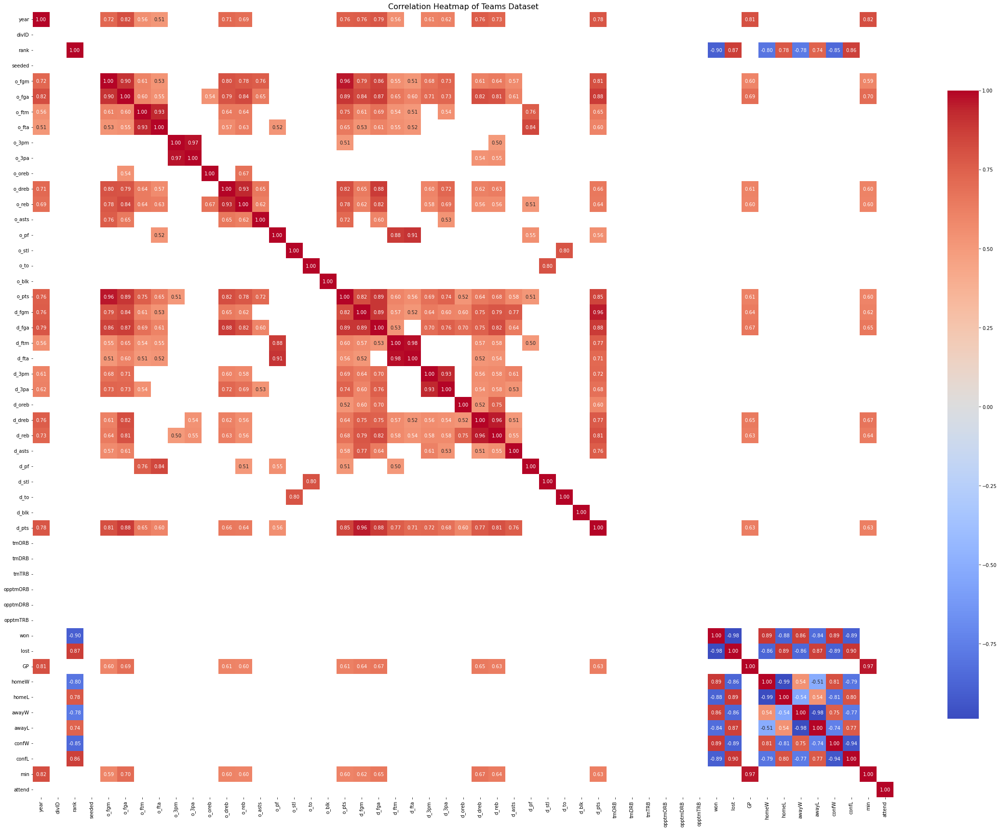

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

teams = pd.read_csv('../dataset/teams.csv')

# Correlation Heatmap
numeric_cols = teams.select_dtypes(include=['float64', 'int64']).columns

correlation_matrix = teams[numeric_cols].corr()

mask = abs(correlation_matrix) < 0.5

plt.figure(figsize=(40, 30))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', mask=mask, cbar_kws={"shrink": .8})
plt.title('Correlation Heatmap of Teams Dataset', fontsize=16)
plt.show()


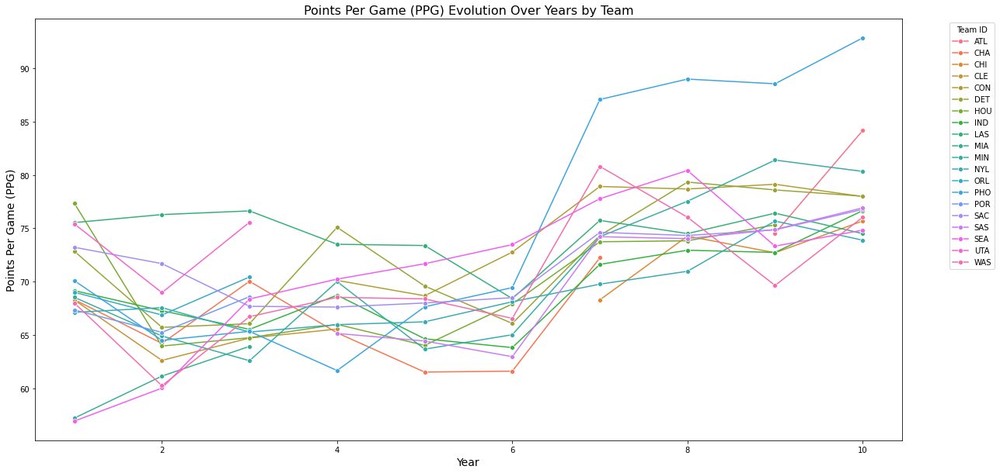

In [3]:
# Analyze Points Per Game (PPG) Evolution Over Years by Team
teams['ppg'] = teams['o_pts'] / teams['GP']

ppg_evolution = teams.groupby(['tmID', 'year'])['ppg'].mean().reset_index()

plt.figure(figsize=(20, 10))
sns.lineplot(data=ppg_evolution, x='year', y='ppg', hue='tmID', marker='o')
plt.title('Points Per Game (PPG) Evolution Over Years by Team', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Points Per Game (PPG)', fontsize=14)
plt.legend(title='Team ID', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


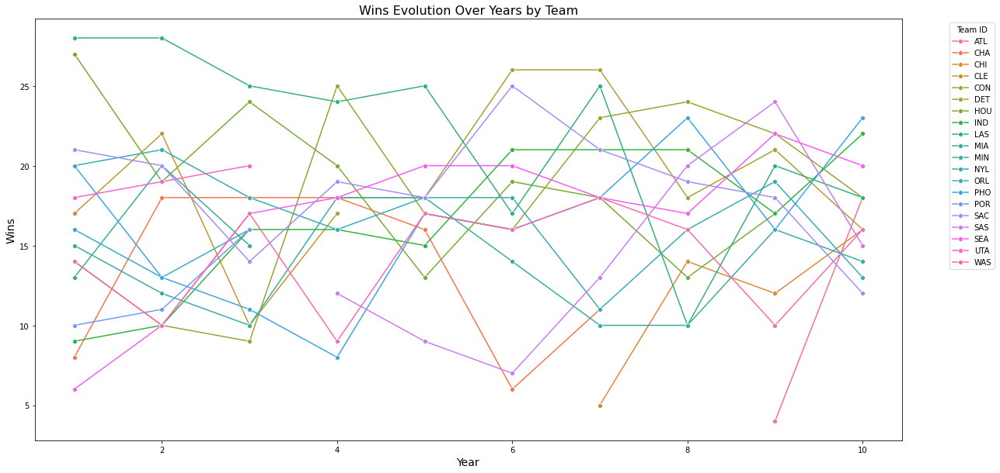

In [4]:
# Analyze Wins Evolution Over Years by Team
wins_evolution = teams.groupby(['tmID', 'year'])['won'].mean().reset_index()

plt.figure(figsize=(20, 10))
sns.lineplot(data=wins_evolution, x='year', y='won', hue='tmID', marker='o')
plt.title('Wins Evolution Over Years by Team', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Wins', fontsize=14)
plt.legend(title='Team ID', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


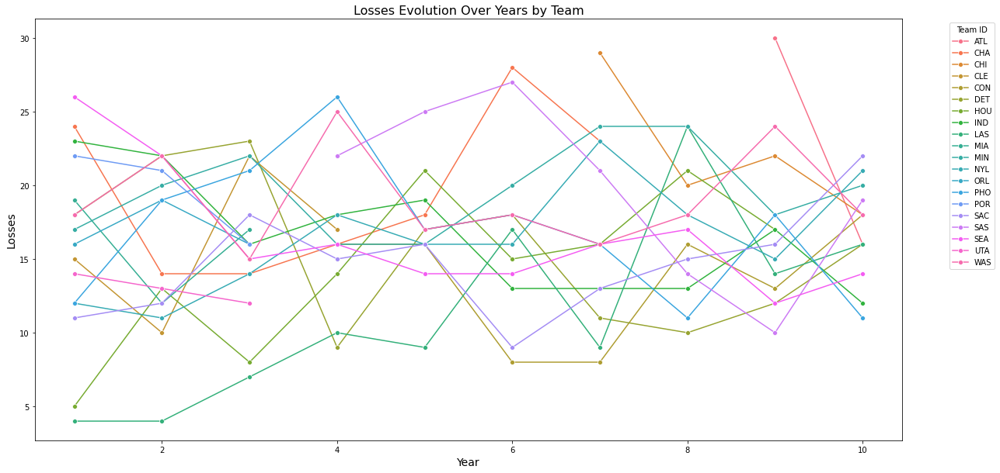

In [5]:
# Analyze Losses Evolution Over Years by Team
loss_evolution = teams.groupby(['tmID', 'year'])['lost'].mean().reset_index()

plt.figure(figsize=(20, 10))
sns.lineplot(data=loss_evolution, x='year', y='lost', hue='tmID', marker='o')
plt.title('Losses Evolution Over Years by Team', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Losses', fontsize=14)
plt.legend(title='Team ID', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


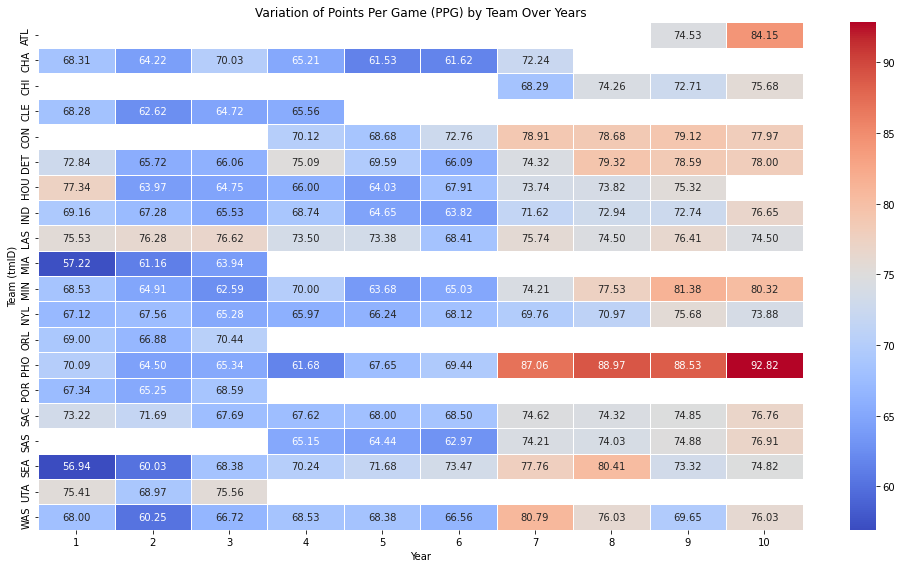

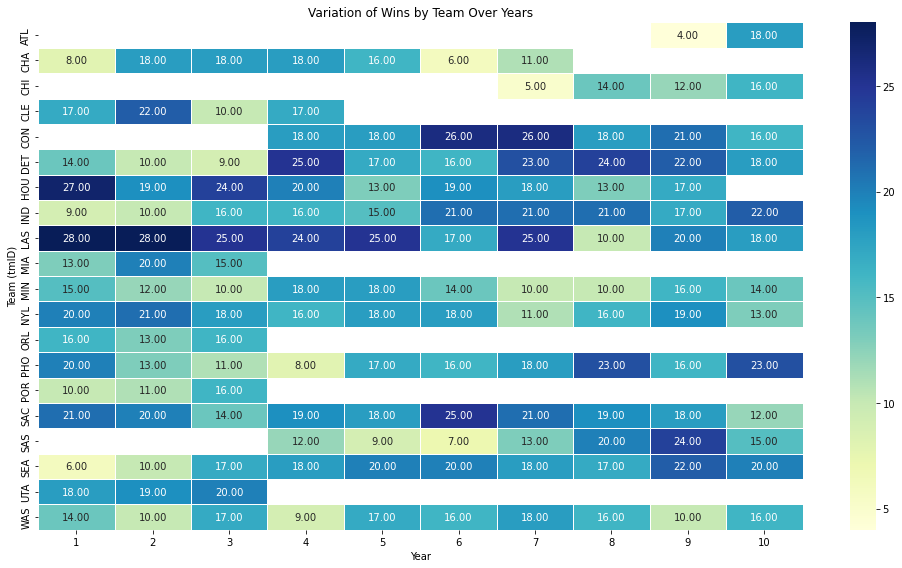

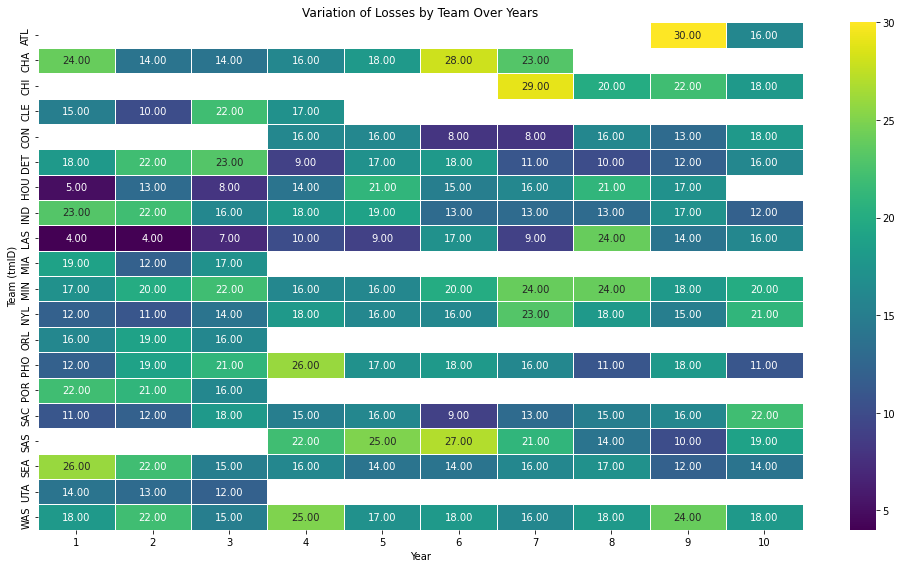

In [6]:
performance_by_year = teams.groupby(['tmID', 'year'])[['won', 'lost', 'ppg']].mean().reset_index()

# Heatmap for PPG
performance_pivot = performance_by_year.pivot(index='tmID', columns='year', values='ppg')
plt.figure(figsize=(14, 8))
sns.heatmap(performance_pivot, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Variation of Points Per Game (PPG) by Team Over Years")
plt.xlabel("Year")
plt.ylabel("Team (tmID)")
plt.tight_layout()
plt.show()

# Heatmap for Wins
performance_pivot = performance_by_year.pivot(index='tmID', columns='year', values='won')
plt.figure(figsize=(14, 8))
sns.heatmap(performance_pivot, annot=True, cmap="YlGnBu", fmt=".2f", linewidths=0.5)
plt.title("Variation of Wins by Team Over Years")
plt.xlabel("Year")
plt.ylabel("Team (tmID)")
plt.tight_layout()
plt.show()

# Heatmap for Losses
performance_pivot = performance_by_year.pivot(index='tmID', columns='year', values='lost')
plt.figure(figsize=(14, 8))
sns.heatmap(performance_pivot, annot=True, cmap="viridis", fmt=".2f", linewidths=0.5)
plt.title("Variation of Losses by Team Over Years")
plt.xlabel("Year")
plt.ylabel("Team (tmID)")
plt.tight_layout()
plt.show()


In [7]:
# Descriptive Statistics
descriptive_stats = teams.describe()

print(descriptive_stats)


             year  divID        rank  seeded        o_fgm        o_fga  \
count  142.000000    0.0  142.000000   142.0   142.000000   142.000000   
mean     5.302817    NaN    4.084507     0.0   860.387324  2039.683099   
std      2.917274    NaN    2.095226     0.0    86.998969   176.879707   
min      1.000000    NaN    1.000000     0.0   647.000000  1740.000000   
25%      3.000000    NaN    2.000000     0.0   794.500000  1908.500000   
50%      5.000000    NaN    4.000000     0.0   864.000000  2025.000000   
75%      8.000000    NaN    6.000000     0.0   915.000000  2177.500000   
max     10.000000    NaN    8.000000     0.0  1128.000000  2485.000000   

            o_ftm       o_fta       o_3pm       o_3pa  ...          GP  \
count  142.000000  142.000000  142.000000  142.000000  ...  142.000000   
mean   488.338028  651.366197  157.161972  463.014085  ...   33.323944   
std     70.749372   86.035246   43.736580  116.166119  ...    0.949425   
min    333.000000  469.000000   62.00

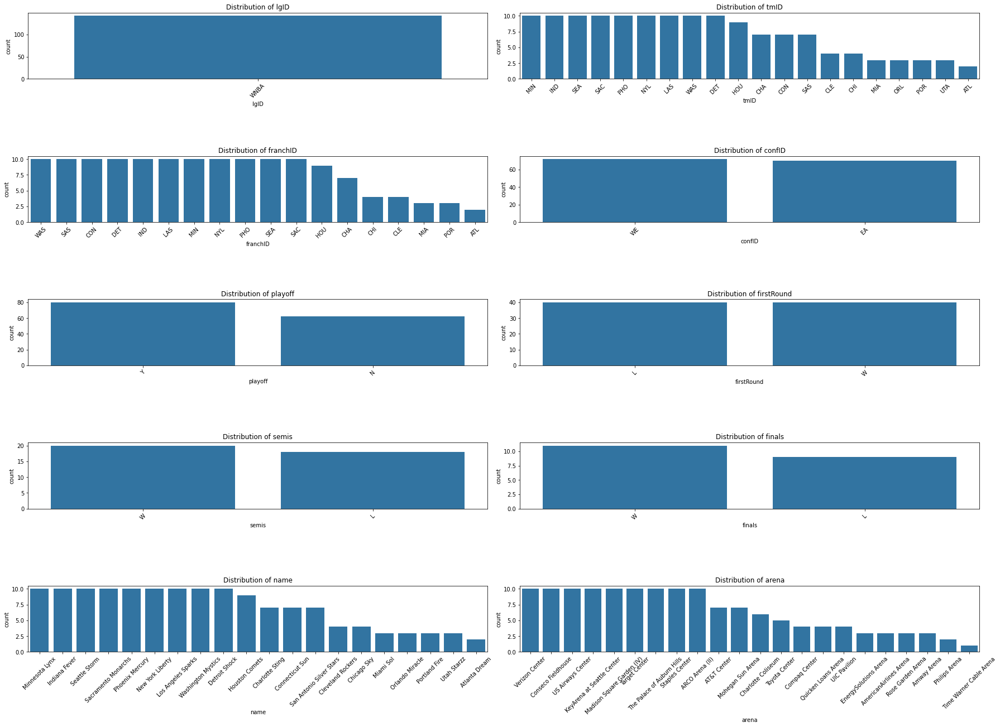

In [8]:
# Categorical Variable Distribution
categorical_columns = teams.select_dtypes(include=['object']).columns

plt.figure(figsize=(25, 20))
for i, col in enumerate(categorical_columns, 1):    
    plt.subplot(6, 2, i)
    sns.countplot(data=teams, x=col, order=teams[col].value_counts().index)
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


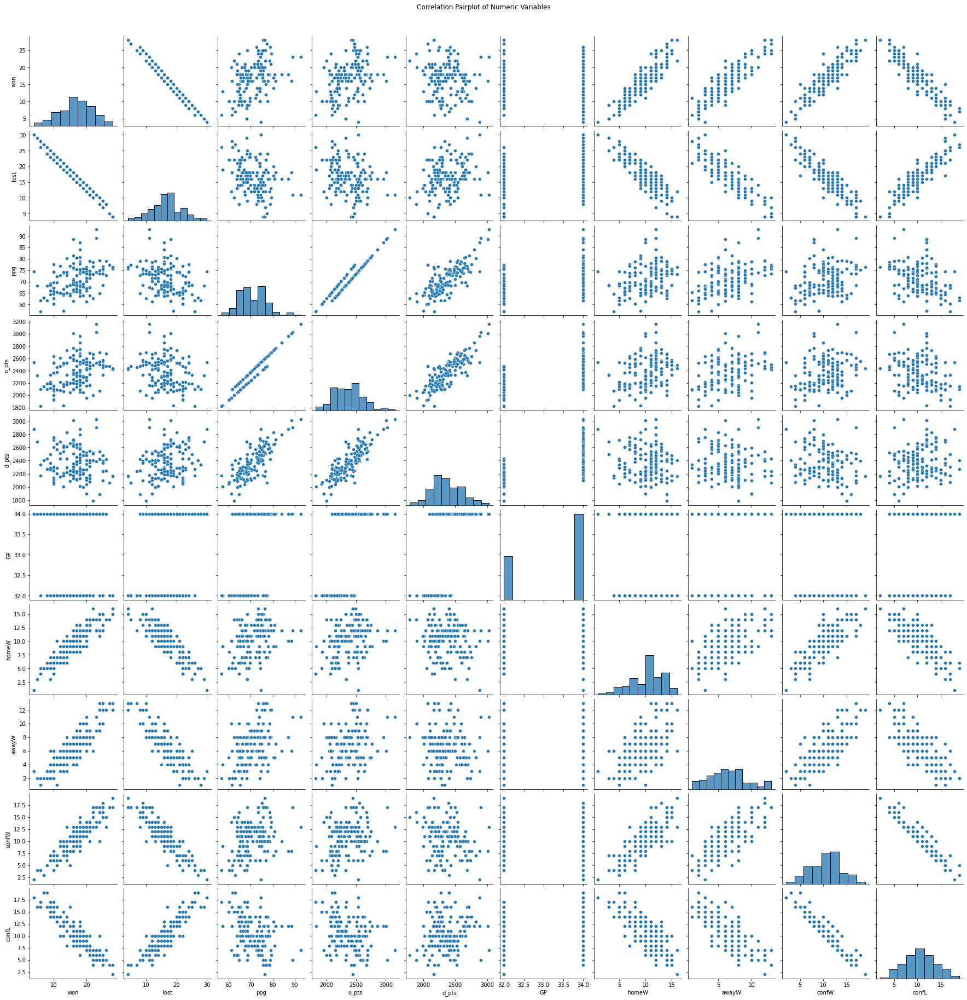

In [9]:
numeric_cols = ['won', 'lost', 'ppg', 'o_pts', 'd_pts', 'GP', 'homeW', 'awayW', 'confW', 'confL']

correlation_matrix = teams[numeric_cols].corr()

# Correlation Pairplot to explore relationships between variables
sns.pairplot(teams[numeric_cols])
plt.suptitle('Correlation Pairplot of Numeric Variables', y=1.02)
plt.show()


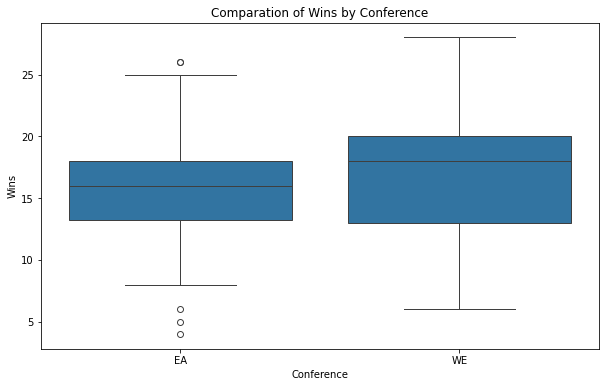

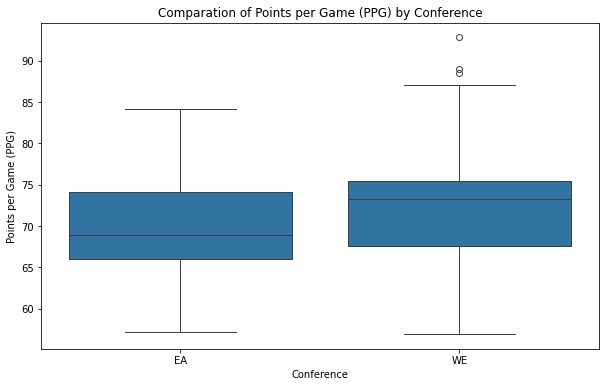

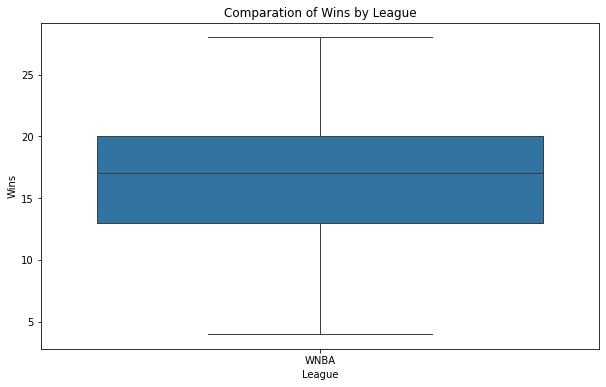

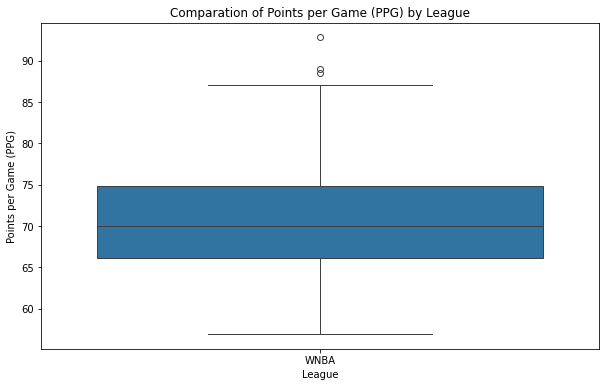

In [10]:
# Boxplot for comparing wins between conferences - example with 'confID' (Conference)
plt.figure(figsize=(10, 6))
sns.boxplot(x='confID', y='won', data=teams)
plt.title('Comparation of Wins by Conference')
plt.xlabel('Conference')
plt.ylabel('Wins')
plt.show()

# Boxplot for comparing points per game (ppg) between conferences (confID)
plt.figure(figsize=(10, 6))
sns.boxplot(x='confID', y='ppg', data=teams)
plt.title('Comparation of Points per Game (PPG) by Conference')
plt.xlabel('Conference')
plt.ylabel('Points per Game (PPG)')
plt.show()

# Boxplot for comparing wins between leagues (lgID)
plt.figure(figsize=(10, 6))
sns.boxplot(x='lgID', y='won', data=teams)
plt.title('Comparation of Wins by League')
plt.xlabel('League')
plt.ylabel('Wins')
plt.show()

# Boxplot for comparing points per game (ppg) between leagues (lgID)
plt.figure(figsize=(10, 6))
sns.boxplot(x='lgID', y='ppg', data=teams)
plt.title('Comparation of Points per Game (PPG) by League')
plt.xlabel('League')
plt.ylabel('Points per Game (PPG)')
plt.show()

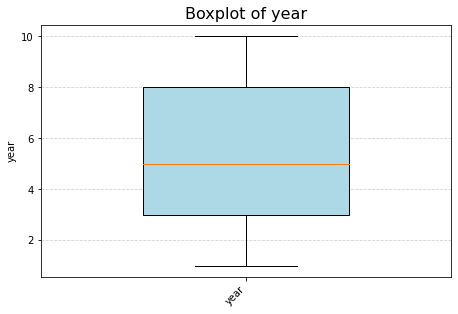

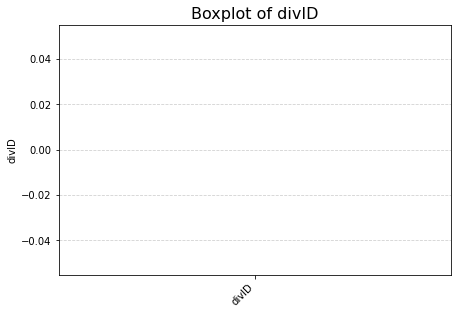

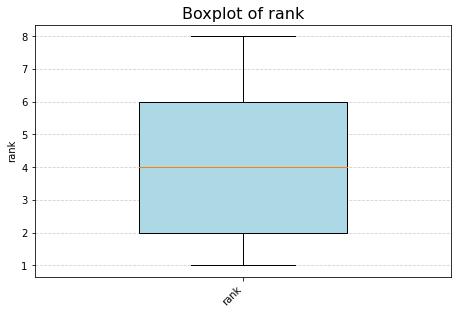

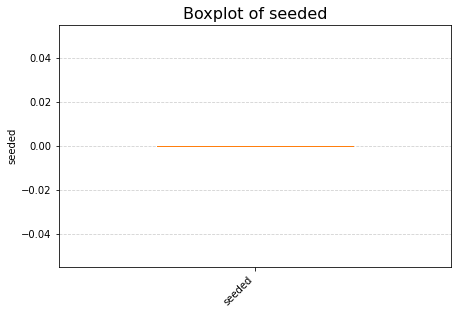

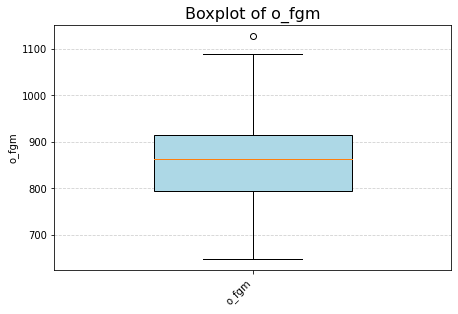

...

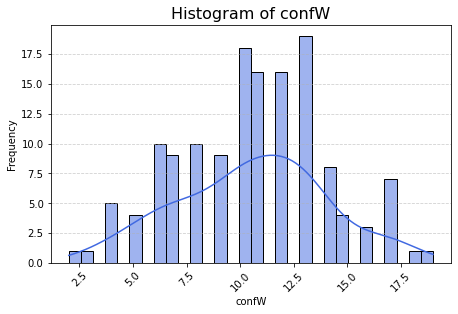

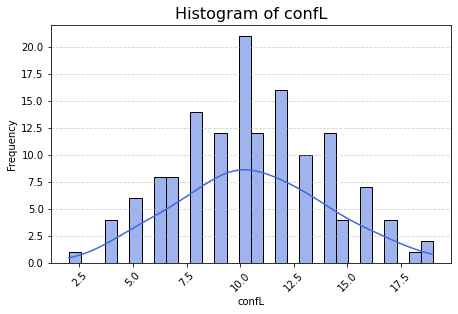

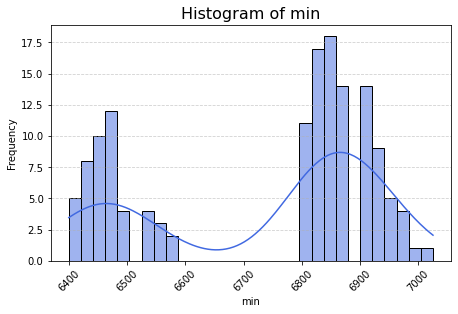

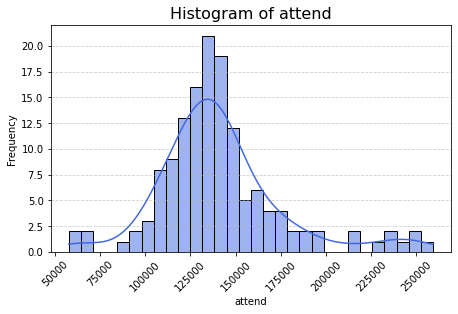

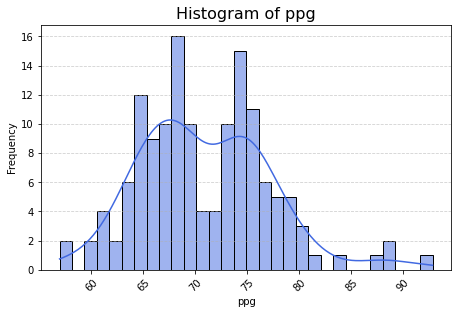

Number of outliers for each numeric variable:
{'year': 0, 'divID': 0, 'rank': 0, 'seeded': 0, 'o_fgm': 1, 'o_fga': 0, 'o_ftm': 0, 'o_fta': 0, 'o_3pm': 2, 'o_3pa': 2, 'o_oreb': 1, 'o_dreb': 0, 'o_reb': 0, 'o_asts': 1, 'o_pf': 2, 'o_stl': 2, 'o_to': 0, 'o_blk': 1, 'o_pts': 1, 'd_fgm': 1, 'd_fga': 0, 'd_ftm': 2, 'd_fta': 2, 'd_3pm': 2, 'd_3pa': 2, 'd_oreb': 3, 'd_dreb': 0, 'd_reb': 1, 'd_asts': 4, 'd_pf': 0, 'd_stl': 2, 'd_to': 0, 'd_blk': 1, 'd_pts': 1, 'tmORB': 0, 'tmDRB': 0, 'tmTRB': 0, 'opptmORB': 0, 'opptmDRB': 0, 'opptmTRB': 0, 'won': 0, 'lost': 3, 'GP': 0, 'homeW': 1, 'homeL': 3, 'awayW': 4, 'awayL': 5, 'confW': 0, 'confL': 0, 'min': 0, 'attend': 14, 'ppg': 3}


In [11]:
numeric_cols = teams.select_dtypes(include=['float64', 'int64']).columns

# Boxplot to identify outliers in numeric variables (one figure per variable)
for col in numeric_cols:
    plt.figure(figsize=(7, 5))
    data_clean = teams[col].dropna()
    plt.boxplot(data_clean, widths=0.5, patch_artist=True, boxprops=dict(facecolor='lightblue'))
    plt.title(f'Boxplot of {col}', fontsize=16)
    plt.xticks([1], [col], rotation=45, ha='right')
    plt.ylabel(col)
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout(pad=3.0)
    plt.show()

# Histograms to see the distribution of numeric variables (one figure per variable)
for col in numeric_cols:
    plt.figure(figsize=(7, 5))
    sns.histplot(teams[col], kde=True, color='royalblue', bins=30)
    plt.title(f'Histogram of {col}', fontsize=16)
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout(pad=3.0)
    plt.show()

# Outlier detection based on IQR (Interquartile Range)
def detect_outliers(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[col] < lower_bound) | (df[col] > upper_bound)]

outliers = {}
for col in numeric_cols:
    outliers[col] = detect_outliers(teams, col)
outliers_summary = {col: len(outliers[col]) for col in outliers}
print("Number of outliers for each numeric variable:")
print(outliers_summary)


Missing values analysis:
               Missing Values  Percentage (%)
year                        0             0.0
lgID                        0             0.0
tmID                        0             0.0
franchID                    0             0.0
confID                      0             0.0
...                       ...             ...
min                         0             0.0
attend                      0             0.0
arena                       0             0.0
ppg                         0             0.0
fg_percentage               0             0.0

[63 rows x 2 columns]

Duplicates check: 0

Data consistency checks: 0 inconsistencies found.

Missing years in dataset: set()

Number of teams per year:
year
1     16
2     16
3     16
4     14
5     13
6     13
7     14
8     13
9     14
10    13
Name: tmID, dtype: int64

Teams with incomplete temporal data:
tmID
ATL    2
CHA    7
CHI    4
CLE    4
CON    7
HOU    9
MIA    3
ORL    3
POR    3
SAS    7
UTA    3
Name: 

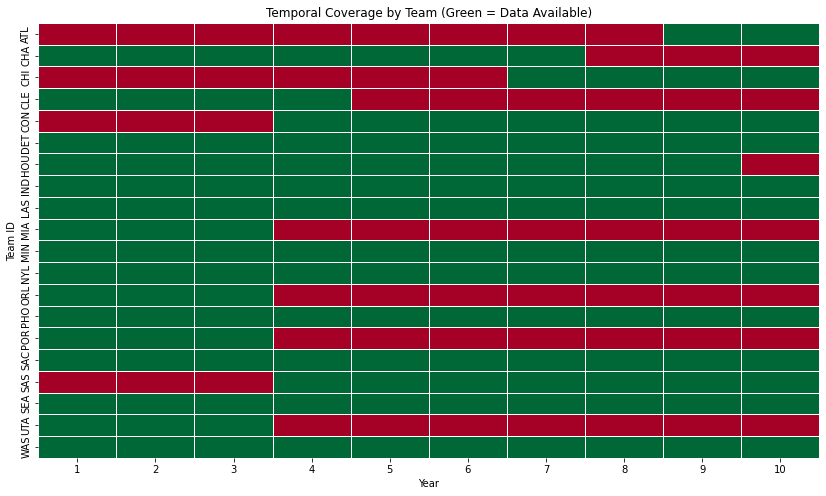

Invalid field goal percentages: 0
Rows where homeW + awayW != won: 0
Invalid rank values: 0

Attendance statistics:
count     142.000000
mean     4239.640353
std      1078.624730
min      1695.147059
25%      3658.345588
50%      4062.808824
75%      4541.786765
max      8101.156250
Name: avg_attendance_per_game, dtype: float64


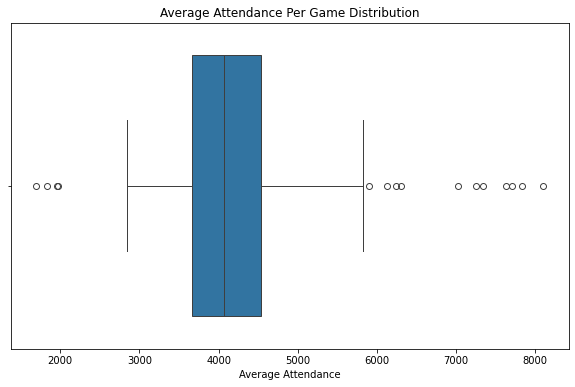

In [ ]:
# Missing values analysis
missing_data = teams.isnull().sum()
missing_percentage = (missing_data / len(teams)) * 100

print("Missing values analysis:")
print(pd.DataFrame({'Missing Values': missing_data, 'Percentage (%)': missing_percentage}))

# Duplicates check
duplicates = teams.duplicated().sum()
print(f"\nDuplicates check: {duplicates}")

# Data consistency checks
# Ex: won + lost should equal GP
consistency_check = teams[teams['won'] + teams['lost'] != teams['GP']]
print(f"\nData consistency checks: {len(consistency_check)} inconsistencies found.")

# Check for missing years in the dataset
years_range = range(teams['year'].min(), teams['year'].max() + 1)
missing_years = set(years_range) - set(teams['year'].unique())
print(f"\nMissing years in dataset: {missing_years}")

# Number of teams per year
teams_per_year = teams.groupby('year')['tmID'].nunique()
print("\nNumber of teams per year:")
print(teams_per_year)

# Check for teams with incomplete temporal data
team_year_counts = teams.groupby('tmID')['year'].count()
print("\nTeams with incomplete temporal data:")
print(team_year_counts[team_year_counts < team_year_counts.max()])

# Visualize temporal coverage of teams
plt.figure(figsize=(14, 8))
pivot_coverage = teams.pivot_table(index='tmID', columns='year', values='won', aggfunc='count')
sns.heatmap(pivot_coverage.notna(), cmap='RdYlGn', cbar=False, linewidths=0.5)
plt.title('Temporal Coverage by Team (Green = Data Available)')
plt.xlabel('Year')
plt.ylabel('Team ID')
plt.show()

# Check for invalid field goal percentages
teams['fg_percentage'] = teams['o_fgm'] / teams['o_fga']
invalid_fg = teams[(teams['fg_percentage'] < 0) | (teams['fg_percentage'] > 1)]
print(f"Invalid field goal percentages: {len(invalid_fg)}")

# Check for inconsistencies in home and away wins
invalid_wins = teams[teams['homeW'] + teams['awayW'] != teams['won']]
print(f"Rows where homeW + awayW != won: {len(invalid_wins)}")

# Check for negative values in numeric columns where negatives are not logical
negative_cols = ['won', 'lost', 'GP', 'o_pts', 'd_pts', 'homeW', 'awayW']
for col in negative_cols:
    negative_count = (teams[col] < 0).sum()
    if negative_count > 0:
        print(f"Negative values in {col}: {negative_count}")

# Check for rank values outside expected range (1 to number of teams per year)
max_rank = teams.groupby('year')['tmID'].nunique().max()
invalid_rank = teams[(teams['rank'] < 1) | (teams['rank'] > max_rank)]
print(f"Invalid rank values: {len(invalid_rank)}")

# Attendance analysis
teams['avg_attendance_per_game'] = teams['attend'] / teams['GP']
print("\nAttendance statistics:")
print(teams['avg_attendance_per_game'].describe())

# Boxplot for average attendance per game
plt.figure(figsize=(10, 6))
sns.boxplot(x=teams['avg_attendance_per_game'])
plt.title('Average Attendance Per Game Distribution')
plt.xlabel('Average Attendance')
plt.show()


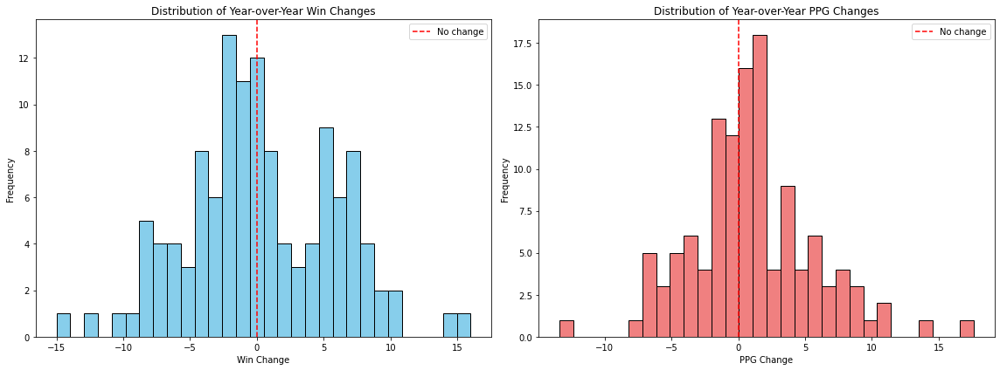

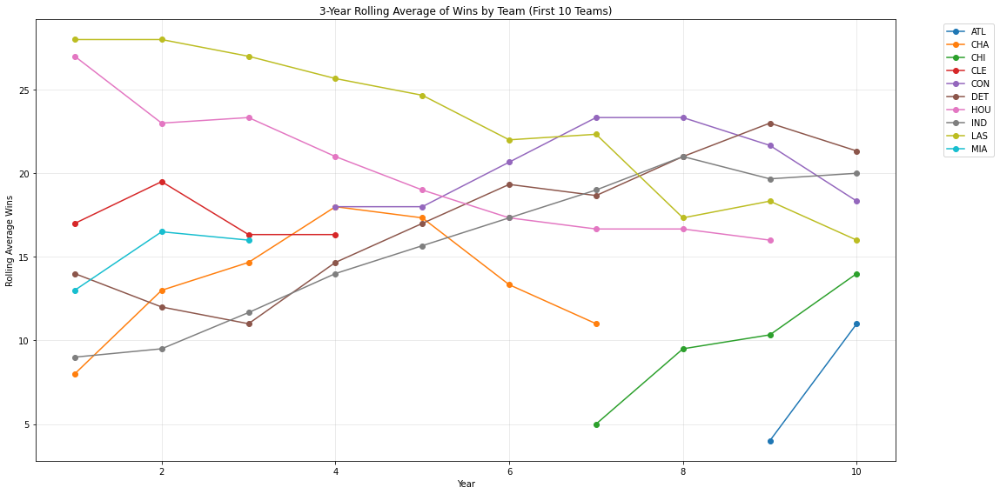

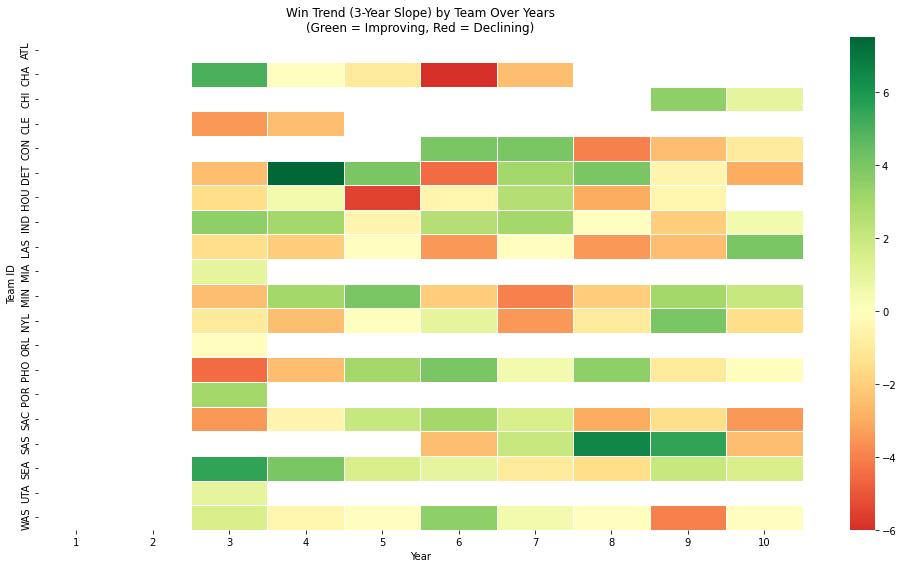


Correlation between current wins and past wins:
Lag 1 years: 0.408
Lag 2 years: 0.297
Lag 3 years: 0.147


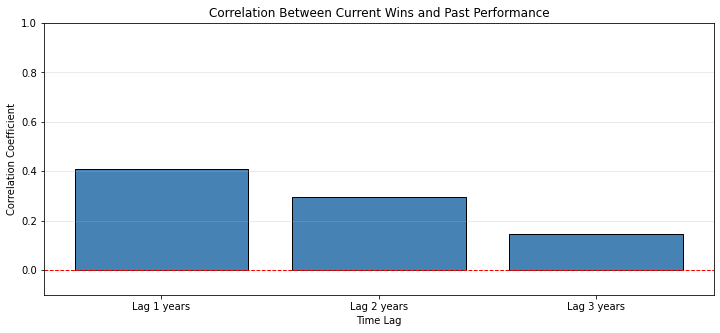

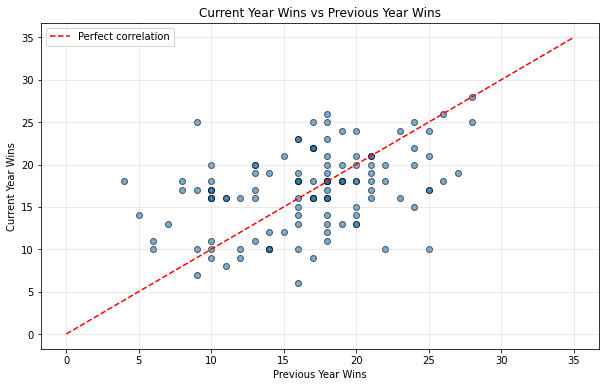

In [ ]:
# Calculate year-over-year changes
teams_sorted = teams.sort_values(['tmID', 'year'])

# Win change year-over-year
teams_sorted['prev_year_wins'] = teams_sorted.groupby('tmID')['won'].shift(1)
teams_sorted['win_change'] = teams_sorted['won'] - teams_sorted['prev_year_wins']

# PPG change year-over-year
teams_sorted['prev_year_ppg'] = teams_sorted.groupby('tmID')['ppg'].shift(1)
teams_sorted['ppg_change'] = teams_sorted['ppg'] - teams_sorted['prev_year_ppg']

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

axes[0].hist(teams_sorted['win_change'].dropna(), bins=30, edgecolor='black', color='skyblue')
axes[0].set_title('Distribution of Year-over-Year Win Changes')
axes[0].set_xlabel('Win Change')
axes[0].set_ylabel('Frequency')
axes[0].axvline(0, color='red', linestyle='--', label='No change')
axes[0].legend()

axes[1].hist(teams_sorted['ppg_change'].dropna(), bins=30, edgecolor='black', color='lightcoral')
axes[1].set_title('Distribution of Year-over-Year PPG Changes')
axes[1].set_xlabel('PPG Change')
axes[1].set_ylabel('Frequency')
axes[1].axvline(0, color='red', linestyle='--', label='No change')
axes[1].legend()

plt.tight_layout()
plt.show()

# Identify teams with highest momentum (consistent improvements)
# Calculate rolling average of wins (3 years)
teams_sorted['rolling_wins_3y'] = teams_sorted.groupby('tmID')['won'].transform(
    lambda x: x.rolling(window=3, min_periods=1).mean()
)

# Calculate trend (slope) of last 3 years for each team
def calculate_trend(group):
    if len(group) < 3:
        return np.nan
    x = np.arange(len(group))
    y = group.values
    slope, _ = np.polyfit(x, y, 1)
    return slope

teams_sorted['win_trend_3y'] = teams_sorted.groupby('tmID')['won'].transform(
    lambda x: x.rolling(window=3).apply(calculate_trend, raw=False)
)

plt.figure(figsize=(16, 8))
for team in teams_sorted['tmID'].unique()[:10]:
    team_data = teams_sorted[teams_sorted['tmID'] == team]
    plt.plot(team_data['year'], team_data['rolling_wins_3y'], marker='o', label=team)

plt.title('3-Year Rolling Average of Wins by Team (First 10 Teams)')
plt.xlabel('Year')
plt.ylabel('Rolling Average Wins')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Heatmap of trends by team
trend_pivot = teams_sorted.groupby(['tmID', 'year'])['win_trend_3y'].mean().reset_index()
trend_pivot = trend_pivot.pivot(index='tmID', columns='year', values='win_trend_3y')

plt.figure(figsize=(14, 8))
sns.heatmap(trend_pivot, cmap='RdYlGn', center=0, annot=False, linewidths=0.5)
plt.title('Win Trend (3-Year Slope) by Team Over Years\n(Green = Improving, Red = Declining)')
plt.xlabel('Year')
plt.ylabel('Team ID')
plt.tight_layout()
plt.show()

# Create multiple lags
for lag in [1, 2, 3]:
    teams_sorted[f'wins_lag_{lag}'] = teams_sorted.groupby('tmID')['won'].shift(lag)
    teams_sorted[f'ppg_lag_{lag}'] = teams_sorted.groupby('tmID')['ppg'].shift(lag)

# Correlation between past and current performance
lag_correlations = {}
for lag in [1, 2, 3]:
    corr = teams_sorted[['won', f'wins_lag_{lag}']].corr().iloc[0, 1]
    lag_correlations[f'Lag {lag} years'] = corr

print("\nCorrelation between current wins and past wins:")
for lag, corr in lag_correlations.items():
    print(f"{lag}: {corr:.3f}")

plt.figure(figsize=(12, 5))
plt.bar(lag_correlations.keys(), lag_correlations.values(), color='steelblue', edgecolor='black')
plt.title('Correlation Between Current Wins and Past Performance')
plt.ylabel('Correlation Coefficient')
plt.xlabel('Time Lag')
plt.axhline(0, color='red', linestyle='--', linewidth=1)
plt.ylim(-0.1, 1)
plt.grid(axis='y', alpha=0.3)
plt.show()

# Scatter plot: wins this year vs wins last year
plt.figure(figsize=(10, 6))
plt.scatter(teams_sorted['wins_lag_1'], teams_sorted['won'], alpha=0.6, edgecolors='black')
plt.plot([0, 35], [0, 35], 'r--', label='Perfect correlation')
plt.title('Current Year Wins vs Previous Year Wins')
plt.xlabel('Previous Year Wins')
plt.ylabel('Current Year Wins')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()


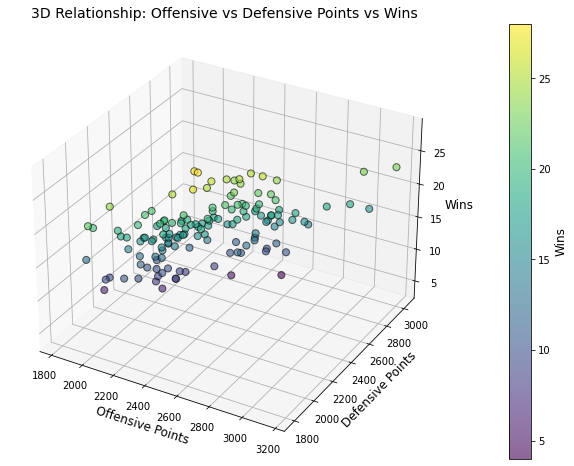

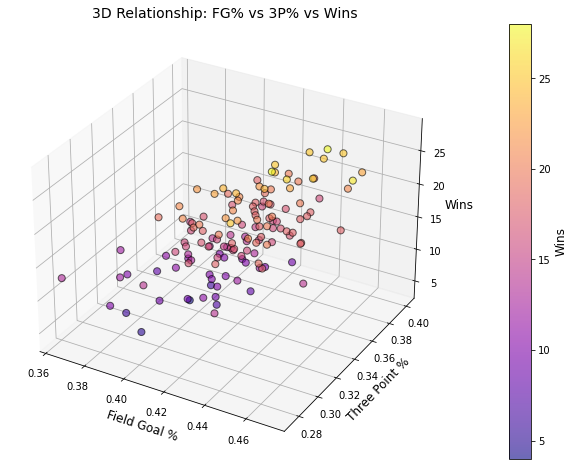

/tmp/ipykernel_49488/968006807.py:59: UserWarning: Z contains NaN values. This may result in rendering artifacts.
  surf = ax.plot_surface(O_grid, D_grid, wins_grid, cmap='coolwarm', alpha=0.8)


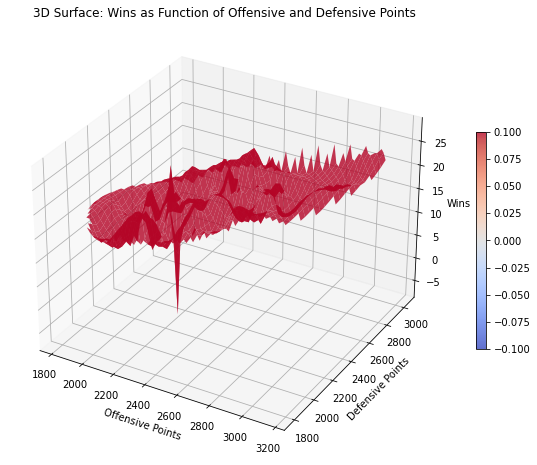


T-Test: East vs West Conference Wins
T-statistic: -1.3926
P-value: 0.1659
Significant difference: No

ANOVA: Wins across all conferences
F-statistic: 1.9393
P-value: 0.1659
Significant difference: No

Chi-Square Test: Playoff qualification vs Conference
Chi-square statistic: 0.0005
P-value: 0.9829
Degrees of freedom: 1
Significant association: No

Correlation Significance Tests:
o_pts vs won: r=0.368, p=0.0000 ***
d_pts vs won: r=-0.140, p=0.0968 ns
o_asts vs won: r=0.470, p=0.0000 ***
o_reb vs won: r=0.359, p=0.0000 ***

Normality Tests (Shapiro-Wilk):
won: W=0.9834, p=0.0841 (Normal)
ppg: W=0.9722, p=0.0054 (Not Normal)
o_pts: W=0.9805, p=0.0402 (Not Normal)
d_pts: W=0.9843, p=0.1046 (Normal)

Mann-Whitney U Test: East vs West Conference Wins
U-statistic: 2168.0000
P-value: 0.1500

Partial Correlation Analysis:
Simple correlation (o_pts vs won): 0.368
Partial correlation (o_pts vs won | d_pts): 0.928


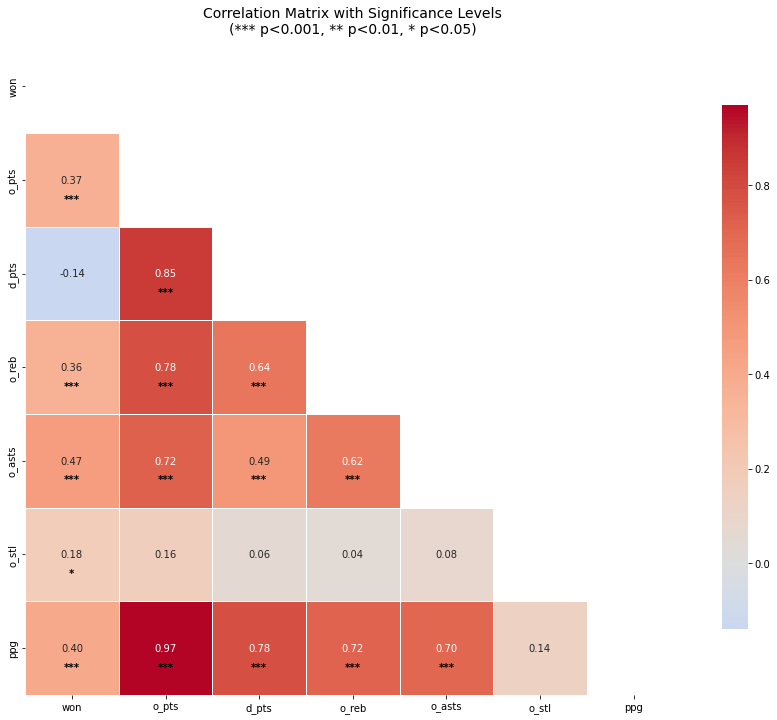

In [ ]:
from scipy import stats
from mpl_toolkits.mplot3d import Axes3D

# Scatter 3D: Offensive vs Defensive vs Wins
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(teams['o_pts'], teams['d_pts'], teams['won'], 
                     c=teams['won'], cmap='viridis', s=50, alpha=0.6, edgecolors='black')

ax.set_xlabel('Offensive Points', fontsize=12)
ax.set_ylabel('Defensive Points', fontsize=12)
ax.set_zlabel('Wins', fontsize=12)
ax.set_title('3D Relationship: Offensive vs Defensive Points vs Wins', fontsize=14)

cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label('Wins', fontsize=12)

plt.show()

# Scatter 3D: FG%, 3P%, Wins
teams['fg_pct'] = teams['o_fgm'] / teams['o_fga']
teams['three_pct'] = teams['o_3pm'] / teams['o_3pa']

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(teams['fg_pct'], teams['three_pct'], teams['won'], 
                     c=teams['won'], cmap='plasma', s=50, alpha=0.6, edgecolors='black')

ax.set_xlabel('Field Goal %', fontsize=12)
ax.set_ylabel('Three Point %', fontsize=12)
ax.set_zlabel('Wins', fontsize=12)
ax.set_title('3D Relationship: FG% vs 3P% vs Wins', fontsize=14)

cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label('Wins', fontsize=12)

plt.show()

# Surface plot: Relationship between offensive and defensive performance
from scipy.interpolate import griddata

# Create grid
o_pts_range = np.linspace(teams['o_pts'].min(), teams['o_pts'].max(), 50)
d_pts_range = np.linspace(teams['d_pts'].min(), teams['d_pts'].max(), 50)
O_grid, D_grid = np.meshgrid(o_pts_range, d_pts_range)

# Interpolate wins
wins_grid = griddata(
    (teams['o_pts'], teams['d_pts']), 
    teams['won'], 
    (O_grid, D_grid), 
    method='cubic'
)

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(O_grid, D_grid, wins_grid, cmap='coolwarm', alpha=0.8)

ax.set_xlabel('Offensive Points')
ax.set_ylabel('Defensive Points')
ax.set_zlabel('Wins')
ax.set_title('3D Surface: Wins as Function of Offensive and Defensive Points')

plt.colorbar(surf, ax=ax, shrink=0.5)
plt.show()

# T-TEST: Compare wins between conferences
conf_east = teams[teams['confID'] == 'EA']['won']
conf_west = teams[teams['confID'] == 'WE']['won']

t_stat, p_value = stats.ttest_ind(conf_east, conf_west, nan_policy='omit')
print(f"\nT-Test: East vs West Conference Wins")
print(f"T-statistic: {t_stat:.4f}")
print(f"P-value: {p_value:.4f}")
print(f"Significant difference: {'Yes' if p_value < 0.05 else 'No'}")

# ANOVA: Compare wins between multiple conferences
conferences = teams['confID'].unique()
conf_groups = [teams[teams['confID'] == conf]['won'].dropna() for conf in conferences]

f_stat, p_value_anova = stats.f_oneway(*conf_groups)
print(f"\nANOVA: Wins across all conferences")
print(f"F-statistic: {f_stat:.4f}")
print(f"P-value: {p_value_anova:.4f}")
print(f"Significant difference: {'Yes' if p_value_anova < 0.05 else 'No'}")

# CHI-SQUARE: Relation between making playoffs and conference
contingency_table = pd.crosstab(teams['confID'], teams['playoff'])
chi2, p_value_chi, dof, expected = stats.chi2_contingency(contingency_table)

print(f"\nChi-Square Test: Playoff qualification vs Conference")
print(f"Chi-square statistic: {chi2:.4f}")
print(f"P-value: {p_value_chi:.4f}")
print(f"Degrees of freedom: {dof}")
print(f"Significant association: {'Yes' if p_value_chi < 0.05 else 'No'}")

# CORRELATION TEST: Test significance of correlations
correlations_to_test = [
    ('o_pts', 'won'),
    ('d_pts', 'won'),
    ('o_asts', 'won'),
    ('o_reb', 'won')
]

print("\nCorrelation Significance Tests:")
for var1, var2 in correlations_to_test:
    corr, p_value = stats.pearsonr(teams[var1].dropna(), teams[var2].dropna())
    print(f"{var1} vs {var2}: r={corr:.3f}, p={p_value:.4f} {'***' if p_value < 0.001 else '**' if p_value < 0.01 else '*' if p_value < 0.05 else 'ns'}")

# NORMALITY TEST: Verify if variables are normally distributed
print("\nNormality Tests (Shapiro-Wilk):")
for col in ['won', 'ppg', 'o_pts', 'd_pts']:
    stat, p_value = stats.shapiro(teams[col].dropna())
    print(f"{col}: W={stat:.4f}, p={p_value:.4f} {'(Normal)' if p_value > 0.05 else '(Not Normal)'}")

# MANN-WHITNEY U TEST: Non-parametric test between two conferences
u_stat, p_value_u = stats.mannwhitneyu(conf_east, conf_west, alternative='two-sided')
print(f"\nMann-Whitney U Test: East vs West Conference Wins")
print(f"U-statistic: {u_stat:.4f}")
print(f"P-value: {p_value_u:.4f}")

# Partial correlation: Correlation between A and B controlling for C
from scipy.stats import pearsonr

def partial_correlation(data, x, y, z):
    """Calculate partial correlation between x and y controlling for z"""
    # Simple correlations
    rxy = data[[x, y]].corr().iloc[0, 1]
    rxz = data[[x, z]].corr().iloc[0, 1]
    ryz = data[[y, z]].corr().iloc[0, 1]
    
    # Partial correlation formula
    rxy_z = (rxy - rxz * ryz) / (np.sqrt(1 - rxz**2) * np.sqrt(1 - ryz**2))
    return rxy_z

# Correlation between offensive points and wins, controlling for defensive points
partial_corr = partial_correlation(teams, 'o_pts', 'won', 'd_pts')
simple_corr = teams[['o_pts', 'won']].corr().iloc[0, 1]

print(f"\nPartial Correlation Analysis:")
print(f"Simple correlation (o_pts vs won): {simple_corr:.3f}")
print(f"Partial correlation (o_pts vs won | d_pts): {partial_corr:.3f}")

# Correlation matrix with significance
def correlation_matrix_with_pvalues(df, cols):
    """Create correlation matrix with p-values"""
    n = len(cols)
    corr_matrix = np.zeros((n, n))
    p_matrix = np.zeros((n, n))
    
    for i, col1 in enumerate(cols):
        for j, col2 in enumerate(cols):
            if i == j:
                corr_matrix[i, j] = 1.0
                p_matrix[i, j] = 0.0
            else:
                corr, p_val = pearsonr(df[col1].dropna(), df[col2].dropna())
                corr_matrix[i, j] = corr
                p_matrix[i, j] = p_val
    
    return pd.DataFrame(corr_matrix, index=cols, columns=cols), \
           pd.DataFrame(p_matrix, index=cols, columns=cols)

key_vars = ['won', 'o_pts', 'd_pts', 'o_reb', 'o_asts', 'o_stl', 'ppg']
corr_df, pval_df = correlation_matrix_with_pvalues(teams, key_vars)

fig, ax = plt.subplots(figsize=(12, 10))
mask = np.triu(np.ones_like(corr_df, dtype=bool))

sns.heatmap(corr_df, mask=mask, annot=True, fmt='.2f', cmap='coolwarm', 
            center=0, square=True, linewidths=1, cbar_kws={"shrink": 0.8}, ax=ax)

# Add significance stars
for i in range(len(key_vars)):
    for j in range(len(key_vars)):
        if i > j:  # Only lower triangle
            p = pval_df.iloc[i, j]
            text = ax.text(j + 0.5, i + 0.7, 
                          '***' if p < 0.001 else '**' if p < 0.01 else '*' if p < 0.05 else '',
                          ha="center", va="center", color="black", fontsize=10, fontweight='bold')

plt.title('Correlation Matrix with Significance Levels\n(*** p<0.001, ** p<0.01, * p<0.05)', 
          fontsize=14)
plt.tight_layout()
plt.show()


## Data Analysis `teams_post.csv`

=== COMPLETENESS ===

Missing values:
      Missing Count  Percentage
year              0         0.0
tmID              0         0.0
lgID              0         0.0
W                 0         0.0
L                 0         0.0


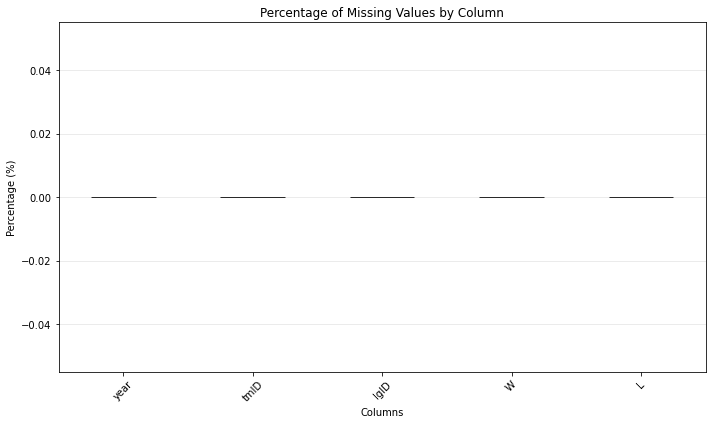


=== UNIQUENESS ===
Total duplicate rows: 0

Duplicate rows details:
Empty DataFrame
Columns: [year, tmID, lgID, W, L]
Index: []

Duplicate year-team combinations: 0

Distribution of total playoff games (W+L):
2     18
3     22
4      3
5      9
6     10
7      2
8      7
9      5
10     2
11     2
Name: total_games, dtype: int64

Teams in playoffs but not in regular season: set()

Number of teams in playoffs per year:
year
1     8
2     8
3     8
4     8
5     8
6     8
7     8
8     8
9     8
10    8
Name: tmID, dtype: int64

=== ACCURACY - Outliers ===

W:
  Outliers: 5
  Range: [-2.38, 6.62]
  Outlier values: [7 7 7 7 7]

L:
  Outliers: 4
  Range: [0.50, 4.50]
  Outlier values: [0 0 5 5]

total_games:
  Outliers: 2
  Range: [-1.50, 10.50]
  Outlier values: [11 11]


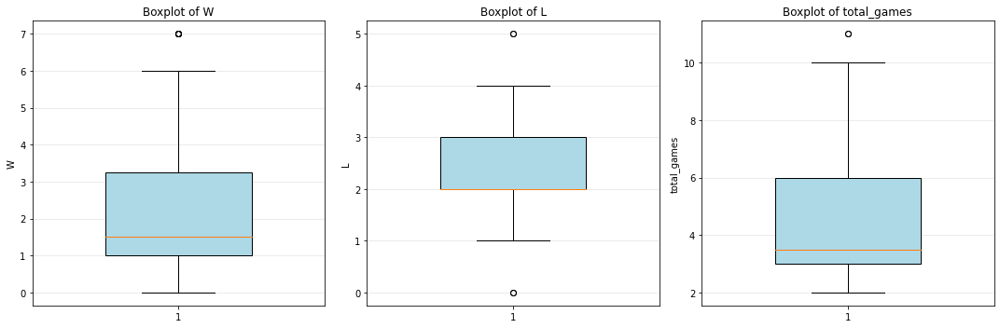

Missing years in dataset: None

Number of playoff appearances per team:
tmID
LAS    9
SAC    8
DET    7
NYL    7
SEA    7
CON    6
HOU    6
IND    6
WAS    5
SAS    3
CLE    3
CHA    3
PHO    3
UTA    2
MIN    2
ORL    1
MIA    1
ATL    1
Name: year, dtype: int64


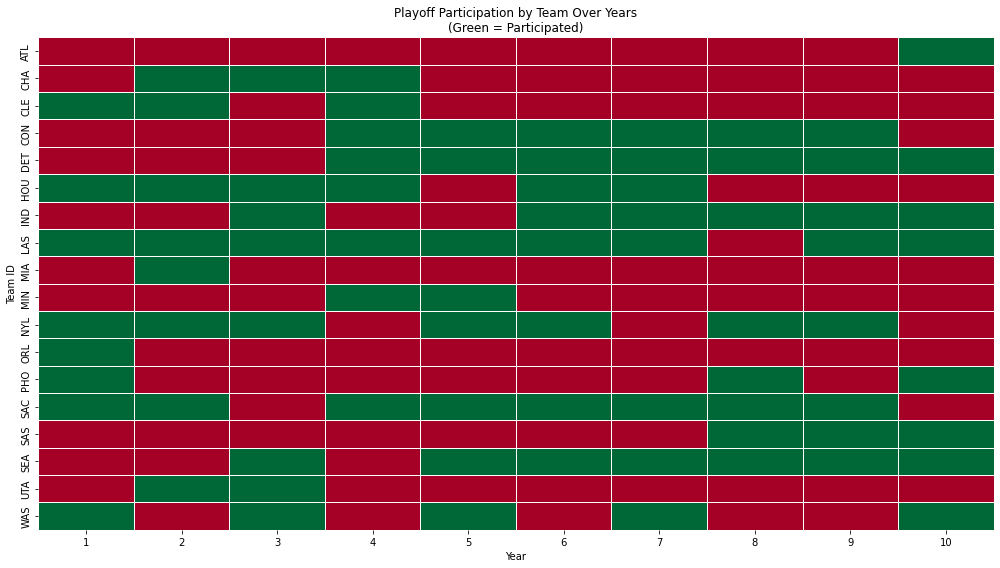


=== VALIDITY ===
No negative values in W
No negative values in L


In [33]:
# Data Quality

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats

teams_post = pd.read_csv('../dataset/teams_post.csv')

# Missing values analysis
missing_data = teams_post.isnull().sum()
missing_percentage = (missing_data / len(teams_post)) * 100

print("=== COMPLETENESS ===")
print("\nMissing values:")
print(pd.DataFrame({
    'Missing Count': missing_data,
    'Percentage': missing_percentage
}))

# Visualize missing values percentage
plt.figure(figsize=(10, 6))
missing_percentage[missing_percentage >= 0].plot(kind='bar', color='coral', edgecolor='black')
plt.title('Percentage of Missing Values by Column')
plt.ylabel('Percentage (%)')
plt.xlabel('Columns')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Duplicates analysis
duplicates = teams_post.duplicated().sum()
duplicate_rows = teams_post[teams_post.duplicated(keep=False)]

print("\n=== UNIQUENESS ===")
print(f"Total duplicate rows: {duplicates}")
print(f"\nDuplicate rows details:")
print(duplicate_rows)

# Verify duplicate keys based on 'year' and 'tmID'
duplicate_keys = teams_post.duplicated(subset=['year', 'tmID']).sum()
print(f"\nDuplicate year-team combinations: {duplicate_keys}")

# Verify if W + L makes sense (playoffs have a specific structure)
teams_post['total_games'] = teams_post['W'] + teams_post['L']
print("\nDistribution of total playoff games (W+L):")
print(teams_post['total_games'].value_counts().sort_index())

# Verify if teams in teams_post also exist in teams.csv
teams_in_playoffs = set(teams_post['tmID'].unique())
teams_in_regular = set(teams['tmID'].unique())
teams_only_playoffs = teams_in_playoffs - teams_in_regular
print(f"\nTeams in playoffs but not in regular season: {teams_only_playoffs}")

# Verify temporal consistency
year_range = teams_post.groupby('year')['tmID'].count()
print("\nNumber of teams in playoffs per year:")
print(year_range)

print("\n=== ACCURACY - Outliers ===")

numeric_cols = ['W', 'L', 'total_games']

# IQR method for outlier detection
def detect_outliers_iqr(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    return outliers, lower_bound, upper_bound

for col in numeric_cols:
    outliers, lower, upper = detect_outliers_iqr(teams_post, col)
    print(f"\n{col}:")
    print(f"  Outliers: {len(outliers)}")
    print(f"  Range: [{lower:.2f}, {upper:.2f}]")
    if len(outliers) > 0:
        print(f"  Outlier values: {outliers[col].values}")

# Boxplots for numeric columns to visualize outliers
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for idx, col in enumerate(numeric_cols):
    axes[idx].boxplot(teams_post[col].dropna(), widths=0.5, patch_artist=True,
                      boxprops=dict(facecolor='lightblue'))
    axes[idx].set_title(f'Boxplot of {col}')
    axes[idx].set_ylabel(col)
    axes[idx].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Verify temporal gaps
years_range = range(teams_post['year'].min(), teams_post['year'].max() + 1)
missing_years = set(years_range) - set(teams_post['year'].unique())
print(f"Missing years in dataset: {missing_years if missing_years else 'None'}")

# Verify temporal coverage of teams
team_year_counts = teams_post.groupby('tmID')['year'].count()
print("\nNumber of playoff appearances per team:")
print(team_year_counts.sort_values(ascending=False))

# Heatmap of temporal coverage
pivot_coverage = teams_post.pivot_table(index='tmID', columns='year', values='W', aggfunc='count')
plt.figure(figsize=(14, 8))
sns.heatmap(pivot_coverage.notna(), cmap='RdYlGn', cbar=False, linewidths=0.5)
plt.title('Playoff Participation by Team Over Years\n(Green = Participated)')
plt.xlabel('Year')
plt.ylabel('Team ID')
plt.tight_layout()
plt.show()

print("\n=== VALIDITY ===")

# Verify negative values in W and L
negative_checks = ['W', 'L']
for col in negative_checks:
    negative_count = (teams_post[col] < 0).sum()
    if negative_count > 0:
        print(f"Negative values in {col}: {negative_count}")
    else:
        print(f"No negative values in {col}")



=== DESCRIPTIVE STATISTICS ===
            year          W          L  total_games
count  80.000000  80.000000  80.000000    80.000000
mean    5.500000   2.350000   2.350000     4.700000
std     2.890403   2.228129   0.843441     2.587213
min     1.000000   0.000000   0.000000     2.000000
25%     3.000000   1.000000   2.000000     3.000000
50%     5.500000   1.500000   2.000000     3.500000
75%     8.000000   3.250000   3.000000     6.000000
max    10.000000   7.000000   5.000000    11.000000


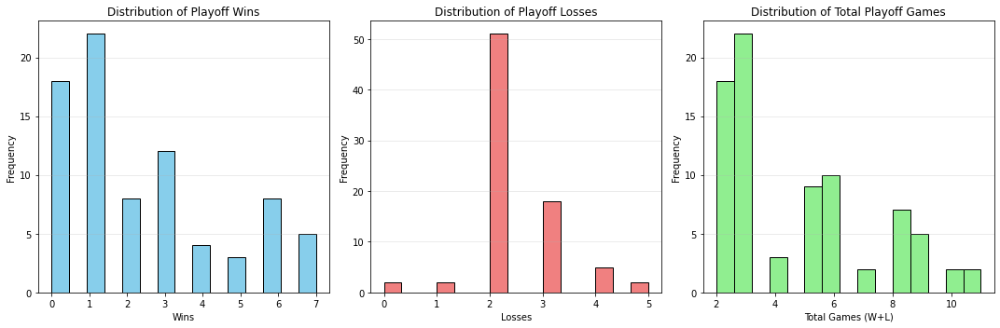

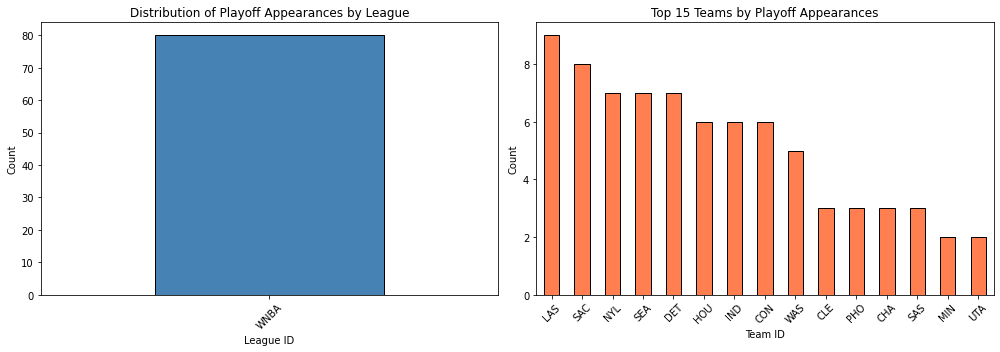

In [34]:
# Descriptive analysis

print("\n=== DESCRIPTIVE STATISTICS ===")
print(teams_post.describe())

# Histograms
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].hist(teams_post['W'], bins=15, edgecolor='black', color='skyblue')
axes[0].set_title('Distribution of Playoff Wins')
axes[0].set_xlabel('Wins')
axes[0].set_ylabel('Frequency')
axes[0].grid(axis='y', alpha=0.3)

axes[1].hist(teams_post['L'], bins=15, edgecolor='black', color='lightcoral')
axes[1].set_title('Distribution of Playoff Losses')
axes[1].set_xlabel('Losses')
axes[1].set_ylabel('Frequency')
axes[1].grid(axis='y', alpha=0.3)

axes[2].hist(teams_post['total_games'], bins=15, edgecolor='black', color='lightgreen')
axes[2].set_title('Distribution of Total Playoff Games')
axes[2].set_xlabel('Total Games (W+L)')
axes[2].set_ylabel('Frequency')
axes[2].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Categorical distributions
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Distribution by league
teams_post['lgID'].value_counts().plot(kind='bar', ax=axes[0], color='steelblue', edgecolor='black')
axes[0].set_title('Distribution of Playoff Appearances by League')
axes[0].set_xlabel('League ID')
axes[0].set_ylabel('Count')
axes[0].tick_params(axis='x', rotation=45)

# Distribution by team
top_teams = teams_post['tmID'].value_counts().head(15)
top_teams.plot(kind='bar', ax=axes[1], color='coral', edgecolor='black')
axes[1].set_title('Top 15 Teams by Playoff Appearances')
axes[1].set_xlabel('Team ID')
axes[1].set_ylabel('Count')
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

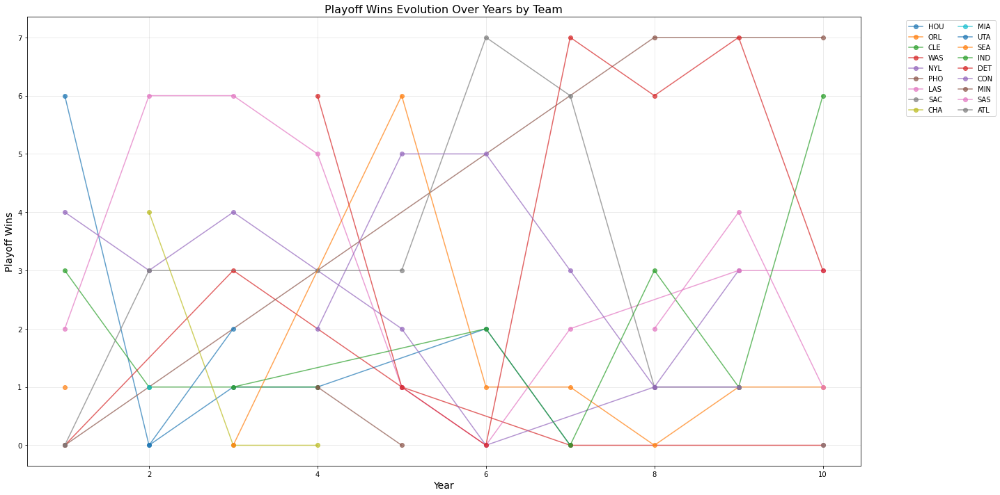

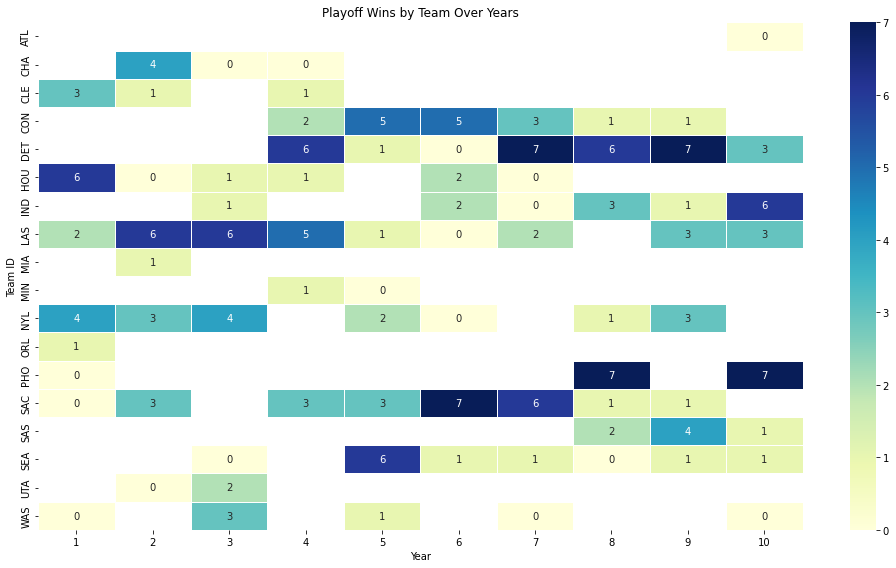

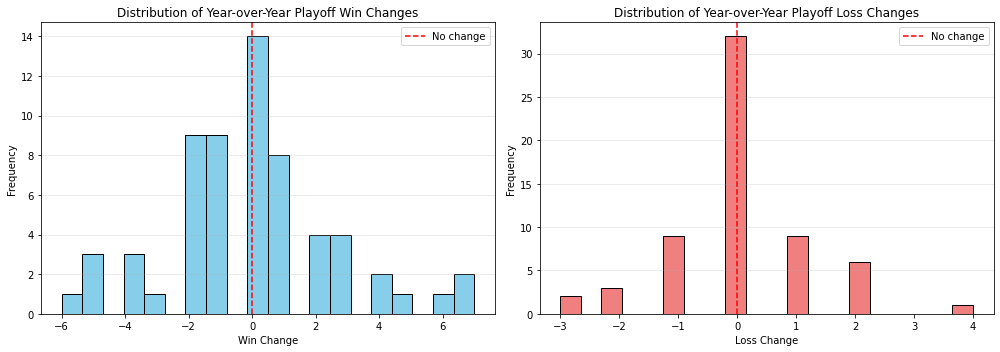

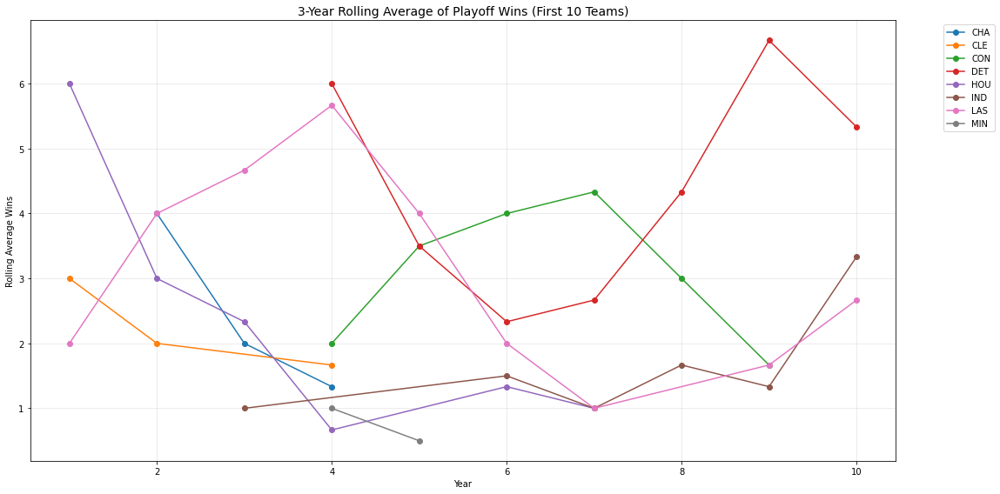


Correlation between current playoff wins and past wins:
Lag 1 years: 0.265
Lag 2 years: -0.045
Lag 3 years: -0.215


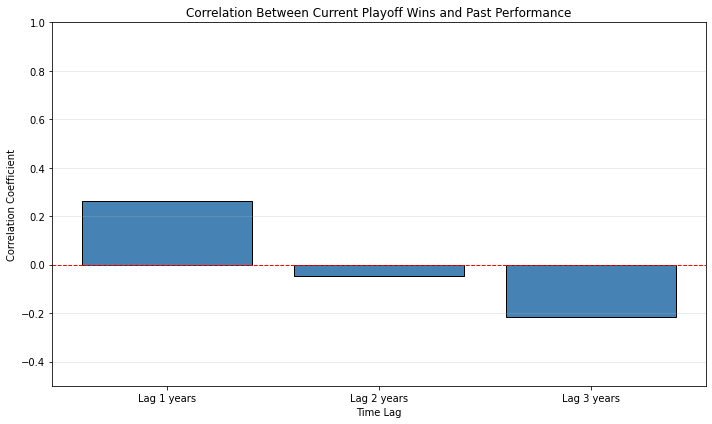

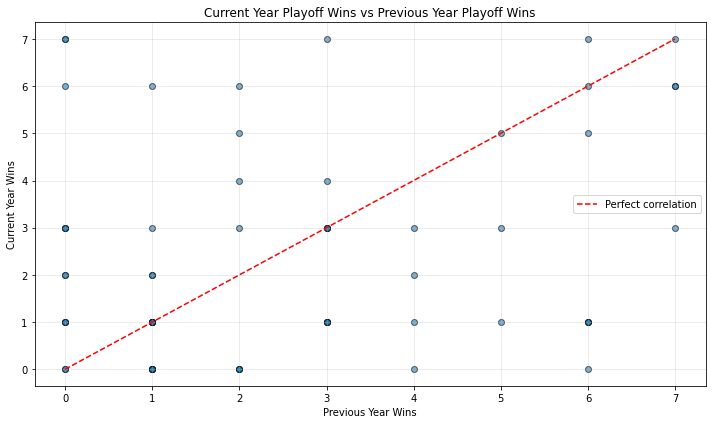

In [35]:
# Temporal analysis

# Playoff wins evolution by team
wins_evolution = teams_post.groupby(['tmID', 'year'])['W'].sum().reset_index()

plt.figure(figsize=(20, 10))
for team in teams_post['tmID'].unique():
    team_data = wins_evolution[wins_evolution['tmID'] == team]
    plt.plot(team_data['year'], team_data['W'], marker='o', label=team, alpha=0.7)

plt.title('Playoff Wins Evolution Over Years by Team', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Playoff Wins', fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Heatmap: Playoff wins by team over years
wins_pivot = teams_post.pivot_table(index='tmID', columns='year', values='W', aggfunc='sum')
plt.figure(figsize=(14, 8))
sns.heatmap(wins_pivot, annot=True, cmap="YlGnBu", fmt=".0f", linewidths=0.5)
plt.title("Playoff Wins by Team Over Years")
plt.xlabel("Year")
plt.ylabel("Team ID")
plt.tight_layout()
plt.show()

teams_post_sorted = teams_post.sort_values(['tmID', 'year'])

# Calculate year-over-year changes
teams_post_sorted['prev_year_wins'] = teams_post_sorted.groupby('tmID')['W'].shift(1)
teams_post_sorted['win_change'] = teams_post_sorted['W'] - teams_post_sorted['prev_year_wins']

teams_post_sorted['prev_year_losses'] = teams_post_sorted.groupby('tmID')['L'].shift(1)
teams_post_sorted['loss_change'] = teams_post_sorted['L'] - teams_post_sorted['prev_year_losses']

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].hist(teams_post_sorted['win_change'].dropna(), bins=20, edgecolor='black', color='skyblue')
axes[0].set_title('Distribution of Year-over-Year Playoff Win Changes')
axes[0].set_xlabel('Win Change')
axes[0].set_ylabel('Frequency')
axes[0].axvline(0, color='red', linestyle='--', label='No change')
axes[0].legend()
axes[0].grid(axis='y', alpha=0.3)

axes[1].hist(teams_post_sorted['loss_change'].dropna(), bins=20, edgecolor='black', color='lightcoral')
axes[1].set_title('Distribution of Year-over-Year Playoff Loss Changes')
axes[1].set_xlabel('Loss Change')
axes[1].set_ylabel('Frequency')
axes[1].axvline(0, color='red', linestyle='--', label='No change')
axes[1].legend()
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Rolling average of wins (3 years)
teams_post_sorted['rolling_wins_3y'] = teams_post_sorted.groupby('tmID')['W'].transform(
    lambda x: x.rolling(window=3, min_periods=1).mean()
)

# Calculate trend (slope) of last 3 years for each team
def calculate_trend(group):
    if len(group) < 3:
        return np.nan
    x = np.arange(len(group))
    y = group.values
    if np.all(np.isnan(y)):
        return np.nan
    slope, _ = np.polyfit(x, y, 1)
    return slope

teams_post_sorted['win_trend_3y'] = teams_post_sorted.groupby('tmID')['W'].transform(
    lambda x: x.rolling(window=3).apply(calculate_trend, raw=False)
)

plt.figure(figsize=(16, 8))
for team in teams_post_sorted['tmID'].unique()[:10]:  # First 10 teams
    team_data = teams_post_sorted[teams_post_sorted['tmID'] == team]
    if len(team_data) > 1:
        plt.plot(team_data['year'], team_data['rolling_wins_3y'], marker='o', label=team)

plt.title('3-Year Rolling Average of Playoff Wins (First 10 Teams)', fontsize=14)
plt.xlabel('Year')
plt.ylabel('Rolling Average Wins')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Create lags
for lag in [1, 2, 3]:
    teams_post_sorted[f'wins_lag_{lag}'] = teams_post_sorted.groupby('tmID')['W'].shift(lag)

# Correlation between past and current playoff performance
lag_correlations = {}
for lag in [1, 2, 3]:
    corr = teams_post_sorted[['W', f'wins_lag_{lag}']].corr().iloc[0, 1]
    lag_correlations[f'Lag {lag} years'] = corr

print("\nCorrelation between current playoff wins and past wins:")
for lag, corr in lag_correlations.items():
    print(f"{lag}: {corr:.3f}")

plt.figure(figsize=(10, 6))
plt.bar(lag_correlations.keys(), lag_correlations.values(), color='steelblue', edgecolor='black')
plt.title('Correlation Between Current Playoff Wins and Past Performance')
plt.ylabel('Correlation Coefficient')
plt.xlabel('Time Lag')
plt.axhline(0, color='red', linestyle='--', linewidth=1)
plt.ylim(-0.5, 1)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Scatter: wins this year vs wins last year
plt.figure(figsize=(10, 6))
plt.scatter(teams_post_sorted['wins_lag_1'], teams_post_sorted['W'], alpha=0.6, edgecolors='black')
plt.plot([0, teams_post['W'].max()], [0, teams_post['W'].max()], 'r--', label='Perfect correlation')
plt.title('Current Year Playoff Wins vs Previous Year Playoff Wins')
plt.xlabel('Previous Year Wins')
plt.ylabel('Current Year Wins')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


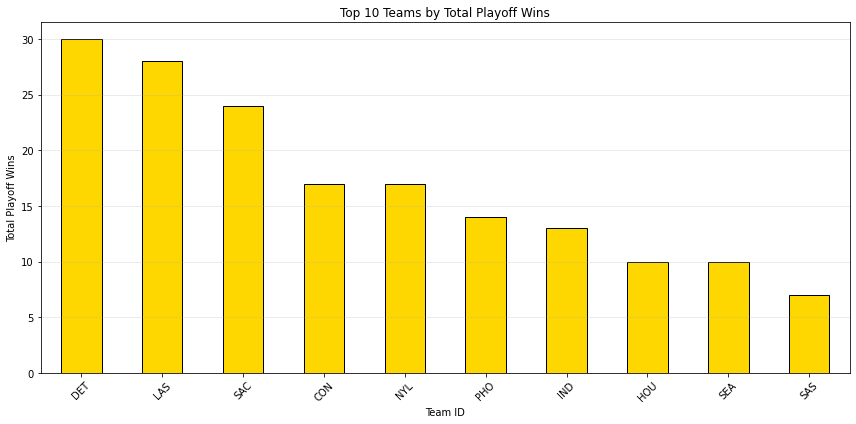

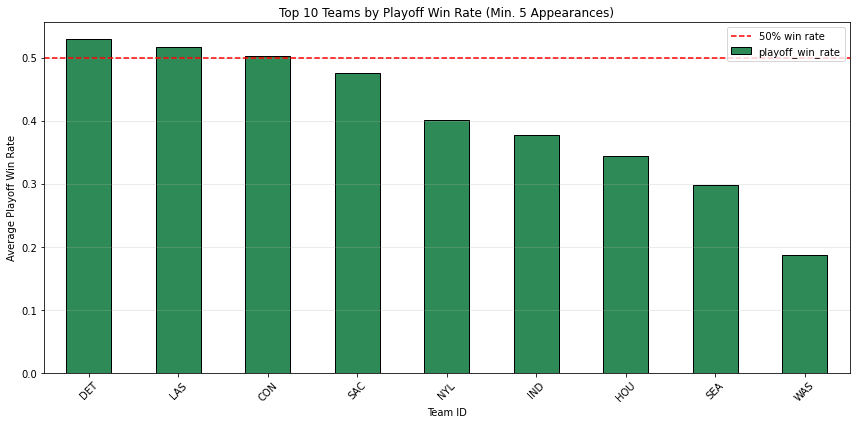

In [36]:
# Comparative Analysis

# Top 10 teams by total playoff wins
top_winners = teams_post.groupby('tmID')['W'].sum().sort_values(ascending=False).head(10)

plt.figure(figsize=(12, 6))
top_winners.plot(kind='bar', color='gold', edgecolor='black')
plt.title('Top 10 Teams by Total Playoff Wins')
plt.xlabel('Team ID')
plt.ylabel('Total Playoff Wins')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Win rate in playoffs (W / (W+L))
teams_post['playoff_win_rate'] = teams_post['W'] / (teams_post['W'] + teams_post['L'])

# Top 10 teams by average playoff win rate (min 5 appearances)
team_appearances = teams_post.groupby('tmID').size()
qualified_teams = team_appearances[team_appearances >= 5].index

qualified_data = teams_post[teams_post['tmID'].isin(qualified_teams)]
top_win_rate = qualified_data.groupby('tmID')['playoff_win_rate'].mean().sort_values(ascending=False).head(10)

plt.figure(figsize=(12, 6))
top_win_rate.plot(kind='bar', color='seagreen', edgecolor='black')
plt.title('Top 10 Teams by Playoff Win Rate (Min. 5 Appearances)')
plt.xlabel('Team ID')
plt.ylabel('Average Playoff Win Rate')
plt.xticks(rotation=45)
plt.axhline(0.5, color='red', linestyle='--', label='50% win rate')
plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()


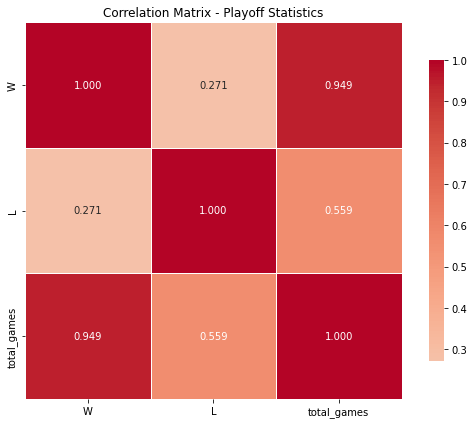


Correlations with p-values:
W vs L: r=0.271, p=0.0151

Normality Tests (Shapiro-Wilk):
W: W=0.8587, p=0.0000 (Not Normal)
L: W=0.7691, p=0.0000 (Not Normal)

Chi-Square Test: Uniform distribution of playoff appearances
Chi-square statistic: 26.2000
P-value: 0.0709
Distribution is uniform: Yes


In [37]:
# Statistical analysis & Correlations

from scipy import stats

# Correlation matrix
numeric_cols = ['W', 'L', 'total_games']
correlation_matrix = teams_post[numeric_cols].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, fmt=".3f", cmap='coolwarm', 
            center=0, square=True, linewidths=1, cbar_kws={"shrink": 0.8})
plt.title('Correlation Matrix - Playoff Statistics')
plt.tight_layout()
plt.show()

# Correlation with significance
def corr_with_pvalue(x, y):
    mask = ~np.isnan(x) & ~np.isnan(y)
    if mask.sum() < 3:
        return np.nan, np.nan
    return stats.pearsonr(x[mask], y[mask])

print("\nCorrelations with p-values:")
corr, pval = corr_with_pvalue(teams_post['W'].values, teams_post['L'].values)
print(f"W vs L: r={corr:.3f}, p={pval:.4f}")

# NORMALITY TEST
print("\nNormality Tests (Shapiro-Wilk):")
for col in ['W', 'L']:
    stat, p_value = stats.shapiro(teams_post[col].dropna())
    print(f"{col}: W={stat:.4f}, p={p_value:.4f} {'(Normal)' if p_value > 0.05 else '(Not Normal)'}")

# CHI-SQUARE: Test if playoff appearances are uniformly distributed among teams
team_counts = teams_post['tmID'].value_counts()
expected_freq = len(teams_post) / len(team_counts)
chi2, p_value_chi = stats.chisquare(team_counts.values, f_exp=[expected_freq]*len(team_counts))

print(f"\nChi-Square Test: Uniform distribution of playoff appearances")
print(f"Chi-square statistic: {chi2:.4f}")
print(f"P-value: {p_value_chi:.4f}")
print(f"Distribution is uniform: {'No' if p_value_chi < 0.05 else 'Yes'}")


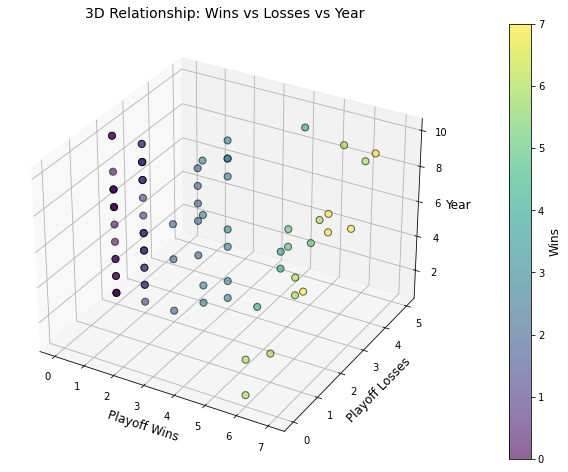

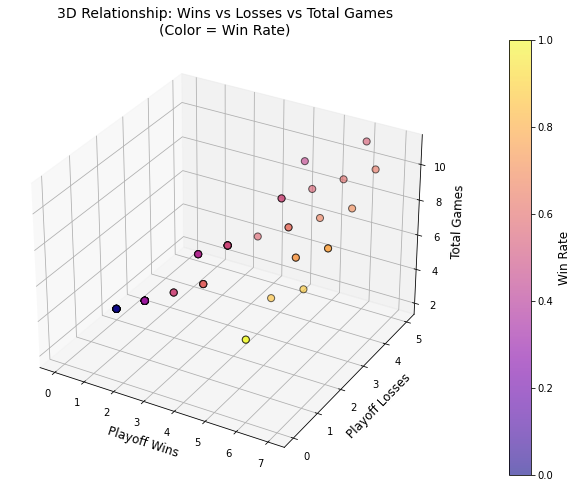

In [38]:
# 3D Visualizations

from mpl_toolkits.mplot3d import Axes3D


# 3D: Wins vs Losses vs Year
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(teams_post['W'], teams_post['L'], teams_post['year'], 
                     c=teams_post['W'], cmap='viridis', s=50, alpha=0.6, edgecolors='black')

ax.set_xlabel('Playoff Wins', fontsize=12)
ax.set_ylabel('Playoff Losses', fontsize=12)
ax.set_zlabel('Year', fontsize=12)
ax.set_title('3D Relationship: Wins vs Losses vs Year', fontsize=14)

cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label('Wins', fontsize=12)

plt.show()

# 3D: Wins vs Losses vs Total Games
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(teams_post['W'], teams_post['L'], teams_post['total_games'], 
                     c=teams_post['playoff_win_rate'], cmap='plasma', s=50, alpha=0.6, edgecolors='black')

ax.set_xlabel('Playoff Wins', fontsize=12)
ax.set_ylabel('Playoff Losses', fontsize=12)
ax.set_zlabel('Total Games', fontsize=12)
ax.set_title('3D Relationship: Wins vs Losses vs Total Games\n(Color = Win Rate)', fontsize=14)

cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label('Win Rate', fontsize=12)

plt.show()

## Data Analysis `awards_players.csv`

Dataset shape: (95, 4)

First few rows:
     playerID                               award  year  lgID
0  thompti01w  All-Star Game Most Valuable Player     1  WNBA
1  leslili01w  All-Star Game Most Valuable Player     2  WNBA
2  leslili01w  All-Star Game Most Valuable Player     3  WNBA
3  teaslni01w  All-Star Game Most Valuable Player     4  WNBA
4  swoopsh01w  All-Star Game Most Valuable Player     6  WNBA
5  douglka01w  All-Star Game Most Valuable Player     7  WNBA
6   fordch01w  All-Star Game Most Valuable Player     8  WNBA
7   cashsw01w  All-Star Game Most Valuable Player    10  WNBA
8  coopemi01w                   Coach of the Year     1  WNBA
9  hugheda99w                   Coach of the Year     2  WNBA

=== COMPLETENESS ===

Missing values:
          Missing Count  Percentage
playerID              0         0.0
award                 0         0.0
year                  0         0.0
lgID                  0         0.0
No missing values found

Missing values by award type:
Empt

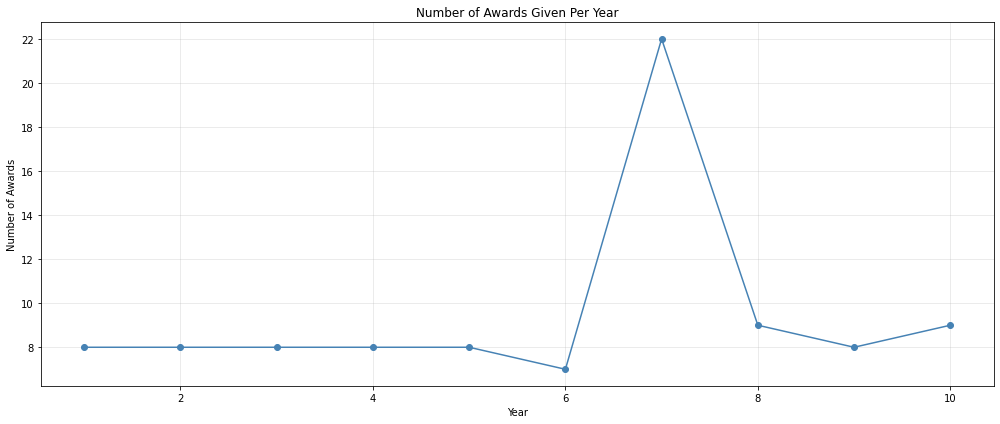


=== ACCURACY - Outliers ===
Year outliers: 0
Year range: [-3, 15]


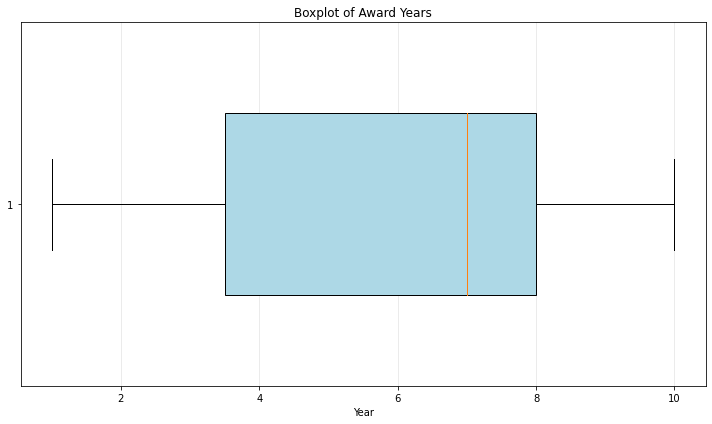


Players with unusually high number of awards: 5

Top 10 players by total awards:
playerID
leslili01w    10
swoopsh01w     8
catchta01w     5
jacksla01w     4
tauradi01w     4
mcconsu01w     2
fordch01w      2
parkeca01w     2
lennobe01w     2
hugheda99w     2
dtype: int64

=== TIMELINESS ===
Missing years in dataset: None
Total years covered: 10
Year range: 1 - 10

Temporal coverage by award type:
                                        min  max  count  span
award                                                        
Coach of the Year                         1   10     10     9
Defensive Player of the Year              1   10     10     9
Most Valuable Player                      1   10     10     9
Rookie of the Year                        1   10     10     9
WNBA All-Decade Team                      7    7     10     0
WNBA Finals Most Valuable Player          1   10     10     9
Kim Perrot Sportsmanship Award            1    9      9     8
Most Improved Player                    

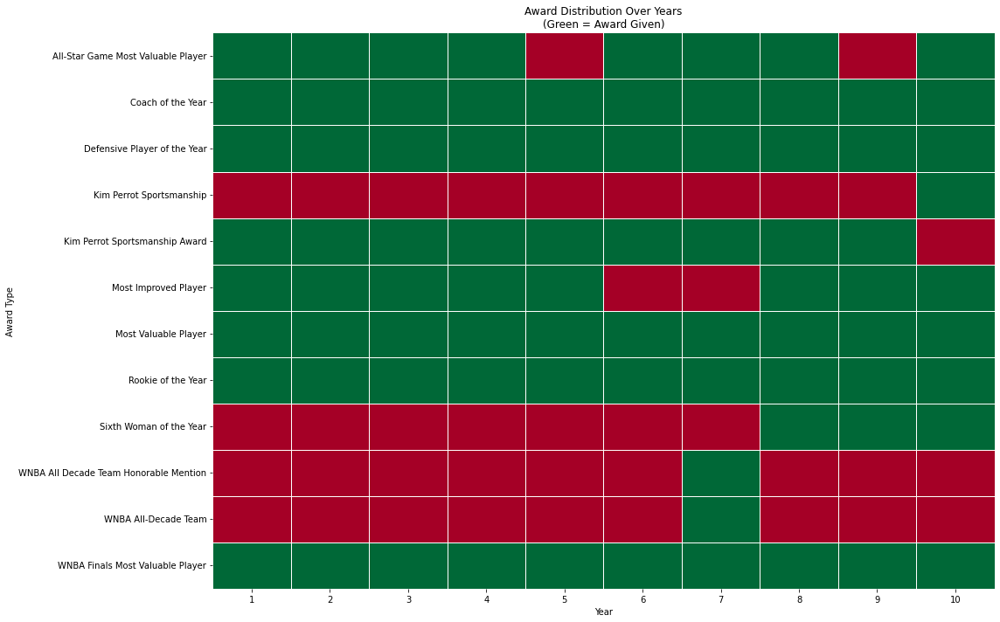


=== VALIDITY ===
Invalid playerID (too short): 0

Total unique awards: 12

All award types:
  1. All-Star Game Most Valuable Player (n=8)
  2. Coach of the Year (n=10)
  3. Defensive Player of the Year (n=10)
  4. Kim Perrot Sportsmanship (n=1)
  5. Kim Perrot Sportsmanship Award (n=9)
  6. Most Improved Player (n=9)
  7. Most Valuable Player (n=10)
  8. Rookie of the Year (n=10)
  9. Sixth Woman of the Year (n=3)
  10. WNBA All Decade Team Honorable Mention (n=5)
  11. WNBA All-Decade Team (n=10)
  12. WNBA Finals Most Valuable Player (n=10)

Players with multiple awards in same year: 12
Top 10 cases:
playerID    year
leslili01w  2       3
catchta01w  7       2
jacksla01w  8       2
leslili01w  3       2
            5       2
            7       2
parkeca01w  9       2
staleda01w  7       2
swoopsh01w  1       2
            3       2
dtype: int64


In [81]:
# Data Quality

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats

awards_players = pd.read_csv('../dataset/awards_players.csv')

print(f"Dataset shape: {awards_players.shape}")
print(f"\nFirst few rows:")
print(awards_players.head(10))

missing_data = awards_players.isnull().sum()
missing_percentage = (missing_data / len(awards_players)) * 100

print("\n=== COMPLETENESS ===")
print("\nMissing values:")
print(pd.DataFrame({
    'Missing Count': missing_data,
    'Percentage': missing_percentage
}))

# Visualize missing values
if missing_percentage.sum() > 0:
    plt.figure(figsize=(10, 6))
    missing_percentage[missing_percentage > 0].plot(kind='bar', color='coral', edgecolor='black')
    plt.title('Percentage of Missing Values by Column')
    plt.ylabel('Percentage (%)')
    plt.xlabel('Columns')
    plt.xticks(rotation=45)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("No missing values found")

# Verify missing values by award type
missing_by_award = awards_players.groupby('award').apply(lambda x: x.isnull().sum())
print("\nMissing values by award type:")
print(missing_by_award[missing_by_award.sum(axis=1) > 0])

print("\n=== UNIQUENESS ===")

# Total duplicates
duplicates = awards_players.duplicated().sum()
duplicate_rows = awards_players[awards_players.duplicated(keep=False)]

print(f"Total duplicate rows: {duplicates}")
if duplicates > 0:
    print(f"\nDuplicate rows details:")
    print(duplicate_rows.sort_values(['playerID', 'year', 'award']))

# Verify duplicate keys based on 'playerID', 'year', and 'award'
duplicate_keys = awards_players.duplicated(subset=['playerID', 'year', 'award']).sum()
print(f"\nDuplicate player-year-award combinations: {duplicate_keys}")

# Check if a player won the same award multiple times
player_award_counts = awards_players.groupby(['playerID', 'award']).size()
multiple_wins = player_award_counts[player_award_counts > 1].sort_values(ascending=False)
print(f"\nPlayers who won the same award multiple times: {len(multiple_wins)}")
print("\nTop 10 players with most wins of same award:")
print(multiple_wins.head(10))

print("\n=== CONSISTENCY ===")

# Check for empty or blank award names
empty_awards = awards_players[awards_players['award'].str.strip() == '']
print(f"\nEmpty award names: {len(empty_awards)}")

# Check distribution of awards by year
awards_per_year = awards_players.groupby('year').size()
print("\nAwards per year - Statistics:")
print(awards_per_year.describe())

plt.figure(figsize=(14, 6))
awards_per_year.plot(kind='line', marker='o', color='steelblue')
plt.title('Number of Awards Given Per Year')
plt.xlabel('Year')
plt.ylabel('Number of Awards')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("\n=== ACCURACY - Outliers ===")

# Year is the only numeric column to check for outliers
Q1 = awards_players['year'].quantile(0.25)
Q3 = awards_players['year'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_year = awards_players[(awards_players['year'] < lower_bound) | 
                                (awards_players['year'] > upper_bound)]

print(f"Year outliers: {len(outliers_year)}")
print(f"Year range: [{lower_bound:.0f}, {upper_bound:.0f}]")
if len(outliers_year) > 0:
    print(f"Outlier years: {sorted(outliers_year['year'].unique())}")

# Boxplot to year
plt.figure(figsize=(10, 6))
plt.boxplot(awards_players['year'].dropna(), vert=False, widths=0.5, 
            patch_artist=True, boxprops=dict(facecolor='lightblue'))
plt.title('Boxplot of Award Years')
plt.xlabel('Year')
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# Outliers in awards count by player
awards_per_player = awards_players.groupby('playerID').size()
Q1_player = awards_per_player.quantile(0.25)
Q3_player = awards_per_player.quantile(0.75)
IQR_player = Q3_player - Q1_player
upper_bound_player = Q3_player + 1.5 * IQR_player

outlier_players = awards_per_player[awards_per_player > upper_bound_player]
print(f"\nPlayers with unusually high number of awards: {len(outlier_players)}")
print("\nTop 10 players by total awards:")
print(awards_per_player.sort_values(ascending=False).head(10))

print("\n=== TIMELINESS ===")

# Verify temporal gaps
years_range = range(awards_players['year'].min(), awards_players['year'].max() + 1)
missing_years = set(years_range) - set(awards_players['year'].unique())
print(f"Missing years in dataset: {missing_years if missing_years else 'None'}")
print(f"Total years covered: {awards_players['year'].nunique()}")
print(f"Year range: {awards_players['year'].min()} - {awards_players['year'].max()}")

# Verify temporal coverage by award type
award_year_coverage = awards_players.groupby('award')['year'].agg(['min', 'max', 'count'])
award_year_coverage['span'] = award_year_coverage['max'] - award_year_coverage['min']
print("\nTemporal coverage by award type:")
print(award_year_coverage.sort_values('count', ascending=False))

# Heatmap of temporal coverage by award
pivot_coverage = awards_players.pivot_table(index='award', columns='year', 
                                             values='playerID', aggfunc='count')
plt.figure(figsize=(16, 10))
sns.heatmap(pivot_coverage.notna(), cmap='RdYlGn', cbar=False, linewidths=0.5)
plt.title('Award Distribution Over Years\n(Green = Award Given)')
plt.xlabel('Year')
plt.ylabel('Award Type')
plt.tight_layout()
plt.show()

print("\n=== VALIDITY ===")

# Verify playerID format (length)
invalid_playerID = awards_players[awards_players['playerID'].str.len() < 3]
print(f"Invalid playerID (too short): {len(invalid_playerID)}")

# Verify unique award types
print(f"\nTotal unique awards: {awards_players['award'].nunique()}")
print("\nAll award types:")
for i, award in enumerate(sorted(awards_players['award'].unique()), 1):
    count = (awards_players['award'] == award).sum()
    print(f"  {i}. {award} (n={count})")

# Verify if there are awards given in the same year to the same player
same_year_awards = awards_players.groupby(['playerID', 'year']).size()
multiple_awards_same_year = same_year_awards[same_year_awards > 1]
print(f"\nPlayers with multiple awards in same year: {len(multiple_awards_same_year)}")
print("Top 10 cases:")
print(multiple_awards_same_year.sort_values(ascending=False).head(10))



=== DESCRIPTIVE STATISTICS ===
          playerID              award       year  lgID
count           95                 95  95.000000    95
unique          58                 12        NaN     1
top     leslili01w  Coach of the Year        NaN  WNBA
freq            10                 10        NaN    95
mean           NaN                NaN   5.789474   NaN
std            NaN                NaN   2.747900   NaN
min            NaN                NaN   1.000000   NaN
25%            NaN                NaN   3.500000   NaN
50%            NaN                NaN   7.000000   NaN
75%            NaN                NaN   8.000000   NaN
max            NaN                NaN  10.000000   NaN

Awards by type:
award
Coach of the Year                         10
Defensive Player of the Year              10
Most Valuable Player                      10
Rookie of the Year                        10
WNBA All-Decade Team                      10
WNBA Finals Most Valuable Player          10
Kim Perrot Spor

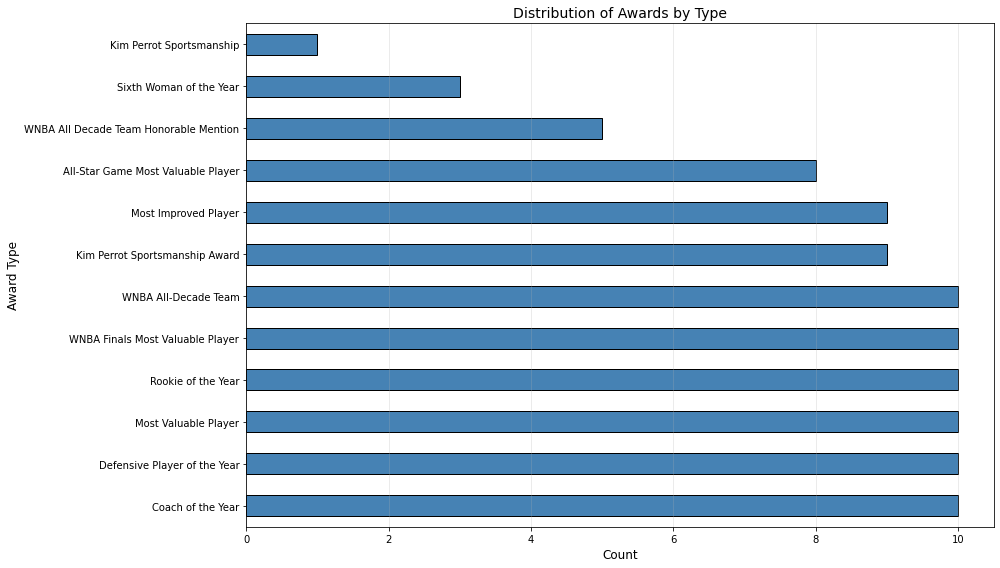

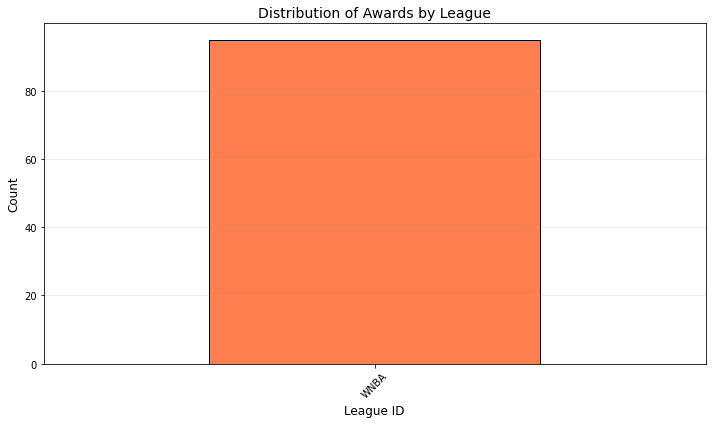

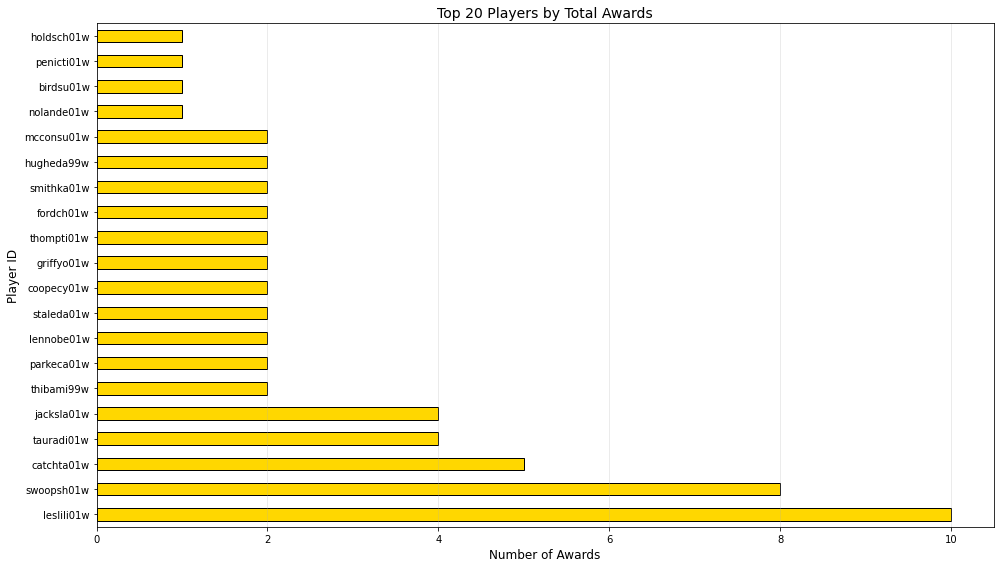

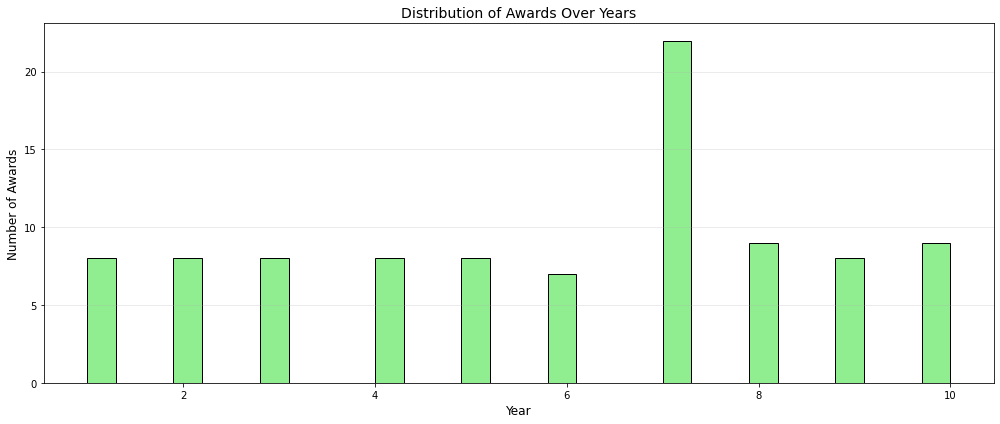

<Figure size 1152x576 with 0 Axes>

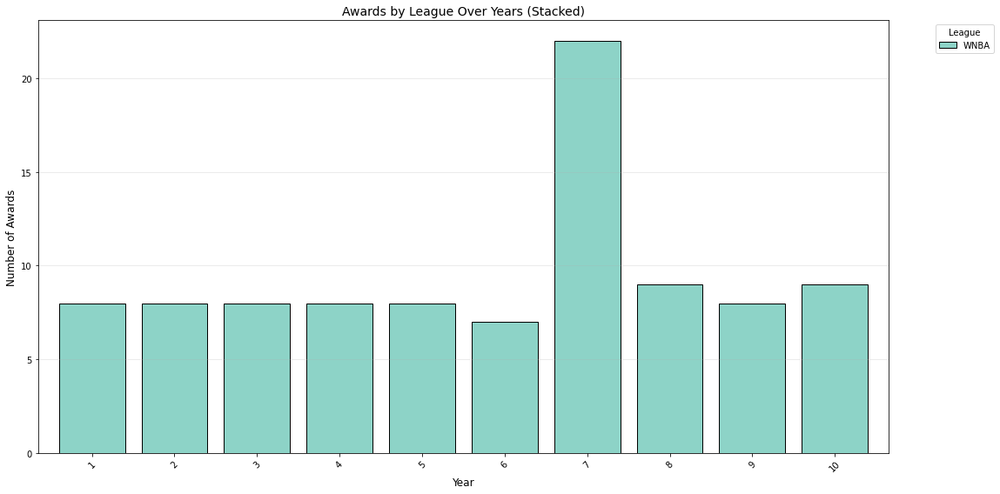

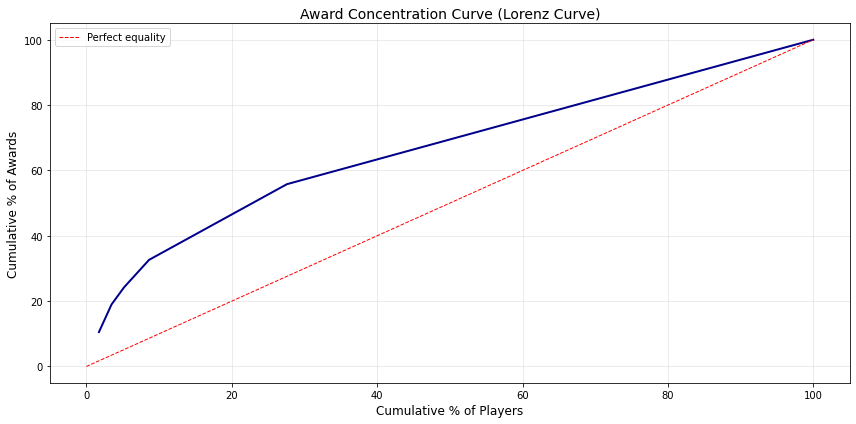


Gini coefficient for award distribution: -0.313
(0 = perfect equality, 1 = perfect inequality)


In [82]:
# Descriptive analysis

print("\n=== DESCRIPTIVE STATISTICS ===")
print(awards_players.describe(include='all'))

# Statistics by award type
print("\nAwards by type:")
print(awards_players.groupby('award').size().sort_values(ascending=False))

# Distribution of awards by type
plt.figure(figsize=(14, 8))
award_counts = awards_players['award'].value_counts()
award_counts.plot(kind='barh', color='steelblue', edgecolor='black')
plt.title('Distribution of Awards by Type', fontsize=14)
plt.xlabel('Count', fontsize=12)
plt.ylabel('Award Type', fontsize=12)
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# Distribution of awards by league
plt.figure(figsize=(10, 6))
awards_players['lgID'].value_counts().plot(kind='bar', color='coral', edgecolor='black')
plt.title('Distribution of Awards by League', fontsize=14)
plt.xlabel('League ID', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Top 20 players by total awards
plt.figure(figsize=(14, 8))
top_players = awards_players['playerID'].value_counts().head(20)
top_players.plot(kind='barh', color='gold', edgecolor='black')
plt.title('Top 20 Players by Total Awards', fontsize=14)
plt.xlabel('Number of Awards', fontsize=12)
plt.ylabel('Player ID', fontsize=12)
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# Distribution of awards by year (histogram)
plt.figure(figsize=(14, 6))
plt.hist(awards_players['year'], bins=30, edgecolor='black', color='lightgreen')
plt.title('Distribution of Awards Over Years', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of Awards', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Stacked bar: Awards per league over years
awards_by_league_year = awards_players.groupby(['year', 'lgID']).size().unstack(fill_value=0)
plt.figure(figsize=(16, 8))
awards_by_league_year.plot(kind='bar', stacked=True, figsize=(16, 8), 
                            colormap='Set3', edgecolor='black', width=0.8)
plt.title('Awards by League Over Years (Stacked)', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of Awards', fontsize=12)
plt.legend(title='League', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Awards Concentration: % of awards held by top X% of players
awards_per_player = awards_players.groupby('playerID').size().sort_values(ascending=False)
cumulative_awards = awards_per_player.cumsum()
cumulative_players = np.arange(1, len(awards_per_player) + 1)

plt.figure(figsize=(12, 6))
plt.plot(cumulative_players / len(awards_per_player) * 100, 
         cumulative_awards / cumulative_awards.iloc[-1] * 100,
         linewidth=2, color='darkblue')
plt.plot([0, 100], [0, 100], 'r--', label='Perfect equality', linewidth=1)
plt.title('Award Concentration Curve (Lorenz Curve)', fontsize=14)
plt.xlabel('Cumulative % of Players', fontsize=12)
plt.ylabel('Cumulative % of Awards', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Calculate Gini coefficient
def gini_coefficient(x):
    sorted_x = np.sort(x)
    n = len(x)
    return (2 * np.sum((n - np.arange(1, n + 1) + 1) * sorted_x)) / (n * np.sum(sorted_x)) - 1

gini = gini_coefficient(awards_per_player.values)
print(f"\nGini coefficient for award distribution: {gini:.3f}")
print("(0 = perfect equality, 1 = perfect inequality)")


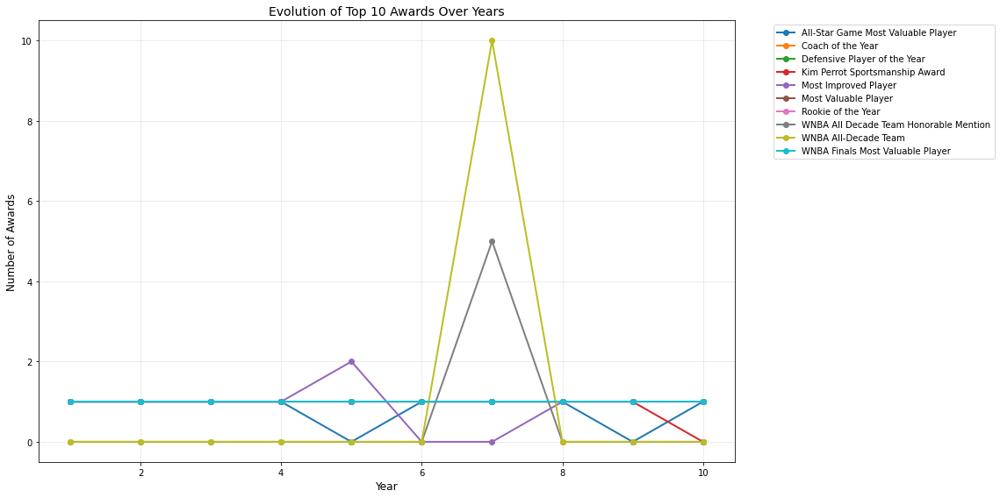

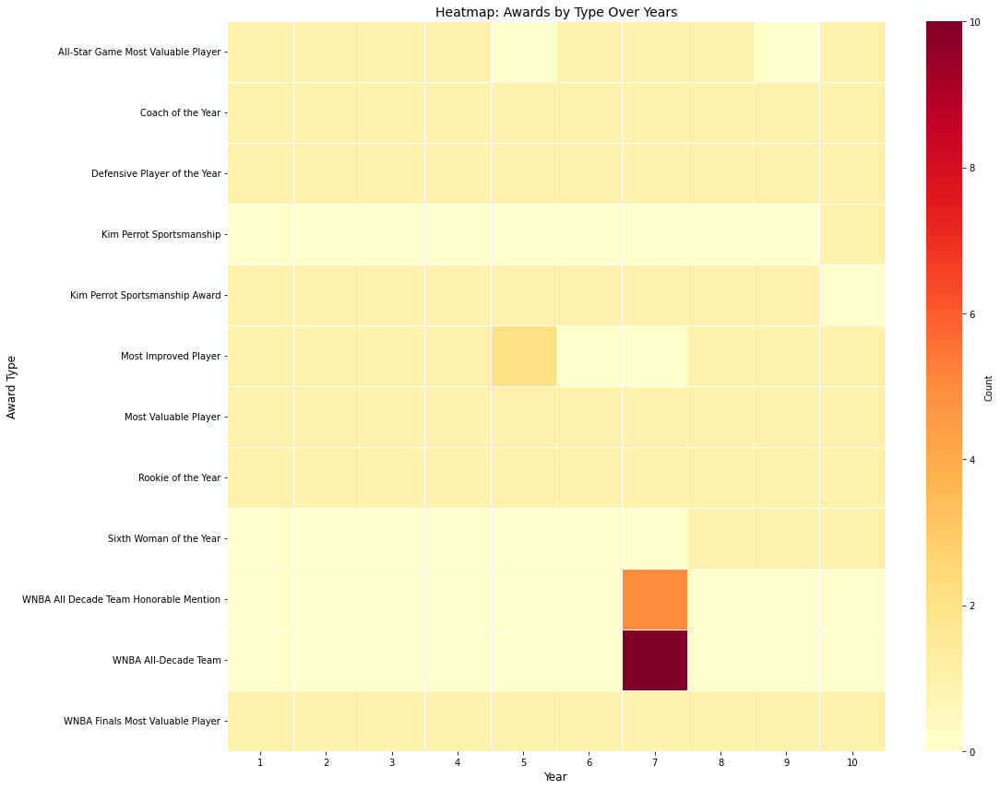

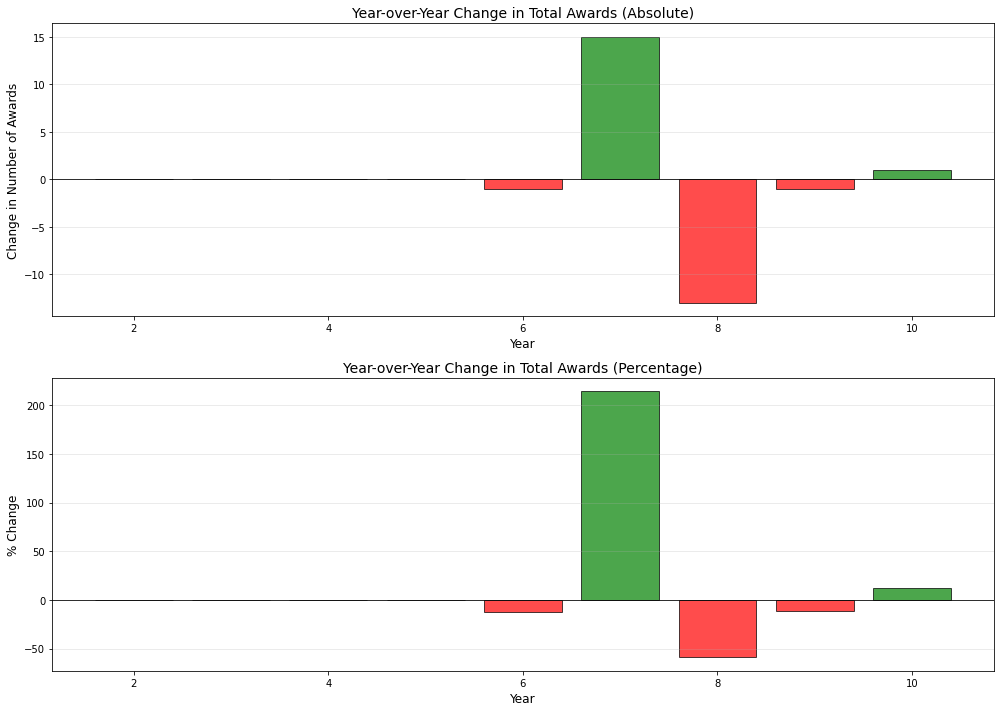

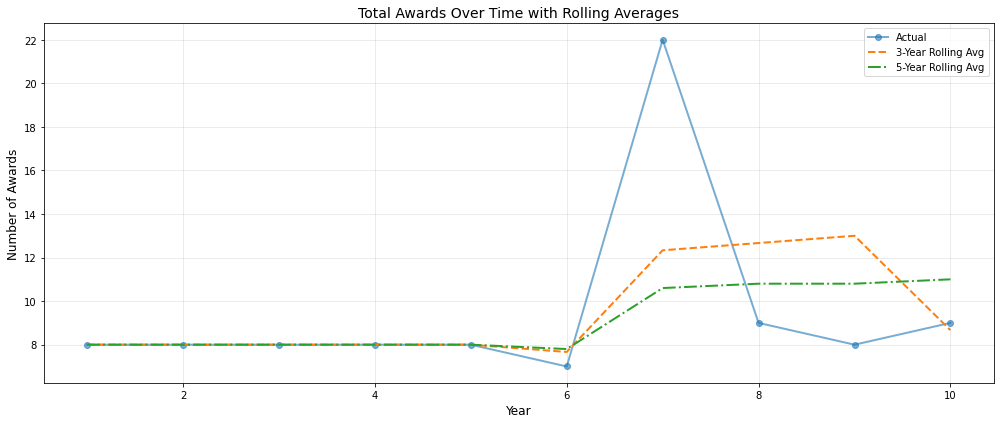

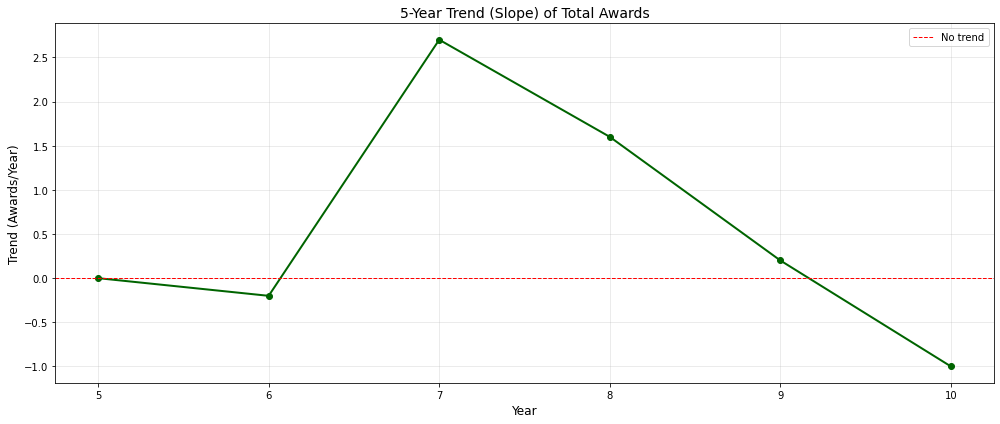


Players with longest award-winning careers:
            min  max  count  span  awards_per_year
playerID                                          
leslili01w    2    9     10     7         1.250000
catchta01w    3   10      5     7         0.625000
thompti01w    1    7      2     6         0.285714
hugheda99w    2    8      2     6         0.285714
coopecy01w    1    7      2     6         0.285714
swoopsh01w    1    7      8     6         1.142857
tauradi01w    5   10      4     5         0.666667
mcconsu01w    1    5      2     4         0.400000
fordch01w     4    8      2     4         0.400000
lennobe01w    1    5      2     4         0.400000

Players with highest award frequency:
            min  max  count  span  awards_per_year
playerID                                          
leslili01w    2    9     10     7         1.250000
swoopsh01w    1    7      8     6         1.142857
griffyo01w    6    7      2     1         1.000000
jacksla01w    4    8      4     4         0.80000

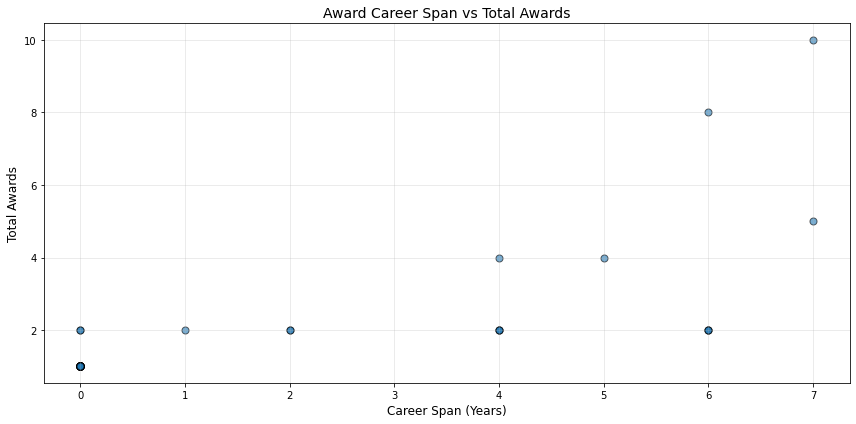

In [83]:
# Temporal analysis

# Awards over time by type (top 10 most common awards)
top_awards = awards_players['award'].value_counts().head(10).index
filtered_data = awards_players[awards_players['award'].isin(top_awards)]

awards_evolution = filtered_data.groupby(['year', 'award']).size().unstack(fill_value=0)

plt.figure(figsize=(16, 8))
for award in awards_evolution.columns:
    plt.plot(awards_evolution.index, awards_evolution[award], marker='o', label=award, linewidth=2)

plt.title('Evolution of Top 10 Awards Over Years', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of Awards', fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Heatmap: Awards per type over years
awards_heatmap = awards_players.groupby(['award', 'year']).size().unstack(fill_value=0)
plt.figure(figsize=(16, 12))
sns.heatmap(awards_heatmap, cmap='YlOrRd', linewidths=0.5, cbar_kws={'label': 'Count'})
plt.title('Heatmap: Awards by Type Over Years', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Award Type', fontsize=12)
plt.tight_layout()
plt.show()

# Total awards per year
total_awards_per_year = awards_players.groupby('year').size()
yoy_change = total_awards_per_year.diff()
yoy_pct_change = total_awards_per_year.pct_change() * 100

fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# Absolute change
axes[0].bar(yoy_change.index, yoy_change.values, color=['green' if x > 0 else 'red' for x in yoy_change.values],
            edgecolor='black', alpha=0.7)
axes[0].axhline(0, color='black', linewidth=0.8)
axes[0].set_title('Year-over-Year Change in Total Awards (Absolute)', fontsize=14)
axes[0].set_xlabel('Year', fontsize=12)
axes[0].set_ylabel('Change in Number of Awards', fontsize=12)
axes[0].grid(axis='y', alpha=0.3)

# Percentage change
axes[1].bar(yoy_pct_change.index, yoy_pct_change.values, 
            color=['green' if x > 0 else 'red' for x in yoy_pct_change.values],
            edgecolor='black', alpha=0.7)
axes[1].axhline(0, color='black', linewidth=0.8)
axes[1].set_title('Year-over-Year Change in Total Awards (Percentage)', fontsize=14)
axes[1].set_xlabel('Year', fontsize=12)
axes[1].set_ylabel('% Change', fontsize=12)
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Rolling average of awards (3 years)
rolling_avg_3y = total_awards_per_year.rolling(window=3, min_periods=1).mean()
rolling_avg_5y = total_awards_per_year.rolling(window=5, min_periods=1).mean()

plt.figure(figsize=(14, 6))
plt.plot(total_awards_per_year.index, total_awards_per_year.values, 
         marker='o', label='Actual', linewidth=2, alpha=0.6)
plt.plot(rolling_avg_3y.index, rolling_avg_3y.values, 
         label='3-Year Rolling Avg', linewidth=2, linestyle='--')
plt.plot(rolling_avg_5y.index, rolling_avg_5y.values, 
         label='5-Year Rolling Avg', linewidth=2, linestyle='-.')
plt.title('Total Awards Over Time with Rolling Averages', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of Awards', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Trend analysis: calculate slope of the last N years
def calculate_trend_slope(series, window=5):
    trends = []
    for i in range(len(series)):
        if i < window - 1:
            trends.append(np.nan)
        else:
            y = series.iloc[i-window+1:i+1].values
            x = np.arange(window)
            slope, _ = np.polyfit(x, y, 1)
            trends.append(slope)
    return pd.Series(trends, index=series.index)

trend_5y = calculate_trend_slope(total_awards_per_year, window=5)

plt.figure(figsize=(14, 6))
plt.plot(trend_5y.index, trend_5y.values, marker='o', linewidth=2, color='darkgreen')
plt.axhline(0, color='red', linestyle='--', linewidth=1, label='No trend')
plt.title('5-Year Trend (Slope) of Total Awards', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Trend (Awards/Year)', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Players who won awards in multiple years
player_years = awards_players.groupby('playerID')['year'].agg(['min', 'max', 'count'])
player_years['span'] = player_years['max'] - player_years['min']
player_years['awards_per_year'] = player_years['count'] / (player_years['span'] + 1)

print("\nPlayers with longest award-winning careers:")
print(player_years.sort_values('span', ascending=False).head(10))

print("\nPlayers with highest award frequency:")
print(player_years[player_years['span'] > 0].sort_values('awards_per_year', ascending=False).head(10))

# Visualize span vs total awards
plt.figure(figsize=(12, 6))
plt.scatter(player_years['span'], player_years['count'], alpha=0.6, edgecolors='black', s=50)
plt.title('Award Career Span vs Total Awards', fontsize=14)
plt.xlabel('Career Span (Years)', fontsize=12)
plt.ylabel('Total Awards', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()



Award frequency analysis:
                                        count  min  max  years_active  \
award                                                                   
WNBA All-Decade Team                       10    7    7             1   
WNBA All Decade Team Honorable Mention      5    7    7             1   
Coach of the Year                          10    1   10            10   
Defensive Player of the Year               10    1   10            10   
Kim Perrot Sportsmanship                    1   10   10             1   
Kim Perrot Sportsmanship Award              9    1    9             9   
Most Valuable Player                       10    1   10            10   
Rookie of the Year                         10    1   10            10   
Sixth Woman of the Year                     3    8   10             3   
WNBA Finals Most Valuable Player           10    1   10            10   
Most Improved Player                        9    1   10            10   
All-Star Game Most Valua

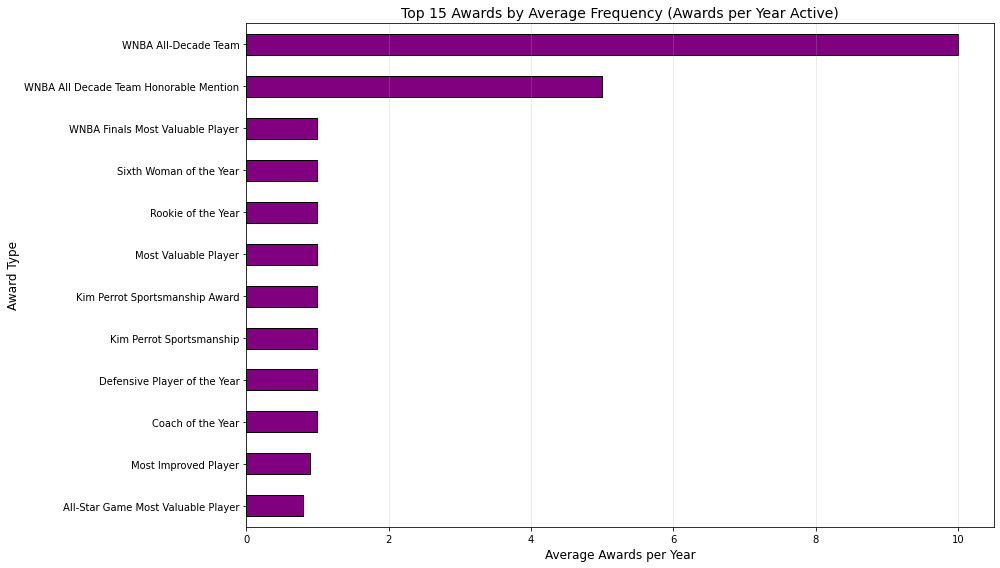

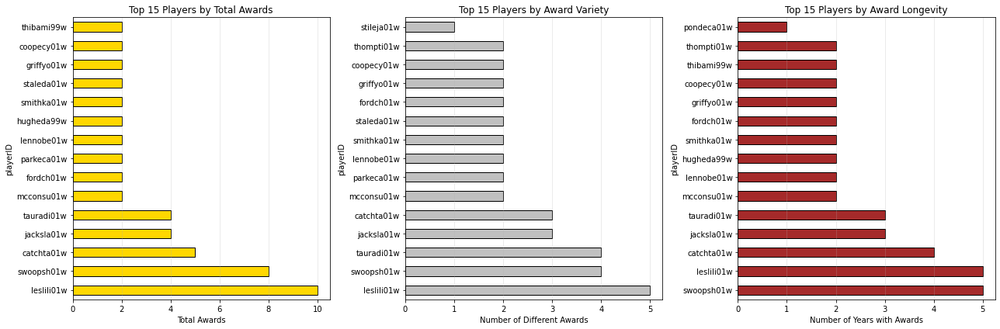

In [84]:
# Comparative Analysis

# Frequency of each award type over years
award_frequency = awards_players.groupby('award')['year'].agg(['count', 'min', 'max'])
award_frequency['years_active'] = award_frequency['max'] - award_frequency['min'] + 1
award_frequency['avg_per_year'] = award_frequency['count'] / award_frequency['years_active']

print("\nAward frequency analysis:")
print(award_frequency.sort_values('avg_per_year', ascending=False))

plt.figure(figsize=(14, 8))
award_frequency.sort_values('avg_per_year', ascending=True).tail(15)['avg_per_year'].plot(
    kind='barh', color='purple', edgecolor='black')
plt.title('Top 15 Awards by Average Frequency (Awards per Year Active)', fontsize=14)
plt.xlabel('Average Awards per Year', fontsize=12)
plt.ylabel('Award Type', fontsize=12)
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# Players with most total awards
top_total = awards_players.groupby('playerID').size().sort_values(ascending=False).head(15)

# Players with most different types of awards
top_variety = awards_players.groupby('playerID')['award'].nunique().sort_values(ascending=False).head(15)

# Players with awards in most different years
top_longevity = awards_players.groupby('playerID')['year'].nunique().sort_values(ascending=False).head(15)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

top_total.plot(kind='barh', ax=axes[0], color='gold', edgecolor='black')
axes[0].set_title('Top 15 Players by Total Awards', fontsize=12)
axes[0].set_xlabel('Total Awards')
axes[0].grid(axis='x', alpha=0.3)

top_variety.plot(kind='barh', ax=axes[1], color='silver', edgecolor='black')
axes[1].set_title('Top 15 Players by Award Variety', fontsize=12)
axes[1].set_xlabel('Number of Different Awards')
axes[1].grid(axis='x', alpha=0.3)

top_longevity.plot(kind='barh', ax=axes[2], color='brown', edgecolor='black')
axes[2].set_title('Top 15 Players by Award Longevity', fontsize=12)
axes[2].set_xlabel('Number of Years with Awards')
axes[2].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()



Uniform distribution of awards across years:
Chi-square statistic: 18.5789
P-value: 0.0290
Distribution is uniform: No

Poisson distribution fit for awards per player:
Lambda (mean): 1.638


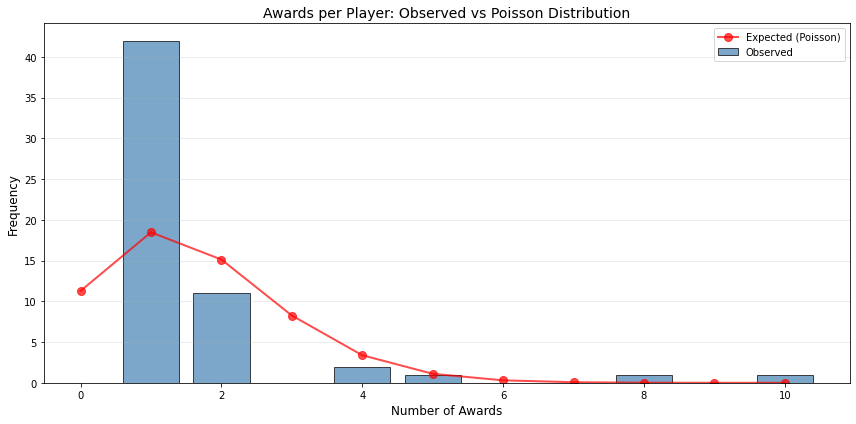


Correlation between year and number of awards:
Pearson r: 0.228
P-value: 0.5266
Significant trend: No

Normality tests:
Awards per year: W=0.4742, p=0.0000 (Not Normal)
Awards per player: W=0.4430, p=0.0000 (Not Normal)

Award distribution entropy: 2.389
Max possible entropy (uniform): 2.485
Relative entropy: 0.961
(Higher = more diverse/uniform distribution)


In [85]:
# Statistical analysis

from scipy import stats
from scipy.stats import chi2_contingency

# Test if award distribution is uniform across award types
year_counts = awards_players['year'].value_counts()
expected_freq = len(awards_players) / len(year_counts)
chi2_year, p_value_year = stats.chisquare(year_counts.values, 
                                           f_exp=[expected_freq]*len(year_counts))

print("\nUniform distribution of awards across years:")
print(f"Chi-square statistic: {chi2_year:.4f}")
print(f"P-value: {p_value_year:.4f}")
print(f"Distribution is uniform: {'No' if p_value_year < 0.05 else 'Yes'}")

# Test if number of awards per player follows Poisson distribution
awards_per_player = awards_players.groupby('playerID').size()
lambda_param = awards_per_player.mean()

from scipy.stats import poisson
max_awards = awards_per_player.max()
observed_freq = awards_per_player.value_counts().sort_index()
expected_poisson = [poisson.pmf(k, lambda_param) * len(awards_per_player) 
                    for k in range(max_awards + 1)]

print("\nPoisson distribution fit for awards per player:")
print(f"Lambda (mean): {lambda_param:.3f}")

plt.figure(figsize=(12, 6))
x_vals = range(max_awards + 1)
plt.bar(observed_freq.index, observed_freq.values, alpha=0.7, 
        label='Observed', color='steelblue', edgecolor='black')
plt.plot(x_vals, expected_poisson, 'ro-', linewidth=2, markersize=8, 
         label='Expected (Poisson)', alpha=0.7)
plt.title('Awards per Player: Observed vs Poisson Distribution', fontsize=14)
plt.xlabel('Number of Awards', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Correlation between year and number of awards (temporal trend)
awards_per_year = awards_players.groupby('year').size().reset_index(name='count')
corr_year, p_value_corr = stats.pearsonr(awards_per_year['year'], awards_per_year['count'])

print(f"\nCorrelation between year and number of awards:")
print(f"Pearson r: {corr_year:.3f}")
print(f"P-value: {p_value_corr:.4f}")
print(f"Significant trend: {'Yes' if p_value_corr < 0.05 else 'No'}")

print("\nNormality tests:")
# Test 1: Awards per year
stat_year, p_year = stats.shapiro(awards_per_year['count'])
print(f"Awards per year: W={stat_year:.4f}, p={p_year:.4f} {'(Normal)' if p_year > 0.05 else '(Not Normal)'}")

# Test 2: Awards per player
stat_player, p_player = stats.shapiro(awards_per_player.values)
print(f"Awards per player: W={stat_player:.4f}, p={p_player:.4f} {'(Normal)' if p_player > 0.05 else '(Not Normal)'}")

# Calculate entropy of award distribution
from scipy.stats import entropy

award_probs = awards_players['award'].value_counts(normalize=True)
award_entropy = entropy(award_probs)

print(f"\nAward distribution entropy: {award_entropy:.3f}")
print(f"Max possible entropy (uniform): {np.log(len(award_probs)):.3f}")
print(f"Relative entropy: {award_entropy / np.log(len(award_probs)):.3f}")
print("(Higher = more diverse/uniform distribution)")


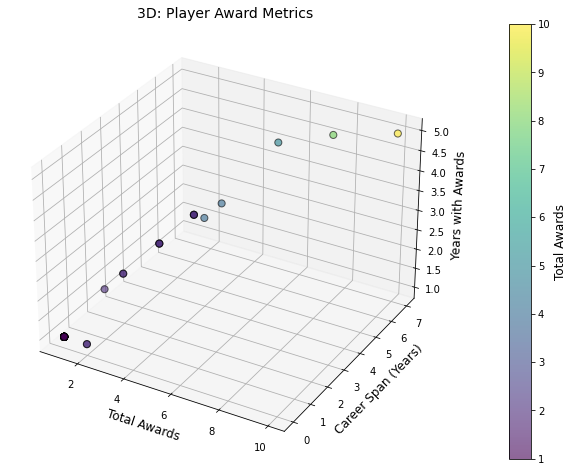

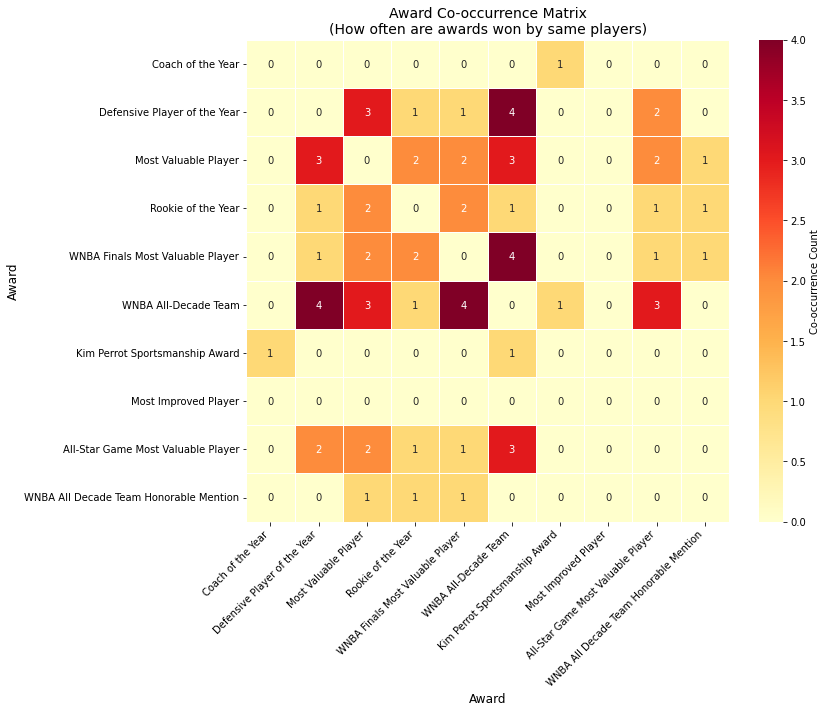

<Figure size 1008x576 with 0 Axes>

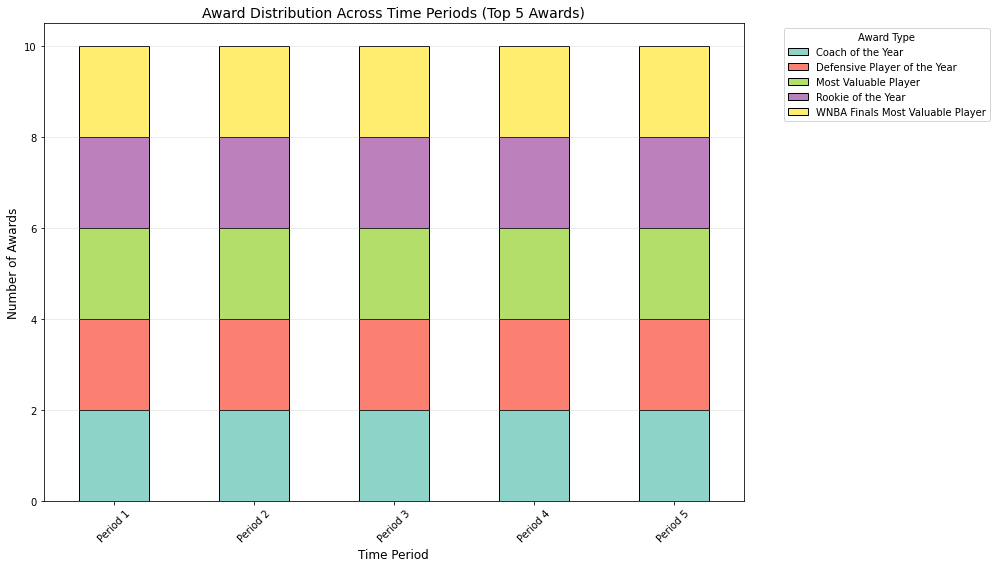

In [86]:
# 3D Visualizations

from mpl_toolkits.mplot3d import Axes3D

player_stats = awards_players.groupby('playerID').agg({
    'award': 'count',  # total awards
    'year': ['min', 'max', 'nunique']  # career span
}).reset_index()
player_stats.columns = ['playerID', 'total_awards', 'first_year', 'last_year', 'years_with_awards']
player_stats['career_span'] = player_stats['last_year'] - player_stats['first_year']

# 3D: Total awards vs Career span vs Years with awards
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(player_stats['total_awards'], 
                     player_stats['career_span'], 
                     player_stats['years_with_awards'],
                     c=player_stats['total_awards'], 
                     cmap='viridis', s=50, alpha=0.6, edgecolors='black')

ax.set_xlabel('Total Awards', fontsize=12)
ax.set_ylabel('Career Span (Years)', fontsize=12)
ax.set_zlabel('Years with Awards', fontsize=12)
ax.set_title('3D: Player Award Metrics', fontsize=14)

cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label('Total Awards', fontsize=12)

plt.show()

# Co-occurrence matrix of awards: which awards are often won by the same players
from itertools import combinations

top_10_awards = awards_players['award'].value_counts().head(10).index
filtered = awards_players[awards_players['award'].isin(top_10_awards)]

cooccurrence = pd.DataFrame(0, index=top_10_awards, columns=top_10_awards)

for player in filtered['playerID'].unique():
    player_awards = filtered[filtered['playerID'] == player]['award'].unique()
    for award1, award2 in combinations(player_awards, 2):
        cooccurrence.loc[award1, award2] += 1
        cooccurrence.loc[award2, award1] += 1

plt.figure(figsize=(12, 10))
sns.heatmap(cooccurrence, annot=True, fmt='d', cmap='YlOrRd', 
            linewidths=0.5, cbar_kws={'label': 'Co-occurrence Count'})
plt.title('Award Co-occurrence Matrix\n(How often are awards won by same players)', fontsize=14)
plt.xlabel('Award', fontsize=12)
plt.ylabel('Award', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

awards_players['period'] = pd.cut(awards_players['year'], 
                                   bins=5, 
                                   labels=['Period 1', 'Period 2', 'Period 3', 'Period 4', 'Period 5'])

top_5_awards = awards_players['award'].value_counts().head(5).index
period_award_counts = awards_players[awards_players['award'].isin(top_5_awards)].groupby(['period', 'award']).size().unstack(fill_value=0)

plt.figure(figsize=(14, 8))
period_award_counts.plot(kind='bar', stacked=True, colormap='Set3', 
                         edgecolor='black', figsize=(14, 8))
plt.title('Award Distribution Across Time Periods (Top 5 Awards)', fontsize=14)
plt.xlabel('Time Period', fontsize=12)
plt.ylabel('Number of Awards', fontsize=12)
plt.legend(title='Award Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()


## Data Analysis `series_post.csv`

Dataset shape: (70, 9)

First few rows:
   year round series tmIDWinner lgIDWinner tmIDLoser lgIDLoser  W  L
0     1    FR      A        CLE       WNBA       ORL      WNBA  2  1
1     1    FR      B        NYL       WNBA       WAS      WNBA  2  0
2     1    FR      C        LAS       WNBA       PHO      WNBA  2  0
3     1    FR      D        HOU       WNBA       SAC      WNBA  2  0
4     1    CF      E        HOU       WNBA       LAS      WNBA  2  0
5     1    CF      F        NYL       WNBA       CLE      WNBA  2  1
6     1     F      G        HOU       WNBA       NYL      WNBA  2  0
7     2    FR      A        CHA       WNBA       CLE      WNBA  2  1
8     2    FR      B        NYL       WNBA       MIA      WNBA  2  1
9     2    FR      C        LAS       WNBA       HOU      WNBA  2  0

=== COMPLETENESS ===

Missing values:
            Missing Count  Percentage
year                    0         0.0
round                   0         0.0
series                  0         0.0
tmIDWinner

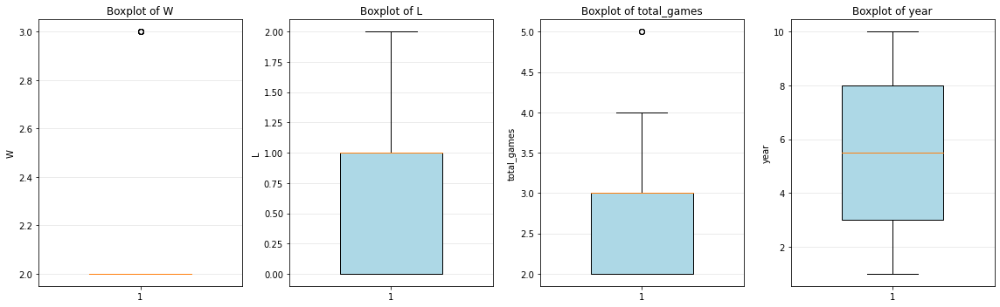


=== TIMELINESS ===
Missing years in dataset: None
Total years covered: 10
Year range: 1 - 10

Temporal coverage by playoff round:
       min  max  count  span
round                       
FR       1   10     40     9
CF       1   10     20     9
F        1   10     10     9


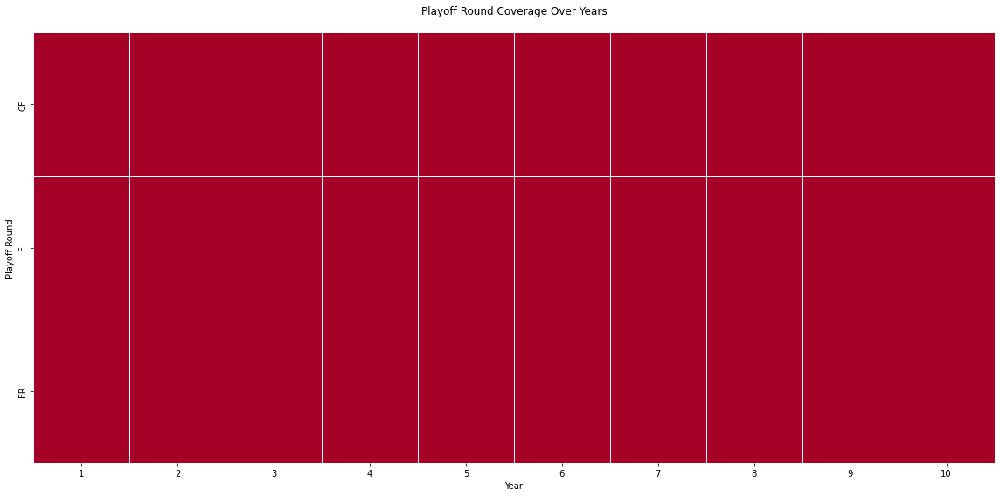


Total unique teams in playoffs: 18

=== VALIDITY ===
No negative values in W
No negative values in L
No negative values in year

Finals series lengths:
2    3
3    3
4    1
5    3
Name: total_games, dtype: int64

Series with unusual W values (< 2): 0

Unique playoff rounds: ['CF', 'F', 'FR']
Round distribution:
FR    40
CF    20
F     10
Name: round, dtype: int64

Series where winner = loser: 0


In [66]:
# Data Quality

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats

series_post = pd.read_csv('../dataset/series_post.csv')

print(f"Dataset shape: {series_post.shape}")
print(f"\nFirst few rows:")
print(series_post.head(10))

missing_data = series_post.isnull().sum()
missing_percentage = (missing_data / len(series_post)) * 100

print("\n=== COMPLETENESS ===")
print("\nMissing values:")
print(pd.DataFrame({
    'Missing Count': missing_data,
    'Percentage': missing_percentage
}))

if missing_percentage.sum() > 0:
    plt.figure(figsize=(10, 6))
    missing_percentage[missing_percentage > 0].plot(kind='bar', color='coral', edgecolor='black')
    plt.title('Percentage of Missing Values by Column')
    plt.ylabel('Percentage (%)')
    plt.xlabel('Columns')
    plt.xticks(rotation=45)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("No missing values found")

# Check for missing values by round
missing_by_round = series_post.groupby('round').apply(lambda x: x.isnull().sum())
print("\nMissing values by playoff round:")
print(missing_by_round[missing_by_round.sum(axis=1) > 0])

print("\n=== UNIQUENESS ===")

# Total duplicates
duplicates = series_post.duplicated().sum()
duplicate_rows = series_post[series_post.duplicated(keep=False)]

print(f"Total duplicate rows: {duplicates}")
if duplicates > 0:
    print(f"\nDuplicate rows details:")
    print(duplicate_rows.sort_values(['year', 'round', 'series']))

# Check for duplicate year-round-series combinations
duplicate_keys = series_post.duplicated(subset=['year', 'round', 'series']).sum()
print(f"\nDuplicate year-round-series combinations: {duplicate_keys}")

# Check if same matchup appears multiple times in same year
series_post['matchup'] = series_post.apply(
    lambda x: tuple(sorted([x['tmIDWinner'], x['tmIDLoser']])), axis=1
)
duplicate_matchups = series_post.duplicated(subset=['year', 'matchup']).sum()
print(f"Same matchup appearing multiple times in same year: {duplicate_matchups}")

print("\n=== CONSISTENCY ===")

# Check if W + L makes sense for playoff series
series_post['total_games'] = series_post['W'] + series_post['L']
print("\nDistribution of series lengths (W+L):")
print(series_post['total_games'].value_counts().sort_index())

# Check if W is always greater than L (winner should have more wins)
invalid_series = series_post[series_post['W'] <= series_post['L']]
print(f"\nSeries where winner has <= losses than wins: {len(invalid_series)}")
if len(invalid_series) > 0:
    print(invalid_series[['year', 'round', 'tmIDWinner', 'tmIDLoser', 'W', 'L']])

# Check if lgIDWinner and lgIDLoser are consistent (should be same league)
different_leagues = series_post[series_post['lgIDWinner'] != series_post['lgIDLoser']]
print(f"\nSeries with teams from different leagues: {len(different_leagues)}")

# Check series progression logic
rounds_per_year = series_post.groupby('year')['round'].value_counts()
print("\nSeries per round per year:")
print(rounds_per_year.unstack(fill_value=0))

# Verify series identifiers are valid
print(f"\nUnique series identifiers: {series_post['series'].unique()}")
print(f"Series distribution:\n{series_post['series'].value_counts()}")

print("\n=== ACCURACY - Outliers ===")

numeric_cols = ['W', 'L', 'total_games', 'year']

# IQR method for outlier detection
def detect_outliers_iqr(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    return outliers, lower_bound, upper_bound

for col in numeric_cols:
    outliers, lower, upper = detect_outliers_iqr(series_post, col)
    print(f"\n{col}:")
    print(f"  Outliers: {len(outliers)}")
    print(f"  Range: [{lower:.2f}, {upper:.2f}]")
    if len(outliers) > 0 and col != 'year':
        print(f"  Outlier values: {outliers[col].values}")

# Boxplots to visualize outliers
fig, axes = plt.subplots(1, 4, figsize=(16, 5))

for idx, col in enumerate(numeric_cols):
    axes[idx].boxplot(series_post[col].dropna(), widths=0.5, patch_artist=True,
                      boxprops=dict(facecolor='lightblue'))
    axes[idx].set_title(f'Boxplot of {col}')
    axes[idx].set_ylabel(col)
    axes[idx].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print("\n=== TIMELINESS ===")

# Check for temporal gaps
years_range = range(series_post['year'].min(), series_post['year'].max() + 1)
missing_years = set(years_range) - set(series_post['year'].unique())
print(f"Missing years in dataset: {missing_years if missing_years else 'None'}")
print(f"Total years covered: {series_post['year'].nunique()}")
print(f"Year range: {series_post['year'].min()} - {series_post['year'].max()}")

# Check temporal coverage by round
round_year_coverage = series_post.groupby('round')['year'].agg(['min', 'max', 'count'])
round_year_coverage['span'] = round_year_coverage['max'] - round_year_coverage['min']
print("\nTemporal coverage by playoff round:")
print(round_year_coverage.sort_values('count', ascending=False))

# Heatmap of temporal coverage by round
pivot_coverage = series_post.pivot_table(index='round', columns='year', 
                                          values='series', aggfunc='count')
plt.figure(figsize=(16, 8))
sns.heatmap(pivot_coverage.notna(), cmap='RdYlGn', cbar=False, linewidths=0.5)
plt.title('Playoff Round Coverage Over Years\n')
plt.xlabel('Year')
plt.ylabel('Playoff Round')
plt.tight_layout()
plt.show()

# Check team participation over time
all_teams = pd.concat([series_post['tmIDWinner'], series_post['tmIDLoser']]).unique()
print(f"\nTotal unique teams in playoffs: {len(all_teams)}")

print("\n=== VALIDITY ===")

# Check for negative values
negative_checks = ['W', 'L', 'year']
for col in negative_checks:
    negative_count = (series_post[col] < 0).sum()
    if negative_count > 0:
        print(f"Negative values in {col}: {negative_count}")
    else:
        print(f"No negative values in {col}")

# 3. Validate series format based on round
finals_series = series_post[series_post['round'] == 'F']
print(f"\nFinals series lengths:")
print(finals_series['total_games'].value_counts().sort_index())

# 4. Check if W values are valid for playoff series
invalid_wins = series_post[(series_post['W'] < 2)]
print(f"\nSeries with unusual W values (< 2): {len(invalid_wins)}")
if len(invalid_wins) > 0:
    print(invalid_wins[['year', 'round', 'tmIDWinner', 'tmIDLoser', 'W', 'L']])

# Verify round identifiers
print(f"\nUnique playoff rounds: {sorted(series_post['round'].unique())}")
print(f"Round distribution:\n{series_post['round'].value_counts()}")

# Check if winner and loser are different teams
same_team = series_post[series_post['tmIDWinner'] == series_post['tmIDLoser']]
print(f"\nSeries where winner = loser: {len(same_team)}")



=== DESCRIPTIVE STATISTICS ===
           year          W          L  total_games
count  70.00000  70.000000  70.000000    70.000000
mean    5.50000   2.071429   0.614286     2.685714
std     2.89302   0.259399   0.572127     0.713084
min     1.00000   2.000000   0.000000     2.000000
25%     3.00000   2.000000   0.000000     2.000000
50%     5.50000   2.000000   1.000000     3.000000
75%     8.00000   2.000000   1.000000     3.000000
max    10.00000   3.000000   2.000000     5.000000

Descriptive statistics by playoff round:
          W                                             L        ...        \
      count mean       std  min  25%  50%  75%  max count  mean  ...   75%   
round                                                            ...         
CF     20.0  2.0  0.000000  2.0  2.0  2.0  2.0  2.0  20.0  0.60  ...  1.00   
F      10.0  2.5  0.527046  2.0  2.0  2.5  3.0  3.0  10.0  0.90  ...  1.75   
FR     40.0  2.0  0.000000  2.0  2.0  2.0  2.0  2.0  40.0  0.55  ...  1.00   

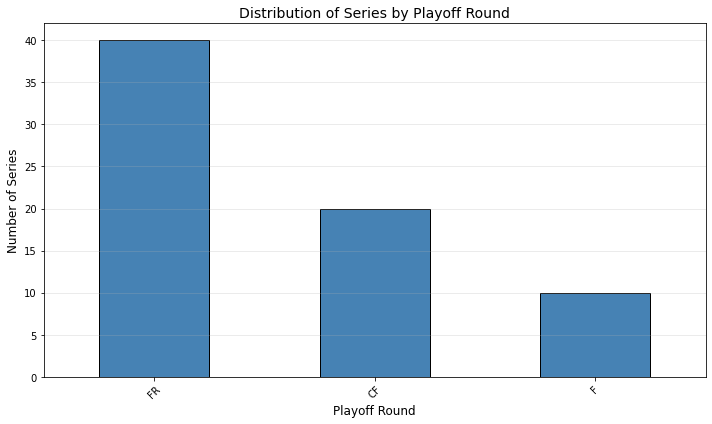

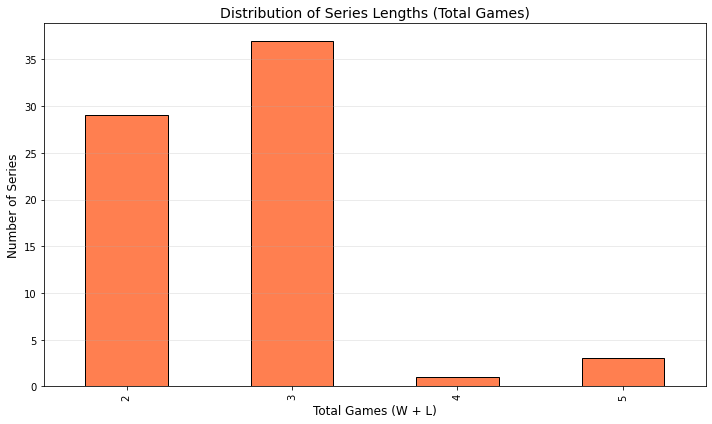

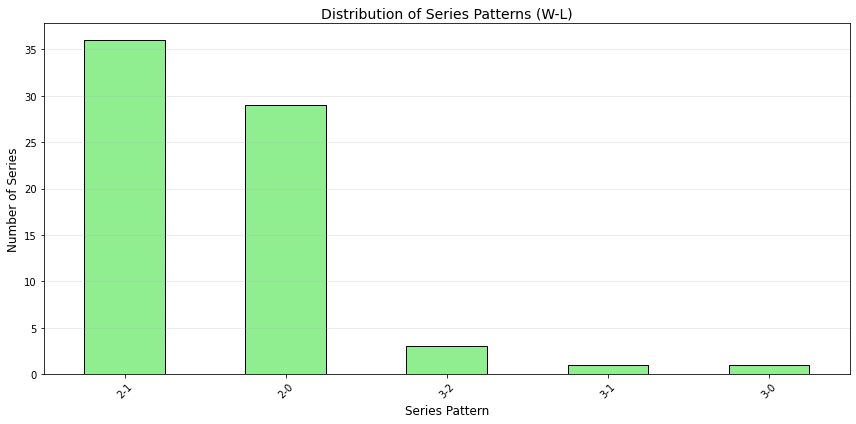

<Figure size 864x432 with 0 Axes>

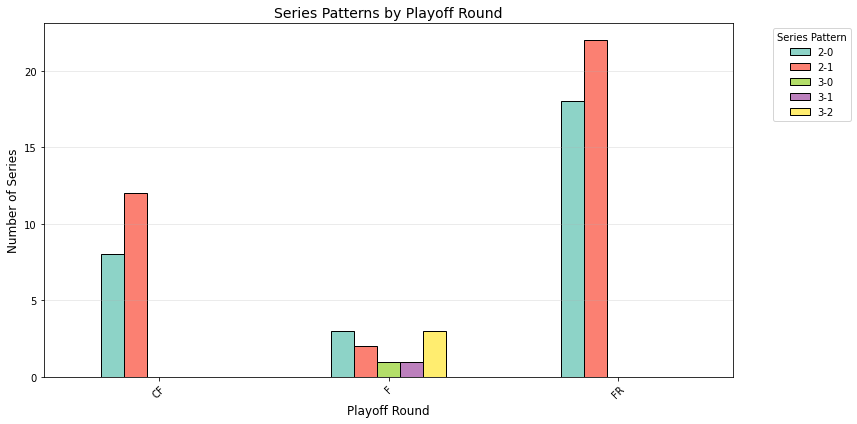


Top 15 teams by playoff series wins:
     Wins  Losses  Total_Series  Win_Rate
DET    12       4            16  0.750000
LAS    12       7            19  0.631579
SAC     8       7            15  0.533333
NYL     7       7            14  0.500000
CON     6       6            12  0.500000
PHO     6       1             7  0.857143
HOU     4       5             9  0.444444
IND     4       6            10  0.400000
SAS     3       3             6  0.500000
SEA     3       6             9  0.333333
CHA     2       3             5  0.400000
WAS     1       5             6  0.166667
CLE     1       3             4  0.250000
UTA     1       2             3  0.333333
ATL     0       1             1  0.000000


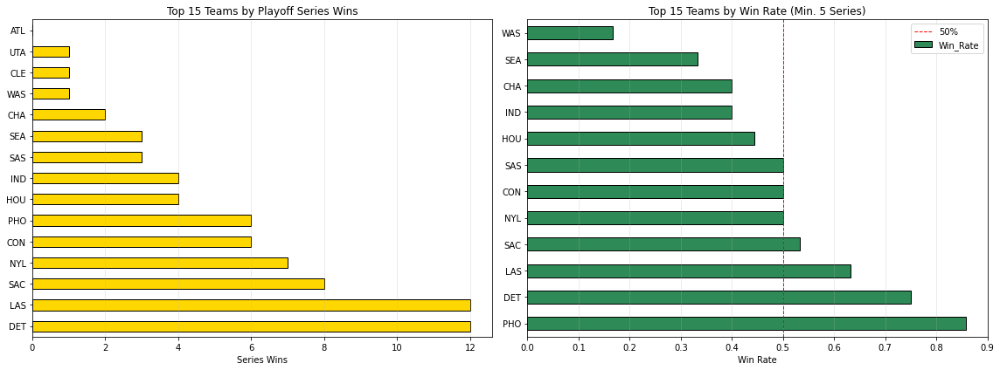

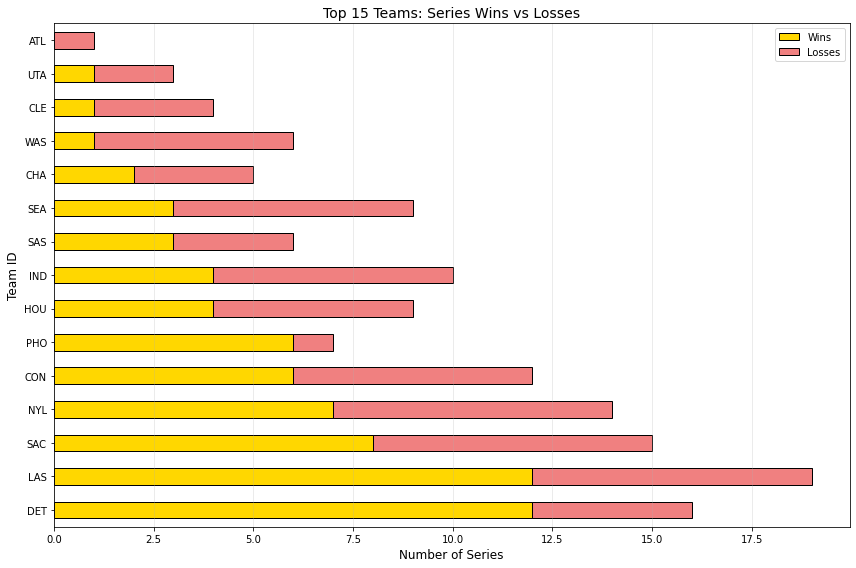


Total sweeps: 30 (42.9%)
Sweeps by round:
FR    18
CF     8
F      4
Name: round, dtype: int64


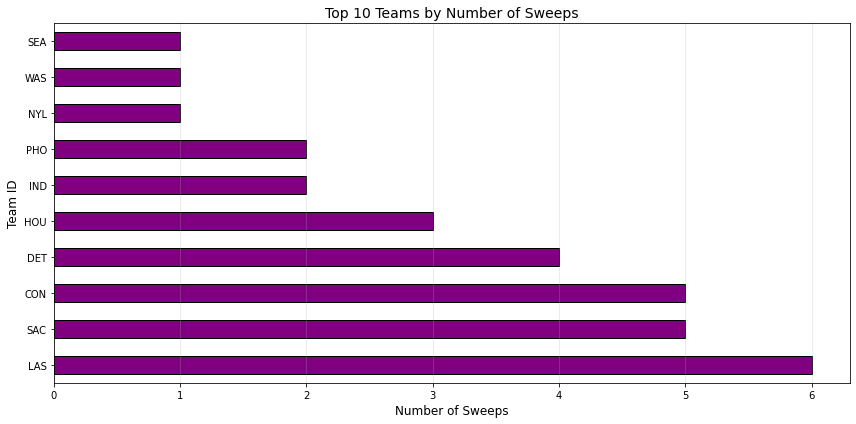


Close series (decided by 1 game): 39 (55.7%)


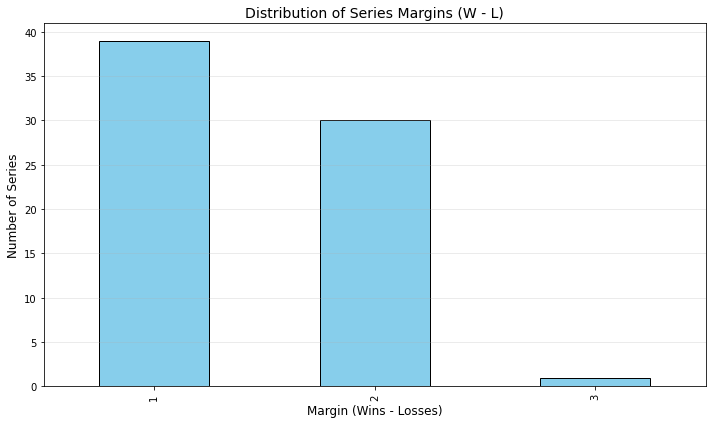

In [67]:
# Descriptive analysis

print("\n=== DESCRIPTIVE STATISTICS ===")
print(series_post.describe())

# Statistics by round
print("\nDescriptive statistics by playoff round:")
print(series_post.groupby('round')[['W', 'L', 'total_games']].describe())

# Distribution by playoff round
plt.figure(figsize=(10, 6))
round_counts = series_post['round'].value_counts()
round_counts.plot(kind='bar', color='steelblue', edgecolor='black')
plt.title('Distribution of Series by Playoff Round', fontsize=14)
plt.xlabel('Playoff Round', fontsize=12)
plt.ylabel('Number of Series', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Distribution of series lengths
plt.figure(figsize=(10, 6))
series_post['total_games'].value_counts().sort_index().plot(
    kind='bar', color='coral', edgecolor='black')
plt.title('Distribution of Series Lengths (Total Games)', fontsize=14)
plt.xlabel('Total Games (W + L)', fontsize=12)
plt.ylabel('Number of Series', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Distribution of W-L patterns
series_post['series_pattern'] = series_post['W'].astype(str) + '-' + series_post['L'].astype(str)
plt.figure(figsize=(12, 6))
series_post['series_pattern'].value_counts().plot(kind='bar', color='lightgreen', edgecolor='black')
plt.title('Distribution of Series Patterns (W-L)', fontsize=14)
plt.xlabel('Series Pattern', fontsize=12)
plt.ylabel('Number of Series', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Series patterns by round
pattern_by_round = pd.crosstab(series_post['round'], series_post['series_pattern'])
plt.figure(figsize=(12, 6))
pattern_by_round.plot(kind='bar', stacked=False, figsize=(12, 6), 
                      colormap='Set3', edgecolor='black')
plt.title('Series Patterns by Playoff Round', fontsize=14)
plt.xlabel('Playoff Round', fontsize=12)
plt.ylabel('Number of Series', fontsize=12)
plt.legend(title='Series Pattern', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Count wins and losses per team
team_wins = series_post['tmIDWinner'].value_counts()
team_losses = series_post['tmIDLoser'].value_counts()

# Combine into single dataframe
team_performance = pd.DataFrame({
    'Wins': team_wins,
    'Losses': team_losses
}).fillna(0).astype(int)
team_performance['Total_Series'] = team_performance['Wins'] + team_performance['Losses']
team_performance['Win_Rate'] = team_performance['Wins'] / team_performance['Total_Series']
team_performance = team_performance.sort_values('Wins', ascending=False)

print("\nTop 15 teams by playoff series wins:")
print(team_performance.head(15))

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Top 15 by total series wins
team_performance.head(15)['Wins'].plot(kind='barh', ax=axes[0], 
                                        color='gold', edgecolor='black')
axes[0].set_title('Top 15 Teams by Playoff Series Wins', fontsize=12)
axes[0].set_xlabel('Series Wins')
axes[0].grid(axis='x', alpha=0.3)

# Top 15 by win rate (minimum 5 series)
qualified_teams = team_performance[team_performance['Total_Series'] >= 5]
qualified_teams.sort_values('Win_Rate', ascending=False).head(15)['Win_Rate'].plot(
    kind='barh', ax=axes[1], color='seagreen', edgecolor='black')
axes[1].set_title('Top 15 Teams by Win Rate (Min. 5 Series)', fontsize=12)
axes[1].set_xlabel('Win Rate')
axes[1].axvline(0.5, color='red', linestyle='--', linewidth=1, label='50%')
axes[1].legend()
axes[1].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

# Stacked bar: Wins vs Losses for top teams
top_15_teams = team_performance.head(15)
fig, ax = plt.subplots(figsize=(12, 8))
top_15_teams[['Wins', 'Losses']].plot(kind='barh', stacked=True, ax=ax,
                                       color=['gold', 'lightcoral'], edgecolor='black')
plt.title('Top 15 Teams: Series Wins vs Losses', fontsize=14)
plt.xlabel('Number of Series', fontsize=12)
plt.ylabel('Team ID', fontsize=12)
plt.legend(['Wins', 'Losses'])
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# Identify sweeps (L = 0)
sweeps = series_post[series_post['L'] == 0]
print(f"\nTotal sweeps: {len(sweeps)} ({len(sweeps)/len(series_post)*100:.1f}%)")
print(f"Sweeps by round:\n{sweeps['round'].value_counts()}")

# Teams that swept most often
sweep_leaders = sweeps['tmIDWinner'].value_counts().head(10)
plt.figure(figsize=(12, 6))
sweep_leaders.plot(kind='barh', color='purple', edgecolor='black')
plt.title('Top 10 Teams by Number of Sweeps', fontsize=14)
plt.xlabel('Number of Sweeps', fontsize=12)
plt.ylabel('Team ID', fontsize=12)
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# Identify close series (decided by 1 game)
series_post['margin'] = series_post['W'] - series_post['L']
close_series = series_post[series_post['margin'] == 1]
print(f"\nClose series (decided by 1 game): {len(close_series)} ({len(close_series)/len(series_post)*100:.1f}%)")

# Distribution of margins
plt.figure(figsize=(10, 6))
series_post['margin'].value_counts().sort_index().plot(kind='bar', 
                                                        color='skyblue', edgecolor='black')
plt.title('Distribution of Series Margins (W - L)', fontsize=14)
plt.xlabel('Margin (Wins - Losses)', fontsize=12)
plt.ylabel('Number of Series', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()


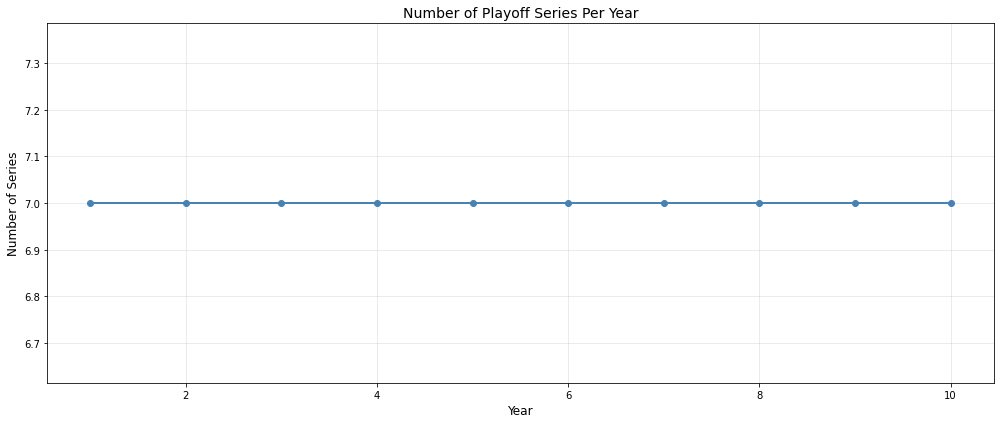

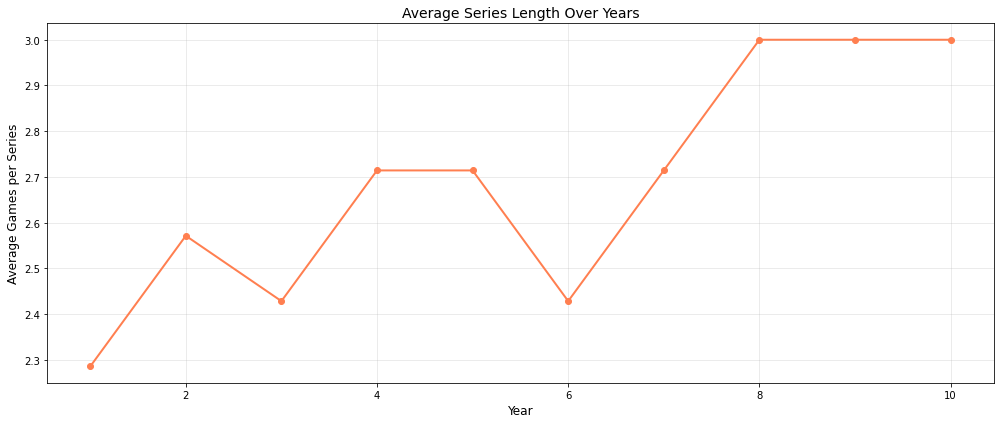

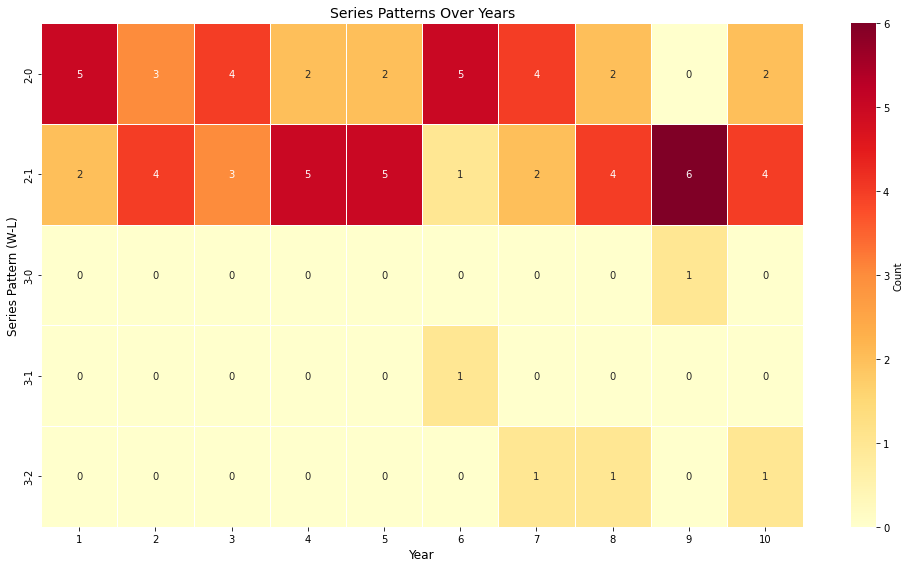

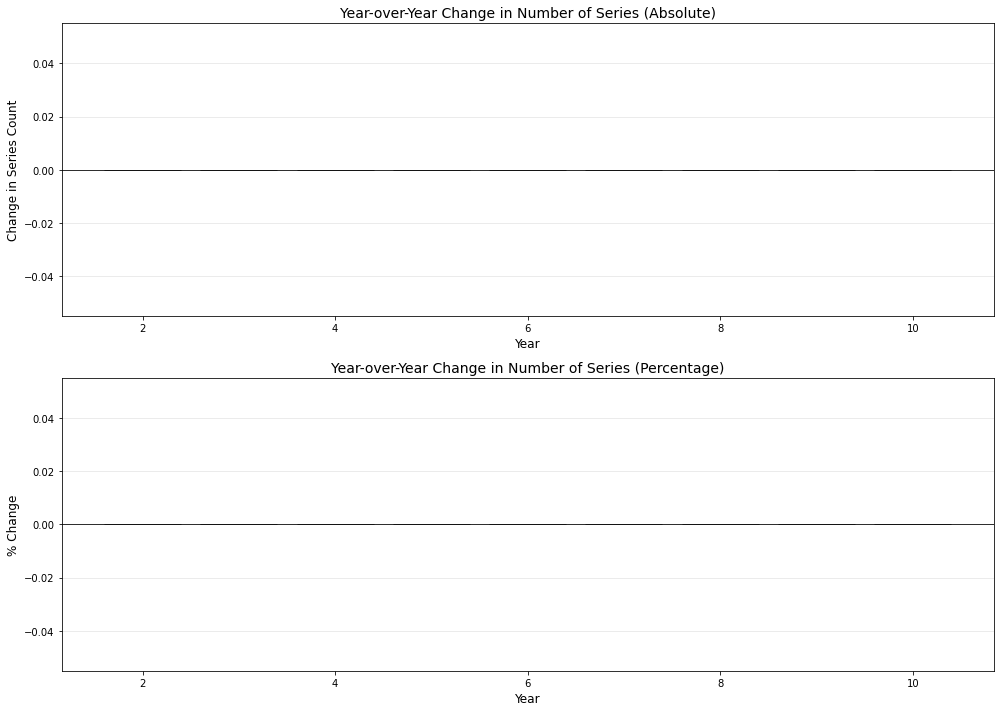

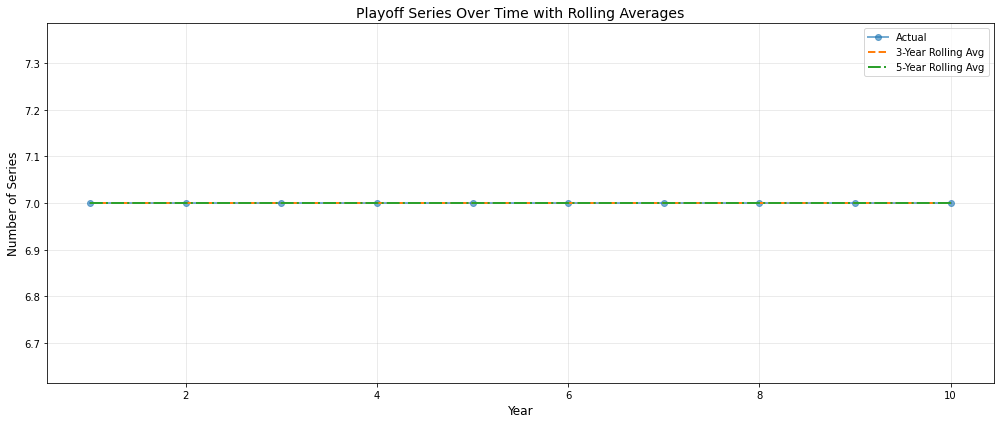

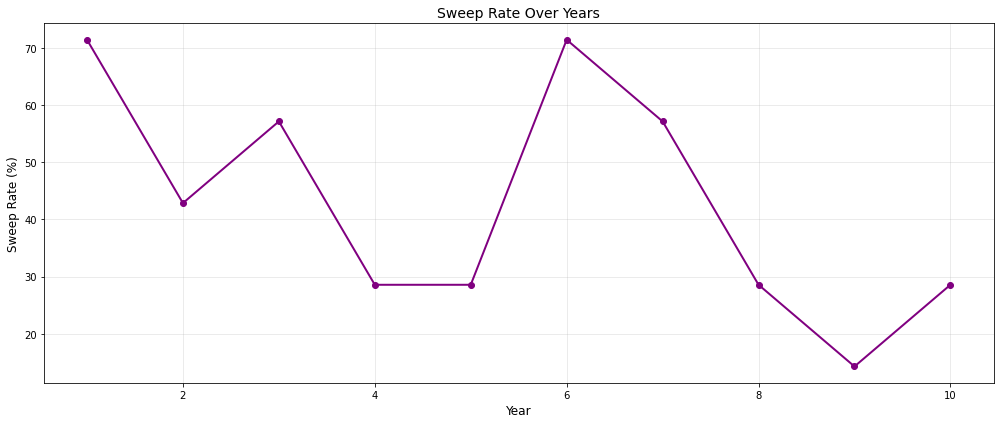

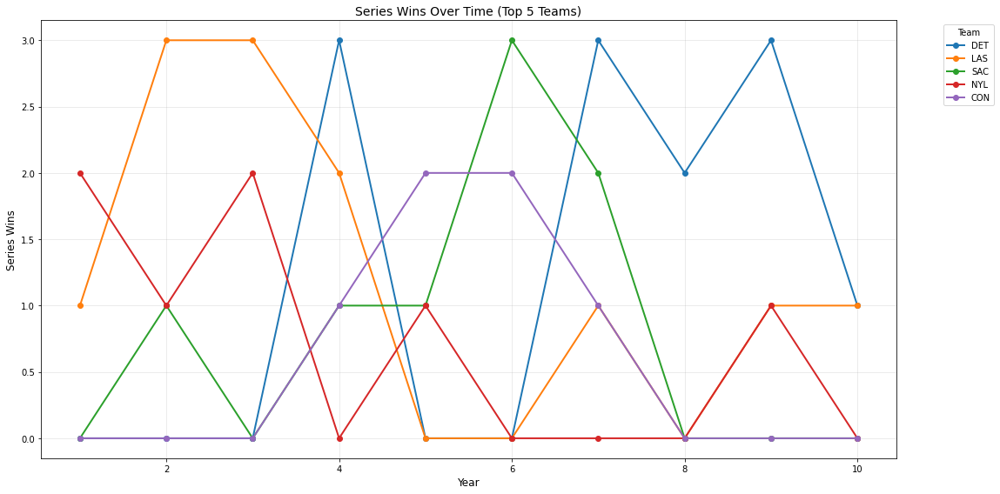

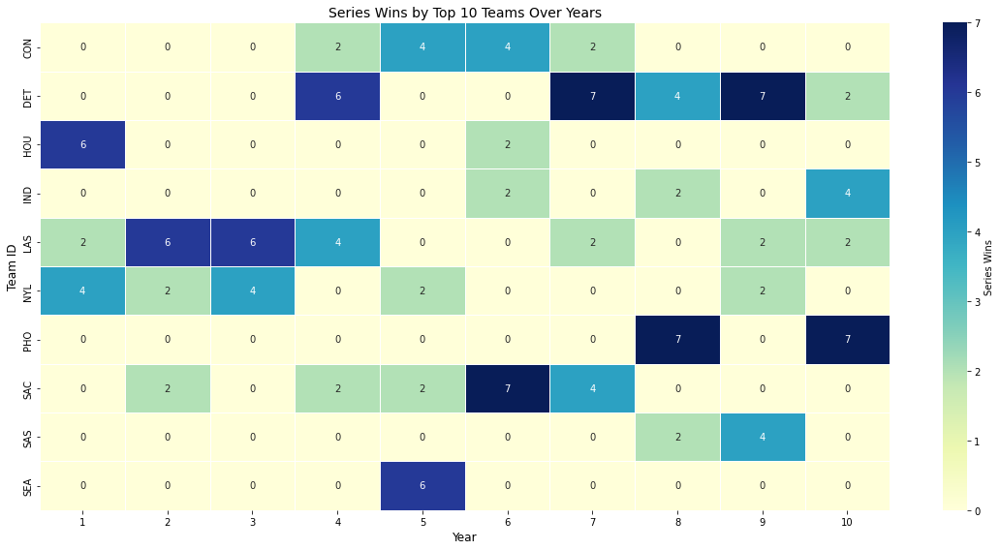

In [68]:
# Temporal analysis

# Series per year
series_per_year = series_post.groupby('year').size()

plt.figure(figsize=(14, 6))
series_per_year.plot(kind='line', marker='o', color='steelblue', linewidth=2)
plt.title('Number of Playoff Series Per Year', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of Series', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Average series length over time
avg_length_per_year = series_post.groupby('year')['total_games'].mean()

plt.figure(figsize=(14, 6))
avg_length_per_year.plot(kind='line', marker='o', color='coral', linewidth=2)
plt.title('Average Series Length Over Years', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Average Games per Series', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Heatmap: Series patterns over years
pattern_year_heatmap = series_post.groupby(['year', 'series_pattern']).size().unstack(fill_value=0)
plt.figure(figsize=(14, 8))
sns.heatmap(pattern_year_heatmap.T, cmap='YlOrRd', linewidths=0.5, 
            cbar_kws={'label': 'Count'}, annot=True, fmt='d')
plt.title('Series Patterns Over Years', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Series Pattern (W-L)', fontsize=12)
plt.tight_layout()
plt.show()

# Total series per year
yoy_change = series_per_year.diff()
yoy_pct_change = series_per_year.pct_change() * 100

fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# Absolute change
axes[0].bar(yoy_change.index, yoy_change.values, 
            color=['green' if x > 0 else 'red' for x in yoy_change.values],
            edgecolor='black', alpha=0.7)
axes[0].axhline(0, color='black', linewidth=0.8)
axes[0].set_title('Year-over-Year Change in Number of Series (Absolute)', fontsize=14)
axes[0].set_xlabel('Year', fontsize=12)
axes[0].set_ylabel('Change in Series Count', fontsize=12)
axes[0].grid(axis='y', alpha=0.3)

# Percentage change
axes[1].bar(yoy_pct_change.index, yoy_pct_change.values,
            color=['green' if x > 0 else 'red' for x in yoy_pct_change.values],
            edgecolor='black', alpha=0.7)
axes[1].axhline(0, color='black', linewidth=0.8)
axes[1].set_title('Year-over-Year Change in Number of Series (Percentage)', fontsize=14)
axes[1].set_xlabel('Year', fontsize=12)
axes[1].set_ylabel('% Change', fontsize=12)
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Rolling averages
rolling_avg_3y = series_per_year.rolling(window=3, min_periods=1).mean()
rolling_avg_5y = series_per_year.rolling(window=5, min_periods=1).mean()

plt.figure(figsize=(14, 6))
plt.plot(series_per_year.index, series_per_year.values, 
         marker='o', label='Actual', linewidth=2, alpha=0.6)
plt.plot(rolling_avg_3y.index, rolling_avg_3y.values,
         label='3-Year Rolling Avg', linewidth=2, linestyle='--')
plt.plot(rolling_avg_5y.index, rolling_avg_5y.values,
         label='5-Year Rolling Avg', linewidth=2, linestyle='-.')
plt.title('Playoff Series Over Time with Rolling Averages', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of Series', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Sweep rate over time
sweep_rate_per_year = series_post.groupby('year').apply(
    lambda x: (x['L'] == 0).sum() / len(x) * 100
)

plt.figure(figsize=(14, 6))
sweep_rate_per_year.plot(kind='line', marker='o', color='purple', linewidth=2)
plt.title('Sweep Rate Over Years', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Sweep Rate (%)', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Track top teams' series wins over time
top_5_teams = team_performance.head(5).index

team_wins_by_year = series_post[series_post['tmIDWinner'].isin(top_5_teams)].groupby(
    ['year', 'tmIDWinner']).size().unstack(fill_value=0)

plt.figure(figsize=(16, 8))
for team in top_5_teams:
    if team in team_wins_by_year.columns:
        plt.plot(team_wins_by_year.index, team_wins_by_year[team], 
                marker='o', label=team, linewidth=2)

plt.title('Series Wins Over Time (Top 5 Teams)', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Series Wins', fontsize=12)
plt.legend(title='Team', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Heatmap: Team performance over years (top 10 teams)
top_10_teams = team_performance.head(10).index
team_year_matrix = series_post[series_post['tmIDWinner'].isin(top_10_teams)].pivot_table(
    index='tmIDWinner', columns='year', values='W', aggfunc='sum', fill_value=0
)

plt.figure(figsize=(16, 8))
sns.heatmap(team_year_matrix, cmap='YlGnBu', linewidths=0.5, 
            cbar_kws={'label': 'Series Wins'}, annot=True, fmt='d')
plt.title('Series Wins by Top 10 Teams Over Years', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Team ID', fontsize=12)
plt.tight_layout()
plt.show()


<Figure size 864x432 with 0 Axes>

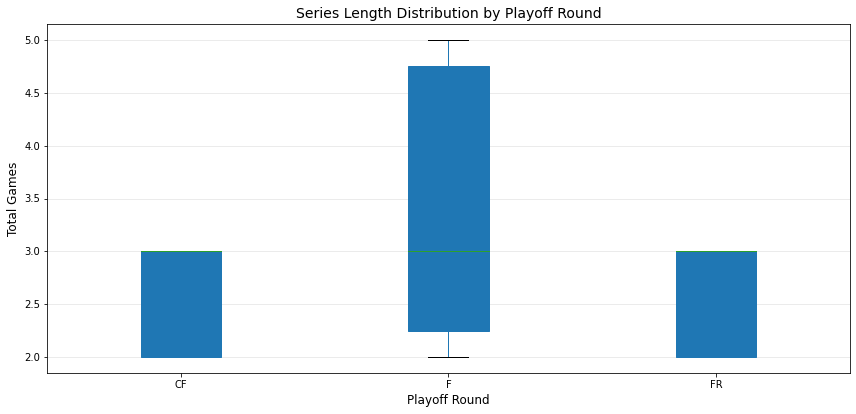

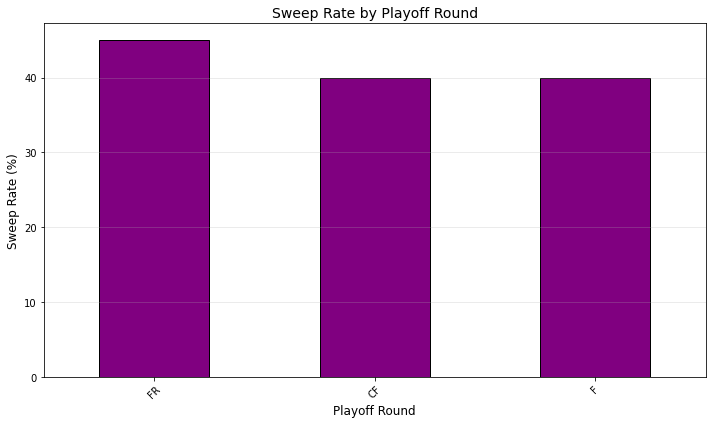

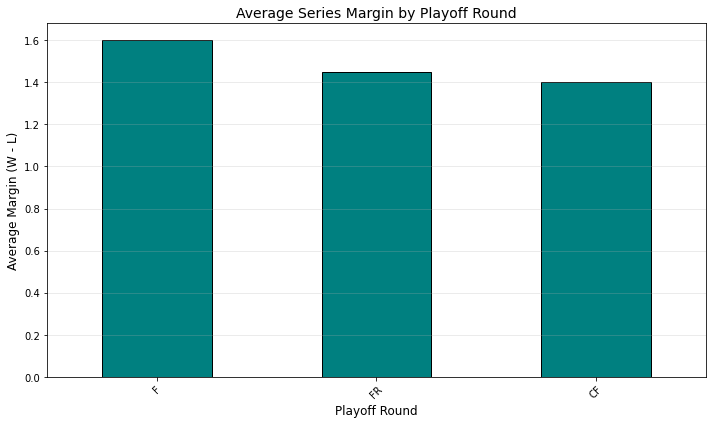

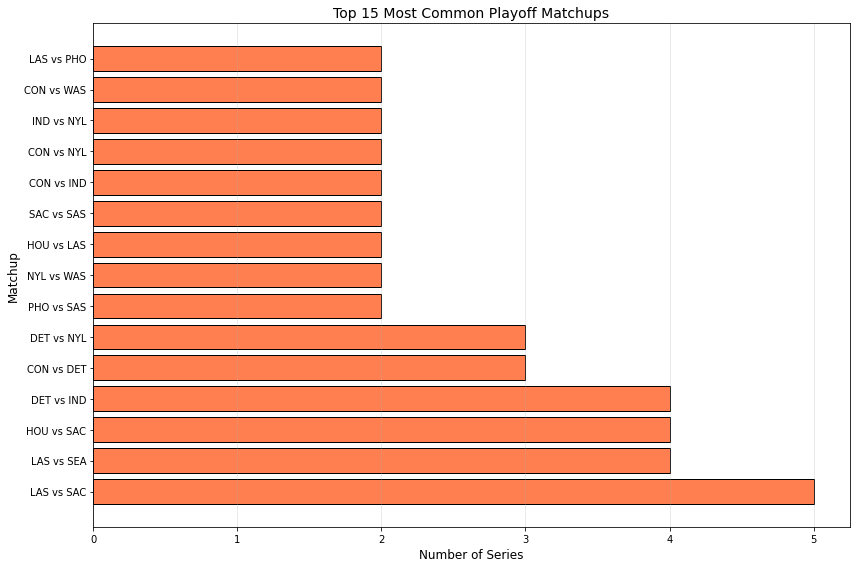


Head-to-head records for top 5 matchups:
LAS vs SAC: 2-3
LAS vs SEA: 4-0
HOU vs SAC: 1-3
DET vs IND: 3-1
CON vs DET: 1-2

Teams that never lost a playoff series: 0

Teams with perfect record in CF:
  PHO: 2-0
  CHA: 1-0
  SEA: 1-0

Teams with perfect record in F:
  PHO: 2-0
  HOU: 1-0
  SEA: 1-0


In [69]:
# Comparative Analysis

# Series length by round
plt.figure(figsize=(12, 6))
series_post.boxplot(column='total_games', by='round', figsize=(12, 6),
                    patch_artist=True, grid=False)
plt.suptitle('')
plt.title('Series Length Distribution by Playoff Round', fontsize=14)
plt.xlabel('Playoff Round', fontsize=12)
plt.ylabel('Total Games', fontsize=12)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Sweep rate by round
sweep_rate_by_round = series_post.groupby('round').apply(
    lambda x: (x['L'] == 0).sum() / len(x) * 100
).sort_values(ascending=False)

plt.figure(figsize=(10, 6))
sweep_rate_by_round.plot(kind='bar', color='purple', edgecolor='black')
plt.title('Sweep Rate by Playoff Round', fontsize=14)
plt.xlabel('Playoff Round', fontsize=12)
plt.ylabel('Sweep Rate (%)', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Average margin by round
avg_margin_by_round = series_post.groupby('round')['margin'].mean().sort_values(ascending=False)

plt.figure(figsize=(10, 6))
avg_margin_by_round.plot(kind='bar', color='teal', edgecolor='black')
plt.title('Average Series Margin by Playoff Round', fontsize=14)
plt.xlabel('Playoff Round', fontsize=12)
plt.ylabel('Average Margin (W - L)', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Most common matchups
matchup_counts = series_post.groupby('matchup').size().sort_values(ascending=False).head(15)
matchup_labels = [f"{m[0]} vs {m[1]}" for m in matchup_counts.index]

plt.figure(figsize=(12, 8))
plt.barh(range(len(matchup_counts)), matchup_counts.values, color='coral', edgecolor='black')
plt.yticks(range(len(matchup_counts)), matchup_labels)
plt.title('Top 15 Most Common Playoff Matchups', fontsize=14)
plt.xlabel('Number of Series', fontsize=12)
plt.ylabel('Matchup', fontsize=12)
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# Head-to-head records for top matchups
print("\nHead-to-head records for top 5 matchups:")
for matchup in matchup_counts.head(5).index:
    matchup_data = series_post[series_post['matchup'] == matchup]
    team1, team2 = matchup
    team1_wins = ((matchup_data['tmIDWinner'] == team1)).sum()
    team2_wins = ((matchup_data['tmIDWinner'] == team2)).sum()
    print(f"{team1} vs {team2}: {team1_wins}-{team2_wins}")

# Teams that never lost a series (if any)
teams_never_lost = team_performance[team_performance['Losses'] == 0]
print(f"\nTeams that never lost a playoff series: {len(teams_never_lost)}")
if len(teams_never_lost) > 0:
    print(teams_never_lost)

# Teams with perfect records in specific rounds
for round_name in series_post['round'].unique():
    round_data = series_post[series_post['round'] == round_name]
    round_winners = round_data['tmIDWinner'].value_counts()
    round_losers = round_data['tmIDLoser'].value_counts()
    
    perfect_teams = []
    for team in round_winners.index:
        if team not in round_losers.index:
            perfect_teams.append((team, round_winners[team]))
    
    if perfect_teams:
        print(f"\nTeams with perfect record in {round_name}:")
        for team, wins in perfect_teams:
            print(f"  {team}: {wins}-0")


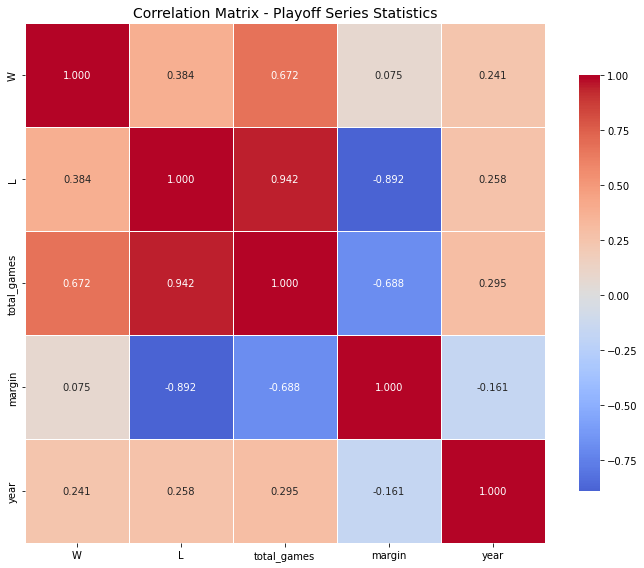


=== CORRELATION ANALYSIS ===

Correlations with p-values:
W vs L: r=0.384, p=0.0010 **
W vs total_games: r=0.672, p=0.0000 ***
L vs total_games: r=0.942, p=0.0000 ***

=== CHI-SQUARE TESTS ===

1. Series patterns across playoff rounds:
Chi-square statistic: 32.7538
P-value: 0.0001
Degrees of freedom: 8
Significant association: Yes

2. Sweep occurrence across playoff rounds:
Chi-square statistic: 0.1750
P-value: 0.9162
Significant association: No

=== ANOVA & KRUSKAL-WALLIS TESTS ===

1. ANOVA: Series length across rounds
F-statistic: 6.8908
P-value: 0.0019
Significant difference: Yes

2. Kruskal-Wallis: Series length across rounds
H-statistic: 4.3175
P-value: 0.1155
Significant difference: No

=== NORMALITY TESTS ===
W: W=0.2817, p=0.0000 (Not Normal)
L: W=0.7266, p=0.0000 (Not Normal)
total_games: W=0.7098, p=0.0000 (Not Normal)
margin: W=0.6743, p=0.0000 (Not Normal)

=== BINOMIAL TEST ===
Observed sweeps: 30/70 (42.9%)
Expected sweep rate: 12.5%
P-value: 0.0000
Significant differen

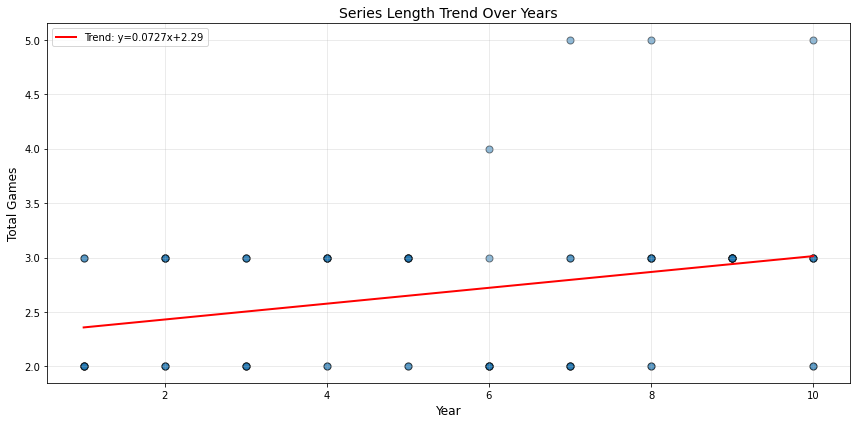

In [72]:
# Statistical analysis

from scipy import stats
from scipy.stats import chi2_contingency

# Correlation matrix
numeric_cols = ['W', 'L', 'total_games', 'margin', 'year']
correlation_matrix = series_post[numeric_cols].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".3f", cmap='coolwarm',
            center=0, square=True, linewidths=1, cbar_kws={"shrink": 0.8})
plt.title('Correlation Matrix - Playoff Series Statistics', fontsize=14)
plt.tight_layout()
plt.show()

# Correlation with p-values
print("\n=== CORRELATION ANALYSIS ===")
print("\nCorrelations with p-values:")
corr_pairs = [('W', 'L'), ('W', 'total_games'), ('L', 'total_games')]
for var1, var2 in corr_pairs:
    corr, pval = stats.pearsonr(series_post[var1], series_post[var2])
    sig = '***' if pval < 0.001 else '**' if pval < 0.01 else '*' if pval < 0.05 else 'ns'
    print(f"{var1} vs {var2}: r={corr:.3f}, p={pval:.4f} {sig}")

print("\n=== CHI-SQUARE TESTS ===")

# Test if series patterns are uniformly distributed across rounds
contingency_pattern_round = pd.crosstab(series_post['round'], series_post['series_pattern'])
chi2, p_value, dof, expected = chi2_contingency(contingency_pattern_round)

print("\n1. Series patterns across playoff rounds:")
print(f"Chi-square statistic: {chi2:.4f}")
print(f"P-value: {p_value:.4f}")
print(f"Degrees of freedom: {dof}")
print(f"Significant association: {'Yes' if p_value < 0.05 else 'No'}")

# Test if sweeps are equally likely across rounds
series_post['is_sweep'] = (series_post['L'] == 0).astype(int)
contingency_sweep_round = pd.crosstab(series_post['round'], series_post['is_sweep'])
chi2_sweep, p_sweep, dof_sweep, _ = chi2_contingency(contingency_sweep_round)

print("\n2. Sweep occurrence across playoff rounds:")
print(f"Chi-square statistic: {chi2_sweep:.4f}")
print(f"P-value: {p_sweep:.4f}")
print(f"Significant association: {'Yes' if p_sweep < 0.05 else 'No'}")

print("\n=== ANOVA & KRUSKAL-WALLIS TESTS ===")

# Compare series length across rounds
rounds = series_post['round'].unique()
round_groups = [series_post[series_post['round'] == r]['total_games'].values for r in rounds]

# ANOVA (parametric)
f_stat, p_anova = stats.f_oneway(*round_groups)
print("\n1. ANOVA: Series length across rounds")
print(f"F-statistic: {f_stat:.4f}")
print(f"P-value: {p_anova:.4f}")
print(f"Significant difference: {'Yes' if p_anova < 0.05 else 'No'}")

# Kruskal-Wallis (non-parametric alternative)
h_stat, p_kruskal = stats.kruskal(*round_groups)
print("\n2. Kruskal-Wallis: Series length across rounds")
print(f"H-statistic: {h_stat:.4f}")
print(f"P-value: {p_kruskal:.4f}")
print(f"Significant difference: {'Yes' if p_kruskal < 0.05 else 'No'}")

print("\n=== NORMALITY TESTS ===")

for col in ['W', 'L', 'total_games', 'margin']:
    stat, p_value = stats.shapiro(series_post[col].dropna())
    print(f"{col}: W={stat:.4f}, p={p_value:.4f} {'(Normal)' if p_value > 0.05 else '(Not Normal)'}")

# Test if sweep rate is significantly different from expected
# Best-of-5: P(sweep) = 0.5^3 = 0.125 (12.5%)

n_series = len(series_post)
n_sweeps = len(sweeps)
expected_sweep_rate = 0.125

binom_test_result = stats.binomtest(n_sweeps, n_series, expected_sweep_rate, alternative='two-sided')
print(f"\n=== BINOMIAL TEST ===")
print(f"Observed sweeps: {n_sweeps}/{n_series} ({n_sweeps/n_series*100:.1f}%)")
print(f"Expected sweep rate: {expected_sweep_rate*100:.1f}%")
print(f"P-value: {binom_test_result.pvalue:.4f}")
print(f"Significant difference: {'Yes' if binom_test_result.pvalue < 0.05 else 'No'}")

# Test for temporal trend in series length
years = series_post['year'].values
lengths = series_post['total_games'].values

slope, intercept, r_value, p_value, std_err = stats.linregress(years, lengths)
print(f"\n=== TEMPORAL TREND ANALYSIS ===")
print(f"Series length vs year:")
print(f"Slope: {slope:.4f} games/year")
print(f"R-squared: {r_value**2:.4f}")
print(f"P-value: {p_value:.4f}")
print(f"Significant trend: {'Yes' if p_value < 0.05 else 'No'}")

plt.figure(figsize=(12, 6))
plt.scatter(years, lengths, alpha=0.5, edgecolors='black', s=50)
plt.plot(years, slope * years + intercept, 'r-', linewidth=2, 
         label=f'Trend: y={slope:.4f}x+{intercept:.2f}')
plt.title('Series Length Trend Over Years', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Total Games', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


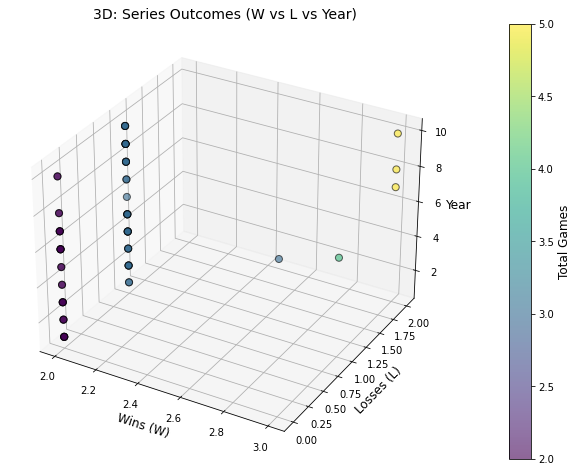

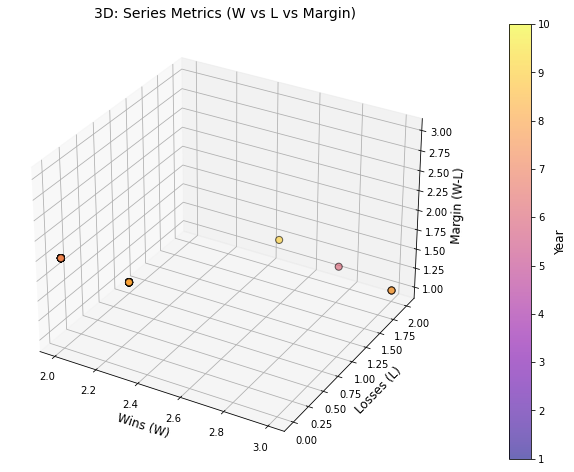

/tmp/ipykernel_6979/2150748895.py:58: UserWarning: Z contains NaN values. This may result in rendering artifacts.
  surf = ax.plot_surface(W_grid, L_grid, total_games_grid,


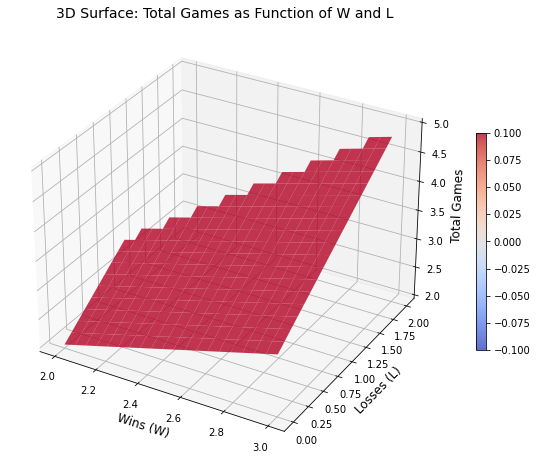

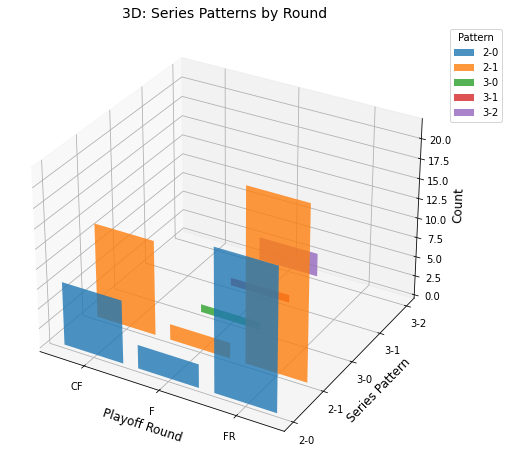

In [76]:
# 3D Visualizations

from mpl_toolkits.mplot3d import Axes3D

# 3D: W vs L vs Year
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(series_post['W'], series_post['L'], series_post['year'],
                     c=series_post['total_games'], cmap='viridis', 
                     s=50, alpha=0.6, edgecolors='black')

ax.set_xlabel('Wins (W)', fontsize=12)
ax.set_ylabel('Losses (L)', fontsize=12)
ax.set_zlabel('Year', fontsize=12)
ax.set_title('3D: Series Outcomes (W vs L vs Year)', fontsize=14)

cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label('Total Games', fontsize=12)

plt.show()

# 3D: W vs L vs Margin
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(series_post['W'], series_post['L'], series_post['margin'],
                     c=series_post['year'], cmap='plasma',
                     s=50, alpha=0.6, edgecolors='black')

ax.set_xlabel('Wins (W)', fontsize=12)
ax.set_ylabel('Losses (L)', fontsize=12)
ax.set_zlabel('Margin (W-L)', fontsize=12)
ax.set_title('3D: Series Metrics (W vs L vs Margin)', fontsize=14)

cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label('Year', fontsize=12)

plt.show()

# Create grid for W and L
from scipy.interpolate import griddata

W_range = np.linspace(series_post['W'].min(), series_post['W'].max(), 20)
L_range = np.linspace(series_post['L'].min(), series_post['L'].max(), 20)
W_grid, L_grid = np.meshgrid(W_range, L_range)

# Interpolate total_games
total_games_grid = griddata(
    (series_post['W'], series_post['L']),
    series_post['total_games'],
    (W_grid, L_grid),
    method='linear'
)

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(W_grid, L_grid, total_games_grid, 
                       cmap='coolwarm', alpha=0.8, edgecolor='none')

ax.set_xlabel('Wins (W)', fontsize=12)
ax.set_ylabel('Losses (L)', fontsize=12)
ax.set_zlabel('Total Games', fontsize=12)
ax.set_title('3D Surface: Total Games as Function of W and L', fontsize=14)

plt.colorbar(surf, ax=ax, shrink=0.5)
plt.show()

# Series patterns by round (3D bar chart)
pattern_round_counts = pd.crosstab(series_post['round'], series_post['series_pattern'])

fig = plt.figure(figsize=(14, 8))
ax = fig.add_subplot(111, projection='3d')

rounds = pattern_round_counts.index
patterns = pattern_round_counts.columns
x_pos = np.arange(len(rounds))
y_pos = np.arange(len(patterns))

for i, pattern in enumerate(patterns):
    ax.bar(x_pos, pattern_round_counts[pattern].values, 
           zs=i, zdir='y', alpha=0.8, label=pattern)

ax.set_xlabel('Playoff Round', fontsize=12)
ax.set_ylabel('Series Pattern', fontsize=12)
ax.set_zlabel('Count', fontsize=12)
ax.set_title('3D: Series Patterns by Round', fontsize=14)
ax.set_xticks(x_pos)
ax.set_xticklabels(rounds)
ax.set_yticks(y_pos)
ax.set_yticklabels(patterns)
ax.legend(title='Pattern', bbox_to_anchor=(1.15, 1))

plt.show()


## Data Analysis `players.csv`

Dataset shape: (893, 10)

First few rows:
        bioID  pos  firstseason  lastseason  height  weight  \
0  abrahta01w    C            0           0    74.0     190   
1  abrossv01w    F            0           0    74.0     169   
2  adairje01w    C            0           0    76.0     197   
3  adamsda01w  F-C            0           0    73.0     239   
4  adamsjo01w    C            0           0    75.0     180   
5  adamsmi01w  NaN            0           0     0.0       0   
6  adubari99w  NaN            0           0     0.0       0   
7  aglerbr99w  NaN            0           0     0.0       0   
8  aguilel01w    G            0           0    67.0     165   
9  ajavoma01w    G            0           0    68.0     160   

             college            collegeOther   birthDate   deathDate  
0  George Washington                     NaN  1975-09-27  0000-00-00  
1        Connecticut                     NaN  1980-07-09  0000-00-00  
2  George Washington                     NaN  1986-

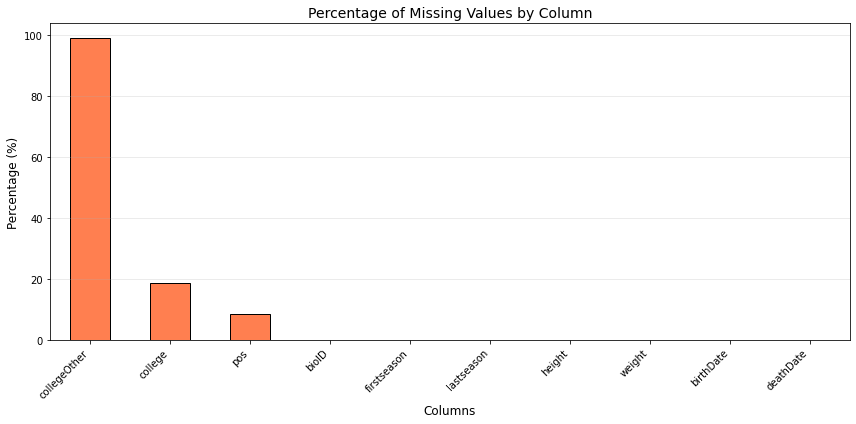


Missing value patterns:
Players with no height: 0
Players with no weight: 0
Players with no birthDate: 0
Players with no college: 167
Players with no position: 78
Players with no firstseason: 0
Players with no lastseason: 0

Players missing both height and weight: 0
Players with deathDate recorded: 893


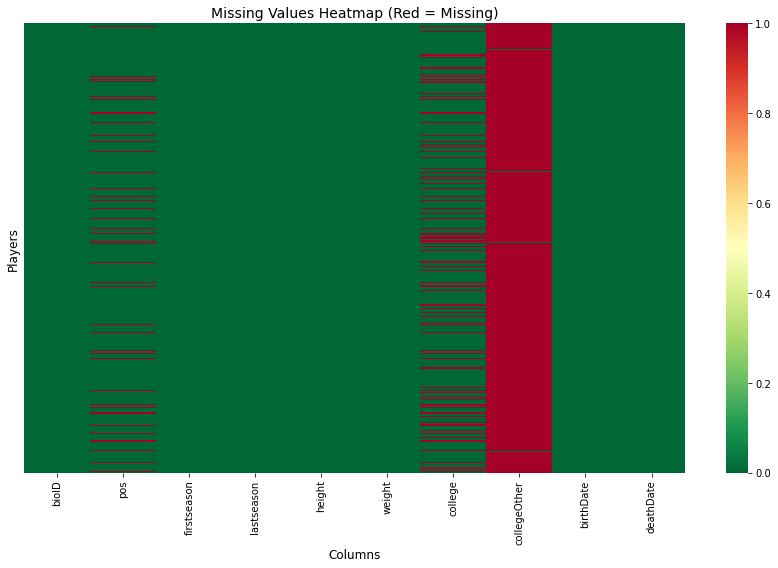


=== UNIQUENESS ===
Total duplicate rows: 0

Duplicate bioIDs: 0

Total players: 893
Unique bioIDs: 893
bioID is unique: True

=== CONSISTENCY ===

Height statistics (inches):
count    893.000000
mean      65.500560
std       20.940425
min        0.000000
25%       68.000000
50%       72.000000
75%       75.000000
max       80.000000
Name: height, dtype: float64

Weight statistics (pounds):
count    893.000000
mean     145.415454
std       61.275703
min        0.000000
25%      140.000000
50%      162.000000
75%      180.000000
max      254.000000
Name: weight, dtype: float64

Players with unreasonable height (<60 or >84 inches): 81
Players with unreasonable weight (<100 or >250 lbs): 121

Players with lastseason < firstseason: 0

Career length statistics:
count    893.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: career_length, dtype: float64

Players with future birth dates: 0
Players born before 1950: 0
Players with 

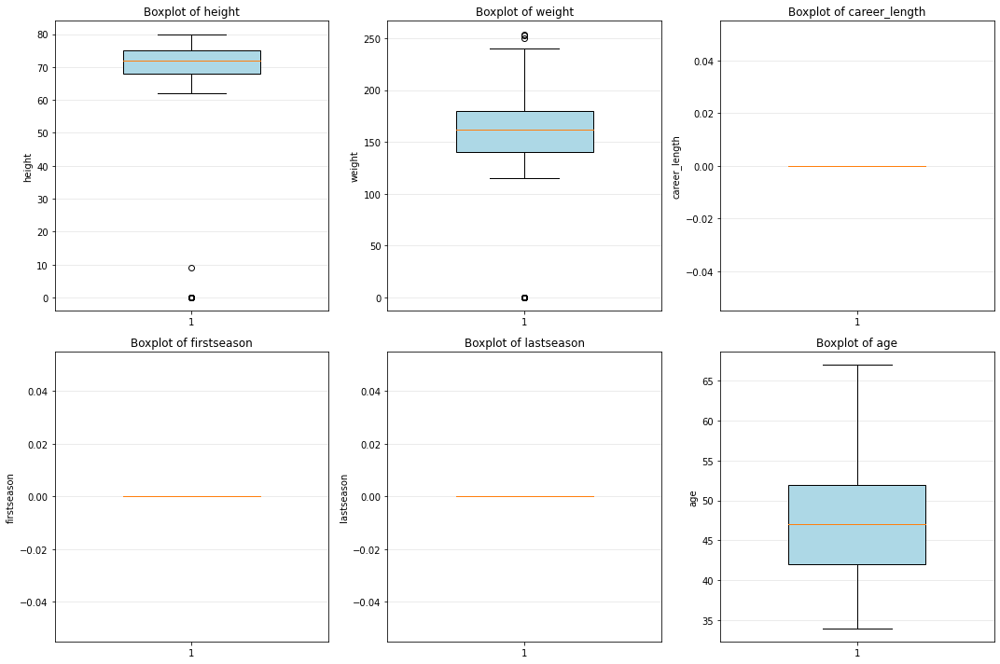


=== TIMELINESS ===

Birth year range: 1958 - 1991
Total years covered: 34


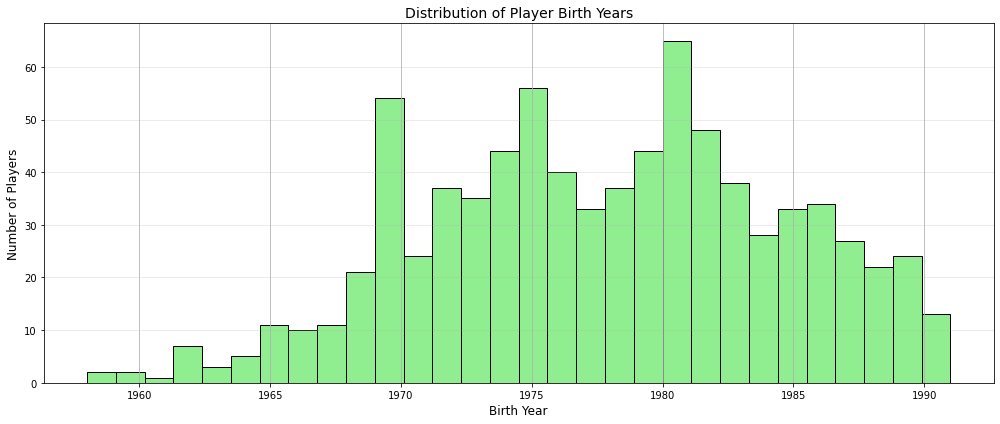


Career timeline:
Earliest first season: 0
Latest last season: 0


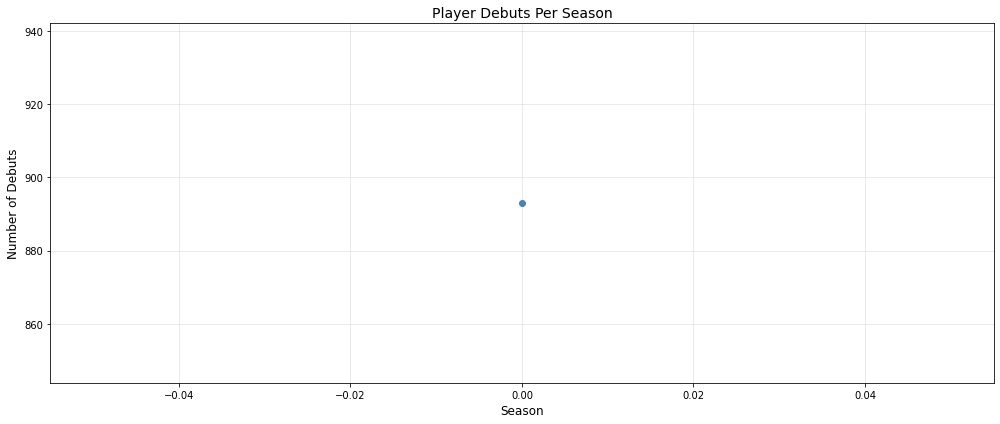


=== VALIDITY ===
No negative values in height
No negative values in weight
No negative values in firstseason
No negative values in lastseason
No negative values in career_length

Invalid bioIDs (too short): 0

Position values found: ['C', 'C-F', 'F', 'F-C', 'F-G', 'G', 'G-F']

BMI statistics:
count     813.000000
mean       23.927652
std        67.331232
min         0.000000
25%        21.184512
50%        22.315223
75%        23.627608
max      1935.609733
Name: bmi, dtype: float64
Players with unrealistic BMI (<15 or >40): 40

Age at debut statistics:
count     809.000000
mean    -1977.690977
std         6.736992
min     -1991.000000
25%     -1983.000000
50%     -1978.000000
75%     -1973.000000
max     -1958.000000
Name: age_at_debut, dtype: float64
Players with unreasonable debut age (<16 or >40): 809


In [87]:
# Data Quality

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats
from datetime import datetime

players = pd.read_csv('../dataset/players.csv')

print(f"Dataset shape: {players.shape}")
print(f"\nFirst few rows:")
print(players.head(10))
print(f"\nColumn names and types:")
print(players.dtypes)

missing_data = players.isnull().sum()
missing_percentage = (missing_data / len(players)) * 100

print("\n=== COMPLETENESS ===")
print("\nMissing values:")
print(pd.DataFrame({
    'Missing Count': missing_data,
    'Percentage': missing_percentage
}).sort_values('Percentage', ascending=False))

plt.figure(figsize=(12, 6))
missing_percentage.sort_values(ascending=False).plot(kind='bar', color='coral', edgecolor='black')
plt.title('Percentage of Missing Values by Column', fontsize=14)
plt.ylabel('Percentage (%)', fontsize=12)
plt.xlabel('Columns', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Missing value patterns
print("\nMissing value patterns:")
print(f"Players with no height: {players['height'].isnull().sum()}")
print(f"Players with no weight: {players['weight'].isnull().sum()}")
print(f"Players with no birthDate: {players['birthDate'].isnull().sum()}")
print(f"Players with no college: {players['college'].isnull().sum()}")
print(f"Players with no position: {players['pos'].isnull().sum()}")
print(f"Players with no firstseason: {players['firstseason'].isnull().sum()}")
print(f"Players with no lastseason: {players['lastseason'].isnull().sum()}")

# Players missing both height and weight
missing_both = players[players['height'].isnull() & players['weight'].isnull()]
print(f"\nPlayers missing both height and weight: {len(missing_both)}")

# Players with deathDate
deceased_players = players['deathDate'].notna().sum()
print(f"Players with deathDate recorded: {deceased_players}")

# Heatmap of missing values
plt.figure(figsize=(12, 8))
sns.heatmap(players.isnull(), cbar=True, yticklabels=False, cmap='RdYlGn_r')
plt.title('Missing Values Heatmap (Red = Missing)', fontsize=14)
plt.xlabel('Columns', fontsize=12)
plt.ylabel('Players', fontsize=12)
plt.tight_layout()
plt.show()

print("\n=== UNIQUENESS ===")

# Total duplicates
duplicates = players.duplicated().sum()
duplicate_rows = players[players.duplicated(keep=False)]

print(f"Total duplicate rows: {duplicates}")
if duplicates > 0:
    print(f"\nDuplicate rows details:")
    print(duplicate_rows.sort_values(['bioID']))

# Check for duplicate bioIDs
duplicate_ids = players['bioID'].duplicated().sum()
print(f"\nDuplicate bioIDs: {duplicate_ids}")

print(f"\nTotal players: {len(players)}")
print(f"Unique bioIDs: {players['bioID'].nunique()}")
print(f"bioID is unique: {len(players) == players['bioID'].nunique()}")

print("\n=== CONSISTENCY ===")

# Check if height and weight are reasonable
if 'height' in players.columns and 'weight' in players.columns:
    print("\nHeight statistics (inches):")
    print(players['height'].describe())
    print("\nWeight statistics (pounds):")
    print(players['weight'].describe())
    
    # Unreasonable values
    unreasonable_height = players[(players['height'] < 60) | (players['height'] > 84)]
    unreasonable_weight = players[(players['weight'] < 100) | (players['weight'] > 250)]
    
    print(f"\nPlayers with unreasonable height (<60 or >84 inches): {len(unreasonable_height)}")
    print(f"Players with unreasonable weight (<100 or >250 lbs): {len(unreasonable_weight)}")

# Check career consistency (firstseason <= lastseason)
if 'firstseason' in players.columns and 'lastseason' in players.columns:
    players['career_length'] = players['lastseason'] - players['firstseason']
    
    invalid_career = players[players['career_length'] < 0]
    print(f"\nPlayers with lastseason < firstseason: {len(invalid_career)}")
    if len(invalid_career) > 0:
        print(invalid_career[['bioID', 'firstseason', 'lastseason']])
    
    print(f"\nCareer length statistics:")
    print(players['career_length'].describe())

# Check birthDate consistency
if 'birthDate' in players.columns:
    players['birthDate'] = pd.to_datetime(players['birthDate'], errors='coerce')
    
    current_year = datetime.now().year
    players['birth_year'] = players['birthDate'].dt.year
    players['age'] = current_year - players['birth_year']
    
    future_births = players[players['birth_year'] > current_year]
    print(f"\nPlayers with future birth dates: {len(future_births)}")
    
    very_old = players[players['birth_year'] < 1950]
    print(f"Players born before 1950: {len(very_old)}")
    
    unreasonable_age = players[(players['age'] < 18) | (players['age'] > 60)]
    print(f"Players with unreasonable age (<18 or >60): {len(unreasonable_age)}")

# Check deathDate consistency
if 'deathDate' in players.columns:
    players['deathDate'] = pd.to_datetime(players['deathDate'], errors='coerce')
    players['death_year'] = players['deathDate'].dt.year
    
    invalid_death = players[(players['deathDate'].notna()) & 
                            (players['birthDate'].notna()) & 
                            (players['deathDate'] < players['birthDate'])]
    print(f"\nPlayers with deathDate before birthDate: {len(invalid_death)}")
    
    players['age_at_death'] = (players['deathDate'] - players['birthDate']).dt.days / 365.25
    print(f"\nAge at death statistics:")
    print(players['age_at_death'].describe())

# Check position values
if 'pos' in players.columns:
    print(f"\nUnique positions: {players['pos'].unique()}")
    print(f"Position distribution:\n{players['pos'].value_counts()}")

# Check season ranges
if 'firstseason' in players.columns and 'lastseason' in players.columns:
    print(f"\nFirst season range: {players['firstseason'].min():.0f} - {players['firstseason'].max():.0f}")
    print(f"Last season range: {players['lastseason'].min():.0f} - {players['lastseason'].max():.0f}")

print("\n=== ACCURACY - Outliers ===")

numeric_cols = ['height', 'weight', 'career_length', 'firstseason', 'lastseason']
if 'age' in players.columns:
    numeric_cols.append('age')

# IQR method for outlier detection
def detect_outliers_iqr(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    return outliers, lower_bound, upper_bound

for col in numeric_cols:
    if col in players.columns:
        outliers, lower, upper = detect_outliers_iqr(players, col)
        print(f"\n{col}:")
        print(f"  Outliers: {len(outliers)}")
        print(f"  Range: [{lower:.2f}, {upper:.2f}]")
        if len(outliers) > 0 and col not in ['firstseason', 'lastseason']:
            print(f"  Outlier range: [{outliers[col].min():.2f}, {outliers[col].max():.2f}]")

# Boxplots for numeric variables
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

plot_cols = ['height', 'weight', 'career_length', 'firstseason', 'lastseason', 'age']
for idx, col in enumerate(plot_cols):
    if col in players.columns and idx < len(axes):
        axes[idx].boxplot(players[col].dropna(), widths=0.5, patch_artist=True,
                          boxprops=dict(facecolor='lightblue'))
        axes[idx].set_title(f'Boxplot of {col}')
        axes[idx].set_ylabel(col)
        axes[idx].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print("\n=== TIMELINESS ===")

if 'birth_year' in players.columns:
    print(f"\nBirth year range: {players['birth_year'].min():.0f} - {players['birth_year'].max():.0f}")
    print(f"Total years covered: {players['birth_year'].nunique()}")
    
    # Distribution of birth years
    plt.figure(figsize=(14, 6))
    players['birth_year'].hist(bins=30, edgecolor='black', color='lightgreen')
    plt.title('Distribution of Player Birth Years', fontsize=14)
    plt.xlabel('Birth Year', fontsize=12)
    plt.ylabel('Number of Players', fontsize=12)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

# Career timeline coverage
if 'firstseason' in players.columns and 'lastseason' in players.columns:
    print(f"\nCareer timeline:")
    print(f"Earliest first season: {players['firstseason'].min():.0f}")
    print(f"Latest last season: {players['lastseason'].max():.0f}")
    
    debuts_per_season = players.groupby('firstseason').size()
    
    plt.figure(figsize=(14, 6))
    debuts_per_season.plot(kind='line', marker='o', color='steelblue', linewidth=2)
    plt.title('Player Debuts Per Season', fontsize=14)
    plt.xlabel('Season', fontsize=12)
    plt.ylabel('Number of Debuts', fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

print("\n=== VALIDITY ===")

# Check for negative values in numeric fields
numeric_fields = ['height', 'weight', 'firstseason', 'lastseason', 'career_length']
for col in numeric_fields:
    if col in players.columns:
        negative_count = (players[col] < 0).sum()
        if negative_count > 0:
            print(f"Negative values in {col}: {negative_count}")
        else:
            print(f"No negative values in {col}")

# Check bioID format
invalid_ids = players[players['bioID'].str.len() < 3]
print(f"\nInvalid bioIDs (too short): {len(invalid_ids)}")

# Validate position values
if 'pos' in players.columns:
    print(f"\nPosition values found: {sorted(players['pos'].dropna().unique())}")

# Calculate BMI and check for validity
if 'height' in players.columns and 'weight' in players.columns:
    # BMI = weight(kg) / height(m)^2
    # Convert: height from inches to meters, weight from lbs to kg
    players['height_m'] = players['height'] * 0.0254
    players['weight_kg'] = players['weight'] * 0.453592
    players['bmi'] = players['weight_kg'] / (players['height_m'] ** 2)
    
    print(f"\nBMI statistics:")
    print(players['bmi'].describe())
    
    unrealistic_bmi = players[(players['bmi'] < 15) | (players['bmi'] > 40)]
    print(f"Players with unrealistic BMI (<15 or >40): {len(unrealistic_bmi)}")

# Check if firstseason is reasonable given birthDate
if 'birth_year' in players.columns and 'firstseason' in players.columns:
    players['age_at_debut'] = players['firstseason'] - players['birth_year']
    
    print(f"\nAge at debut statistics:")
    print(players['age_at_debut'].describe())
    
    unreasonable_debut = players[(players['age_at_debut'] < 16) | (players['age_at_debut'] > 40)]
    print(f"Players with unreasonable debut age (<16 or >40): {len(unreasonable_debut)}")



=== DESCRIPTIVE STATISTICS ===
             bioID  pos  firstseason  lastseason      height      weight  \
count          893  815        893.0       893.0  893.000000  893.000000   
unique         893    7          NaN         NaN         NaN         NaN   
top     abrahta01w    G          NaN         NaN         NaN         NaN   
freq             1  309          NaN         NaN         NaN         NaN   
first          NaN  NaN          NaN         NaN         NaN         NaN   
last           NaN  NaN          NaN         NaN         NaN         NaN   
mean           NaN  NaN          0.0         0.0   65.500560  145.415454   
std            NaN  NaN          0.0         0.0   20.940425   61.275703   
min            NaN  NaN          0.0         0.0    0.000000    0.000000   
25%            NaN  NaN          0.0         0.0   68.000000  140.000000   
50%            NaN  NaN          0.0         0.0   72.000000  162.000000   
75%            NaN  NaN          0.0         0.0   75.00

/tmp/ipykernel_6979/1909433126.py:4: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  print(players.describe(include='all'))


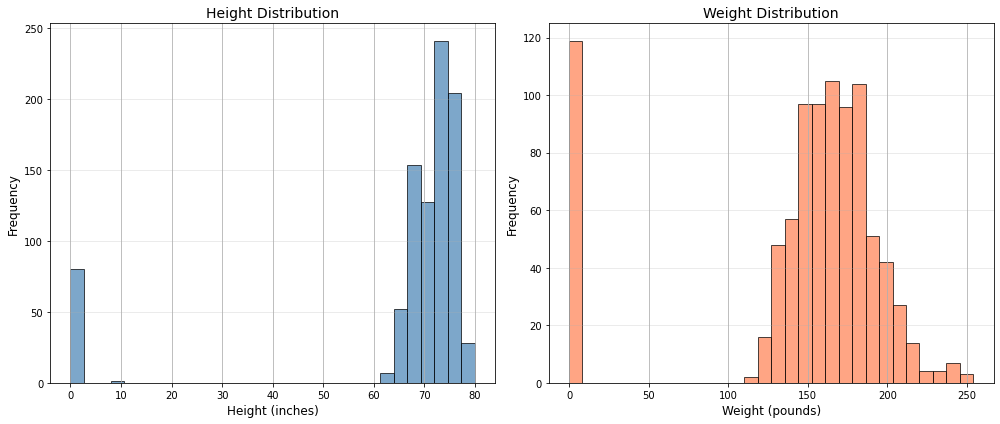

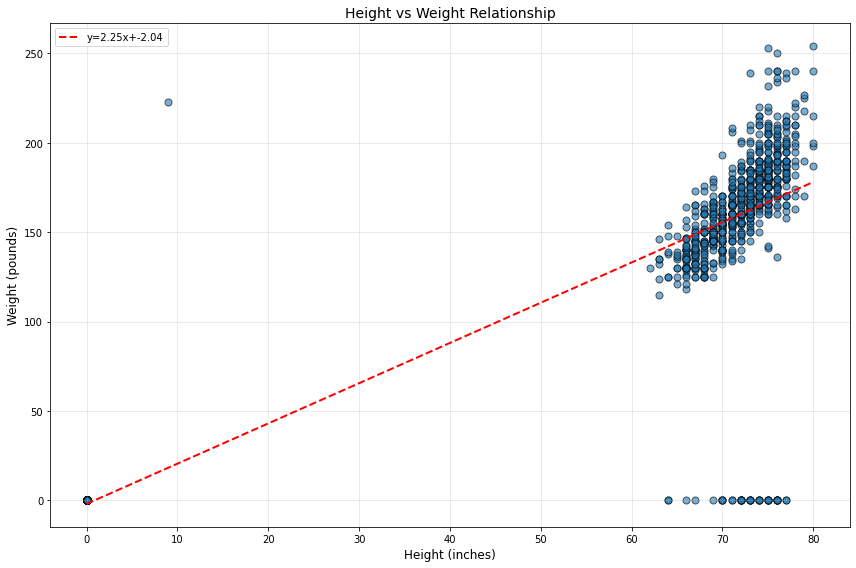

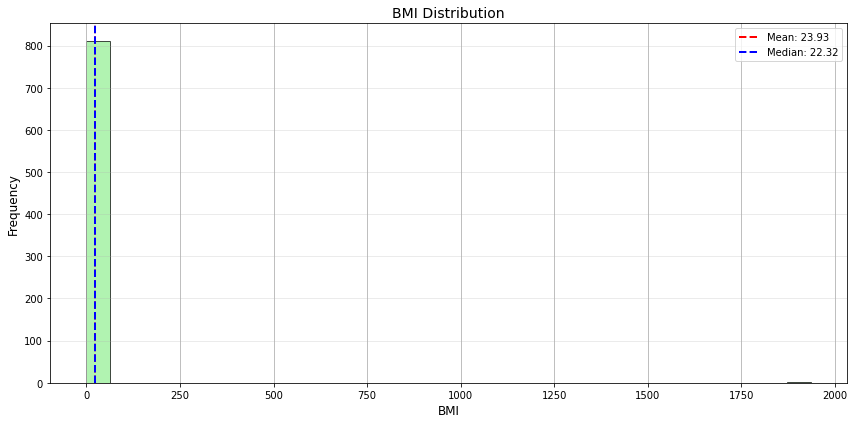


=== POSITION ANALYSIS ===


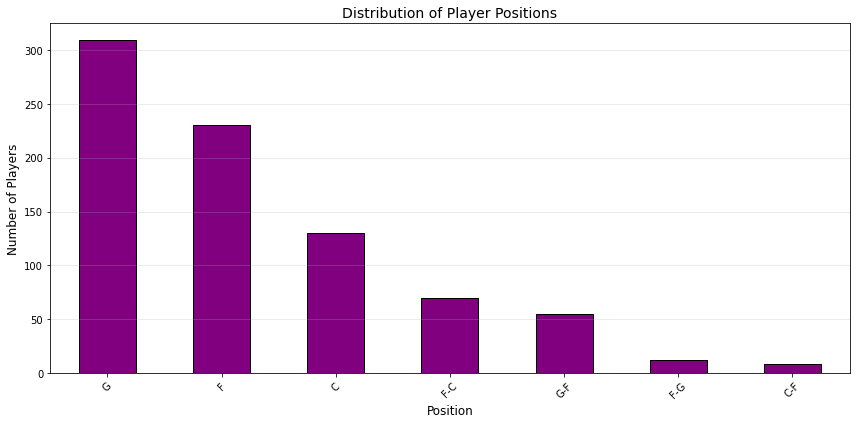

<Figure size 864x432 with 0 Axes>

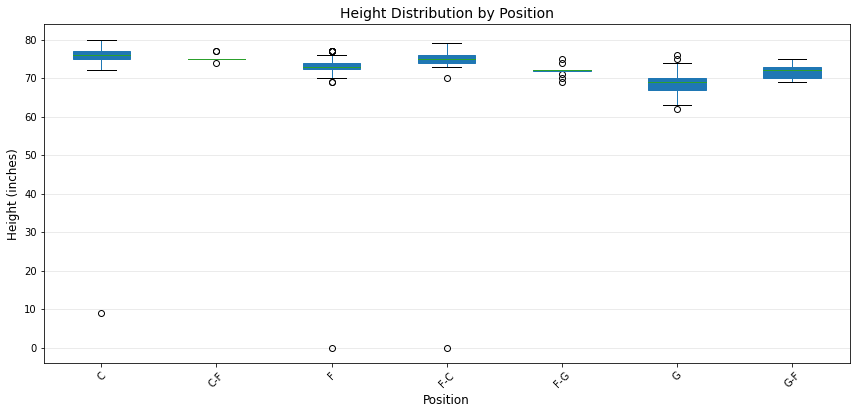

<Figure size 864x432 with 0 Axes>

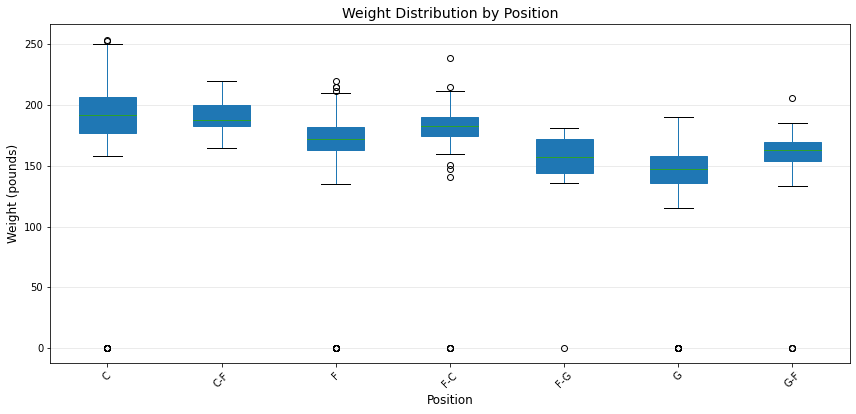


Average metrics by position:
     height  weight    bmi  career_length
pos                                      
C     75.71  181.82  36.64            0.0
C-F   75.33  191.11  23.72            0.0
F     73.08  165.70  21.72            0.0
F-C   74.11  171.60  21.66            0.0
F-G   71.92  146.58  19.75            0.0
G     68.54  143.26  21.43            0.0
G-F   71.53  151.85  20.87            0.0


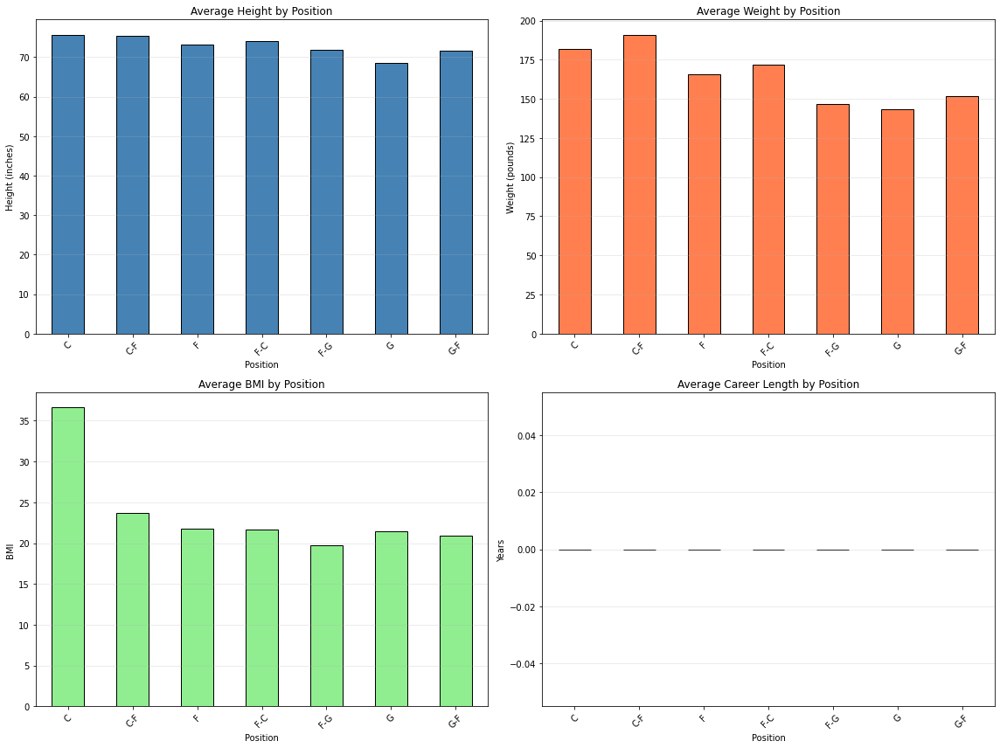


=== CAREER ANALYSIS ===


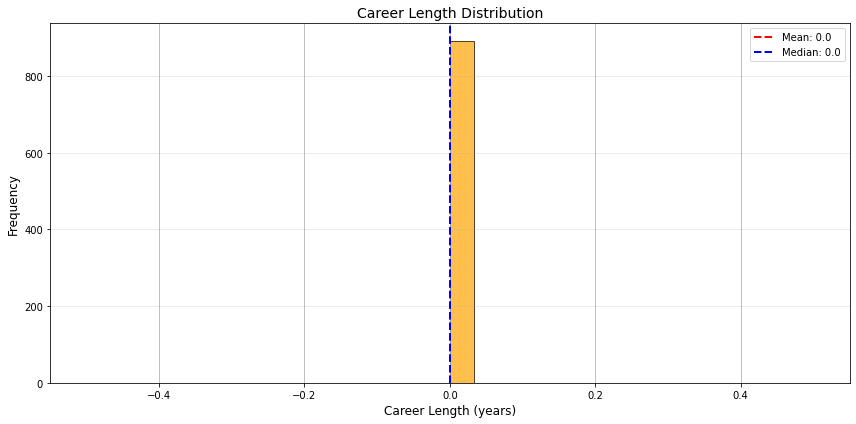

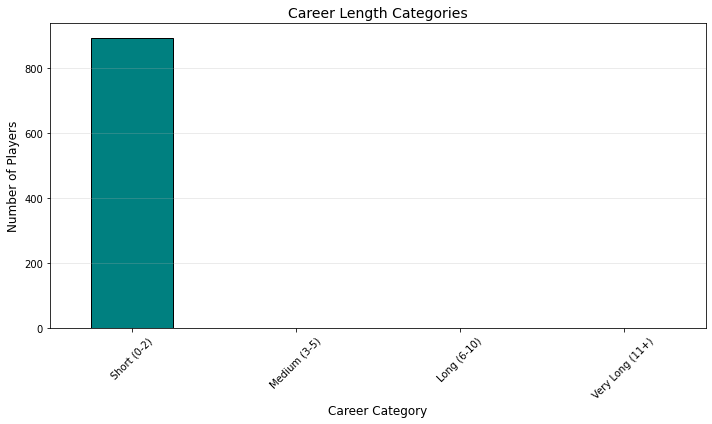


=== COLLEGE ANALYSIS ===
Players with college: 726 (81.3%)
Players without college: 167 (18.7%)


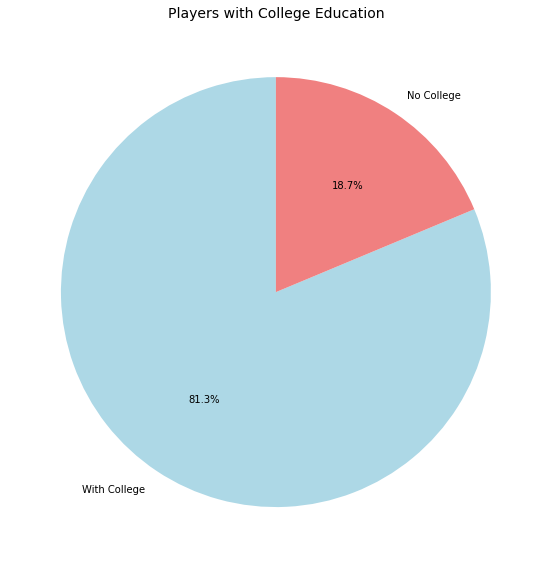

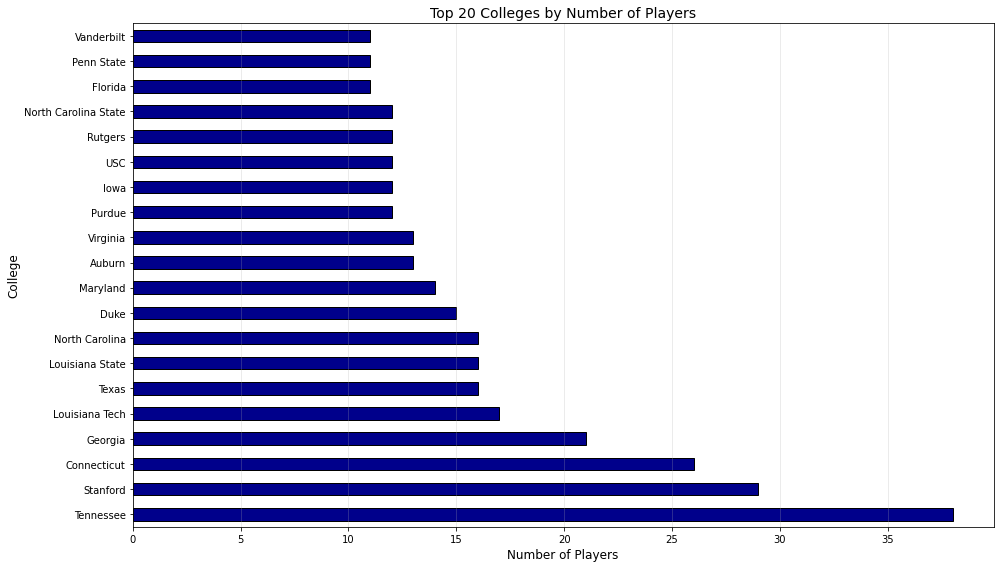


=== AGE ANALYSIS ===


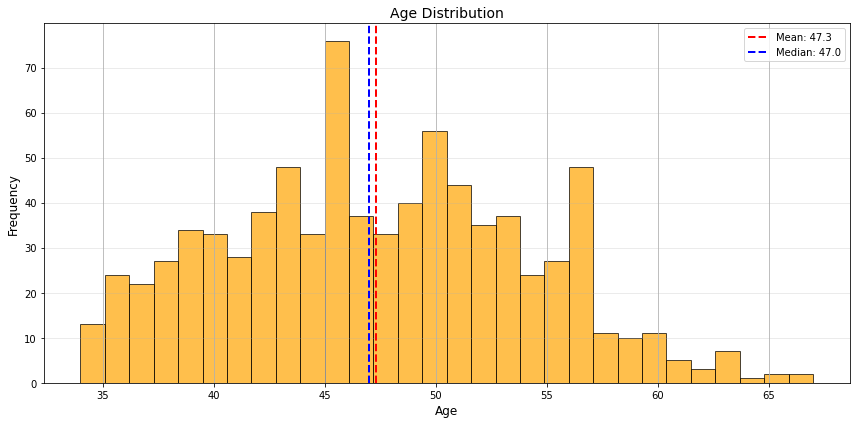


=== DEBUT AGE ANALYSIS ===


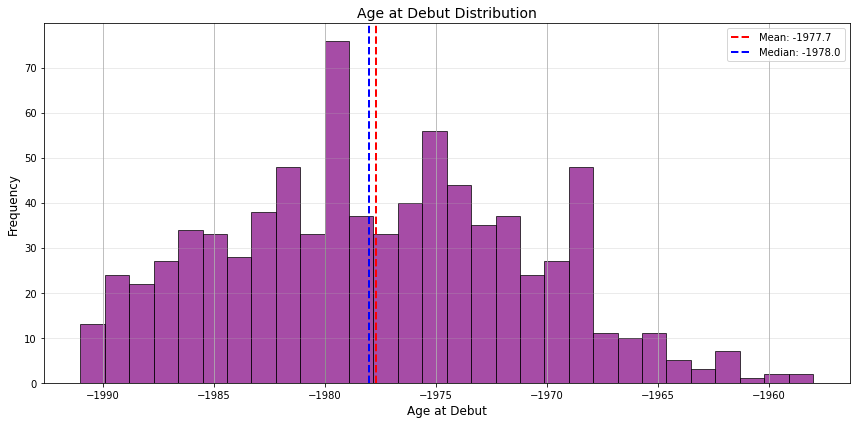

In [89]:
# Descriptive Analysis

print("\n=== DESCRIPTIVE STATISTICS ===")
print(players.describe(include='all'))

# Height distribution
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
players['height'].hist(bins=30, edgecolor='black', color='steelblue', alpha=0.7)
plt.title('Height Distribution', fontsize=14)
plt.xlabel('Height (inches)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', alpha=0.3)

# Weight distribution
plt.subplot(1, 2, 2)
players['weight'].hist(bins=30, edgecolor='black', color='coral', alpha=0.7)
plt.title('Weight Distribution', fontsize=14)
plt.xlabel('Weight (pounds)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Height vs Weight scatter
plt.figure(figsize=(12, 8))
plt.scatter(players['height'], players['weight'], alpha=0.6, edgecolors='black', s=50)
plt.title('Height vs Weight Relationship', fontsize=14)
plt.xlabel('Height (inches)', fontsize=12)
plt.ylabel('Weight (pounds)', fontsize=12)
plt.grid(True, alpha=0.3)

# Add regression line
if players['height'].notna().sum() > 0 and players['weight'].notna().sum() > 0:
    valid_data = players[['height', 'weight']].dropna()
    z = np.polyfit(valid_data['height'], valid_data['weight'], 1)
    p = np.poly1d(z)
    plt.plot(valid_data['height'].sort_values(), 
             p(valid_data['height'].sort_values()), 
             "r--", linewidth=2, label=f'y={z[0]:.2f}x+{z[1]:.2f}')
    plt.legend()

plt.tight_layout()
plt.show()

# BMI distribution
if 'bmi' in players.columns:
    plt.figure(figsize=(12, 6))
    players['bmi'].hist(bins=30, edgecolor='black', color='lightgreen', alpha=0.7)
    plt.axvline(players['bmi'].mean(), color='red', linestyle='--', 
                linewidth=2, label=f'Mean: {players["bmi"].mean():.2f}')
    plt.axvline(players['bmi'].median(), color='blue', linestyle='--', 
                linewidth=2, label=f'Median: {players["bmi"].median():.2f}')
    plt.title('BMI Distribution', fontsize=14)
    plt.xlabel('BMI', fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.legend()
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

if 'pos' in players.columns:
    print("\n=== POSITION ANALYSIS ===")
    
    # Position distribution
    plt.figure(figsize=(12, 6))
    position_counts = players['pos'].value_counts()
    position_counts.plot(kind='bar', color='purple', edgecolor='black')
    plt.title('Distribution of Player Positions', fontsize=14)
    plt.xlabel('Position', fontsize=12)
    plt.ylabel('Number of Players', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Height by position
    plt.figure(figsize=(12, 6))
    players.boxplot(column='height', by='pos', figsize=(12, 6),
                    patch_artist=True, grid=False)
    plt.suptitle('')
    plt.title('Height Distribution by Position', fontsize=14)
    plt.xlabel('Position', fontsize=12)
    plt.ylabel('Height (inches)', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Weight by position
    plt.figure(figsize=(12, 6))
    players.boxplot(column='weight', by='pos', figsize=(12, 6),
                    patch_artist=True, grid=False)
    plt.suptitle('')
    plt.title('Weight Distribution by Position', fontsize=14)
    plt.xlabel('Position', fontsize=12)
    plt.ylabel('Weight (pounds)', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Average height and weight by position
    position_stats = players.groupby('pos')[['height', 'weight', 'bmi', 'career_length']].mean().round(2)
    print("\nAverage metrics by position:")
    print(position_stats)
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    position_stats['height'].plot(kind='bar', ax=axes[0, 0], color='steelblue', edgecolor='black')
    axes[0, 0].set_title('Average Height by Position')
    axes[0, 0].set_ylabel('Height (inches)')
    axes[0, 0].set_xlabel('Position')
    axes[0, 0].grid(axis='y', alpha=0.3)
    axes[0, 0].tick_params(axis='x', rotation=45)
    
    position_stats['weight'].plot(kind='bar', ax=axes[0, 1], color='coral', edgecolor='black')
    axes[0, 1].set_title('Average Weight by Position')
    axes[0, 1].set_ylabel('Weight (pounds)')
    axes[0, 1].set_xlabel('Position')
    axes[0, 1].grid(axis='y', alpha=0.3)
    axes[0, 1].tick_params(axis='x', rotation=45)
    
    position_stats['bmi'].plot(kind='bar', ax=axes[1, 0], color='lightgreen', edgecolor='black')
    axes[1, 0].set_title('Average BMI by Position')
    axes[1, 0].set_ylabel('BMI')
    axes[1, 0].set_xlabel('Position')
    axes[1, 0].grid(axis='y', alpha=0.3)
    axes[1, 0].tick_params(axis='x', rotation=45)
    
    position_stats['career_length'].plot(kind='bar', ax=axes[1, 1], color='gold', edgecolor='black')
    axes[1, 1].set_title('Average Career Length by Position')
    axes[1, 1].set_ylabel('Years')
    axes[1, 1].set_xlabel('Position')
    axes[1, 1].grid(axis='y', alpha=0.3)
    axes[1, 1].tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.show()

if 'career_length' in players.columns:
    print("\n=== CAREER ANALYSIS ===")
    
    # Career length distribution
    plt.figure(figsize=(12, 6))
    players['career_length'].hist(bins=30, edgecolor='black', color='orange', alpha=0.7)
    plt.axvline(players['career_length'].mean(), color='red', linestyle='--',
                linewidth=2, label=f'Mean: {players["career_length"].mean():.1f}')
    plt.axvline(players['career_length'].median(), color='blue', linestyle='--',
                linewidth=2, label=f'Median: {players["career_length"].median():.1f}')
    plt.title('Career Length Distribution', fontsize=14)
    plt.xlabel('Career Length (years)', fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.legend()
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Career length categories
    players['career_category'] = pd.cut(players['career_length'],
                                         bins=[-1, 2, 5, 10, 100],
                                         labels=['Short (0-2)', 'Medium (3-5)', 'Long (6-10)', 'Very Long (11+)'])
    
    plt.figure(figsize=(10, 6))
    players['career_category'].value_counts().plot(kind='bar', color='teal', edgecolor='black')
    plt.title('Career Length Categories', fontsize=14)
    plt.xlabel('Career Category', fontsize=12)
    plt.ylabel('Number of Players', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

if 'college' in players.columns:
    print("\n=== COLLEGE ANALYSIS ===")
    
    # Players with college vs without
    has_college = players['college'].notna().sum()
    no_college = players['college'].isna().sum()
    
    print(f"Players with college: {has_college} ({has_college/len(players)*100:.1f}%)")
    print(f"Players without college: {no_college} ({no_college/len(players)*100:.1f}%)")
    
    # Pie chart
    plt.figure(figsize=(8, 8))
    plt.pie([has_college, no_college], labels=['With College', 'No College'],
            autopct='%1.1f%%', colors=['lightblue', 'lightcoral'], startangle=90)
    plt.title('Players with College Education', fontsize=14)
    plt.tight_layout()
    plt.show()
    
    # Top colleges
    plt.figure(figsize=(14, 8))
    top_colleges = players['college'].value_counts().head(20)
    top_colleges.plot(kind='barh', color='darkblue', edgecolor='black')
    plt.title('Top 20 Colleges by Number of Players', fontsize=14)
    plt.xlabel('Number of Players', fontsize=12)
    plt.ylabel('College', fontsize=12)
    plt.grid(axis='x', alpha=0.3)
    plt.tight_layout()
    plt.show()

if 'age' in players.columns:
    print("\n=== AGE ANALYSIS ===")
    
    # Age distribution
    plt.figure(figsize=(12, 6))
    players['age'].hist(bins=30, edgecolor='black', color='orange', alpha=0.7)
    plt.axvline(players['age'].mean(), color='red', linestyle='--',
                linewidth=2, label=f'Mean: {players["age"].mean():.1f}')
    plt.axvline(players['age'].median(), color='blue', linestyle='--',
                linewidth=2, label=f'Median: {players["age"].median():.1f}')
    plt.title('Age Distribution', fontsize=14)
    plt.xlabel('Age', fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.legend()
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

if 'age_at_debut' in players.columns:
    print("\n=== DEBUT AGE ANALYSIS ===")
    
    plt.figure(figsize=(12, 6))
    players['age_at_debut'].hist(bins=30, edgecolor='black', color='purple', alpha=0.7)
    plt.axvline(players['age_at_debut'].mean(), color='red', linestyle='--',
                linewidth=2, label=f'Mean: {players["age_at_debut"].mean():.1f}')
    plt.axvline(players['age_at_debut'].median(), color='blue', linestyle='--',
                linewidth=2, label=f'Median: {players["age_at_debut"].median():.1f}')
    plt.title('Age at Debut Distribution', fontsize=14)
    plt.xlabel('Age at Debut', fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.legend()
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()



=== TEMPORAL ANALYSIS ===


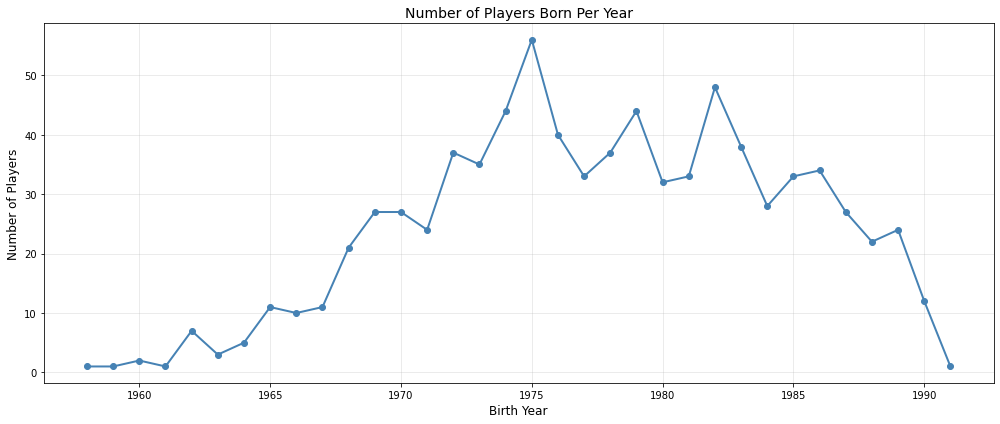

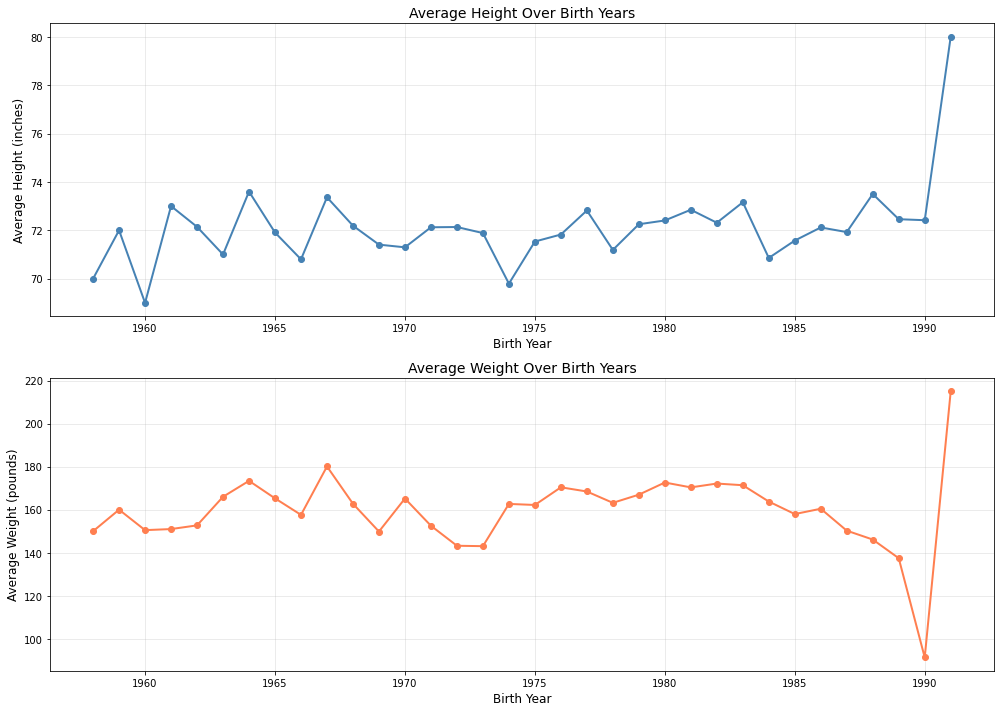


=== CAREER TIMELINE ANALYSIS ===


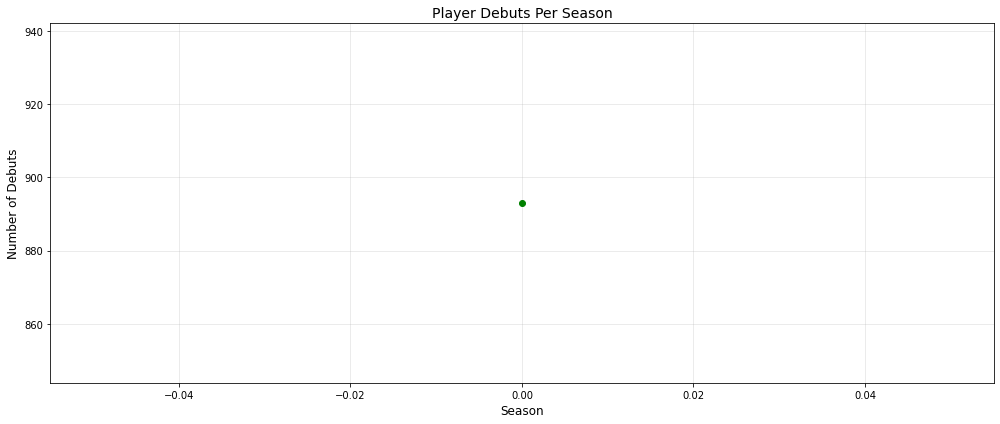

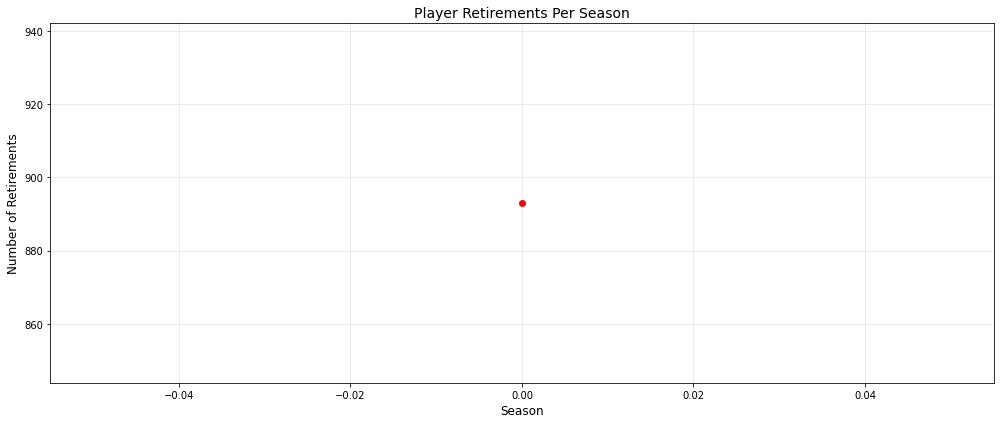

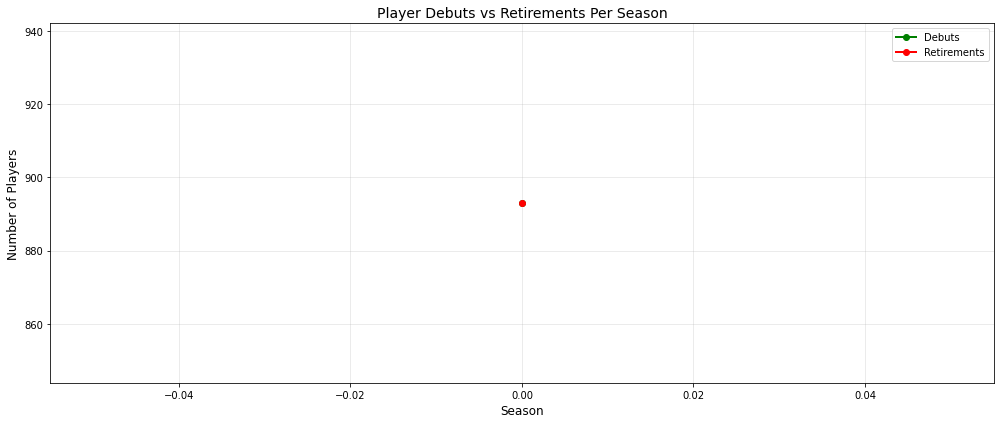

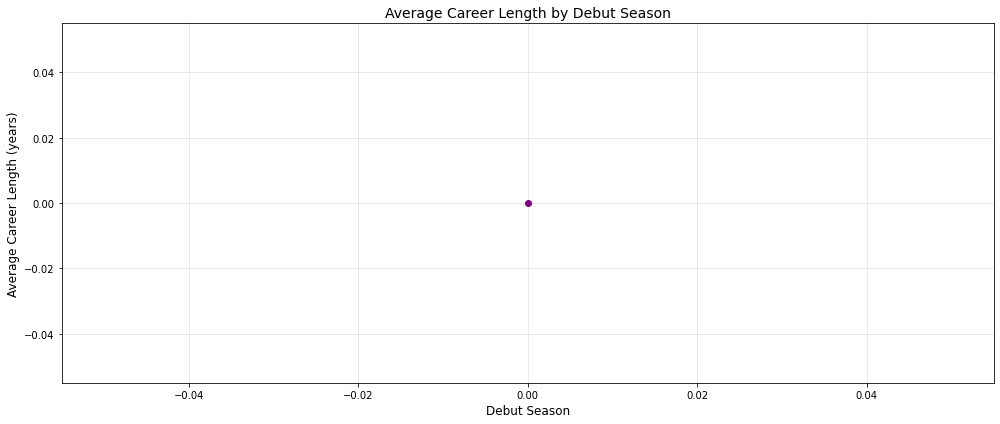

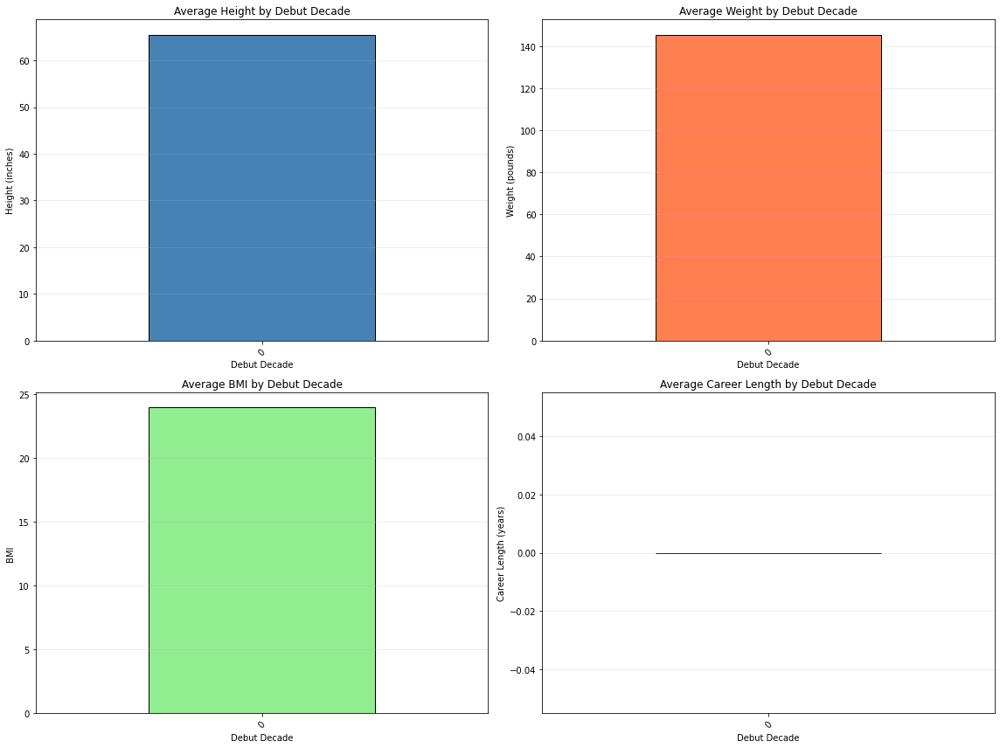

In [90]:
# Temporal Analysis

if 'birth_year' in players.columns:
    print("\n=== TEMPORAL ANALYSIS ===")
    
    # Players born per year
    players_per_year = players.groupby('birth_year').size()
    
    plt.figure(figsize=(14, 6))
    players_per_year.plot(kind='line', marker='o', color='steelblue', linewidth=2)
    plt.title('Number of Players Born Per Year', fontsize=14)
    plt.xlabel('Birth Year', fontsize=12)
    plt.ylabel('Number of Players', fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Average height/weight over birth years
    avg_height_by_year = players.groupby('birth_year')['height'].mean()
    avg_weight_by_year = players.groupby('birth_year')['weight'].mean()
    
    fig, axes = plt.subplots(2, 1, figsize=(14, 10))
    
    avg_height_by_year.plot(ax=axes[0], marker='o', color='steelblue', linewidth=2)
    axes[0].set_title('Average Height Over Birth Years', fontsize=14)
    axes[0].set_xlabel('Birth Year', fontsize=12)
    axes[0].set_ylabel('Average Height (inches)', fontsize=12)
    axes[0].grid(True, alpha=0.3)
    
    avg_weight_by_year.plot(ax=axes[1], marker='o', color='coral', linewidth=2)
    axes[1].set_title('Average Weight Over Birth Years', fontsize=14)
    axes[1].set_xlabel('Birth Year', fontsize=12)
    axes[1].set_ylabel('Average Weight (pounds)', fontsize=12)
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

if 'firstseason' in players.columns and 'lastseason' in players.columns:
    print("\n=== CAREER TIMELINE ANALYSIS ===")
    
    # Debuts per season
    debuts_per_season = players.groupby('firstseason').size()
    
    plt.figure(figsize=(14, 6))
    debuts_per_season.plot(kind='line', marker='o', color='green', linewidth=2)
    plt.title('Player Debuts Per Season', fontsize=14)
    plt.xlabel('Season', fontsize=12)
    plt.ylabel('Number of Debuts', fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Retirements per season
    retirements_per_season = players.groupby('lastseason').size()
    
    plt.figure(figsize=(14, 6))
    retirements_per_season.plot(kind='line', marker='o', color='red', linewidth=2)
    plt.title('Player Retirements Per Season', fontsize=14)
    plt.xlabel('Season', fontsize=12)
    plt.ylabel('Number of Retirements', fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Combined view
    fig, ax = plt.subplots(figsize=(14, 6))
    debuts_per_season.plot(ax=ax, marker='o', label='Debuts', linewidth=2, color='green')
    retirements_per_season.plot(ax=ax, marker='o', label='Retirements', linewidth=2, color='red')
    plt.title('Player Debuts vs Retirements Per Season', fontsize=14)
    plt.xlabel('Season', fontsize=12)
    plt.ylabel('Number of Players', fontsize=12)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Average career length over time (by debut year)
    avg_career_by_debut = players.groupby('firstseason')['career_length'].mean()
    
    plt.figure(figsize=(14, 6))
    avg_career_by_debut.plot(marker='o', color='purple', linewidth=2)
    plt.title('Average Career Length by Debut Season', fontsize=14)
    plt.xlabel('Debut Season', fontsize=12)
    plt.ylabel('Average Career Length (years)', fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Decade analysis
    players['debut_decade'] = (players['firstseason'] // 10) * 10
    
    decade_stats = players.groupby('debut_decade')[['height', 'weight', 'bmi', 'career_length']].mean()
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    decade_stats['height'].plot(kind='bar', ax=axes[0, 0], color='steelblue', edgecolor='black')
    axes[0, 0].set_title('Average Height by Debut Decade')
    axes[0, 0].set_ylabel('Height (inches)')
    axes[0, 0].set_xlabel('Debut Decade')
    axes[0, 0].grid(axis='y', alpha=0.3)
    axes[0, 0].tick_params(axis='x', rotation=45)
    
    decade_stats['weight'].plot(kind='bar', ax=axes[0, 1], color='coral', edgecolor='black')
    axes[0, 1].set_title('Average Weight by Debut Decade')
    axes[0, 1].set_ylabel('Weight (pounds)')
    axes[0, 1].set_xlabel('Debut Decade')
    axes[0, 1].grid(axis='y', alpha=0.3)
    axes[0, 1].tick_params(axis='x', rotation=45)
    
    decade_stats['bmi'].plot(kind='bar', ax=axes[1, 0], color='lightgreen', edgecolor='black')
    axes[1, 0].set_title('Average BMI by Debut Decade')
    axes[1, 0].set_ylabel('BMI')
    axes[1, 0].set_xlabel('Debut Decade')
    axes[1, 0].grid(axis='y', alpha=0.3)
    axes[1, 0].tick_params(axis='x', rotation=45)
    
    decade_stats['career_length'].plot(kind='bar', ax=axes[1, 1], color='gold', edgecolor='black')
    axes[1, 1].set_title('Average Career Length by Debut Decade')
    axes[1, 1].set_ylabel('Career Length (years)')
    axes[1, 1].set_xlabel('Debut Decade')
    axes[1, 1].grid(axis='y', alpha=0.3)
    axes[1, 1].tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.show()



=== POSITION COMPARISONS ===


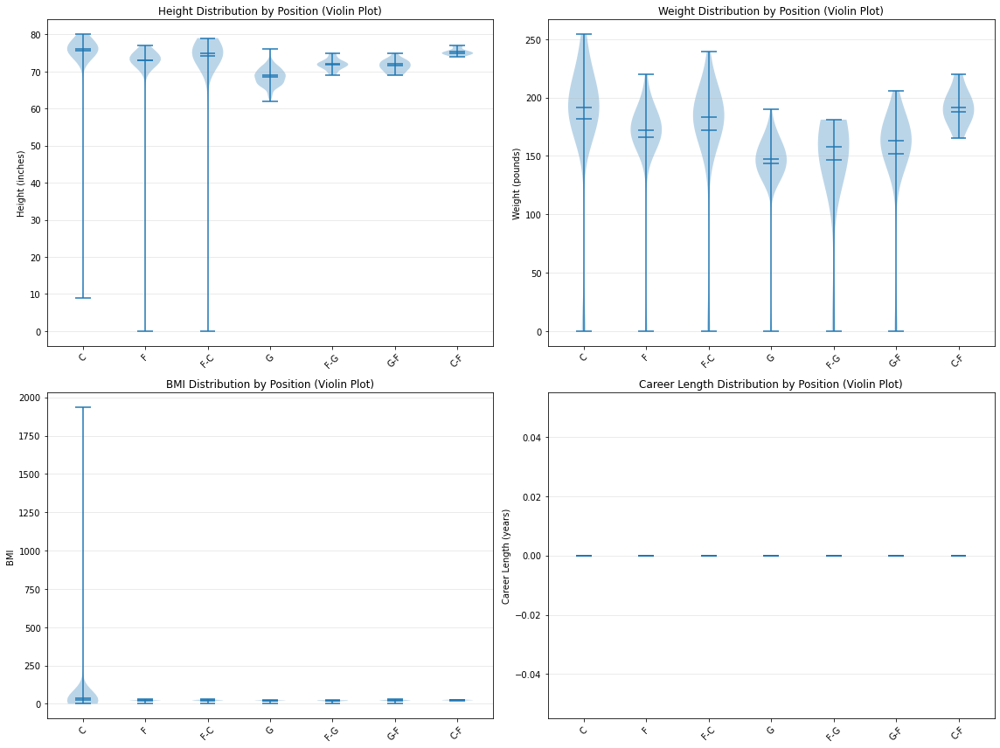


=== COLLEGE VS NON-COLLEGE COMPARISON ===

Average stats: College vs Non-College:
                height      weight        bmi  career_length  age_at_debut
has_college                                                               
False        38.712575   89.916168  43.395957            0.0  -1976.444444
True         71.662534  158.181818  21.504211            0.0  -1977.847010


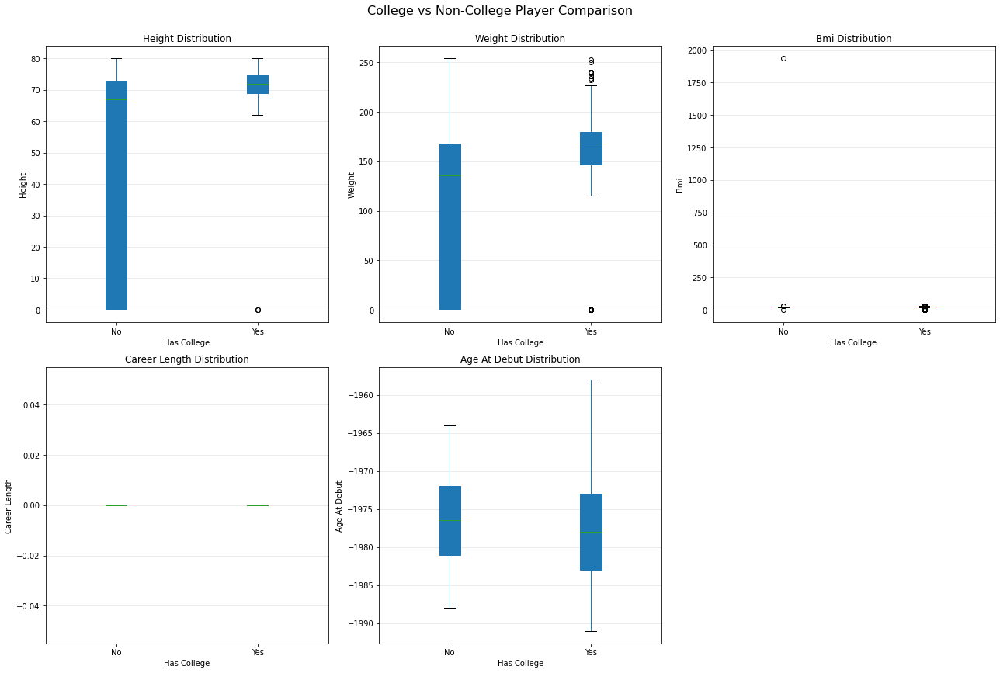


=== CAREER LENGTH CATEGORIES COMPARISON ===


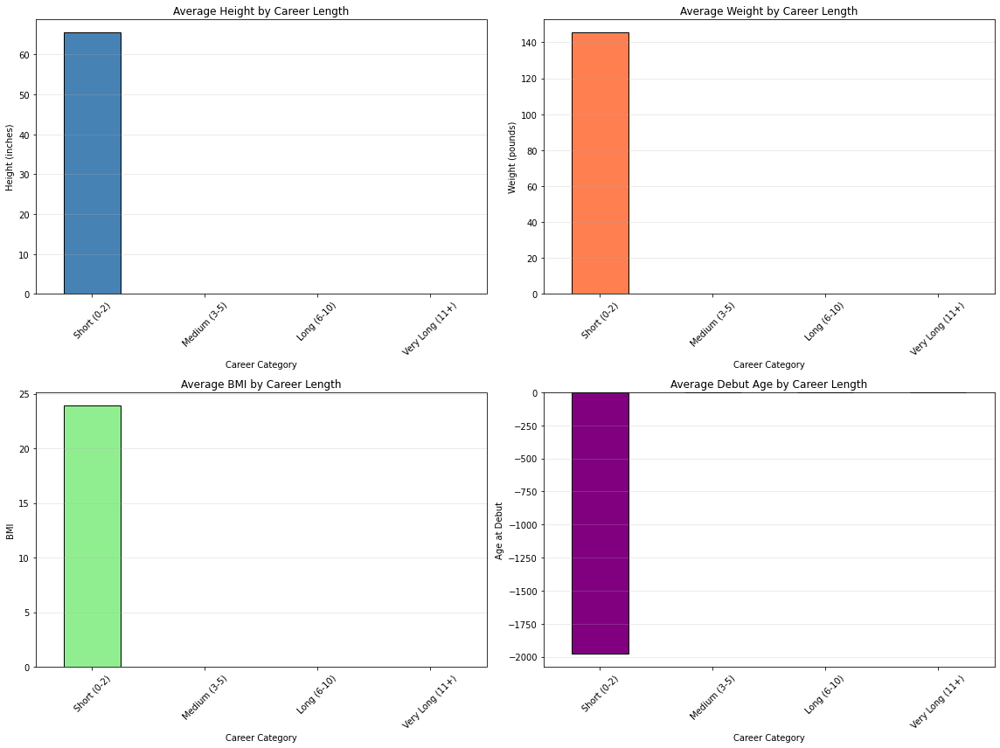

In [92]:
# Comparative Analysis

if 'pos' in players.columns:
    print("\n=== POSITION COMPARISONS ===")
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    positions = players['pos'].dropna().unique()
    
    # Height violin plot
    height_data = [players[players['pos'] == pos]['height'].dropna() for pos in positions]
    axes[0, 0].violinplot(height_data, positions=range(len(positions)), showmeans=True, showmedians=True)
    axes[0, 0].set_xticks(range(len(positions)))
    axes[0, 0].set_xticklabels(positions, rotation=45)
    axes[0, 0].set_title('Height Distribution by Position (Violin Plot)')
    axes[0, 0].set_ylabel('Height (inches)')
    axes[0, 0].grid(axis='y', alpha=0.3)
    
    # Weight violin plot
    weight_data = [players[players['pos'] == pos]['weight'].dropna() for pos in positions]
    axes[0, 1].violinplot(weight_data, positions=range(len(positions)), showmeans=True, showmedians=True)
    axes[0, 1].set_xticks(range(len(positions)))
    axes[0, 1].set_xticklabels(positions, rotation=45)
    axes[0, 1].set_title('Weight Distribution by Position (Violin Plot)')
    axes[0, 1].set_ylabel('Weight (pounds)')
    axes[0, 1].grid(axis='y', alpha=0.3)
    
    # BMI violin plot
    bmi_data = [players[players['pos'] == pos]['bmi'].dropna() for pos in positions]
    axes[1, 0].violinplot(bmi_data, positions=range(len(positions)), showmeans=True, showmedians=True)
    axes[1, 0].set_xticks(range(len(positions)))
    axes[1, 0].set_xticklabels(positions, rotation=45)
    axes[1, 0].set_title('BMI Distribution by Position (Violin Plot)')
    axes[1, 0].set_ylabel('BMI')
    axes[1, 0].grid(axis='y', alpha=0.3)
    
    # Career length violin plot
    career_data = [players[players['pos'] == pos]['career_length'].dropna() for pos in positions]
    axes[1, 1].violinplot(career_data, positions=range(len(positions)), showmeans=True, showmedians=True)
    axes[1, 1].set_xticks(range(len(positions)))
    axes[1, 1].set_xticklabels(positions, rotation=45)
    axes[1, 1].set_title('Career Length Distribution by Position (Violin Plot)')
    axes[1, 1].set_ylabel('Career Length (years)')
    axes[1, 1].grid(axis='y', alpha=0.3)
    
    plt.tight_layout()
    plt.show()

if 'college' in players.columns:
    print("\n=== COLLEGE VS NON-COLLEGE COMPARISON ===")
    
    players['has_college'] = players['college'].notna()
    
    college_comparison = players.groupby('has_college')[['height', 'weight', 'bmi', 'career_length', 'age_at_debut']].mean()
    print("\nAverage stats: College vs Non-College:")
    print(college_comparison)
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()
    
    metrics = ['height', 'weight', 'bmi', 'career_length', 'age_at_debut']
    for idx, col in enumerate(metrics):
        if col in players.columns:
            players.boxplot(column=col, by='has_college', ax=axes[idx],
                            patch_artist=True, grid=False)
            axes[idx].set_title(f'{col.replace("_", " ").title()} Distribution')
            axes[idx].set_xlabel('Has College')
            axes[idx].set_ylabel(col.replace('_', ' ').title())
            axes[idx].set_xticklabels(['No', 'Yes'])
            axes[idx].grid(axis='y', alpha=0.3)
    
    # Hide unused subplot
    if len(metrics) < 6:
        axes[5].axis('off')
    
    plt.suptitle('College vs Non-College Player Comparison', fontsize=16, y=1.00)
    plt.tight_layout()
    plt.show()

if 'career_category' in players.columns:
    print("\n=== CAREER LENGTH CATEGORIES COMPARISON ===")
    
    career_comparison = players.groupby('career_category')[['height', 'weight', 'bmi', 'age_at_debut']].mean()
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    career_comparison['height'].plot(kind='bar', ax=axes[0, 0], color='steelblue', edgecolor='black')
    axes[0, 0].set_title('Average Height by Career Length')
    axes[0, 0].set_ylabel('Height (inches)')
    axes[0, 0].set_xlabel('Career Category')
    axes[0, 0].grid(axis='y', alpha=0.3)
    axes[0, 0].tick_params(axis='x', rotation=45)
    
    career_comparison['weight'].plot(kind='bar', ax=axes[0, 1], color='coral', edgecolor='black')
    axes[0, 1].set_title('Average Weight by Career Length')
    axes[0, 1].set_ylabel('Weight (pounds)')
    axes[0, 1].set_xlabel('Career Category')
    axes[0, 1].grid(axis='y', alpha=0.3)
    axes[0, 1].tick_params(axis='x', rotation=45)
    
    career_comparison['bmi'].plot(kind='bar', ax=axes[1, 0], color='lightgreen', edgecolor='black')
    axes[1, 0].set_title('Average BMI by Career Length')
    axes[1, 0].set_ylabel('BMI')
    axes[1, 0].set_xlabel('Career Category')
    axes[1, 0].grid(axis='y', alpha=0.3)
    axes[1, 0].tick_params(axis='x', rotation=45)
    
    career_comparison['age_at_debut'].plot(kind='bar', ax=axes[1, 1], color='purple', edgecolor='black')
    axes[1, 1].set_title('Average Debut Age by Career Length')
    axes[1, 1].set_ylabel('Age at Debut')
    axes[1, 1].set_xlabel('Career Category')
    axes[1, 1].grid(axis='y', alpha=0.3)
    axes[1, 1].tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.show()



=== CORRELATION ANALYSIS ===


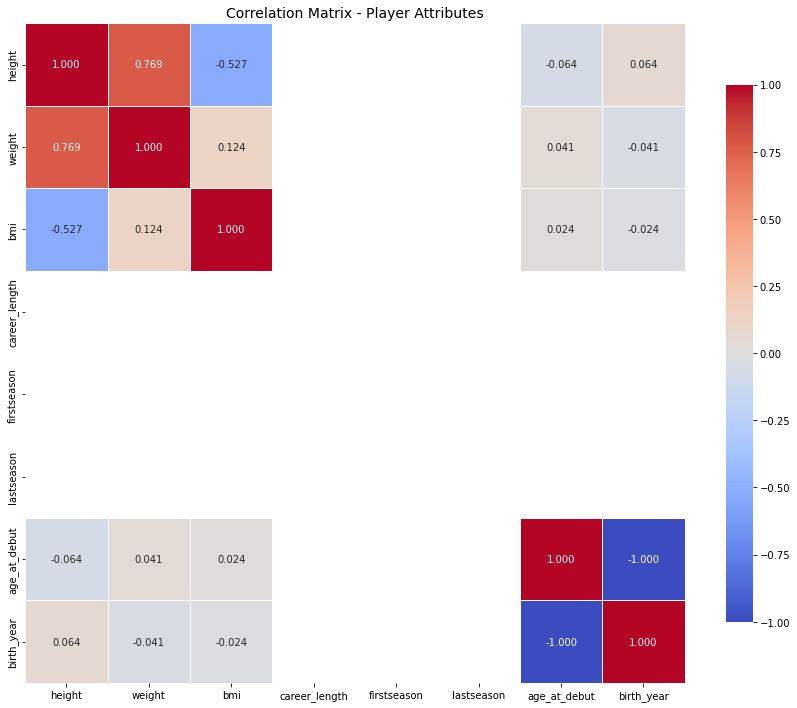


Correlations with p-values:
height vs weight: r=0.769, p=0.0000 ***
height vs bmi: r=-0.527, p=0.0000 ***
weight vs bmi: r=0.124, p=0.0004 ***
height vs career_length: r=nan, p=nan ns
weight vs career_length: r=nan, p=nan ns
age_at_debut vs career_length: r=nan, p=nan ns
firstseason vs career_length: r=nan, p=nan ns

=== CHI-SQUARE TESTS ===

1. Position distribution: College vs Non-College:
Chi-square statistic: 11.5343
P-value: 0.0732
Degrees of freedom: 6
Significant association: No

2. Position distribution across career categories:
Chi-square statistic: 0.0000
P-value: 1.0000
Significant association: No

=== ANOVA & KRUSKAL-WALLIS TESTS ===

1. ANOVA: Height across positions
F-statistic: 45.0557
P-value: 0.0000
Significant difference: Yes

2. Kruskal-Wallis: Height across positions
H-statistic: 593.3433
P-value: 0.0000
Significant difference: Yes

3. ANOVA: Career length across positions
F-statistic: nan
P-value: nan
Significant difference: No

=== T-TESTS ===

1. T-test: Height 

/home/rui/anaconda3/lib/python3.9/site-packages/scipy/stats/stats.py:4023: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/home/rui/anaconda3/lib/python3.9/site-packages/scipy/stats/stats.py:3650: F_onewayConstantInputWarning: Each of the input arrays is constant;the F statistic is not defined or infinite
  warnings.warn(F_onewayConstantInputWarning())
/home/rui/anaconda3/lib/python3.9/site-packages/scipy/stats/morestats.py:1757: UserWarning: Input data for shapiro has range zero. The results may not be accurate.
  warnings.warn("Input data for shapiro has range zero. The results "


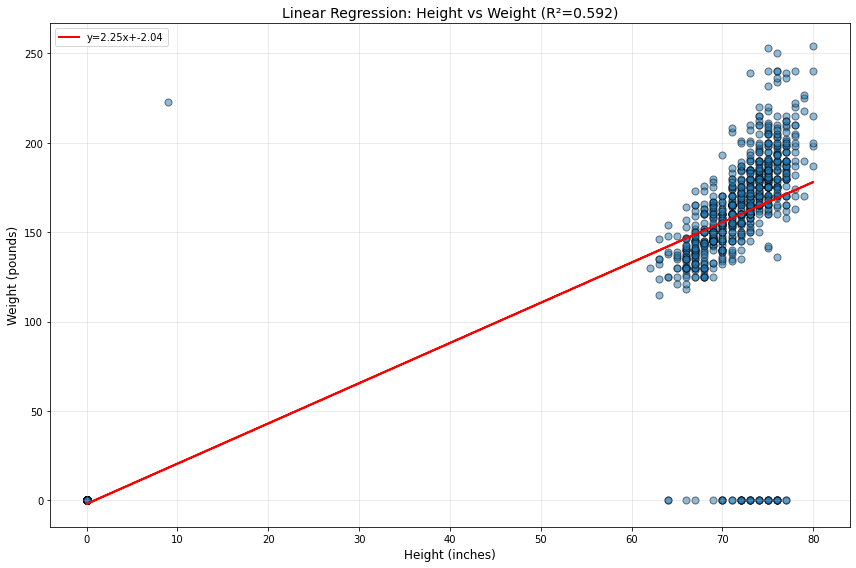


2. Linear Regression: Career Length = f(Debut Age)
Equation: Career = 0.00 * DebutAge + 0.00
R-squared: 0.0000
P-value: 1.0000
Significant relationship: No


In [93]:
# Statistical Analysis

from scipy import stats
from scipy.stats import chi2_contingency

print("\n=== CORRELATION ANALYSIS ===")

# Correlation matrix
numeric_vars = ['height', 'weight', 'bmi', 'career_length', 'firstseason', 'lastseason', 'age_at_debut', 'birth_year']
available_vars = [var for var in numeric_vars if var in players.columns]

correlation_matrix = players[available_vars].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".3f", cmap='coolwarm',
            center=0, square=True, linewidths=1, cbar_kws={"shrink": 0.8})
plt.title('Correlation Matrix - Player Attributes', fontsize=14)
plt.tight_layout()
plt.show()

print("\nCorrelations with p-values:")
corr_pairs = [
    ('height', 'weight'), ('height', 'bmi'), ('weight', 'bmi'),
    ('height', 'career_length'), ('weight', 'career_length'),
    ('age_at_debut', 'career_length'), ('firstseason', 'career_length')
]

for var1, var2 in corr_pairs:
    if var1 in players.columns and var2 in players.columns:
        valid_data = players[[var1, var2]].dropna()
        if len(valid_data) > 2:
            corr, pval = stats.pearsonr(valid_data[var1], valid_data[var2])
            sig = '***' if pval < 0.001 else '**' if pval < 0.01 else '*' if pval < 0.05 else 'ns'
            print(f"{var1} vs {var2}: r={corr:.3f}, p={pval:.4f} {sig}")

print("\n=== CHI-SQUARE TESTS ===")

# Position vs College attendance
if 'pos' in players.columns and 'has_college' in players.columns:
    contingency_pos_college = pd.crosstab(players['pos'], players['has_college'])
    chi2, p_value, dof, expected = chi2_contingency(contingency_pos_college)
    
    print("\n1. Position distribution: College vs Non-College:")
    print(f"Chi-square statistic: {chi2:.4f}")
    print(f"P-value: {p_value:.4f}")
    print(f"Degrees of freedom: {dof}")
    print(f"Significant association: {'Yes' if p_value < 0.05 else 'No'}")

# Position vs Career category
if 'pos' in players.columns and 'career_category' in players.columns:
    contingency_pos_career = pd.crosstab(players['pos'], players['career_category'])
    chi2_career, p_career, dof_career, _ = chi2_contingency(contingency_pos_career)
    
    print("\n2. Position distribution across career categories:")
    print(f"Chi-square statistic: {chi2_career:.4f}")
    print(f"P-value: {p_career:.4f}")
    print(f"Significant association: {'Yes' if p_career < 0.05 else 'No'}")

print("\n=== ANOVA & KRUSKAL-WALLIS TESTS ===")

# Compare height across positions
if 'pos' in players.columns:
    positions = players['pos'].dropna().unique()
    position_groups_height = [players[players['pos'] == pos]['height'].dropna().values 
                              for pos in positions]
    position_groups_height = [g for g in position_groups_height if len(g) > 0]
    
    if len(position_groups_height) > 1:
        f_stat, p_anova = stats.f_oneway(*position_groups_height)
        print("\n1. ANOVA: Height across positions")
        print(f"F-statistic: {f_stat:.4f}")
        print(f"P-value: {p_anova:.4f}")
        print(f"Significant difference: {'Yes' if p_anova < 0.05 else 'No'}")
        
        h_stat, p_kruskal = stats.kruskal(*position_groups_height)
        print("\n2. Kruskal-Wallis: Height across positions")
        print(f"H-statistic: {h_stat:.4f}")
        print(f"P-value: {p_kruskal:.4f}")
        print(f"Significant difference: {'Yes' if p_kruskal < 0.05 else 'No'}")

# Compare career length across positions
if 'pos' in players.columns and 'career_length' in players.columns:
    position_groups_career = [players[players['pos'] == pos]['career_length'].dropna().values
                              for pos in positions]
    position_groups_career = [g for g in position_groups_career if len(g) > 0]
    
    if len(position_groups_career) > 1:
        f_stat_c, p_anova_c = stats.f_oneway(*position_groups_career)
        print("\n3. ANOVA: Career length across positions")
        print(f"F-statistic: {f_stat_c:.4f}")
        print(f"P-value: {p_anova_c:.4f}")
        print(f"Significant difference: {'Yes' if p_anova_c < 0.05 else 'No'}")

print("\n=== T-TESTS ===")

# Compare college vs non-college players
if 'has_college' in players.columns:
    college_players = players[players['has_college'] == True]
    non_college_players = players[players['has_college'] == False]
    
    # Height comparison
    if len(college_players) > 0 and len(non_college_players) > 0:
        t_stat_h, p_ttest_h = stats.ttest_ind(
            college_players['height'].dropna(),
            non_college_players['height'].dropna()
        )
        print("\n1. T-test: Height (College vs Non-College)")
        print(f"T-statistic: {t_stat_h:.4f}")
        print(f"P-value: {p_ttest_h:.4f}")
        print(f"Significant difference: {'Yes' if p_ttest_h < 0.05 else 'No'}")
        
        # Career length comparison
        if 'career_length' in players.columns:
            t_stat_c, p_ttest_c = stats.ttest_ind(
                college_players['career_length'].dropna(),
                non_college_players['career_length'].dropna()
            )
            print("\n2. T-test: Career Length (College vs Non-College)")
            print(f"T-statistic: {t_stat_c:.4f}")
            print(f"P-value: {p_ttest_c:.4f}")
            print(f"Significant difference: {'Yes' if p_ttest_c < 0.05 else 'No'}")

print("\n=== NORMALITY TESTS ===")

for col in ['height', 'weight', 'bmi', 'career_length', 'age_at_debut']:
    if col in players.columns:
        data = players[col].dropna()
        if len(data) > 3:
            stat, p_value = stats.shapiro(data)
            print(f"{col}: W={stat:.4f}, p={p_value:.4f} {'(Normal)' if p_value > 0.05 else '(Not Normal)'}")

print("\n=== REGRESSION ANALYSIS ===")

# Linear regression: Height vs Weight
if 'height' in players.columns and 'weight' in players.columns:
    valid_data = players[['height', 'weight']].dropna()
    
    slope, intercept, r_value, p_value, std_err = stats.linregress(
        valid_data['height'], valid_data['weight']
    )
    
    print("\n1. Linear Regression: Weight = f(Height)")
    print(f"Equation: Weight = {slope:.2f} * Height + {intercept:.2f}")
    print(f"R-squared: {r_value**2:.4f}")
    print(f"P-value: {p_value:.4f}")
    print(f"Standard error: {std_err:.4f}")
    
    plt.figure(figsize=(12, 8))
    plt.scatter(valid_data['height'], valid_data['weight'], alpha=0.5, edgecolors='black', s=50)
    plt.plot(valid_data['height'], slope * valid_data['height'] + intercept,
             'r-', linewidth=2, label=f'y={slope:.2f}x+{intercept:.2f}')
    plt.title(f'Linear Regression: Height vs Weight (R²={r_value**2:.3f})', fontsize=14)
    plt.xlabel('Height (inches)', fontsize=12)
    plt.ylabel('Weight (pounds)', fontsize=12)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# Career length vs debut age
if 'age_at_debut' in players.columns and 'career_length' in players.columns:
    valid_data = players[['age_at_debut', 'career_length']].dropna()
    
    slope_c, intercept_c, r_c, p_c, std_err_c = stats.linregress(
        valid_data['age_at_debut'], valid_data['career_length']
    )
    
    print("\n2. Linear Regression: Career Length = f(Debut Age)")
    print(f"Equation: Career = {slope_c:.2f} * DebutAge + {intercept_c:.2f}")
    print(f"R-squared: {r_c**2:.4f}")
    print(f"P-value: {p_c:.4f}")
    print(f"Significant relationship: {'Yes' if p_c < 0.05 else 'No'}")


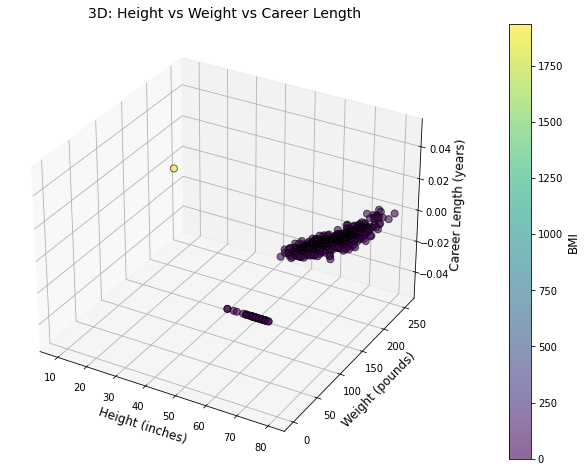

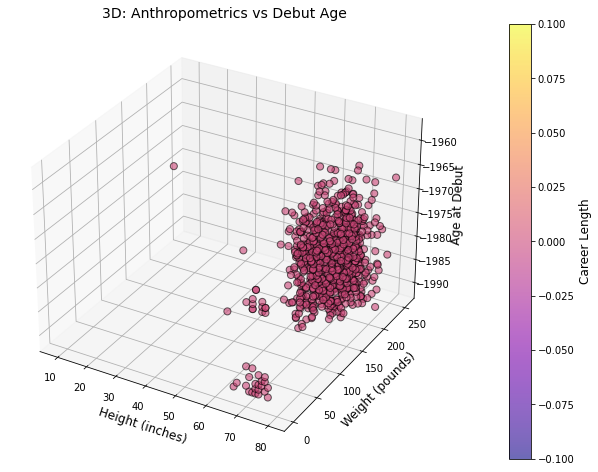

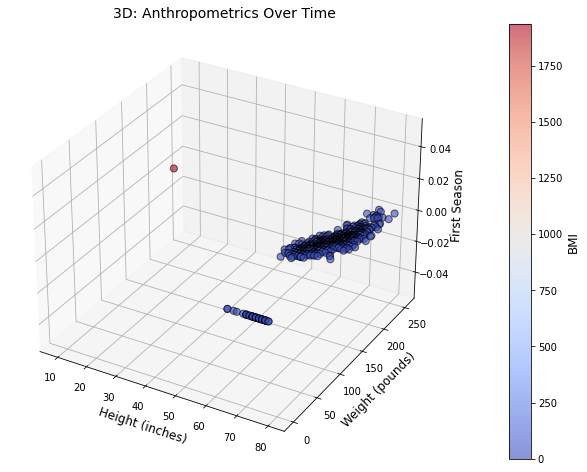

/tmp/ipykernel_6979/1184221456.py:78: UserWarning: Z contains NaN values. This may result in rendering artifacts.
  surf = ax.plot_surface(height_grid, weight_grid, bmi_grid,


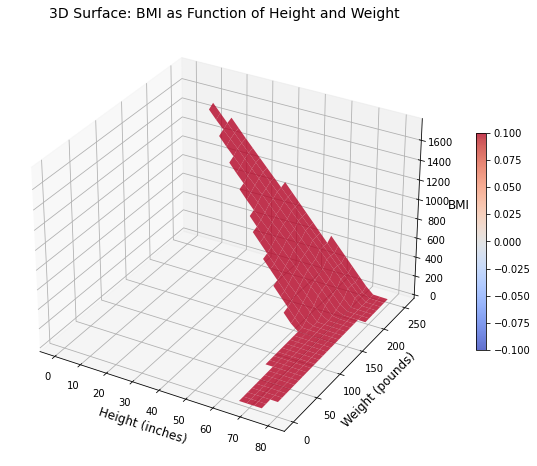

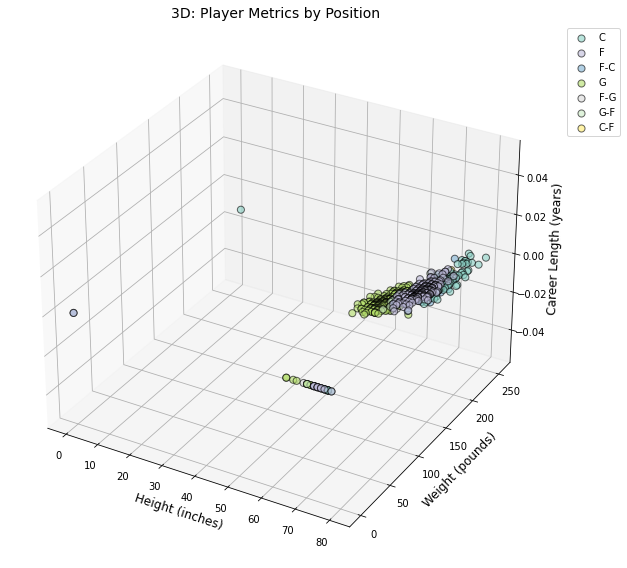

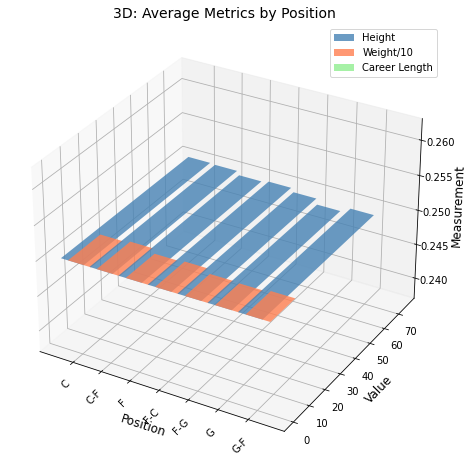

In [96]:
# 3D Visualizations

from mpl_toolkits.mplot3d import Axes3D

# 3D: Height vs Weight vs Career Length
if 'career_length' in players.columns:
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    scatter = ax.scatter(players['height'], players['weight'], players['career_length'],
                         c=players['bmi'], cmap='viridis',
                         s=50, alpha=0.6, edgecolors='black')
    
    ax.set_xlabel('Height (inches)', fontsize=12)
    ax.set_ylabel('Weight (pounds)', fontsize=12)
    ax.set_zlabel('Career Length (years)', fontsize=12)
    ax.set_title('3D: Height vs Weight vs Career Length', fontsize=14)
    
    cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
    cbar.set_label('BMI', fontsize=12)
    
    plt.show()

# 3D: Height vs Weight vs Debut Age
if 'age_at_debut' in players.columns:
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    scatter = ax.scatter(players['height'], players['weight'], players['age_at_debut'],
                         c=players['career_length'], cmap='plasma',
                         s=50, alpha=0.6, edgecolors='black')
    
    ax.set_xlabel('Height (inches)', fontsize=12)
    ax.set_ylabel('Weight (pounds)', fontsize=12)
    ax.set_zlabel('Age at Debut', fontsize=12)
    ax.set_title('3D: Anthropometrics vs Debut Age', fontsize=14)
    
    cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
    cbar.set_label('Career Length', fontsize=12)
    
    plt.show()

# 3D: Height vs Weight vs First Season
if 'firstseason' in players.columns:
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    scatter = ax.scatter(players['height'], players['weight'], players['firstseason'],
                         c=players['bmi'], cmap='coolwarm',
                         s=50, alpha=0.6, edgecolors='black')
    
    ax.set_xlabel('Height (inches)', fontsize=12)
    ax.set_ylabel('Weight (pounds)', fontsize=12)
    ax.set_zlabel('First Season', fontsize=12)
    ax.set_title('3D: Anthropometrics Over Time', fontsize=14)
    
    cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
    cbar.set_label('BMI', fontsize=12)
    
    plt.show()

# BMI surface as function of height and weight
from scipy.interpolate import griddata

height_range = np.linspace(players['height'].min(), players['height'].max(), 30)
weight_range = np.linspace(players['weight'].min(), players['weight'].max(), 30)
height_grid, weight_grid = np.meshgrid(height_range, weight_range)

bmi_grid = griddata(
    (players['height'], players['weight']),
    players['bmi'],
    (height_grid, weight_grid),
    method='linear'
)

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(height_grid, weight_grid, bmi_grid,
                       cmap='coolwarm', alpha=0.8, edgecolor='none')

ax.set_xlabel('Height (inches)', fontsize=12)
ax.set_ylabel('Weight (pounds)', fontsize=12)
ax.set_zlabel('BMI', fontsize=12)
ax.set_title('3D Surface: BMI as Function of Height and Weight', fontsize=14)

plt.colorbar(surf, ax=ax, shrink=0.5)
plt.show()

if 'pos' in players.columns:
    fig = plt.figure(figsize=(14, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    positions = players['pos'].dropna().unique()
    colors = plt.cm.Set3(np.linspace(0, 1, len(positions)))
    
    for i, pos in enumerate(positions):
        pos_data = players[players['pos'] == pos]
        ax.scatter(pos_data['height'], pos_data['weight'], pos_data['career_length'],
                   label=pos, color=colors[i], s=50, alpha=0.6, edgecolors='black')
    
    ax.set_xlabel('Height (inches)', fontsize=12)
    ax.set_ylabel('Weight (pounds)', fontsize=12)
    ax.set_zlabel('Career Length (years)', fontsize=12)
    ax.set_title('3D: Player Metrics by Position', fontsize=14)
    ax.legend(bbox_to_anchor=(1.15, 1))
    
    plt.tight_layout()
    plt.show()

# Position statistics in 3D
if 'pos' in players.columns:
    position_stats = players.groupby('pos')[['height', 'weight', 'career_length']].mean()
    
    fig = plt.figure(figsize=(14, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    positions = position_stats.index
    x_pos = np.arange(len(positions))
    
    width = 0.25
    
    ax.bar(x_pos - width, position_stats['height'], width, 
           label='Height', color='steelblue', alpha=0.8)
    ax.bar(x_pos, position_stats['weight']/10, width,
           label='Weight/10', color='coral', alpha=0.8)
    ax.bar(x_pos + width, position_stats['career_length'], width,
           label='Career Length', color='lightgreen', alpha=0.8)
    
    ax.set_xlabel('Position', fontsize=12)
    ax.set_ylabel('Value', fontsize=12)
    ax.set_zlabel('Measurement', fontsize=12)
    ax.set_title('3D: Average Metrics by Position', fontsize=14)
    ax.set_xticks(x_pos)
    ax.set_xticklabels(positions, rotation=45)
    ax.legend()
    
    plt.show()


## Data Analysis `players_team.csv`

Dataset shape: (1876, 43)

First few rows:
     playerID  year  stint tmID  lgID  GP  GS  minutes  points  oRebounds  \
0  abrossv01w     2      0  MIN  WNBA  26  23      846     343         43   
1  abrossv01w     3      0  MIN  WNBA  27  27      805     314         45   
2  abrossv01w     4      0  MIN  WNBA  30  25      792     318         44   
3  abrossv01w     5      0  MIN  WNBA  22  11      462     146         17   
4  abrossv01w     6      0  MIN  WNBA  31  31      777     304         29   
5  abrossv01w     7      0  MIN  WNBA  34   2      724     263         44   
6  abrossv01w     8      0  MIN  WNBA  34  29      843     345         53   
7  abrossv01w     9      0  CON  WNBA   6   0      107      34          3   
8  adamsjo01w     4      0  MIN  WNBA  10   0       96      33         10   
9  aguilel01w     3      0  UTA  WNBA  28   0      141      43          0   

   ...  PostBlocks  PostTurnovers  PostPF  PostfgAttempted  PostfgMade  \
0  ...           0              0  

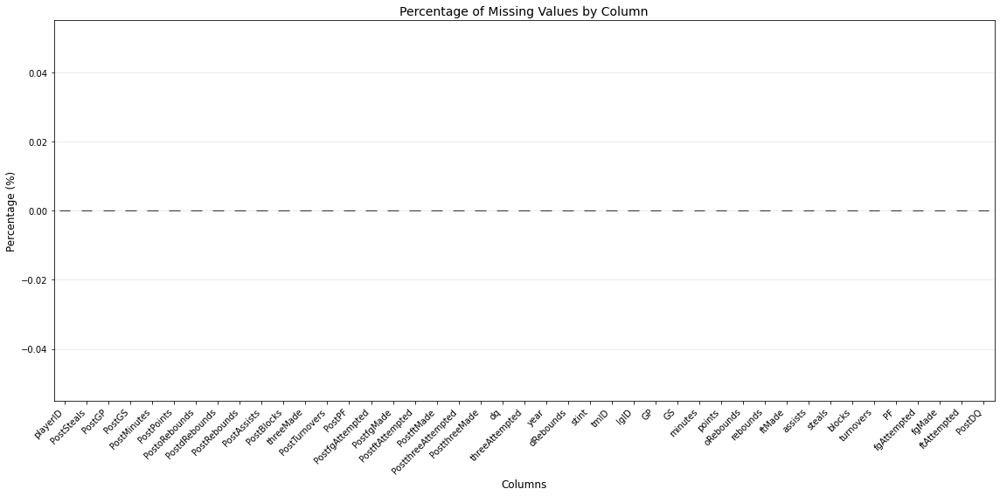


Missing value patterns:
Records with no playerID: 0
Records with no year: 0
Records with no tmID: 0
Records with no GP: 0
Records with no minutes: 0

Playoff data completeness:
PostGP: 0 missing (0.0%)
PostGS: 0 missing (0.0%)
PostMinutes: 0 missing (0.0%)
PostPoints: 0 missing (0.0%)
PostoRebounds: 0 missing (0.0%)

Records with playoff data: 1876 (100.0%)


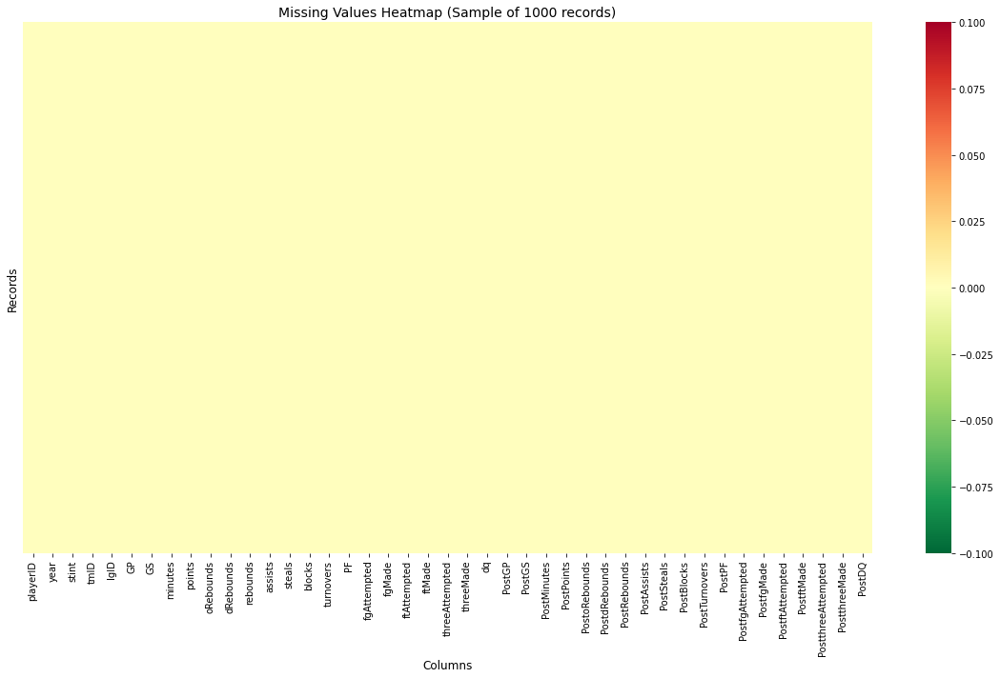


=== UNIQUENESS ===
Total duplicate rows: 0
Duplicate playerID+year+stint combinations: 0

Total records: 1876
Unique players: 555
Unique years: 10
Unique teams: 20
Unique leagues: 1

Records with stint > 1: 71 (3.8%)
Players with multiple teams in same year: 62

=== CONSISTENCY ===

Records where GS > GP: 0

Records where fgMade > fgAttempted: 0
Records where ftMade > ftAttempted: 0
Records where threeMade > threeAttempted: 0

Records with rebounds mismatch: 0

Negative values check:

Year range: 1 - 10
Records with future years: 0

Stint statistics:
0    1735
1      70
2      70
3       1
Name: stint, dtype: int64
Maximum stint value: 3

Playoff records where PostGS > PostGP: 0

=== ACCURACY - Outliers ===

ppg:
  Outliers: 17 (0.9%)
  Normal range: [-8.35, 19.92]
  Outlier range: [20.00, 25.29]

rpg:
  Outliers: 45 (2.4%)
  Normal range: [-2.63, 7.78]
  Outlier range: [7.82, 11.60]

apg:
  Outliers: 74 (3.9%)
  Normal range: [-1.79, 4.22]
  Outlier range: [4.27, 8.00]

mpg:
  Outlie

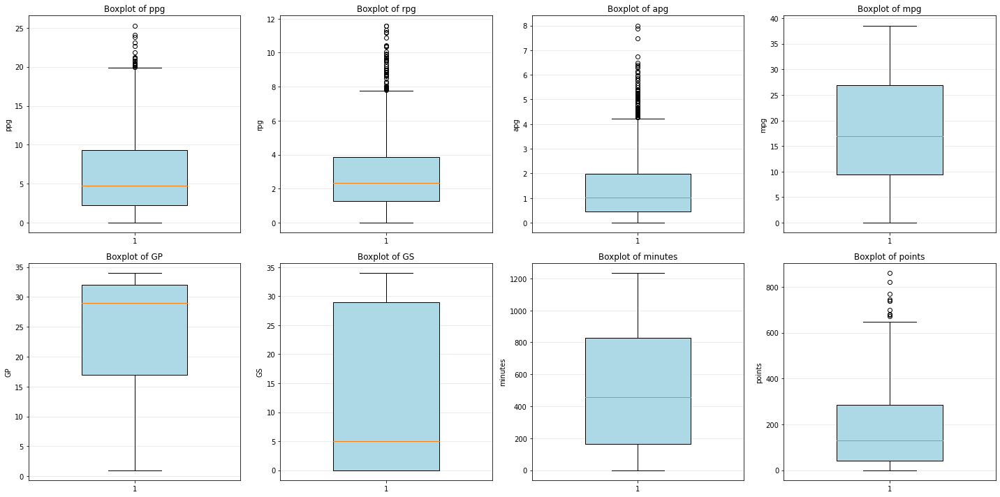


=== TIMELINESS ===

Year range: 1 - 10
Total years covered: 10
Total seasons: 10


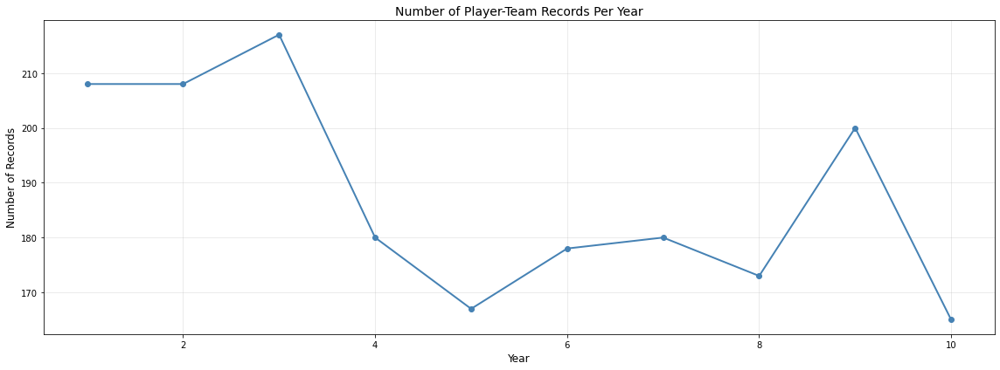

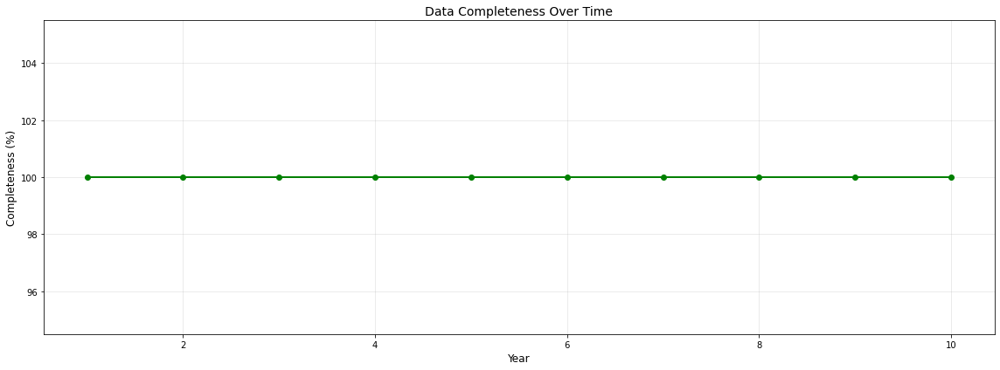


=== VALIDITY ===

Invalid shooting percentages (>100%):
FG%: 0
FT%: 0
3P%: 0

Records with MPG > 48: 0

Records with significant points calculation mismatch: 0

Unique leagues: ['WNBA']
Unique teams: 20

Top 10 teams by records:
PHO    152
DET    147
SEA    136
WAS    135
LAS    132
IND    131
NYL    130
MIN    126
SAC    122
HOU    118
Name: tmID, dtype: int64

Invalid playerIDs (too short): 0

=== DATA QUALITY SUMMARY ===
Total records: 1876
Complete records (no missing values): 1444
Records with any missing value: 432
Overall data completeness: 99.45%


In [100]:
# Data Quality

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats
from datetime import datetime

players_teams = pd.read_csv('../dataset/players_teams.csv')

print(f"Dataset shape: {players_teams.shape}")
print(f"\nFirst few rows:")
print(players_teams.head(10))
print(f"\nColumn names and types:")
print(players_teams.dtypes)
print(f"\nDataset info:")
print(players_teams.info())

missing_data = players_teams.isnull().sum()
missing_percentage = (missing_data / len(players_teams)) * 100

print("\n=== COMPLETENESS ===")
print("\nMissing values:")
missing_df = pd.DataFrame({
    'Missing Count': missing_data,
    'Percentage': missing_percentage
}).sort_values('Percentage', ascending=False)
print(missing_df[missing_df['Missing Count'] > 0])

plt.figure(figsize=(16, 8))
missing_percentage[missing_percentage >= 0].sort_values(ascending=False).plot(
    kind='bar', color='coral', edgecolor='black'
)
plt.title('Percentage of Missing Values by Column', fontsize=14)
plt.ylabel('Percentage (%)', fontsize=12)
plt.xlabel('Columns', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# Missing value patterns
print("\nMissing value patterns:")
print(f"Records with no playerID: {players_teams['playerID'].isnull().sum()}")
print(f"Records with no year: {players_teams['year'].isnull().sum()}")
print(f"Records with no tmID: {players_teams['tmID'].isnull().sum()}")
print(f"Records with no GP: {players_teams['GP'].isnull().sum()}")
print(f"Records with no minutes: {players_teams['minutes'].isnull().sum()}")

# Playoff data completeness
playoff_cols = [col for col in players_teams.columns if col.startswith('Post')]
print(f"\nPlayoff data completeness:")
for col in playoff_cols[:5]:
    missing = players_teams[col].isnull().sum()
    print(f"{col}: {missing} missing ({missing/len(players_teams)*100:.1f}%)")

# Records with playoff data
has_playoff_data = players_teams['PostGP'].notna().sum()
print(f"\nRecords with playoff data: {has_playoff_data} ({has_playoff_data/len(players_teams)*100:.1f}%)")

# Heatmap of missing values
plt.figure(figsize=(16, 10))
sample_size = min(1000, len(players_teams))
sns.heatmap(players_teams.sample(sample_size).isnull(), cbar=True, 
            yticklabels=False, cmap='RdYlGn_r')
plt.title(f'Missing Values Heatmap (Sample of {sample_size} records)', fontsize=14)
plt.xlabel('Columns', fontsize=12)
plt.ylabel('Records', fontsize=12)
plt.tight_layout()
plt.show()

print("\n=== UNIQUENESS ===")

# Total duplicates
duplicates = players_teams.duplicated().sum()
print(f"Total duplicate rows: {duplicates}")

# Check for duplicate combinations
duplicate_keys = players_teams.duplicated(subset=['playerID', 'year', 'stint']).sum()
print(f"Duplicate playerID+year+stint combinations: {duplicate_keys}")

if duplicate_keys > 0:
    dup_records = players_teams[players_teams.duplicated(
        subset=['playerID', 'year', 'stint'], keep=False
    )].sort_values(['playerID', 'year', 'stint'])
    print(f"\nDuplicate records sample:")
    print(dup_records.head(10))

# Uniqueness statistics
print(f"\nTotal records: {len(players_teams)}")
print(f"Unique players: {players_teams['playerID'].nunique()}")
print(f"Unique years: {players_teams['year'].nunique()}")
print(f"Unique teams: {players_teams['tmID'].nunique()}")
print(f"Unique leagues: {players_teams['lgID'].nunique()}")

# Players with multiple stints in same year
multi_stint = players_teams[players_teams['stint'] > 1]
print(f"\nRecords with stint > 1: {len(multi_stint)} ({len(multi_stint)/len(players_teams)*100:.1f}%)")
print(f"Players with multiple teams in same year: {multi_stint['playerID'].nunique()}")

print("\n=== CONSISTENCY ===")

# Games Started should not exceed Games Played
invalid_gs = players_teams[players_teams['GS'] > players_teams['GP']]
print(f"\nRecords where GS > GP: {len(invalid_gs)}")
if len(invalid_gs) > 0:
    print(invalid_gs[['playerID', 'year', 'tmID', 'GP', 'GS']].head())

# Field goals made should not exceed attempted
invalid_fg = players_teams[players_teams['fgMade'] > players_teams['fgAttempted']]
print(f"\nRecords where fgMade > fgAttempted: {len(invalid_fg)}")

# Free throws made should not exceed attempted
invalid_ft = players_teams[players_teams['ftMade'] > players_teams['ftAttempted']]
print(f"Records where ftMade > ftAttempted: {len(invalid_ft)}")

# Three-pointers made should not exceed attempted
invalid_three = players_teams[players_teams['threeMade'] > players_teams['threeAttempted']]
print(f"Records where threeMade > threeAttempted: {len(invalid_three)}")

# Rebounds consistency (oRebounds + dRebounds should equal rebounds)
players_teams['rebounds_calc'] = players_teams['oRebounds'] + players_teams['dRebounds']
rebounds_mismatch = players_teams[
    (players_teams['rebounds'].notna()) & 
    (players_teams['rebounds_calc'].notna()) &
    (abs(players_teams['rebounds'] - players_teams['rebounds_calc']) > 1)
]
print(f"\nRecords with rebounds mismatch: {len(rebounds_mismatch)}")

# Check for negative values
numeric_cols = ['GP', 'GS', 'minutes', 'points', 'rebounds', 'assists', 
                'steals', 'blocks', 'turnovers', 'PF']
print(f"\nNegative values check:")
for col in numeric_cols:
    negative_count = (players_teams[col] < 0).sum()
    if negative_count > 0:
        print(f" {col}: {negative_count} negative values")

# Year range validation
print(f"\nYear range: {players_teams['year'].min():.0f} - {players_teams['year'].max():.0f}")
future_years = players_teams[players_teams['year'] > datetime.now().year]
print(f"Records with future years: {len(future_years)}")

# Stint validation
print(f"\nStint statistics:")
print(players_teams['stint'].value_counts().sort_index().head(10))
max_stint = players_teams['stint'].max()
print(f"Maximum stint value: {max_stint}")

# Playoff consistency
playoff_invalid_gs = players_teams[players_teams['PostGS'] > players_teams['PostGP']]
print(f"\nPlayoff records where PostGS > PostGP: {len(playoff_invalid_gs)}")

print("\n=== ACCURACY - Outliers ===")

# Calculate per-game statistics
players_teams['ppg'] = players_teams['points'] / players_teams['GP']
players_teams['rpg'] = players_teams['rebounds'] / players_teams['GP']
players_teams['apg'] = players_teams['assists'] / players_teams['GP']
players_teams['mpg'] = players_teams['minutes'] / players_teams['GP']

# IQR method for outlier detection
def detect_outliers_iqr(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    return outliers, lower_bound, upper_bound

outlier_cols = ['ppg', 'rpg', 'apg', 'mpg', 'GP', 'minutes', 'points']
for col in outlier_cols:
    if col in players_teams.columns:
        outliers, lower, upper = detect_outliers_iqr(players_teams, col)
        print(f"\n{col}:")
        print(f"  Outliers: {len(outliers)} ({len(outliers)/len(players_teams)*100:.1f}%)")
        print(f"  Normal range: [{lower:.2f}, {upper:.2f}]")
        if len(outliers) > 0:
            print(f"  Outlier range: [{outliers[col].min():.2f}, {outliers[col].max():.2f}]")

# Boxplots for key statistics
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

plot_cols = ['ppg', 'rpg', 'apg', 'mpg', 'GP', 'GS', 'minutes', 'points']
for idx, col in enumerate(plot_cols):
    if col in players_teams.columns:
        data = players_teams[col].dropna()
        axes[idx].boxplot(data, widths=0.5, patch_artist=True,
                          boxprops=dict(facecolor='lightblue'))
        axes[idx].set_title(f'Boxplot of {col}')
        axes[idx].set_ylabel(col)
        axes[idx].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print("\n=== TIMELINESS ===")

print(f"\nYear range: {players_teams['year'].min():.0f} - {players_teams['year'].max():.0f}")
print(f"Total years covered: {players_teams['year'].nunique()}")
print(f"Total seasons: {len(players_teams['year'].unique())}")

# Records per year
records_per_year = players_teams.groupby('year').size()

plt.figure(figsize=(16, 6))
records_per_year.plot(kind='line', marker='o', color='steelblue', linewidth=2)
plt.title('Number of Player-Team Records Per Year', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of Records', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Data completeness over time
plt.figure(figsize=(16, 6))
completeness_by_year = players_teams.groupby('year').apply(
    lambda x: (1 - x.isnull().sum().sum() / (len(x) * len(x.columns))) * 100
)
completeness_by_year.plot(kind='line', marker='o', color='green', linewidth=2)
plt.title('Data Completeness Over Time', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Completeness (%)', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("\n=== VALIDITY ===")

# Shooting percentages validation
players_teams['fg_pct'] = np.where(
    players_teams['fgAttempted'] > 0,
    players_teams['fgMade'] / players_teams['fgAttempted'],
    np.nan
)
players_teams['ft_pct'] = np.where(
    players_teams['ftAttempted'] > 0,
    players_teams['ftMade'] / players_teams['ftAttempted'],
    np.nan
)
players_teams['three_pct'] = np.where(
    players_teams['threeAttempted'] > 0,
    players_teams['threeMade'] / players_teams['threeAttempted'],
    np.nan
)

# Check for invalid percentages (>1.0)
invalid_fg_pct = (players_teams['fg_pct'] > 1.0).sum()
invalid_ft_pct = (players_teams['ft_pct'] > 1.0).sum()
invalid_three_pct = (players_teams['three_pct'] > 1.0).sum()

print(f"\nInvalid shooting percentages (>100%):")
print(f"FG%: {invalid_fg_pct}")
print(f"FT%: {invalid_ft_pct}")
print(f"3P%: {invalid_three_pct}")

# Minutes per game validation
invalid_mpg = players_teams[players_teams['mpg'] > 48]
print(f"\nRecords with MPG > 48: {len(invalid_mpg)}")
if len(invalid_mpg) > 0:
    print(f"Max MPG: {players_teams['mpg'].max():.1f}")

# Points validation
# Points = 2*fgMade + ftMade + threeMade (approximately, since fgMade includes 3-pointers)
players_teams['points_calc'] = (
    2 * players_teams['fgMade'] + 
    players_teams['ftMade'] + 
    players_teams['threeMade']
)
points_mismatch = players_teams[
    (players_teams['points'].notna()) & 
    (players_teams['points_calc'].notna()) &
    (abs(players_teams['points'] - players_teams['points_calc']) > 10)
]
print(f"\nRecords with significant points calculation mismatch: {len(points_mismatch)}")

# League and team validation
print(f"\nUnique leagues: {sorted(players_teams['lgID'].unique())}")
print(f"Unique teams: {players_teams['tmID'].nunique()}")
print(f"\nTop 10 teams by records:")
print(players_teams['tmID'].value_counts().head(10))

# Player ID validation
invalid_player_ids = players_teams[players_teams['playerID'].str.len() < 3]
print(f"\nInvalid playerIDs (too short): {len(invalid_player_ids)}")

print("\n=== DATA QUALITY SUMMARY ===")
print(f"Total records: {len(players_teams)}")
print(f"Complete records (no missing values): {players_teams.dropna().shape[0]}")
print(f"Records with any missing value: {players_teams.isnull().any(axis=1).sum()}")
print(f"Overall data completeness: {(1 - players_teams.isnull().sum().sum() / (len(players_teams) * len(players_teams.columns))) * 100:.2f}%")



=== DESCRIPTIVE STATISTICS ===

Regular season statistics:
                GP           GS      minutes       points     rebounds  \
count  1876.000000  1876.000000  1876.000000  1876.000000  1876.000000   
mean     24.320896    12.438166   501.269190   176.261727    78.722814   
std      10.460614    13.641697   359.566117   161.983839    69.210226   
min       1.000000     0.000000     0.000000     0.000000     0.000000   
25%      17.000000     0.000000   165.000000    41.000000    21.000000   
50%      29.000000     5.000000   459.000000   129.000000    63.000000   
75%      32.000000    29.000000   826.250000   284.000000   119.000000   
max      34.000000    34.000000  1234.000000   860.000000   363.000000   

           assists       steals       blocks    turnovers           PF  
count  1876.000000  1876.000000  1876.000000  1876.000000  1876.000000  
mean     39.031983    19.600746     9.065032    36.480277    48.596482  
std      40.147037    17.542694    13.497853    27.956

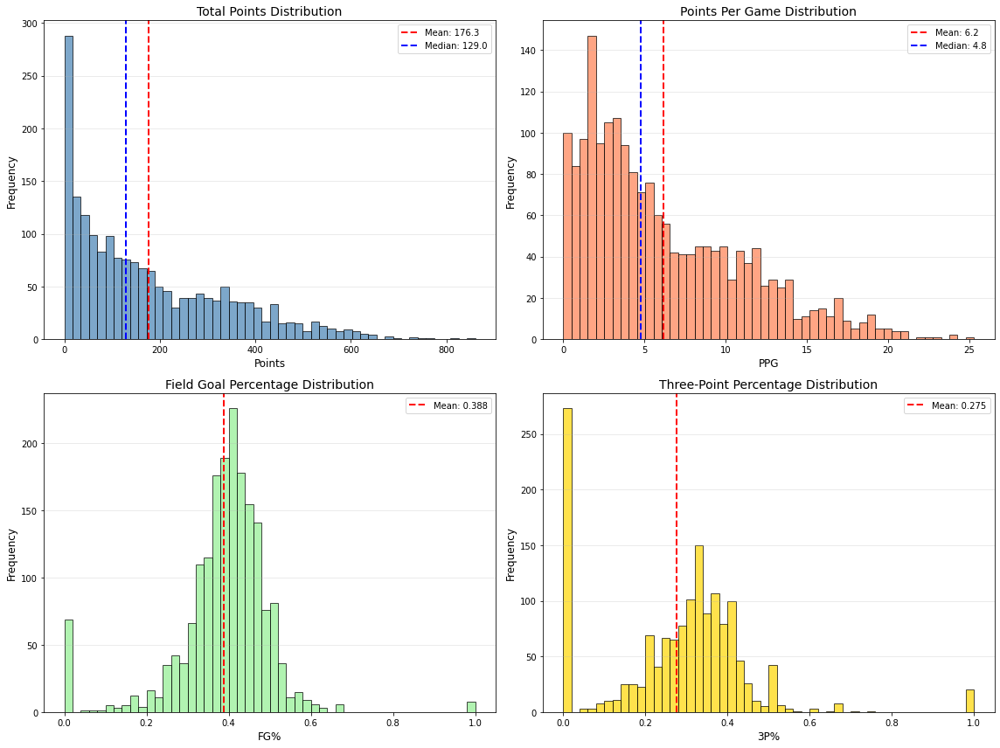


=== PERFORMANCE METRICS ===

Efficiency metrics:
       true_shooting_pct  assist_to_turnover   usage_rate
count        1856.000000         1814.000000  1873.000000
mean            0.473093            1.011635     0.398676
std             0.122797            0.656179     0.122780
min             0.000000            0.000000     0.000000
25%             0.435347            0.547097     0.322928
50%             0.493642            0.905048     0.397326
75%             0.533968            1.349621     0.464768
max             1.500000            5.500000     2.000000


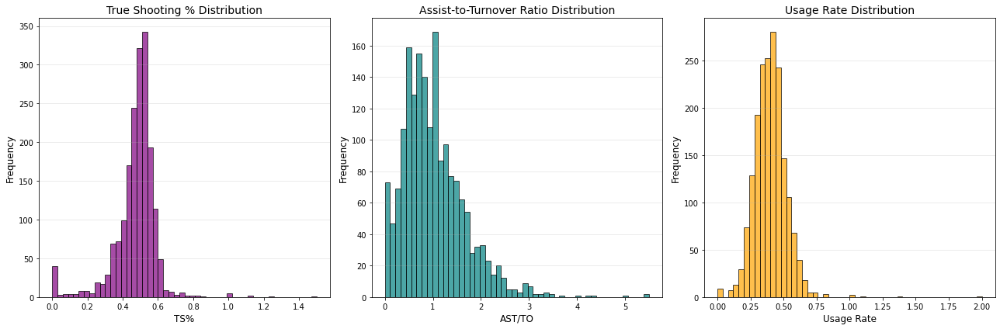

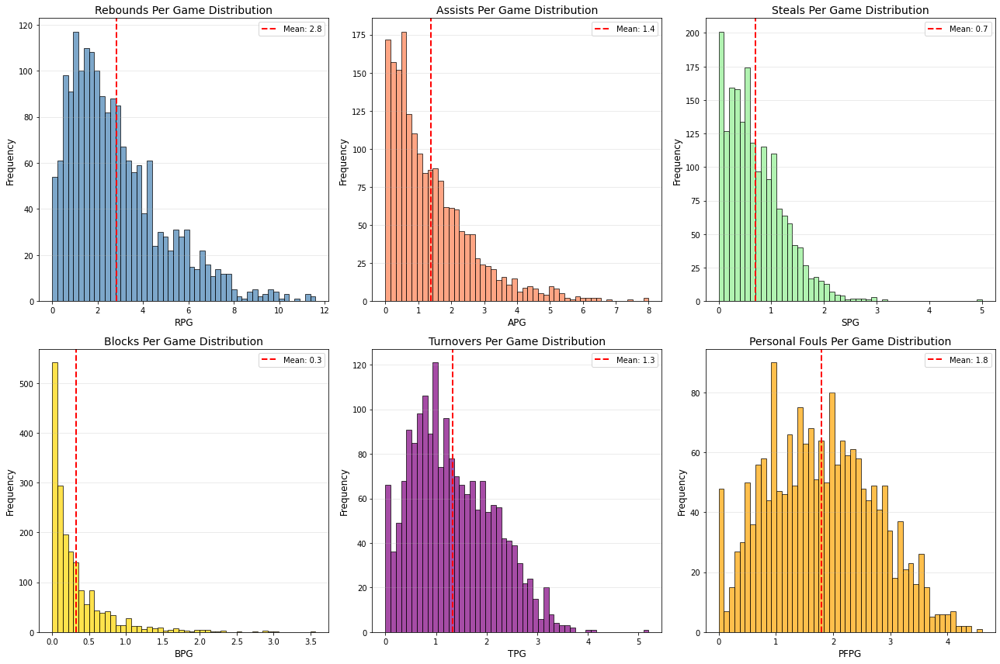


=== SHOOTING BREAKDOWN ===

Average shooting statistics:
FG%: 0.388
2P%: 0.408
3P%: 0.275
FT%: 0.726


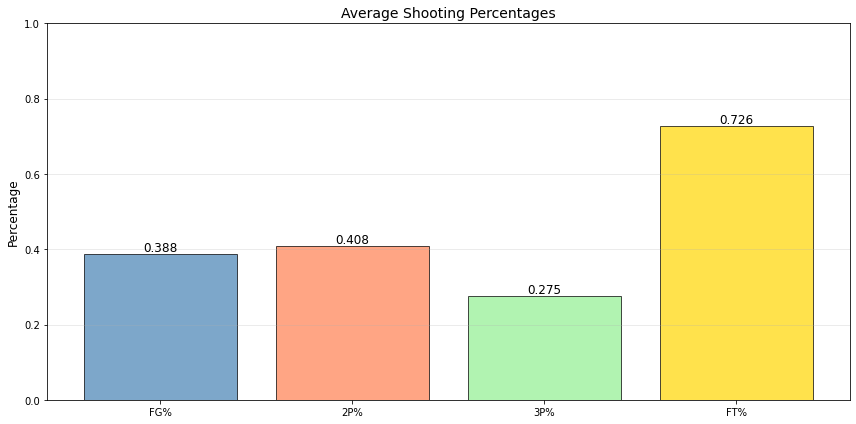


=== GAMES PLAYED ANALYSIS ===


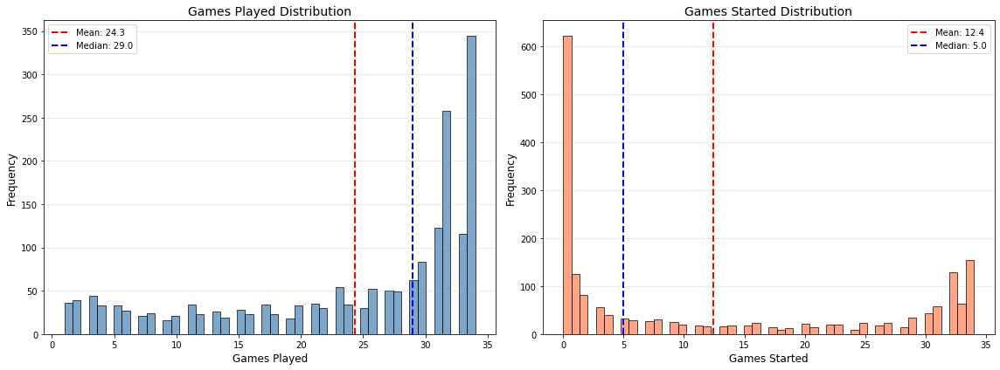

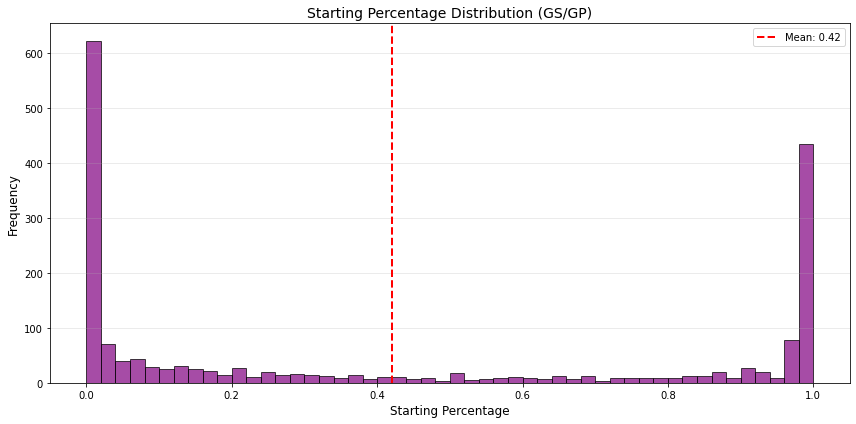

In [101]:
# Descriptive Analysis

print("\n=== DESCRIPTIVE STATISTICS ===")
print("\nRegular season statistics:")
print(players_teams[['GP', 'GS', 'minutes', 'points', 'rebounds', 'assists', 
                     'steals', 'blocks', 'turnovers', 'PF']].describe())

print("\nPer-game statistics:")
print(players_teams[['ppg', 'rpg', 'apg', 'mpg']].describe())

print("\nShooting percentages:")
print(players_teams[['fg_pct', 'ft_pct', 'three_pct']].describe())

print("\n=== SCORING ANALYSIS ===")

# Points distribution
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Total points
axes[0, 0].hist(players_teams['points'].dropna(), bins=50, 
                edgecolor='black', color='steelblue', alpha=0.7)
axes[0, 0].axvline(players_teams['points'].mean(), color='red', 
                   linestyle='--', linewidth=2, label=f'Mean: {players_teams["points"].mean():.1f}')
axes[0, 0].axvline(players_teams['points'].median(), color='blue', 
                   linestyle='--', linewidth=2, label=f'Median: {players_teams["points"].median():.1f}')
axes[0, 0].set_title('Total Points Distribution', fontsize=14)
axes[0, 0].set_xlabel('Points', fontsize=12)
axes[0, 0].set_ylabel('Frequency', fontsize=12)
axes[0, 0].legend()
axes[0, 0].grid(axis='y', alpha=0.3)

# Points per game
axes[0, 1].hist(players_teams['ppg'].dropna(), bins=50, 
                edgecolor='black', color='coral', alpha=0.7)
axes[0, 1].axvline(players_teams['ppg'].mean(), color='red', 
                   linestyle='--', linewidth=2, label=f'Mean: {players_teams["ppg"].mean():.1f}')
axes[0, 1].axvline(players_teams['ppg'].median(), color='blue', 
                   linestyle='--', linewidth=2, label=f'Median: {players_teams["ppg"].median():.1f}')
axes[0, 1].set_title('Points Per Game Distribution', fontsize=14)
axes[0, 1].set_xlabel('PPG', fontsize=12)
axes[0, 1].set_ylabel('Frequency', fontsize=12)
axes[0, 1].legend()
axes[0, 1].grid(axis='y', alpha=0.3)

# Field goal percentage
axes[1, 0].hist(players_teams['fg_pct'].dropna(), bins=50, 
                edgecolor='black', color='lightgreen', alpha=0.7)
axes[1, 0].axvline(players_teams['fg_pct'].mean(), color='red', 
                   linestyle='--', linewidth=2, label=f'Mean: {players_teams["fg_pct"].mean():.3f}')
axes[1, 0].set_title('Field Goal Percentage Distribution', fontsize=14)
axes[1, 0].set_xlabel('FG%', fontsize=12)
axes[1, 0].set_ylabel('Frequency', fontsize=12)
axes[1, 0].legend()
axes[1, 0].grid(axis='y', alpha=0.3)

# Three-point percentage
axes[1, 1].hist(players_teams['three_pct'].dropna(), bins=50, 
                edgecolor='black', color='gold', alpha=0.7)
axes[1, 1].axvline(players_teams['three_pct'].mean(), color='red', 
                   linestyle='--', linewidth=2, label=f'Mean: {players_teams["three_pct"].mean():.3f}')
axes[1, 1].set_title('Three-Point Percentage Distribution', fontsize=14)
axes[1, 1].set_xlabel('3P%', fontsize=12)
axes[1, 1].set_ylabel('Frequency', fontsize=12)
axes[1, 1].legend()
axes[1, 1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print("\n=== PERFORMANCE METRICS ===")

# Calculate efficiency metrics
players_teams['true_shooting_pct'] = np.where(
    (2 * (players_teams['fgAttempted'] + 0.44 * players_teams['ftAttempted'])) > 0,
    players_teams['points'] / (2 * (players_teams['fgAttempted'] + 0.44 * players_teams['ftAttempted'])),
    np.nan
)

players_teams['assist_to_turnover'] = np.where(
    players_teams['turnovers'] > 0,
    players_teams['assists'] / players_teams['turnovers'],
    np.nan
)

players_teams['usage_rate'] = np.where(
    players_teams['minutes'] > 0,
    (players_teams['fgAttempted'] + 0.44 * players_teams['ftAttempted'] + players_teams['turnovers']) / 
    players_teams['minutes'],
    np.nan
)

print("\nEfficiency metrics:")
print(players_teams[['true_shooting_pct', 'assist_to_turnover', 'usage_rate']].describe())

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].hist(players_teams['true_shooting_pct'].dropna(), bins=50, 
             edgecolor='black', color='purple', alpha=0.7)
axes[0].set_title('True Shooting % Distribution', fontsize=14)
axes[0].set_xlabel('TS%', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)
axes[0].grid(axis='y', alpha=0.3)

axes[1].hist(players_teams['assist_to_turnover'].dropna(), bins=50, 
             edgecolor='black', color='teal', alpha=0.7)
axes[1].set_title('Assist-to-Turnover Ratio Distribution', fontsize=14)
axes[1].set_xlabel('AST/TO', fontsize=12)
axes[1].set_ylabel('Frequency', fontsize=12)
axes[1].grid(axis='y', alpha=0.3)

axes[2].hist(players_teams['usage_rate'].dropna(), bins=50, 
             edgecolor='black', color='orange', alpha=0.7)
axes[2].set_title('Usage Rate Distribution', fontsize=14)
axes[2].set_xlabel('Usage Rate', fontsize=12)
axes[2].set_ylabel('Frequency', fontsize=12)
axes[2].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Rebounds per game
axes[0, 0].hist(players_teams['rpg'].dropna(), bins=50, 
                edgecolor='black', color='steelblue', alpha=0.7)
axes[0, 0].axvline(players_teams['rpg'].mean(), color='red', 
                   linestyle='--', linewidth=2, label=f'Mean: {players_teams["rpg"].mean():.1f}')
axes[0, 0].set_title('Rebounds Per Game Distribution', fontsize=14)
axes[0, 0].set_xlabel('RPG', fontsize=12)
axes[0, 0].set_ylabel('Frequency', fontsize=12)
axes[0, 0].legend()
axes[0, 0].grid(axis='y', alpha=0.3)

# Assists per game
axes[0, 1].hist(players_teams['apg'].dropna(), bins=50, 
                edgecolor='black', color='coral', alpha=0.7)
axes[0, 1].axvline(players_teams['apg'].mean(), color='red', 
                   linestyle='--', linewidth=2, label=f'Mean: {players_teams["apg"].mean():.1f}')
axes[0, 1].set_title('Assists Per Game Distribution', fontsize=14)
axes[0, 1].set_xlabel('APG', fontsize=12)
axes[0, 1].set_ylabel('Frequency', fontsize=12)
axes[0, 1].legend()
axes[0, 1].grid(axis='y', alpha=0.3)

# Steals per game
players_teams['spg'] = players_teams['steals'] / players_teams['GP']
axes[0, 2].hist(players_teams['spg'].dropna(), bins=50, 
                edgecolor='black', color='lightgreen', alpha=0.7)
axes[0, 2].axvline(players_teams['spg'].mean(), color='red', 
                   linestyle='--', linewidth=2, label=f'Mean: {players_teams["spg"].mean():.1f}')
axes[0, 2].set_title('Steals Per Game Distribution', fontsize=14)
axes[0, 2].set_xlabel('SPG', fontsize=12)
axes[0, 2].set_ylabel('Frequency', fontsize=12)
axes[0, 2].legend()
axes[0, 2].grid(axis='y', alpha=0.3)

# Blocks per game
players_teams['bpg'] = players_teams['blocks'] / players_teams['GP']
axes[1, 0].hist(players_teams['bpg'].dropna(), bins=50, 
                edgecolor='black', color='gold', alpha=0.7)
axes[1, 0].axvline(players_teams['bpg'].mean(), color='red', 
                   linestyle='--', linewidth=2, label=f'Mean: {players_teams["bpg"].mean():.1f}')
axes[1, 0].set_title('Blocks Per Game Distribution', fontsize=14)
axes[1, 0].set_xlabel('BPG', fontsize=12)
axes[1, 0].set_ylabel('Frequency', fontsize=12)
axes[1, 0].legend()
axes[1, 0].grid(axis='y', alpha=0.3)

# Turnovers per game
players_teams['tpg'] = players_teams['turnovers'] / players_teams['GP']
axes[1, 1].hist(players_teams['tpg'].dropna(), bins=50, 
                edgecolor='black', color='purple', alpha=0.7)
axes[1, 1].axvline(players_teams['tpg'].mean(), color='red', 
                   linestyle='--', linewidth=2, label=f'Mean: {players_teams["tpg"].mean():.1f}')
axes[1, 1].set_title('Turnovers Per Game Distribution', fontsize=14)
axes[1, 1].set_xlabel('TPG', fontsize=12)
axes[1, 1].set_ylabel('Frequency', fontsize=12)
axes[1, 1].legend()
axes[1, 1].grid(axis='y', alpha=0.3)

# Personal fouls per game
players_teams['pfpg'] = players_teams['PF'] / players_teams['GP']
axes[1, 2].hist(players_teams['pfpg'].dropna(), bins=50, 
                edgecolor='black', color='orange', alpha=0.7)
axes[1, 2].axvline(players_teams['pfpg'].mean(), color='red', 
                   linestyle='--', linewidth=2, label=f'Mean: {players_teams["pfpg"].mean():.1f}')
axes[1, 2].set_title('Personal Fouls Per Game Distribution', fontsize=14)
axes[1, 2].set_xlabel('PFPG', fontsize=12)
axes[1, 2].set_ylabel('Frequency', fontsize=12)
axes[1, 2].legend()
axes[1, 2].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Calculate shooting attempts breakdown
players_teams['two_pt_attempted'] = players_teams['fgAttempted'] - players_teams['threeAttempted']
players_teams['two_pt_made'] = players_teams['fgMade'] - players_teams['threeMade']
players_teams['two_pt_pct'] = np.where(
    players_teams['two_pt_attempted'] > 0,
    players_teams['two_pt_made'] / players_teams['two_pt_attempted'],
    np.nan
)

print("\n=== SHOOTING BREAKDOWN ===")
print("\nAverage shooting statistics:")
print(f"FG%: {players_teams['fg_pct'].mean():.3f}")
print(f"2P%: {players_teams['two_pt_pct'].mean():.3f}")
print(f"3P%: {players_teams['three_pct'].mean():.3f}")
print(f"FT%: {players_teams['ft_pct'].mean():.3f}")

# Shooting percentages comparison
fig, ax = plt.subplots(figsize=(12, 6))
shooting_pcts = {
    'FG%': players_teams['fg_pct'].mean(),
    '2P%': players_teams['two_pt_pct'].mean(),
    '3P%': players_teams['three_pct'].mean(),
    'FT%': players_teams['ft_pct'].mean()
}
colors = ['steelblue', 'coral', 'lightgreen', 'gold']
bars = ax.bar(shooting_pcts.keys(), shooting_pcts.values(), 
              color=colors, edgecolor='black', alpha=0.7)
ax.set_title('Average Shooting Percentages', fontsize=14)
ax.set_ylabel('Percentage', fontsize=12)
ax.set_ylim(0, 1)
ax.grid(axis='y', alpha=0.3)

for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{height:.3f}', ha='center', va='bottom', fontsize=12)

plt.tight_layout()
plt.show()

print("\n=== GAMES PLAYED ANALYSIS ===")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Games played distribution
axes[0].hist(players_teams['GP'].dropna(), bins=50, 
             edgecolor='black', color='steelblue', alpha=0.7)
axes[0].axvline(players_teams['GP'].mean(), color='red', 
                linestyle='--', linewidth=2, label=f'Mean: {players_teams["GP"].mean():.1f}')
axes[0].axvline(players_teams['GP'].median(), color='blue', 
                linestyle='--', linewidth=2, label=f'Median: {players_teams["GP"].median():.1f}')
axes[0].set_title('Games Played Distribution', fontsize=14)
axes[0].set_xlabel('Games Played', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)
axes[0].legend()
axes[0].grid(axis='y', alpha=0.3)

# Games started distribution
axes[1].hist(players_teams['GS'].dropna(), bins=50, 
             edgecolor='black', color='coral', alpha=0.7)
axes[1].axvline(players_teams['GS'].mean(), color='red', 
                linestyle='--', linewidth=2, label=f'Mean: {players_teams["GS"].mean():.1f}')
axes[1].axvline(players_teams['GS'].median(), color='blue', 
                linestyle='--', linewidth=2, label=f'Median: {players_teams["GS"].median():.1f}')
axes[1].set_title('Games Started Distribution', fontsize=14)
axes[1].set_xlabel('Games Started', fontsize=12)
axes[1].set_ylabel('Frequency', fontsize=12)
axes[1].legend()
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Starting percentage
players_teams['start_pct'] = np.where(
    players_teams['GP'] > 0,
    players_teams['GS'] / players_teams['GP'],
    np.nan
)

plt.figure(figsize=(12, 6))
plt.hist(players_teams['start_pct'].dropna(), bins=50, 
         edgecolor='black', color='purple', alpha=0.7)
plt.axvline(players_teams['start_pct'].mean(), color='red', 
            linestyle='--', linewidth=2, label=f'Mean: {players_teams["start_pct"].mean():.2f}')
plt.title('Starting Percentage Distribution (GS/GP)', fontsize=14)
plt.xlabel('Starting Percentage', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()



=== TEMPORAL ANALYSIS ===


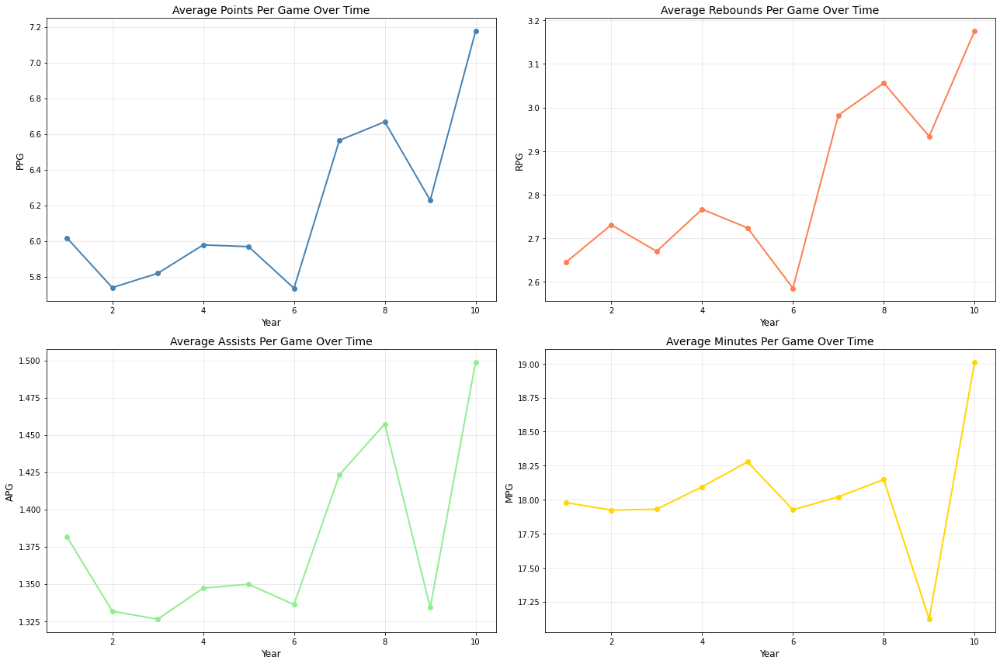

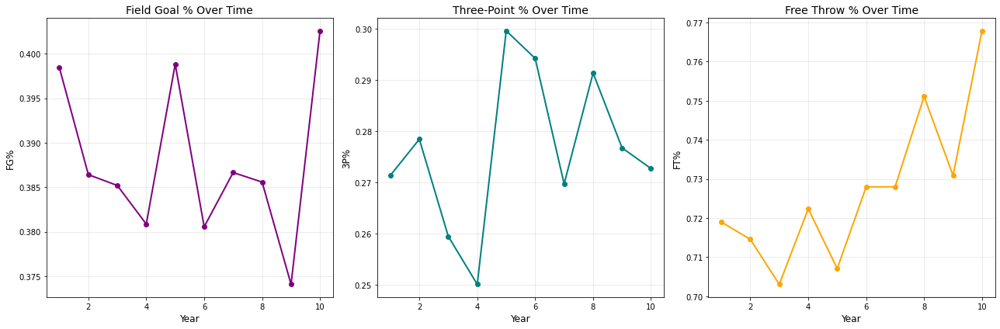

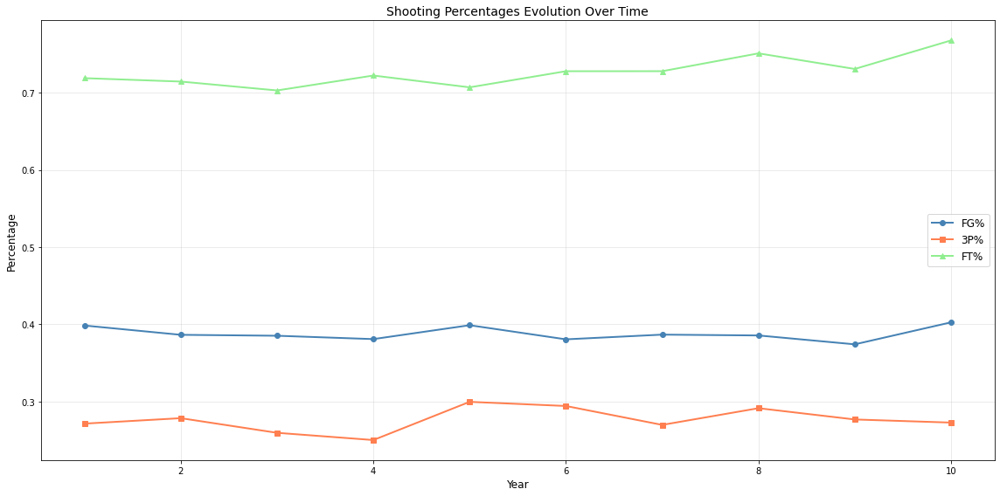

<Figure size 1152x576 with 0 Axes>

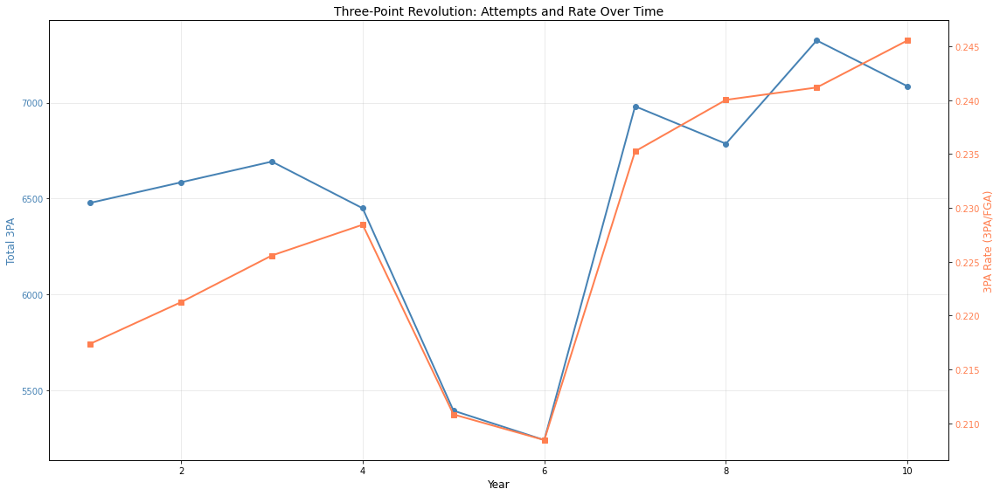

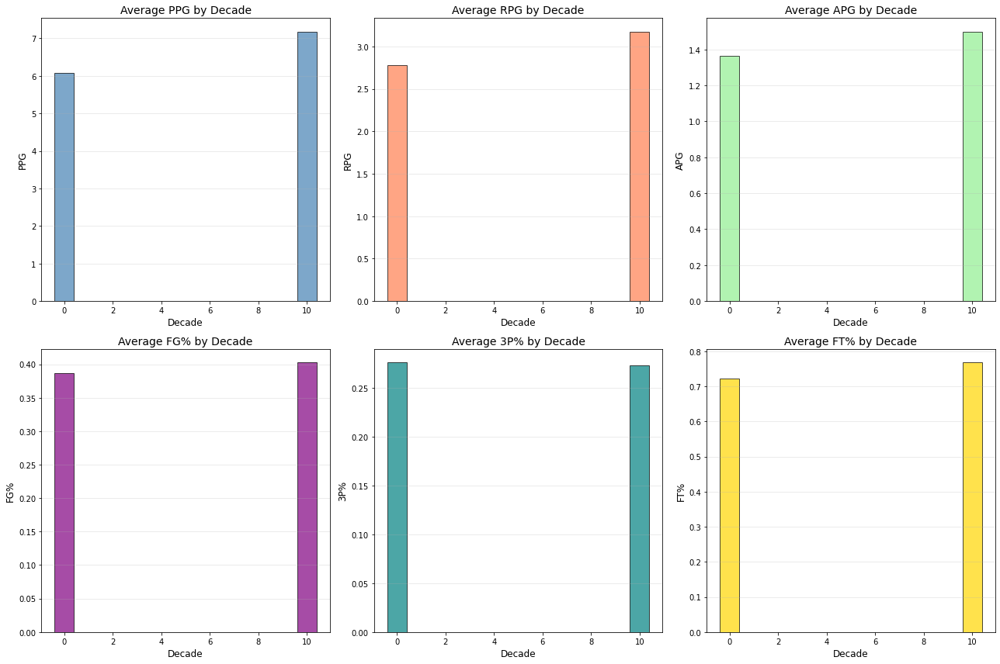

In [102]:
# Temporal Analysis

print("\n=== TEMPORAL ANALYSIS ===")

# Average statistics by year
yearly_stats = players_teams.groupby('year').agg({
    'ppg': 'mean',
    'rpg': 'mean',
    'apg': 'mean',
    'mpg': 'mean',
    'fg_pct': 'mean',
    'three_pct': 'mean',
    'ft_pct': 'mean',
    'GP': 'mean'
}).reset_index()

# Plot evolution of scoring
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# Points per game over time
axes[0, 0].plot(yearly_stats['year'], yearly_stats['ppg'], 
                marker='o', color='steelblue', linewidth=2)
axes[0, 0].set_title('Average Points Per Game Over Time', fontsize=14)
axes[0, 0].set_xlabel('Year', fontsize=12)
axes[0, 0].set_ylabel('PPG', fontsize=12)
axes[0, 0].grid(True, alpha=0.3)

# Rebounds per game over time
axes[0, 1].plot(yearly_stats['year'], yearly_stats['rpg'], 
                marker='o', color='coral', linewidth=2)
axes[0, 1].set_title('Average Rebounds Per Game Over Time', fontsize=14)
axes[0, 1].set_xlabel('Year', fontsize=12)
axes[0, 1].set_ylabel('RPG', fontsize=12)
axes[0, 1].grid(True, alpha=0.3)

# Assists per game over time
axes[1, 0].plot(yearly_stats['year'], yearly_stats['apg'], 
                marker='o', color='lightgreen', linewidth=2)
axes[1, 0].set_title('Average Assists Per Game Over Time', fontsize=14)
axes[1, 0].set_xlabel('Year', fontsize=12)
axes[1, 0].set_ylabel('APG', fontsize=12)
axes[1, 0].grid(True, alpha=0.3)

# Minutes per game over time
axes[1, 1].plot(yearly_stats['year'], yearly_stats['mpg'], 
                marker='o', color='gold', linewidth=2)
axes[1, 1].set_title('Average Minutes Per Game Over Time', fontsize=14)
axes[1, 1].set_xlabel('Year', fontsize=12)
axes[1, 1].set_ylabel('MPG', fontsize=12)
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Shooting percentages evolution
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].plot(yearly_stats['year'], yearly_stats['fg_pct'], 
             marker='o', color='purple', linewidth=2)
axes[0].set_title('Field Goal % Over Time', fontsize=14)
axes[0].set_xlabel('Year', fontsize=12)
axes[0].set_ylabel('FG%', fontsize=12)
axes[0].grid(True, alpha=0.3)

axes[1].plot(yearly_stats['year'], yearly_stats['three_pct'], 
             marker='o', color='teal', linewidth=2)
axes[1].set_title('Three-Point % Over Time', fontsize=14)
axes[1].set_xlabel('Year', fontsize=12)
axes[1].set_ylabel('3P%', fontsize=12)
axes[1].grid(True, alpha=0.3)

axes[2].plot(yearly_stats['year'], yearly_stats['ft_pct'], 
             marker='o', color='orange', linewidth=2)
axes[2].set_title('Free Throw % Over Time', fontsize=14)
axes[2].set_xlabel('Year', fontsize=12)
axes[2].set_ylabel('FT%', fontsize=12)
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Combined shooting percentages
plt.figure(figsize=(16, 8))
plt.plot(yearly_stats['year'], yearly_stats['fg_pct'], 
         marker='o', label='FG%', linewidth=2, color='steelblue')
plt.plot(yearly_stats['year'], yearly_stats['three_pct'], 
         marker='s', label='3P%', linewidth=2, color='coral')
plt.plot(yearly_stats['year'], yearly_stats['ft_pct'], 
         marker='^', label='FT%', linewidth=2, color='lightgreen')
plt.title('Shooting Percentages Evolution Over Time', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Percentage', fontsize=12)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Three-point revolution analysis
three_pt_stats = players_teams.groupby('year').agg({
    'threeAttempted': 'sum',
    'threeMade': 'sum',
    'fgAttempted': 'sum'
}).reset_index()

three_pt_stats['three_pt_rate'] = three_pt_stats['threeAttempted'] / three_pt_stats['fgAttempted']

plt.figure(figsize=(16, 8))
fig, ax1 = plt.subplots(figsize=(16, 8))

color = 'steelblue'
ax1.set_xlabel('Year', fontsize=12)
ax1.set_ylabel('Total 3PA', fontsize=12, color=color)
ax1.plot(three_pt_stats['year'], three_pt_stats['threeAttempted'], 
         marker='o', color=color, linewidth=2, label='3PA')
ax1.tick_params(axis='y', labelcolor=color)
ax1.grid(True, alpha=0.3)

ax2 = ax1.twinx()
color = 'coral'
ax2.set_ylabel('3PA Rate (3PA/FGA)', fontsize=12, color=color)
ax2.plot(three_pt_stats['year'], three_pt_stats['three_pt_rate'], 
         marker='s', color=color, linewidth=2, label='3PA Rate')
ax2.tick_params(axis='y', labelcolor=color)

plt.title('Three-Point Revolution: Attempts and Rate Over Time', fontsize=14)
fig.tight_layout()
plt.show()

# Decade analysis
players_teams['decade'] = (players_teams['year'] // 10) * 10

decade_stats = players_teams.groupby('decade').agg({
    'ppg': 'mean',
    'rpg': 'mean',
    'apg': 'mean',
    'fg_pct': 'mean',
    'three_pct': 'mean',
    'ft_pct': 'mean'
}).reset_index()

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

axes[0, 0].bar(decade_stats['decade'], decade_stats['ppg'], 
               color='steelblue', edgecolor='black', alpha=0.7)
axes[0, 0].set_title('Average PPG by Decade', fontsize=14)
axes[0, 0].set_xlabel('Decade', fontsize=12)
axes[0, 0].set_ylabel('PPG', fontsize=12)
axes[0, 0].grid(axis='y', alpha=0.3)

axes[0, 1].bar(decade_stats['decade'], decade_stats['rpg'], 
               color='coral', edgecolor='black', alpha=0.7)
axes[0, 1].set_title('Average RPG by Decade', fontsize=14)
axes[0, 1].set_xlabel('Decade', fontsize=12)
axes[0, 1].set_ylabel('RPG', fontsize=12)
axes[0, 1].grid(axis='y', alpha=0.3)

axes[0, 2].bar(decade_stats['decade'], decade_stats['apg'], 
               color='lightgreen', edgecolor='black', alpha=0.7)
axes[0, 2].set_title('Average APG by Decade', fontsize=14)
axes[0, 2].set_xlabel('Decade', fontsize=12)
axes[0, 2].set_ylabel('APG', fontsize=12)
axes[0, 2].grid(axis='y', alpha=0.3)

axes[1, 0].bar(decade_stats['decade'], decade_stats['fg_pct'], 
               color='purple', edgecolor='black', alpha=0.7)
axes[1, 0].set_title('Average FG% by Decade', fontsize=14)
axes[1, 0].set_xlabel('Decade', fontsize=12)
axes[1, 0].set_ylabel('FG%', fontsize=12)
axes[1, 0].grid(axis='y', alpha=0.3)

axes[1, 1].bar(decade_stats['decade'], decade_stats['three_pct'], 
               color='teal', edgecolor='black', alpha=0.7)
axes[1, 1].set_title('Average 3P% by Decade', fontsize=14)
axes[1, 1].set_xlabel('Decade', fontsize=12)
axes[1, 1].set_ylabel('3P%', fontsize=12)
axes[1, 1].grid(axis='y', alpha=0.3)

axes[1, 2].bar(decade_stats['decade'], decade_stats['ft_pct'], 
               color='gold', edgecolor='black', alpha=0.7)
axes[1, 2].set_title('Average FT% by Decade', fontsize=14)
axes[1, 2].set_xlabel('Decade', fontsize=12)
axes[1, 2].set_ylabel('FT%', fontsize=12)
axes[1, 2].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()



=== REGULAR SEASON VS PLAYOFFS COMPARISON ===
Records with playoff data: 1876
Percentage of records with playoffs: 100.0%

Regular Season vs Playoffs comparison:
     Regular Season   Playoffs
PPG        6.164894   6.807932
RPG        2.818143   3.066844
APG        1.375451   1.496190
MPG       18.018764  19.850081
FG%        0.387664   0.393615
3P%        0.275499   0.313939
FT%        0.726111   0.749489


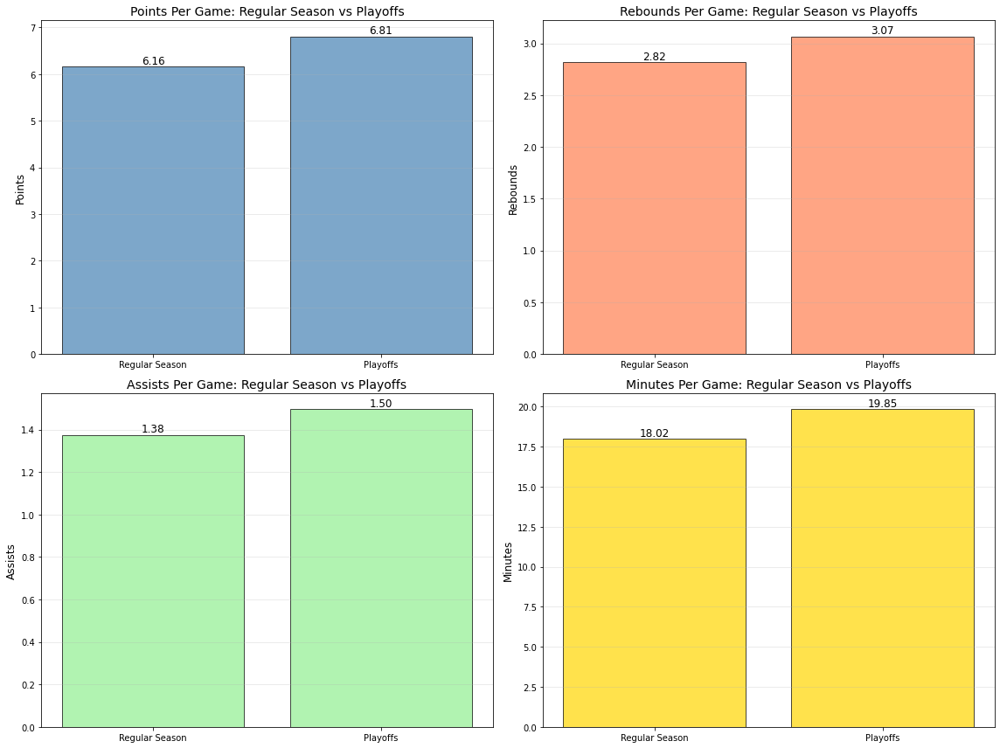

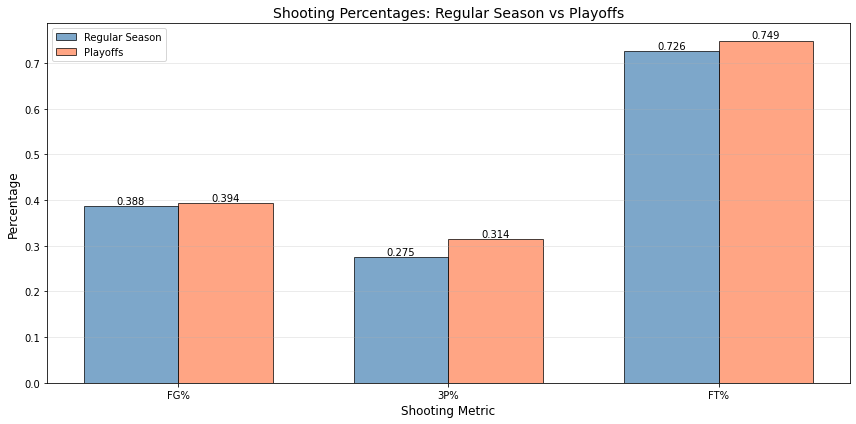

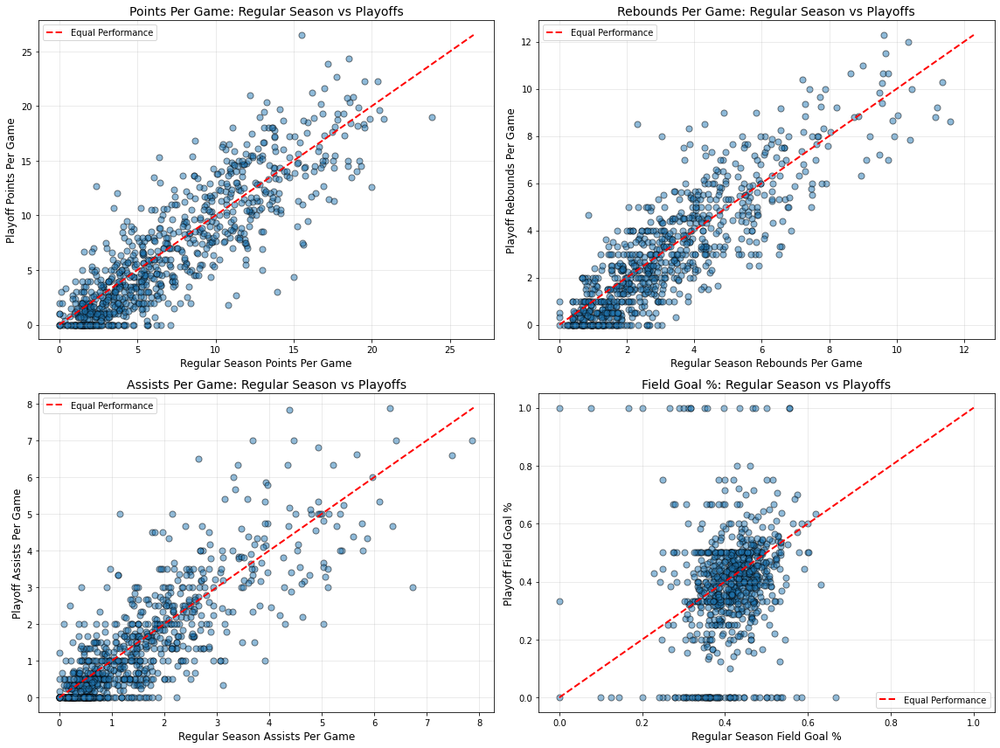


=== TEAM ANALYSIS ===


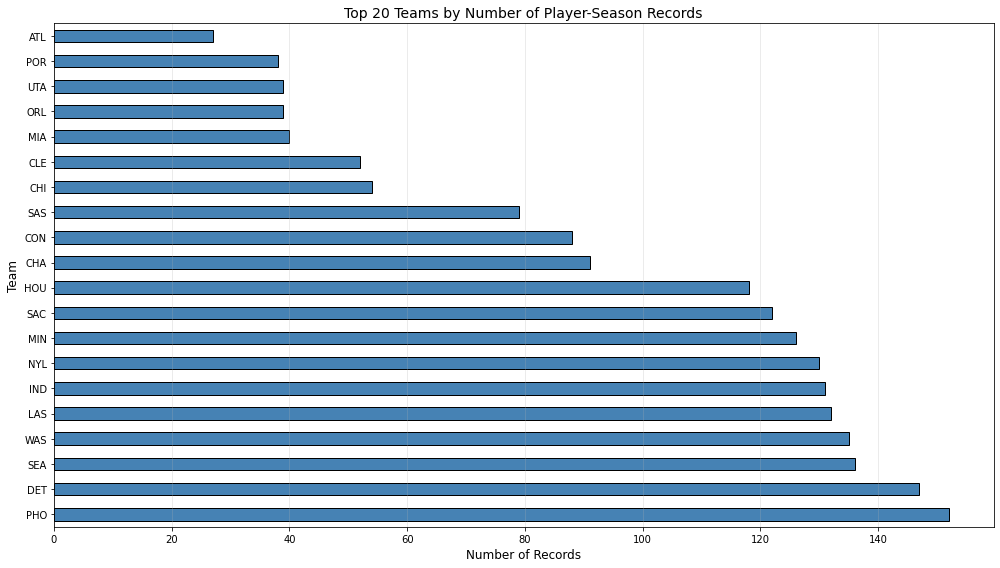


Top 10 teams by average PPG (min 100 records):
           ppg       rpg       apg    fg_pct  num_records
tmID                                                     
LAS   6.586216  3.107752  1.557921  0.393364          132
HOU   6.372029  2.923654  1.404385  0.390615          118
MIN   6.280182  2.688174  1.415952  0.370512          126
SAC   6.270638  2.901159  1.434216  0.402205          122
SEA   6.138787  2.885463  1.296669  0.377347          136
NYL   6.073954  2.647823  1.306926  0.399626          130
PHO   6.033979  2.604748  1.346710  0.379815          152
IND   6.030617  2.774689  1.353624  0.387665          131
WAS   5.985168  2.790067  1.275784  0.380471          135
DET   5.888553  2.931685  1.330220  0.377231          147

=== LEAGUE ANALYSIS ===

League statistics:
           ppg       rpg       apg    fg_pct  three_pct  num_records
lgID                                                                
WNBA  6.164894  2.818143  1.375451  0.387664   0.275499         1876


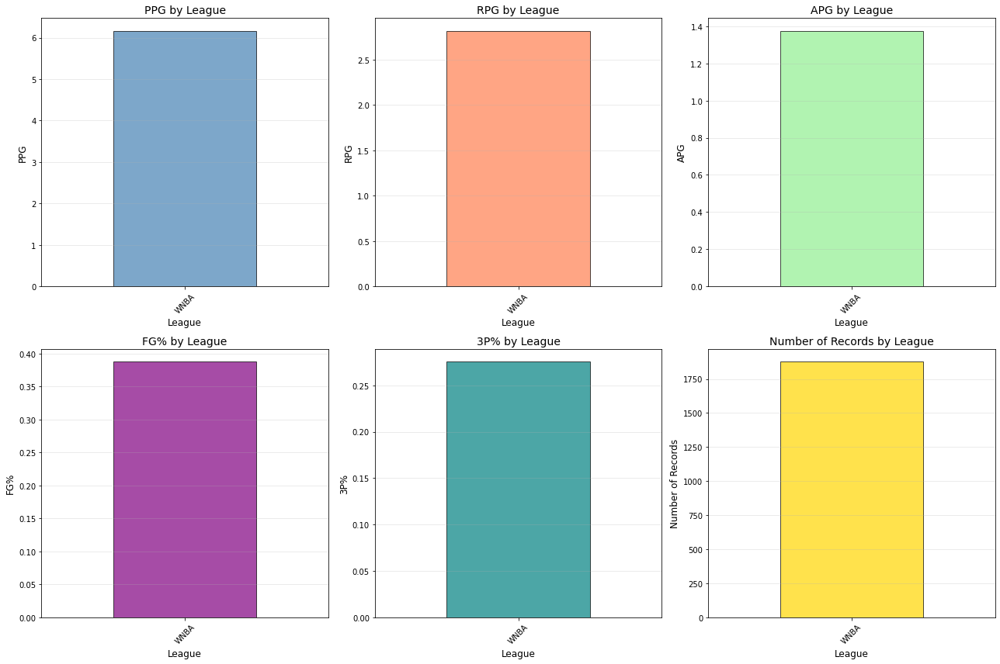


=== STINT ANALYSIS ===

Performance by stint:
            ppg       rpg       apg        mpg         GP  num_records
stint                                                                 
0      6.354904  2.882312  1.408502  18.376082  25.315274         1735
1      3.527563  1.942376  0.891575  13.044861  10.800000           70
2      4.166472  2.122267  1.052657  14.315118  13.514286           70
3      1.000000  1.500000  0.500000   5.500000   2.000000            1


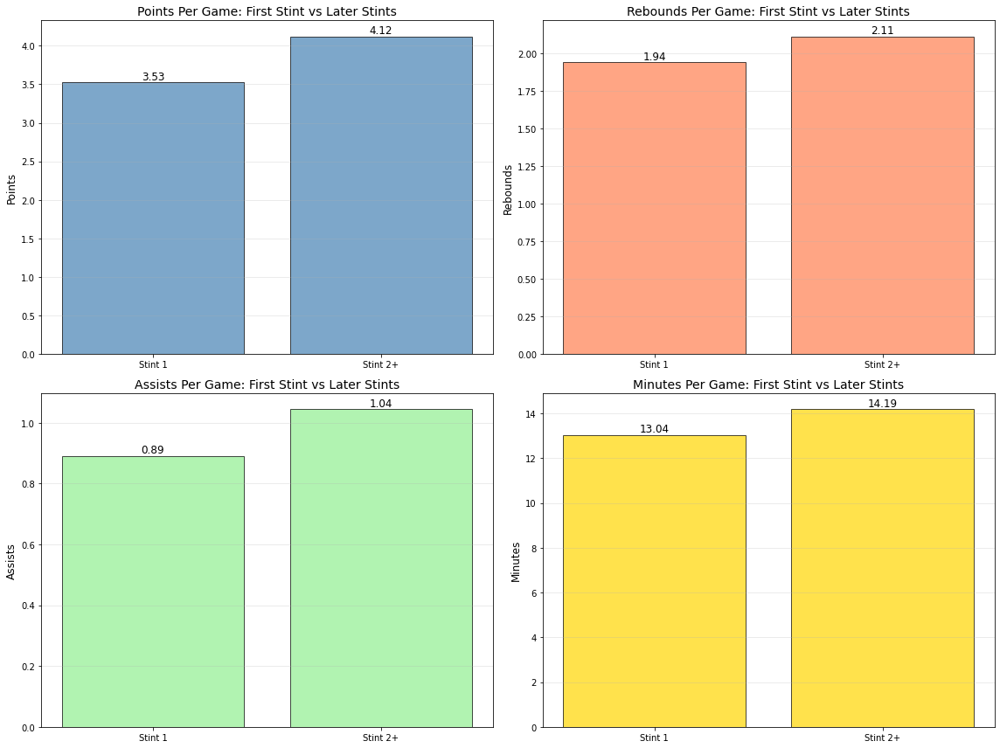

In [103]:
# Comparative Analysis

print("\n=== REGULAR SEASON VS PLAYOFFS COMPARISON ===")

# Filter records with playoff data
playoff_data = players_teams[players_teams['PostGP'].notna()].copy()

print(f"Records with playoff data: {len(playoff_data)}")
print(f"Percentage of records with playoffs: {len(playoff_data)/len(players_teams)*100:.1f}%")

# Calculate playoff per-game stats
playoff_data['post_ppg'] = playoff_data['PostPoints'] / playoff_data['PostGP']
playoff_data['post_rpg'] = playoff_data['PostRebounds'] / playoff_data['PostGP']
playoff_data['post_apg'] = playoff_data['PostAssists'] / playoff_data['PostGP']
playoff_data['post_mpg'] = playoff_data['PostMinutes'] / playoff_data['PostGP']

playoff_data['post_fg_pct'] = np.where(
    playoff_data['PostfgAttempted'] > 0,
    playoff_data['PostfgMade'] / playoff_data['PostfgAttempted'],
    np.nan
)
playoff_data['post_three_pct'] = np.where(
    playoff_data['PostthreeAttempted'] > 0,
    playoff_data['PostthreeMade'] / playoff_data['PostthreeAttempted'],
    np.nan
)
playoff_data['post_ft_pct'] = np.where(
    playoff_data['PostftAttempted'] > 0,
    playoff_data['PostftMade'] / playoff_data['PostftAttempted'],
    np.nan
)

# Compare regular season vs playoffs
comparison_stats = pd.DataFrame({
    'Regular Season': [
        playoff_data['ppg'].mean(),
        playoff_data['rpg'].mean(),
        playoff_data['apg'].mean(),
        playoff_data['mpg'].mean(),
        playoff_data['fg_pct'].mean(),
        playoff_data['three_pct'].mean(),
        playoff_data['ft_pct'].mean()
    ],
    'Playoffs': [
        playoff_data['post_ppg'].mean(),
        playoff_data['post_rpg'].mean(),
        playoff_data['post_apg'].mean(),
        playoff_data['post_mpg'].mean(),
        playoff_data['post_fg_pct'].mean(),
        playoff_data['post_three_pct'].mean(),
        playoff_data['post_ft_pct'].mean()
    ]
}, index=['PPG', 'RPG', 'APG', 'MPG', 'FG%', '3P%', 'FT%'])

print("\nRegular Season vs Playoffs comparison:")
print(comparison_stats)

# Visualize comparison
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

metrics = ['ppg', 'rpg', 'apg', 'mpg']
post_metrics = ['post_ppg', 'post_rpg', 'post_apg', 'post_mpg']
titles = ['Points Per Game', 'Rebounds Per Game', 'Assists Per Game', 'Minutes Per Game']
colors = ['steelblue', 'coral', 'lightgreen', 'gold']

for idx, (metric, post_metric, title, color) in enumerate(zip(metrics, post_metrics, titles, colors)):
    ax = axes[idx // 2, idx % 2]
    
    x = np.arange(2)
    values = [playoff_data[metric].mean(), playoff_data[post_metric].mean()]
    
    bars = ax.bar(x, values, color=color, edgecolor='black', alpha=0.7)
    ax.set_xticks(x)
    ax.set_xticklabels(['Regular Season', 'Playoffs'])
    ax.set_title(f'{title}: Regular Season vs Playoffs', fontsize=14)
    ax.set_ylabel(title.split()[0], fontsize=12)
    ax.grid(axis='y', alpha=0.3)
    
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.2f}', ha='center', va='bottom', fontsize=12)

plt.tight_layout()
plt.show()

# Shooting percentages comparison
fig, ax = plt.subplots(figsize=(12, 6))

x = np.arange(3)
width = 0.35

regular_pcts = [
    playoff_data['fg_pct'].mean(),
    playoff_data['three_pct'].mean(),
    playoff_data['ft_pct'].mean()
]
playoff_pcts = [
    playoff_data['post_fg_pct'].mean(),
    playoff_data['post_three_pct'].mean(),
    playoff_data['post_ft_pct'].mean()
]

bars1 = ax.bar(x - width/2, regular_pcts, width, label='Regular Season',
               color='steelblue', edgecolor='black', alpha=0.7)
bars2 = ax.bar(x + width/2, playoff_pcts, width, label='Playoffs',
               color='coral', edgecolor='black', alpha=0.7)

ax.set_xlabel('Shooting Metric', fontsize=12)
ax.set_ylabel('Percentage', fontsize=12)
ax.set_title('Shooting Percentages: Regular Season vs Playoffs', fontsize=14)
ax.set_xticks(x)
ax.set_xticklabels(['FG%', '3P%', 'FT%'])
ax.legend()
ax.grid(axis='y', alpha=0.3)

for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.3f}', ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

# Scatter plots: Regular vs Playoff performance
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

scatter_pairs = [
    ('ppg', 'post_ppg', 'Points Per Game'),
    ('rpg', 'post_rpg', 'Rebounds Per Game'),
    ('apg', 'post_apg', 'Assists Per Game'),
    ('fg_pct', 'post_fg_pct', 'Field Goal %')
]

for idx, (reg_col, post_col, title) in enumerate(scatter_pairs):
    ax = axes[idx // 2, idx % 2]
    
    valid_data = playoff_data[[reg_col, post_col]].dropna()
    
    ax.scatter(valid_data[reg_col], valid_data[post_col], 
               alpha=0.5, edgecolors='black', s=50)
    
    # Add diagonal line (y=x)
    min_val = min(valid_data[reg_col].min(), valid_data[post_col].min())
    max_val = max(valid_data[reg_col].max(), valid_data[post_col].max())
    ax.plot([min_val, max_val], [min_val, max_val], 
            'r--', linewidth=2, label='Equal Performance')
    
    ax.set_xlabel(f'Regular Season {title}', fontsize=12)
    ax.set_ylabel(f'Playoff {title}', fontsize=12)
    ax.set_title(f'{title}: Regular Season vs Playoffs', fontsize=14)
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n=== TEAM ANALYSIS ===")

# Top teams by number of player-seasons
top_teams = players_teams['tmID'].value_counts().head(20)

plt.figure(figsize=(14, 8))
top_teams.plot(kind='barh', color='steelblue', edgecolor='black')
plt.title('Top 20 Teams by Number of Player-Season Records', fontsize=14)
plt.xlabel('Number of Records', fontsize=12)
plt.ylabel('Team', fontsize=12)
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# Average team performance
team_stats = players_teams.groupby('tmID').agg({
    'ppg': 'mean',
    'rpg': 'mean',
    'apg': 'mean',
    'fg_pct': 'mean',
    'playerID': 'count'
}).rename(columns={'playerID': 'num_records'})

# Filter teams with at least 100 records
team_stats_filtered = team_stats[team_stats['num_records'] >= 100].sort_values('ppg', ascending=False)

print(f"\nTop 10 teams by average PPG (min 100 records):")
print(team_stats_filtered.head(10))

print("\n=== LEAGUE ANALYSIS ===")

league_stats = players_teams.groupby('lgID').agg({
    'ppg': 'mean',
    'rpg': 'mean',
    'apg': 'mean',
    'fg_pct': 'mean',
    'three_pct': 'mean',
    'playerID': 'count'
}).rename(columns={'playerID': 'num_records'})

print("\nLeague statistics:")
print(league_stats)

# Visualize league comparison
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

metrics = ['ppg', 'rpg', 'apg', 'fg_pct', 'three_pct', 'num_records']
titles = ['PPG', 'RPG', 'APG', 'FG%', '3P%', 'Number of Records']
colors = ['steelblue', 'coral', 'lightgreen', 'purple', 'teal', 'gold']

for idx, (metric, title, color) in enumerate(zip(metrics, titles, colors)):
    ax = axes[idx // 3, idx % 3]
    
    league_stats[metric].plot(kind='bar', ax=ax, color=color, edgecolor='black', alpha=0.7)
    ax.set_title(f'{title} by League', fontsize=14)
    ax.set_xlabel('League', fontsize=12)
    ax.set_ylabel(title, fontsize=12)
    ax.grid(axis='y', alpha=0.3)
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

print("\n=== STINT ANALYSIS ===")

# Compare performance by stint
stint_stats = players_teams.groupby('stint').agg({
    'ppg': 'mean',
    'rpg': 'mean',
    'apg': 'mean',
    'mpg': 'mean',
    'GP': 'mean',
    'playerID': 'count'
}).rename(columns={'playerID': 'num_records'})

print("\nPerformance by stint:")
print(stint_stats.head(10))

# Visualize first stint vs later stints
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

stint_1 = players_teams[players_teams['stint'] == 1]
stint_2plus = players_teams[players_teams['stint'] > 1]

metrics = ['ppg', 'rpg', 'apg', 'mpg']
titles = ['Points Per Game', 'Rebounds Per Game', 'Assists Per Game', 'Minutes Per Game']
colors = ['steelblue', 'coral', 'lightgreen', 'gold']

for idx, (metric, title, color) in enumerate(zip(metrics, titles, colors)):
    ax = axes[idx // 2, idx % 2]
    
    x = np.arange(2)
    values = [stint_1[metric].mean(), stint_2plus[metric].mean()]
    
    bars = ax.bar(x, values, color=color, edgecolor='black', alpha=0.7)
    ax.set_xticks(x)
    ax.set_xticklabels(['Stint 1', 'Stint 2+'])
    ax.set_title(f'{title}: First Stint vs Later Stints', fontsize=14)
    ax.set_ylabel(title.split()[0], fontsize=12)
    ax.grid(axis='y', alpha=0.3)
    
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.2f}', ha='center', va='bottom', fontsize=12)

plt.tight_layout()
plt.show()



=== CORRELATION ANALYSIS ===


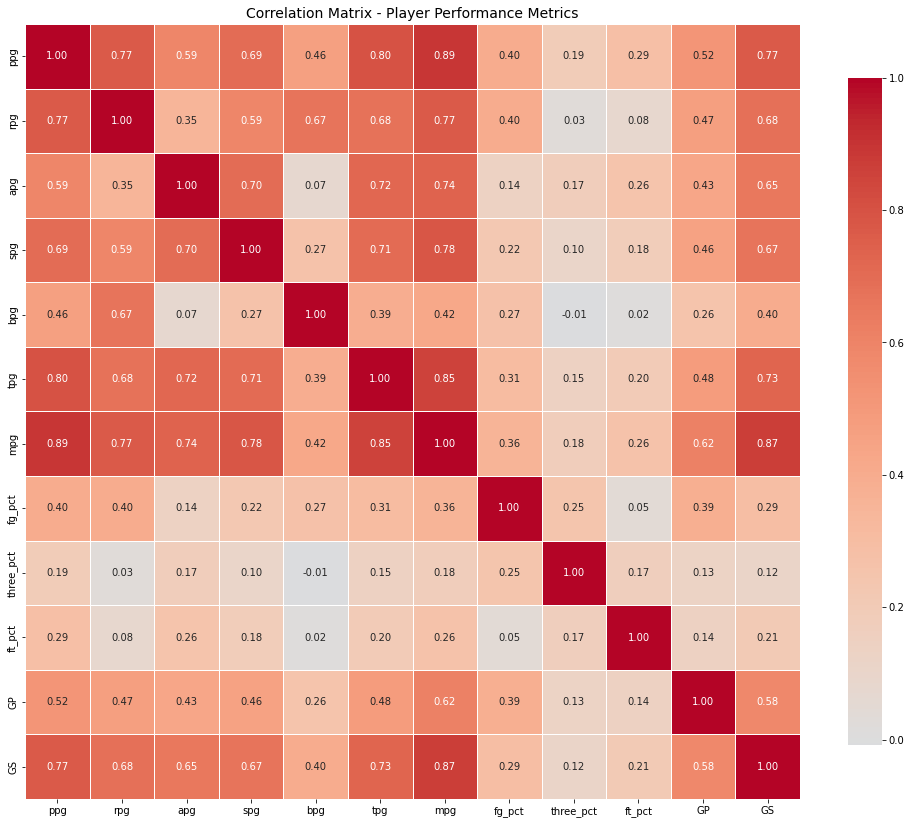


Key correlations with p-values:
ppg vs mpg: r=0.892, p=0.0000 ***
ppg vs fg_pct: r=0.403, p=0.0000 ***
ppg vs three_pct: r=0.192, p=0.0000 ***
apg vs tpg: r=0.717, p=0.0000 ***
rpg vs bpg: r=0.672, p=0.0000 ***
mpg vs GP: r=0.615, p=0.0000 ***
fg_pct vs three_pct: r=0.250, p=0.0000 ***
ppg vs apg: r=0.590, p=0.0000 ***

=== REGRESSION ANALYSIS ===

1. Linear Regression: PPG = f(MPG)
Equation: PPG = 0.444 * MPG + -1.839
R-squared: 0.7949
P-value: 0.0000


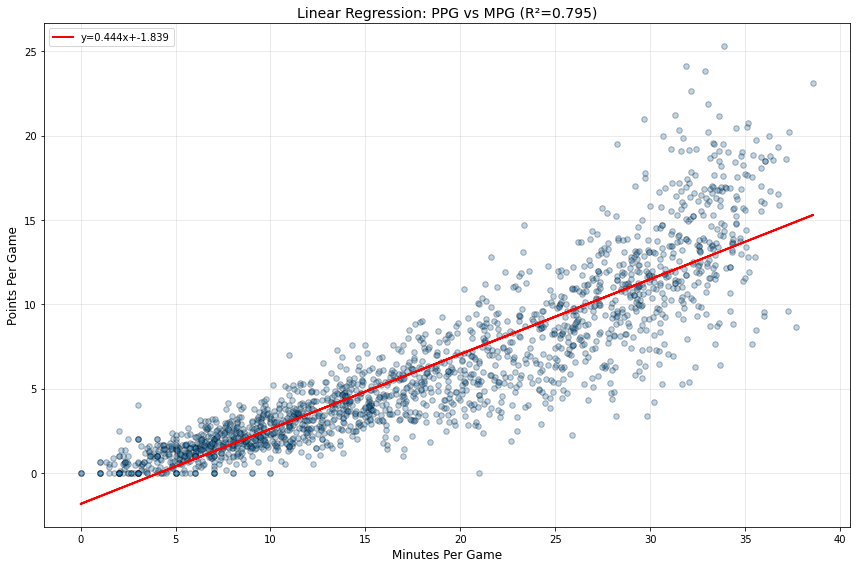


2. Linear Regression: TPG = f(APG)
Equation: TPG = 0.469 * APG + 0.686
R-squared: 0.5145
P-value: 0.0000


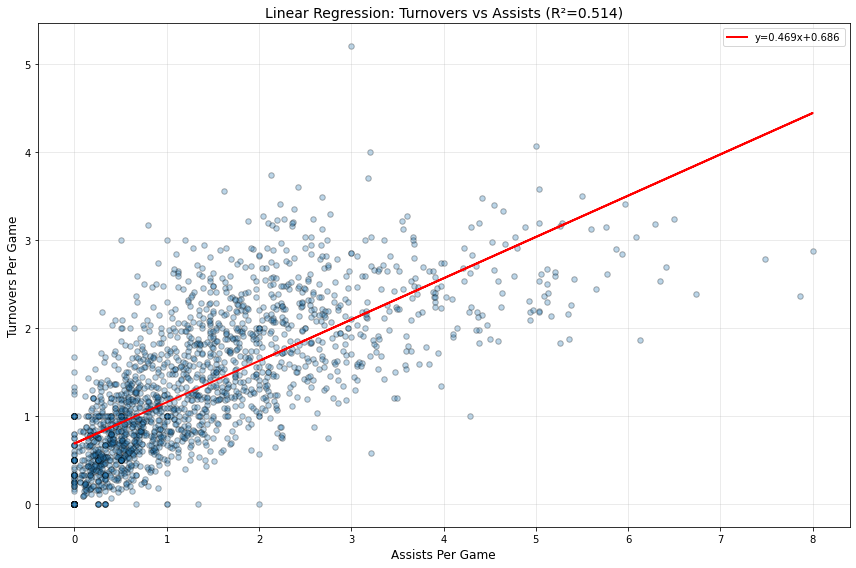


=== T-TESTS ===

1. Paired T-test: Regular Season PPG vs Playoff PPG
T-statistic: 3.9950
P-value: 0.0001
Significant difference: Yes

2. Paired T-test: Regular Season FG% vs Playoff FG%
T-statistic: 3.1310
P-value: 0.0018
Significant difference: Yes

3. T-test: Starters vs Bench Players (PPG)
T-statistic: 50.8198
P-value: 0.0000
Significant difference: Yes
Starters mean PPG: 11.26
Bench mean PPG: 2.86

=== ANOVA ===

1. ANOVA: PPG across decades
F-statistic: 7.7901
P-value: 0.0053
Significant difference: Yes

2. ANOVA: FG% across decades
F-statistic: 2.9115
P-value: 0.0881
Significant difference: No

=== CHI-SQUARE TESTS ===
ppg_category         60
decade_category    1876
dtype: int64

PPG Category Distribution:
Low       916
Medium    493
High      287
Elite     120
Name: ppg_category, dtype: int64

Decade Category Distribution:
1950-1970    0
1970-1990    0
1990-2010    0
2010+        0
Name: decade_category, dtype: int64
No valid data for Chi-square test: Contingency table is empty

In [112]:
# Statistical Analysis

from scipy import stats
from scipy.stats import chi2_contingency

print("\n=== CORRELATION ANALYSIS ===")

corr_vars = ['ppg', 'rpg', 'apg', 'spg', 'bpg', 'tpg', 'mpg', 
             'fg_pct', 'three_pct', 'ft_pct', 'GP', 'GS']
available_corr_vars = [var for var in corr_vars if var in players_teams.columns]

correlation_matrix = players_teams[available_corr_vars].corr()

plt.figure(figsize=(14, 12))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm',
            center=0, square=True, linewidths=1, cbar_kws={"shrink": 0.8})
plt.title('Correlation Matrix - Player Performance Metrics', fontsize=14)
plt.tight_layout()
plt.show()

# Correlations with p-values
print("\nKey correlations with p-values:")
corr_pairs = [
    ('ppg', 'mpg'), ('ppg', 'fg_pct'), ('ppg', 'three_pct'),
    ('apg', 'tpg'), ('rpg', 'bpg'), ('mpg', 'GP'),
    ('fg_pct', 'three_pct'), ('ppg', 'apg')
]

for var1, var2 in corr_pairs:
    if var1 in players_teams.columns and var2 in players_teams.columns:
        valid_data = players_teams[[var1, var2]].dropna()
        if len(valid_data) > 2:
            corr, pval = stats.pearsonr(valid_data[var1], valid_data[var2])
            sig = '***' if pval < 0.001 else '**' if pval < 0.01 else '*' if pval < 0.05 else 'ns'
            print(f"{var1} vs {var2}: r={corr:.3f}, p={pval:.4f} {sig}")

print("\n=== REGRESSION ANALYSIS ===")

# PPG vs MPG
valid_data = players_teams[['mpg', 'ppg']].dropna()
slope, intercept, r_value, p_value, std_err = stats.linregress(
    valid_data['mpg'], valid_data['ppg']
)

print("\n1. Linear Regression: PPG = f(MPG)")
print(f"Equation: PPG = {slope:.3f} * MPG + {intercept:.3f}")
print(f"R-squared: {r_value**2:.4f}")
print(f"P-value: {p_value:.4f}")

plt.figure(figsize=(12, 8))
plt.scatter(valid_data['mpg'], valid_data['ppg'], alpha=0.3, edgecolors='black', s=30)
plt.plot(valid_data['mpg'], slope * valid_data['mpg'] + intercept,
         'r-', linewidth=2, label=f'y={slope:.3f}x+{intercept:.3f}')
plt.title(f'Linear Regression: PPG vs MPG (R²={r_value**2:.3f})', fontsize=14)
plt.xlabel('Minutes Per Game', fontsize=12)
plt.ylabel('Points Per Game', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# APG vs TPG (Assist-to-Turnover relationship)
valid_data = players_teams[['apg', 'tpg']].dropna()
slope2, intercept2, r2, p2, std_err2 = stats.linregress(
    valid_data['apg'], valid_data['tpg']
)

print("\n2. Linear Regression: TPG = f(APG)")
print(f"Equation: TPG = {slope2:.3f} * APG + {intercept2:.3f}")
print(f"R-squared: {r2**2:.4f}")
print(f"P-value: {p2:.4f}")

plt.figure(figsize=(12, 8))
plt.scatter(valid_data['apg'], valid_data['tpg'], alpha=0.3, edgecolors='black', s=30)
plt.plot(valid_data['apg'], slope2 * valid_data['apg'] + intercept2,
         'r-', linewidth=2, label=f'y={slope2:.3f}x+{intercept2:.3f}')
plt.title(f'Linear Regression: Turnovers vs Assists (R²={r2**2:.3f})', fontsize=14)
plt.xlabel('Assists Per Game', fontsize=12)
plt.ylabel('Turnovers Per Game', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("\n=== T-TESTS ===")

# Regular season vs Playoffs (for players with playoff data)
if len(playoff_data) > 0:
    # PPG comparison
    ppg_cleaned = playoff_data['ppg'].dropna()
    post_ppg_cleaned = playoff_data['post_ppg'].dropna()
    aligned_ppg, aligned_post_ppg = ppg_cleaned.align(post_ppg_cleaned, join='inner')
    if len(aligned_ppg) > 0:
        t_stat_ppg, p_ppg = stats.ttest_rel(
            aligned_ppg,
            aligned_post_ppg
        )
        print("\n1. Paired T-test: Regular Season PPG vs Playoff PPG")
        print(f"T-statistic: {t_stat_ppg:.4f}")
        print(f"P-value: {p_ppg:.4f}")
        print(f"Significant difference: {'Yes' if p_ppg < 0.05 else 'No'}")

    # FG% comparison
    valid_fg = playoff_data[['fg_pct', 'post_fg_pct']].dropna()

    if len(valid_fg) > 0:
        fg_pct_cleaned = valid_fg['fg_pct']
        post_fg_pct_cleaned = valid_fg['post_fg_pct']
        aligned_fg_pct, aligned_post_fg_pct = fg_pct_cleaned.align(post_fg_pct_cleaned, join='inner')
        if len(aligned_fg_pct) > 0:
            t_stat_fg, p_fg = stats.ttest_rel(
                aligned_fg_pct,
                aligned_post_fg_pct
            )
            print("\n2. Paired T-test: Regular Season FG% vs Playoff FG%")
            print(f"T-statistic: {t_stat_fg:.4f}")
            print(f"P-value: {p_fg:.4f}")
            print(f"Significant difference: {'Yes' if p_fg < 0.05 else 'No'}")

# Starters vs Bench players
starters = players_teams[players_teams['start_pct'] >= 0.8]
bench = players_teams[players_teams['start_pct'] < 0.2]

if len(starters) > 0 and len(bench) > 0:
    t_stat_start, p_start = stats.ttest_ind(
        starters['ppg'].dropna(),
        bench['ppg'].dropna()
    )
    print("\n3. T-test: Starters vs Bench Players (PPG)")
    print(f"T-statistic: {t_stat_start:.4f}")
    print(f"P-value: {p_start:.4f}")
    print(f"Significant difference: {'Yes' if p_start < 0.05 else 'No'}")
    print(f"Starters mean PPG: {starters['ppg'].mean():.2f}")
    print(f"Bench mean PPG: {bench['ppg'].mean():.2f}")

print("\n=== ANOVA ===")

# Compare PPG across decades
decades = players_teams['decade'].unique()
decade_groups = [players_teams[players_teams['decade'] == d]['ppg'].dropna().values 
                 for d in sorted(decades)]
decade_groups = [g for g in decade_groups if len(g) > 0]

if len(decade_groups) > 1:
    f_stat, p_anova = stats.f_oneway(*decade_groups)
    print("\n1. ANOVA: PPG across decades")
    print(f"F-statistic: {f_stat:.4f}")
    print(f"P-value: {p_anova:.4f}")
    print(f"Significant difference: {'Yes' if p_anova < 0.05 else 'No'}")

# Compare FG% across decades
decade_groups_fg = [players_teams[players_teams['decade'] == d]['fg_pct'].dropna().values 
                    for d in sorted(decades)]
decade_groups_fg = [g for g in decade_groups_fg if len(g) > 0]

if len(decade_groups_fg) > 1:
    f_stat_fg, p_anova_fg = stats.f_oneway(*decade_groups_fg)
    print("\n2. ANOVA: FG% across decades")
    print(f"F-statistic: {f_stat_fg:.4f}")
    print(f"P-value: {p_anova_fg:.4f}")
    print(f"Significant difference: {'Yes' if p_anova_fg < 0.05 else 'No'}")

print("\n=== CHI-SQUARE TESTS ===")

# Create performance categories for PPG
players_teams['ppg_category'] = pd.cut(players_teams['ppg'],
                                        bins=[0, 5, 10, 15, 100],
                                        labels=['Low', 'Medium', 'High', 'Elite'])

# Create decade categories
players_teams['decade_category'] = pd.cut(players_teams['decade'],
                                           bins=[1940, 1970, 1990, 2010, 2030],
                                           labels=['1950-1970', '1970-1990', '1990-2010', '2010+'])

print(players_teams[['ppg_category', 'decade_category']].isnull().sum())

print("\nPPG Category Distribution:")
print(players_teams['ppg_category'].value_counts())

print("\nDecade Category Distribution:")
print(players_teams['decade_category'].value_counts())

players_teams_filtered = players_teams.dropna(subset=['ppg_category', 'decade_category'])

contingency_ppg_decade = pd.crosstab(
    players_teams_filtered['ppg_category'],
    players_teams_filtered['decade_category']
)

if contingency_ppg_decade.size > 0:
    chi2, p_value, dof, expected = chi2_contingency(contingency_ppg_decade)

    print("\n1. Chi-square: PPG categories across decades")
    print(f"Chi-square statistic: {chi2:.4f}")
    print(f"P-value: {p_value:.4f}")
    print(f"Degrees of freedom: {dof}")
    print(f"Significant association: {'Yes' if p_value < 0.05 else 'No'}")
else:
    print("No valid data for Chi-square test: Contingency table is empty.")

print("\n=== NORMALITY TESTS (Shapiro-Wilk) ===")

# Test on sample (Shapiro-Wilk has limitations on large datasets)
sample_size = min(5000, len(players_teams))
sample_data = players_teams.sample(sample_size)

for col in ['ppg', 'rpg', 'apg', 'fg_pct', 'three_pct']:
    if col in sample_data.columns:
        data = sample_data[col].dropna()
        if len(data) > 3:
            stat, p_value = stats.shapiro(data)
            print(f"{col}: W={stat:.4f}, p={p_value:.4f} {'(Normal)' if p_value > 0.05 else '(Not Normal)'}")


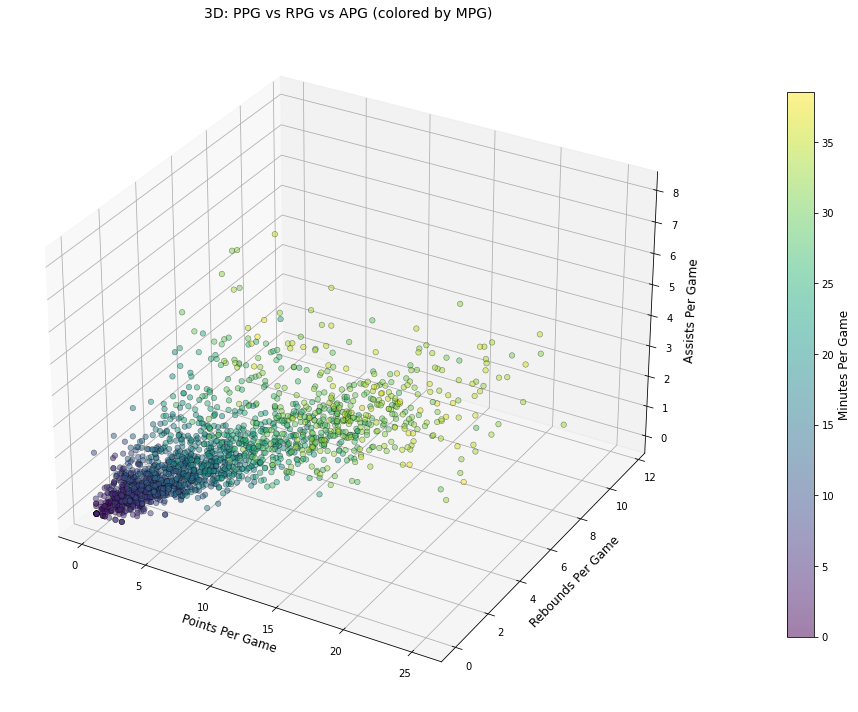

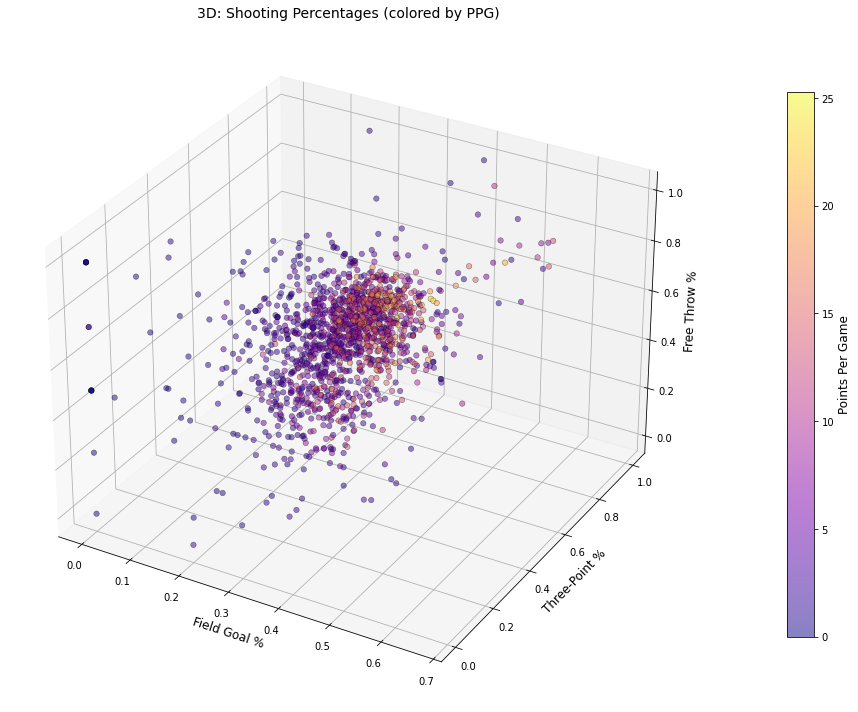

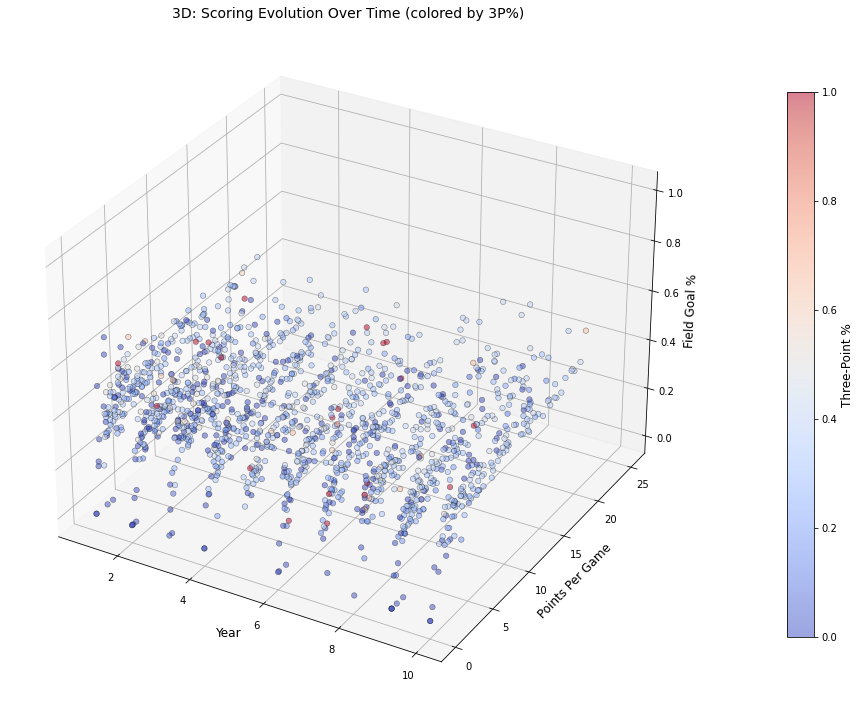

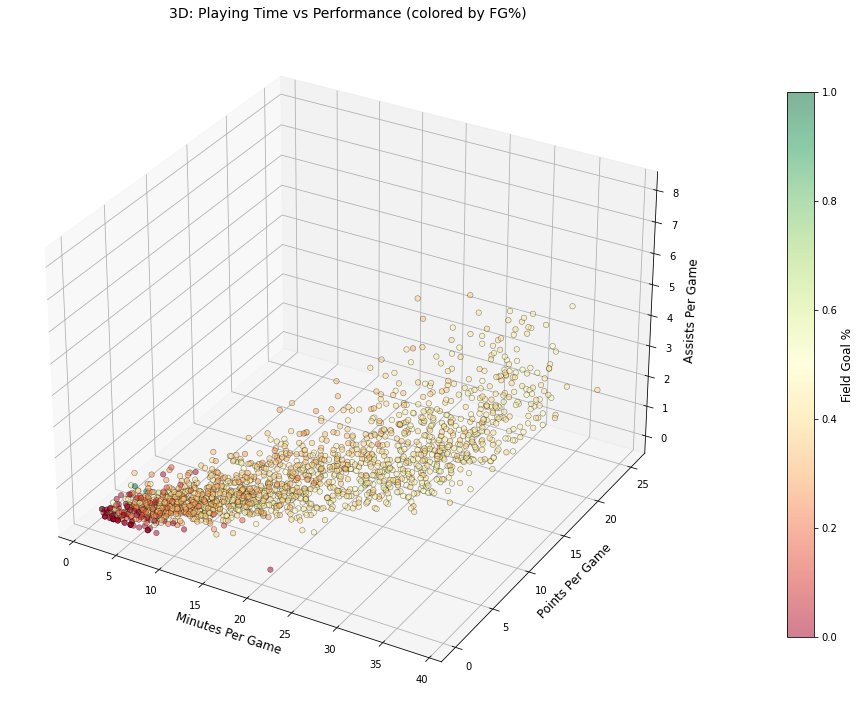

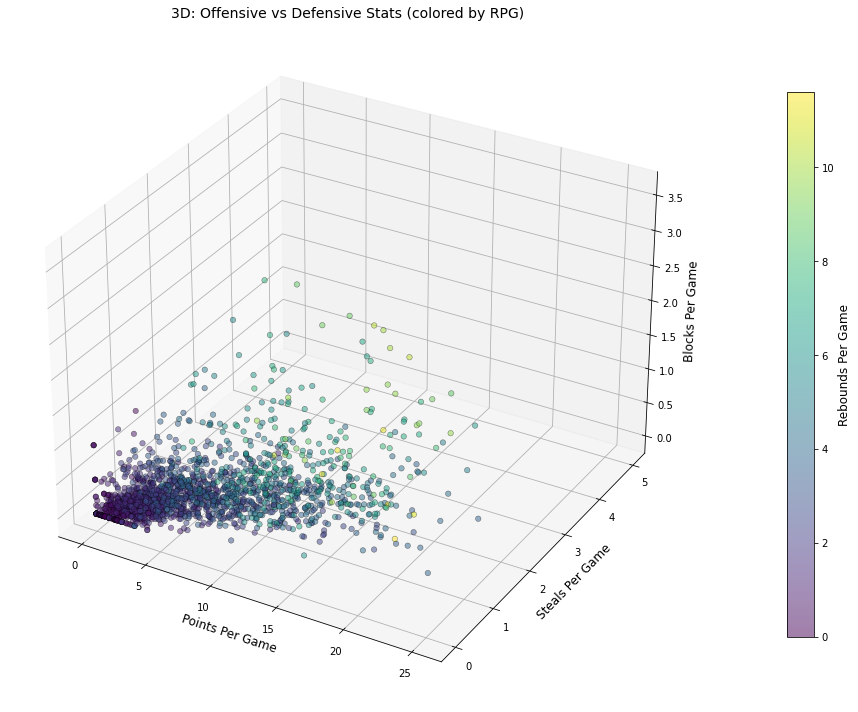

/tmp/ipykernel_6979/3340485066.py:123: UserWarning: Z contains NaN values. This may result in rendering artifacts.
  surf = ax.plot_surface(fg_grid, ft_grid, ts_grid,


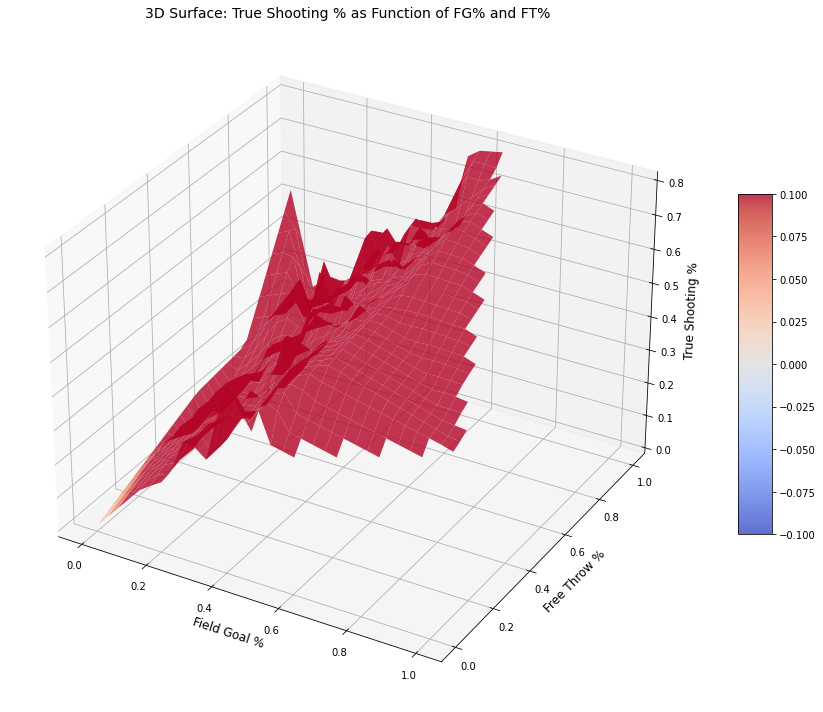

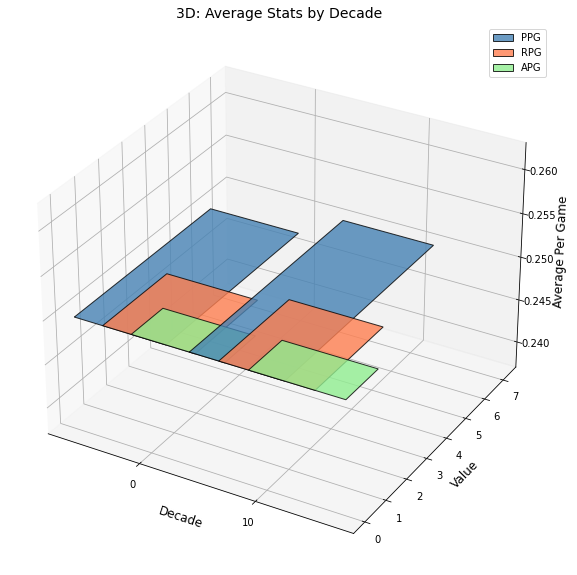

In [121]:
# 3D Visualizations

from mpl_toolkits.mplot3d import Axes3D

# PPG vs RPG vs APG
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(players_teams['ppg'], players_teams['rpg'], players_teams['apg'],
                     c=players_teams['mpg'], cmap='viridis',
                     s=30, alpha=0.5, edgecolors='black', linewidths=0.5)

ax.set_xlabel('Points Per Game', fontsize=12)
ax.set_ylabel('Rebounds Per Game', fontsize=12)
ax.set_zlabel('Assists Per Game', fontsize=12)
ax.set_title('3D: PPG vs RPG vs APG (colored by MPG)', fontsize=14)

cbar = plt.colorbar(scatter, ax=ax, pad=0.1, shrink=0.8)
cbar.set_label('Minutes Per Game', fontsize=12)

plt.tight_layout()
plt.show()

# Shooting percentages in 3D
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(players_teams['fg_pct'], players_teams['three_pct'], 
                     players_teams['ft_pct'],
                     c=players_teams['ppg'], cmap='plasma',
                     s=30, alpha=0.5, edgecolors='black', linewidths=0.5)

ax.set_xlabel('Field Goal %', fontsize=12)
ax.set_ylabel('Three-Point %', fontsize=12)
ax.set_zlabel('Free Throw %', fontsize=12)
ax.set_title('3D: Shooting Percentages (colored by PPG)', fontsize=14)

cbar = plt.colorbar(scatter, ax=ax, pad=0.1, shrink=0.8)
cbar.set_label('Points Per Game', fontsize=12)

plt.tight_layout()
plt.show()

# Performance over time
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(players_teams['year'], players_teams['ppg'], 
                     players_teams['fg_pct'],
                     c=players_teams['three_pct'], cmap='coolwarm',
                     s=30, alpha=0.5, edgecolors='black', linewidths=0.5)

ax.set_xlabel('Year', fontsize=12)
ax.set_ylabel('Points Per Game', fontsize=12)
ax.set_zlabel('Field Goal %', fontsize=12)
ax.set_title('3D: Scoring Evolution Over Time (colored by 3P%)', fontsize=14)

cbar = plt.colorbar(scatter, ax=ax, pad=0.1, shrink=0.8)
cbar.set_label('Three-Point %', fontsize=12)

plt.tight_layout()
plt.show()

# Minutes vs Performance
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(players_teams['mpg'], players_teams['ppg'], 
                     players_teams['apg'],
                     c=players_teams['fg_pct'], cmap='RdYlGn',
                     s=30, alpha=0.5, edgecolors='black', linewidths=0.5)

ax.set_xlabel('Minutes Per Game', fontsize=12)
ax.set_ylabel('Points Per Game', fontsize=12)
ax.set_zlabel('Assists Per Game', fontsize=12)
ax.set_title('3D: Playing Time vs Performance (colored by FG%)', fontsize=14)

cbar = plt.colorbar(scatter, ax=ax, pad=0.1, shrink=0.8)
cbar.set_label('Field Goal %', fontsize=12)

plt.tight_layout()
plt.show()

# Offensive vs Defensive stats
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(players_teams['ppg'], players_teams['spg'], 
                     players_teams['bpg'],
                     c=players_teams['rpg'], cmap='viridis',
                     s=30, alpha=0.5, edgecolors='black', linewidths=0.5)

ax.set_xlabel('Points Per Game', fontsize=12)
ax.set_ylabel('Steals Per Game', fontsize=12)
ax.set_zlabel('Blocks Per Game', fontsize=12)
ax.set_title('3D: Offensive vs Defensive Stats (colored by RPG)', fontsize=14)

cbar = plt.colorbar(scatter, ax=ax, pad=0.1, shrink=0.8)
cbar.set_label('Rebounds Per Game', fontsize=12)

plt.tight_layout()
plt.show()

# True Shooting % as function of FG% and FT%
from scipy.interpolate import griddata

sample_data = players_teams[['fg_pct', 'ft_pct', 'true_shooting_pct']].dropna()
sample_size = len(sample_data)

fg_range = np.linspace(sample_data['fg_pct'].min(), sample_data['fg_pct'].max(), 30)
ft_range = np.linspace(sample_data['ft_pct'].min(), sample_data['ft_pct'].max(), 30)
fg_grid, ft_grid = np.meshgrid(fg_range, ft_range)

ts_grid = griddata(
    (sample_data['fg_pct'], sample_data['ft_pct']),
    sample_data['true_shooting_pct'],
    (fg_grid, ft_grid),
    method='linear'
)

fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(fg_grid, ft_grid, ts_grid,
                       cmap='coolwarm', alpha=0.8, edgecolor='none')

ax.set_xlabel('Field Goal %', fontsize=12)
ax.set_ylabel('Free Throw %', fontsize=12)
ax.set_zlabel('True Shooting %', fontsize=12)
ax.set_title('3D Surface: True Shooting % as Function of FG% and FT%', fontsize=14)

plt.colorbar(surf, ax=ax, shrink=0.5, aspect=10)
plt.tight_layout()
plt.show()

# Decade comparison
decade_stats_3d = players_teams.groupby('decade').agg({
    'ppg': 'mean',
    'rpg': 'mean',
    'apg': 'mean'
}).reset_index()

fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

decades = decade_stats_3d['decade'].values
x_pos = np.arange(len(decades))
width = 0.25

colors = ['steelblue', 'coral', 'lightgreen']
labels = ['PPG', 'RPG', 'APG']

for i, (col, color, label) in enumerate(zip(['ppg', 'rpg', 'apg'], colors, labels)):
    ax.bar(x_pos + i*width, decade_stats_3d[col], width, 
           label=label, color=color, alpha=0.8, edgecolor='black')

ax.set_xlabel('Decade', fontsize=12)
ax.set_ylabel('Value', fontsize=12)
ax.set_zlabel('Average Per Game', fontsize=12)
ax.set_title('3D: Average Stats by Decade', fontsize=14)
ax.set_xticks(x_pos + width)
ax.set_xticklabels(decades.astype(int))
ax.legend()

plt.show()


## Data Analysis `coaches.csv`

Dataset shape: (162, 9)

First few rows:
      coachID  year tmID  lgID  stint  won  lost  post_wins  post_losses
0  adamsmi01w     5  WAS  WNBA      0   17    17          1            2
1  adubari99w     1  NYL  WNBA      0   20    12          4            3
2  adubari99w     2  NYL  WNBA      0   21    11          3            3
3  adubari99w     3  NYL  WNBA      0   18    14          4            4
4  adubari99w     4  NYL  WNBA      0   16    18          0            0
5  adubari99w     5  NYL  WNBA      1    7     9          0            0
6  adubari99w     6  WAS  WNBA      0   16    18          0            0
7  adubari99w     7  WAS  WNBA      0   18    16          0            2
8  adubari99w     8  WAS  WNBA      1    0     4          0            0
9  aglerbr99w     1  MIN  WNBA      0   15    17          0            0

Column names and types:
coachID        object
year            int64
tmID           object
lgID           object
stint           int64
won             int64

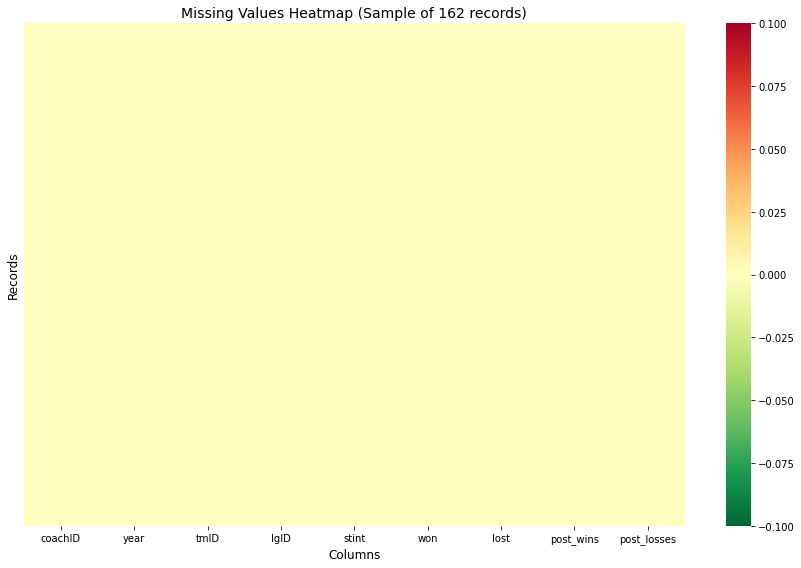


=== UNIQUENESS ===
Total duplicate rows: 0
Duplicate coachID+year+stint combinations: 0

Total records: 162
Unique coaches: 57
Unique years: 10
Unique teams: 20
Unique leagues: 1

Records with stint > 1: 20 (12.3%)
Coaches with multiple teams in same year: 19

=== CONSISTENCY ===

Negative values check:
 won: No negative values
 lost: No negative values
 post_wins: No negative values
 post_losses: No negative values

Total games statistics:
count    162.000000
mean      29.296296
std        7.915618
min        3.000000
25%       32.000000
50%       33.000000
75%       34.000000
max       34.000000
Name: total_games, dtype: float64

Records with unusual total games (<10 or >100): 4
        coachID  year tmID  won  lost  total_games
8    adubari99w     8  WAS    0     4            4
24   bryanjo01w     6  LAS    4     2            6
51   dailesh99w     5  SAS    3     5            8
105  laimbbi01w    10  DET    1     2            3

Records with inconsistent playoff data: 0

Year range

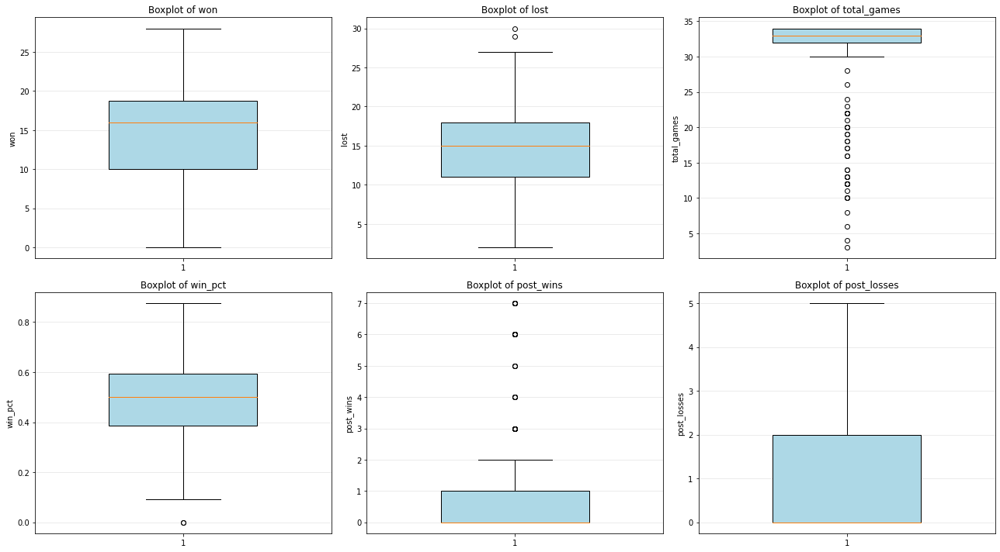


=== TIMELINESS ===

Year range: 1 - 10
Total years covered: 10
Total seasons: 10


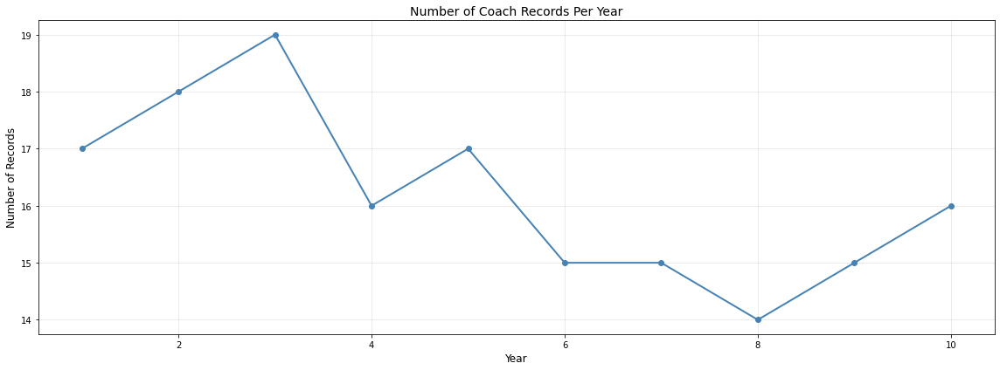

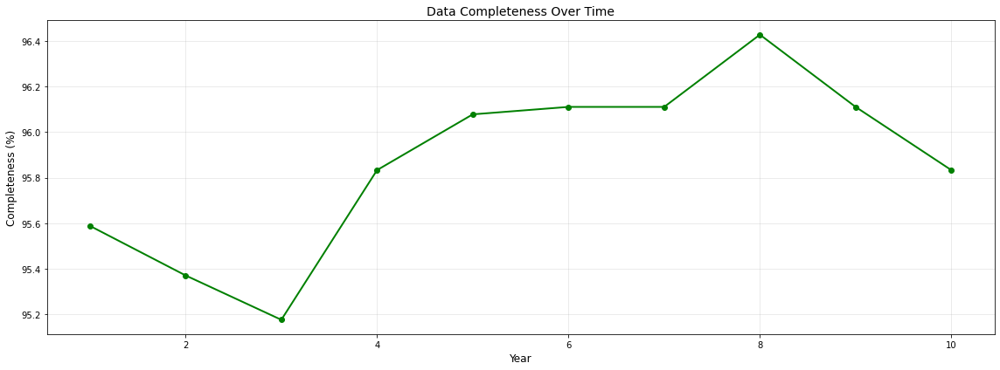


=== VALIDITY ===

Invalid win percentages (<0 or >1): 0
Invalid playoff win percentages (<0 or >1): 0

Unique leagues: ['WNBA']
Unique teams: 20

Top 10 teams by records:
WAS    13
SAC    13
LAS    13
NYL    12
MIN    12
DET    12
PHO    11
IND    10
SEA    10
SAS     9
Name: tmID, dtype: int64

Invalid coachIDs (too short): 0

Perfect seasons (no losses): 0
Winless seasons (no wins): 2

=== DATA QUALITY SUMMARY ===
Total records: 162
Complete records (no missing values): 81
Records with any missing value: 81
Overall data completeness: 95.83%


In [123]:
# Data Quality

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats
from datetime import datetime

coaches = pd.read_csv('../dataset/coaches.csv')

print(f"Dataset shape: {coaches.shape}")
print(f"\nFirst few rows:")
print(coaches.head(10))
print(f"\nColumn names and types:")
print(coaches.dtypes)
print(f"\nDataset info:")
print(coaches.info())

missing_data = coaches.isnull().sum()
missing_percentage = (missing_data / len(coaches)) * 100

print("\n=== COMPLETENESS ===")
print("\nMissing values:")
missing_df = pd.DataFrame({
    'Missing Count': missing_data,
    'Percentage': missing_percentage
}).sort_values('Percentage', ascending=False)
print(missing_df[missing_df['Missing Count'] > 0])

if missing_df['Missing Count'].sum() > 0:
    plt.figure(figsize=(12, 6))
    missing_percentage[missing_percentage > 0].sort_values(ascending=False).plot(
        kind='bar', color='coral', edgecolor='black'
    )
    plt.title('Percentage of Missing Values by Column', fontsize=14)
    plt.ylabel('Percentage (%)', fontsize=12)
    plt.xlabel('Columns', fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

# Missing value patterns
print("\nMissing value patterns:")
print(f"Records with no coachID: {coaches['coachID'].isnull().sum()}")
print(f"Records with no year: {coaches['year'].isnull().sum()}")
print(f"Records with no tmID: {coaches['tmID'].isnull().sum()}")
print(f"Records with no won: {coaches['won'].isnull().sum()}")
print(f"Records with no lost: {coaches['lost'].isnull().sum()}")

# Playoff data completeness
print(f"\nPlayoff data completeness:")
print(f"post_wins missing: {coaches['post_wins'].isnull().sum()} ({coaches['post_wins'].isnull().sum()/len(coaches)*100:.1f}%)")
print(f"post_losses missing: {coaches['post_losses'].isnull().sum()} ({coaches['post_losses'].isnull().sum()/len(coaches)*100:.1f}%)")

# Records with playoff data
has_playoff_data = coaches['post_wins'].notna().sum()
print(f"\nRecords with playoff data: {has_playoff_data} ({has_playoff_data/len(coaches)*100:.1f}%)")

# Heatmap of missing values
plt.figure(figsize=(12, 8))
sample_size = min(1000, len(coaches))
sns.heatmap(coaches.sample(sample_size).isnull(), cbar=True, 
            yticklabels=False, cmap='RdYlGn_r')
plt.title(f'Missing Values Heatmap (Sample of {sample_size} records)', fontsize=14)
plt.xlabel('Columns', fontsize=12)
plt.ylabel('Records', fontsize=12)
plt.tight_layout()
plt.show()

print("\n=== UNIQUENESS ===")

# Total duplicates
duplicates = coaches.duplicated().sum()
print(f"Total duplicate rows: {duplicates}")

# Check for duplicate combinations
duplicate_keys = coaches.duplicated(subset=['coachID', 'year', 'stint']).sum()
print(f"Duplicate coachID+year+stint combinations: {duplicate_keys}")

if duplicate_keys > 0:
    dup_records = coaches[coaches.duplicated(
        subset=['coachID', 'year', 'stint'], keep=False
    )].sort_values(['coachID', 'year', 'stint'])
    print(f"\nDuplicate records sample:")
    print(dup_records.head(10))

# Uniqueness statistics
print(f"\nTotal records: {len(coaches)}")
print(f"Unique coaches: {coaches['coachID'].nunique()}")
print(f"Unique years: {coaches['year'].nunique()}")
print(f"Unique teams: {coaches['tmID'].nunique()}")
print(f"Unique leagues: {coaches['lgID'].nunique()}")

# Coaches with multiple stints in same year
multi_stint = coaches[coaches['stint'] > 1]
print(f"\nRecords with stint > 1: {len(multi_stint)} ({len(multi_stint)/len(coaches)*100:.1f}%)")
print(f"Coaches with multiple teams in same year: {multi_stint['coachID'].nunique()}")

print("\n=== CONSISTENCY ===")

# Check for negative values
print(f"\nNegative values check:")
for col in ['won', 'lost', 'post_wins', 'post_losses']:
    negative_count = (coaches[col] < 0).sum()
    if negative_count > 0:
        print(f" {col}: {negative_count} negative values")
    else:
        print(f" {col}: No negative values")

# Total games consistency
coaches['total_games'] = coaches['won'] + coaches['lost']
print(f"\nTotal games statistics:")
print(coaches['total_games'].describe())

# Check for unusual total games
unusual_games = coaches[(coaches['total_games'] < 10) | (coaches['total_games'] > 100)]
print(f"\nRecords with unusual total games (<10 or >100): {len(unusual_games)}")
if len(unusual_games) > 0:
    print(unusual_games[['coachID', 'year', 'tmID', 'won', 'lost', 'total_games']].head(10))

# Playoff consistency (post_wins and post_losses should both exist or both be null)
playoff_inconsistent = coaches[
    (coaches['post_wins'].isna() & coaches['post_losses'].notna()) |
    (coaches['post_wins'].notna() & coaches['post_losses'].isna())
]
print(f"\nRecords with inconsistent playoff data: {len(playoff_inconsistent)}")

# Year range validation
print(f"\nYear range: {coaches['year'].min():.0f} - {coaches['year'].max():.0f}")
future_years = coaches[coaches['year'] > datetime.now().year]
print(f"Records with future years: {len(future_years)}")

# Stint validation
print(f"\nStint statistics:")
print(coaches['stint'].value_counts().sort_index().head(10))
max_stint = coaches['stint'].max()
print(f"Maximum stint value: {max_stint}")

# Zero wins or losses
zero_wins = coaches[coaches['won'] == 0]
zero_losses = coaches[coaches['lost'] == 0]
print(f"\nRecords with zero wins: {len(zero_wins)} ({len(zero_wins)/len(coaches)*100:.1f}%)")
print(f"Records with zero losses: {len(zero_losses)} ({len(zero_losses)/len(coaches)*100:.1f}%)")

print("\n=== ACCURACY - Outliers ===")

# Calculate win percentage
coaches['win_pct'] = coaches['won'] / coaches['total_games']
coaches['playoff_win_pct'] = np.where(
    (coaches['post_wins'] + coaches['post_losses']) > 0,
    coaches['post_wins'] / (coaches['post_wins'] + coaches['post_losses']),
    np.nan
)

# IQR method for outlier detection
def detect_outliers_iqr(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    return outliers, lower_bound, upper_bound

outlier_cols = ['won', 'lost', 'total_games', 'win_pct', 'post_wins', 'post_losses']
for col in outlier_cols:
    if col in coaches.columns:
        outliers, lower, upper = detect_outliers_iqr(coaches, col)
        print(f"\n{col}:")
        print(f"  Outliers: {len(outliers)} ({len(outliers)/len(coaches)*100:.1f}%)")
        print(f"  Normal range: [{lower:.2f}, {upper:.2f}]")
        if len(outliers) > 0:
            print(f"  Outlier range: [{outliers[col].min():.2f}, {outliers[col].max():.2f}]")

# Boxplots for key statistics
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

plot_cols = ['won', 'lost', 'total_games', 'win_pct', 'post_wins', 'post_losses']
for idx, col in enumerate(plot_cols):
    if col in coaches.columns:
        data = coaches[col].dropna()
        axes[idx].boxplot(data, widths=0.5, patch_artist=True,
                          boxprops=dict(facecolor='lightblue'))
        axes[idx].set_title(f'Boxplot of {col}')
        axes[idx].set_ylabel(col)
        axes[idx].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print("\n=== TIMELINESS ===")

print(f"\nYear range: {coaches['year'].min():.0f} - {coaches['year'].max():.0f}")
print(f"Total years covered: {coaches['year'].nunique()}")
print(f"Total seasons: {len(coaches['year'].unique())}")

# Records per year
records_per_year = coaches.groupby('year').size()

plt.figure(figsize=(16, 6))
records_per_year.plot(kind='line', marker='o', color='steelblue', linewidth=2)
plt.title('Number of Coach Records Per Year', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of Records', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Data completeness over time
plt.figure(figsize=(16, 6))
completeness_by_year = coaches.groupby('year').apply(
    lambda x: (1 - x.isnull().sum().sum() / (len(x) * len(x.columns))) * 100
)
completeness_by_year.plot(kind='line', marker='o', color='green', linewidth=2)
plt.title('Data Completeness Over Time', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Completeness (%)', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("\n=== VALIDITY ===")

# Win percentage validation (should be between 0 and 1)
invalid_win_pct = coaches[(coaches['win_pct'] < 0) | (coaches['win_pct'] > 1)]
print(f"\nInvalid win percentages (<0 or >1): {len(invalid_win_pct)}")

# Playoff win percentage validation
invalid_playoff_pct = coaches[(coaches['playoff_win_pct'] < 0) | (coaches['playoff_win_pct'] > 1)]
print(f"Invalid playoff win percentages (<0 or >1): {len(invalid_playoff_pct)}")

# League and team validation
print(f"\nUnique leagues: {sorted(coaches['lgID'].unique())}")
print(f"Unique teams: {coaches['tmID'].nunique()}")
print(f"\nTop 10 teams by records:")
print(coaches['tmID'].value_counts().head(10))

# Coach ID validation
invalid_coach_ids = coaches[coaches['coachID'].str.len() < 3]
print(f"\nInvalid coachIDs (too short): {len(invalid_coach_ids)}")

# Perfect seasons (undefeated or winless)
perfect_seasons = coaches[coaches['lost'] == 0]
winless_seasons = coaches[coaches['won'] == 0]
print(f"\nPerfect seasons (no losses): {len(perfect_seasons)}")
print(f"Winless seasons (no wins): {len(winless_seasons)}")

print("\n=== DATA QUALITY SUMMARY ===")
print(f"Total records: {len(coaches)}")
print(f"Complete records (no missing values): {coaches.dropna().shape[0]}")
print(f"Records with any missing value: {coaches.isnull().any(axis=1).sum()}")
print(f"Overall data completeness: {(1 - coaches.isnull().sum().sum() / (len(coaches) * len(coaches.columns))) * 100:.2f}%")



=== DESCRIPTIVE STATISTICS ===

Regular season statistics:
              won        lost  total_games     win_pct
count  162.000000  162.000000   162.000000  162.000000
mean    14.672840   14.623457    29.296296    0.489247
std      6.403445    5.678789     7.915618    0.167739
min      0.000000    2.000000     3.000000    0.000000
25%     10.000000   11.000000    32.000000    0.385684
50%     16.000000   15.000000    33.000000    0.500000
75%     18.750000   18.000000    34.000000    0.592371
max     28.000000   30.000000    34.000000    0.875000

Playoff statistics:
        post_wins  post_losses  playoff_win_pct
count  162.000000   162.000000        81.000000
mean     1.166667     1.172840         0.386719
std      1.953656     1.316782         0.259276
min      0.000000     0.000000         0.000000
25%      0.000000     0.000000         0.333333
50%      0.000000     0.000000         0.333333
75%      1.000000     2.000000         0.545455
max      7.000000     5.000000         1

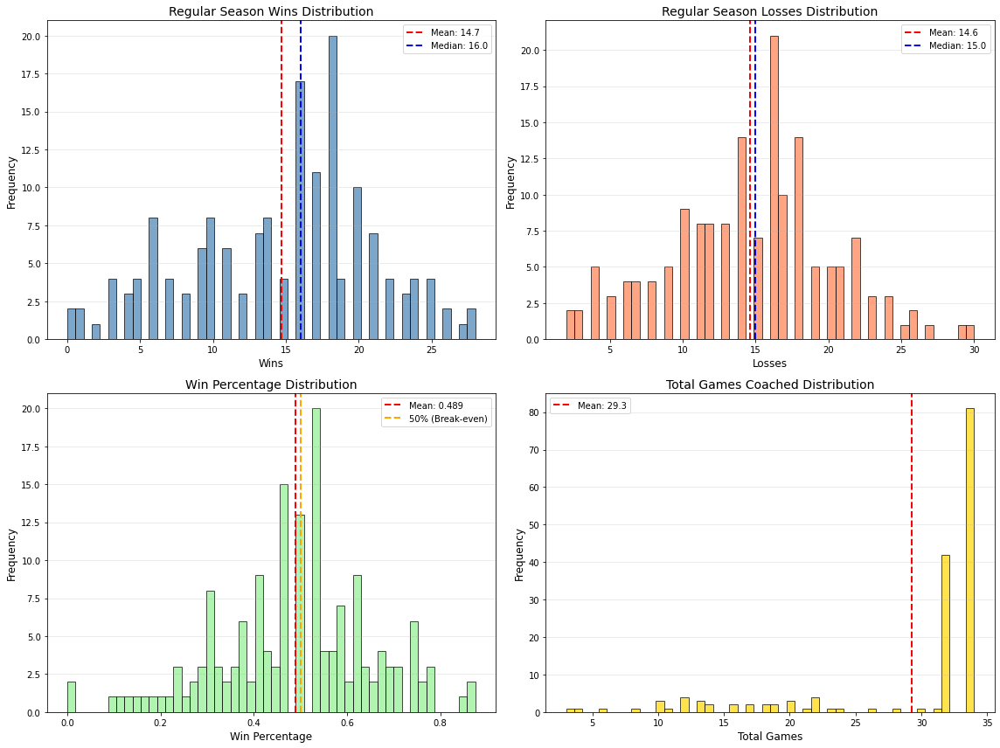


=== WIN PERCENTAGE CATEGORIES ===

Coaches by performance category:
Poor (<30%)               18
Below Average (30-40%)    23
Average (40-50%)          44
Good (50-60%)             36
Very Good (60-70%)        22
Elite (>70%)              17
Name: performance_category, dtype: int64


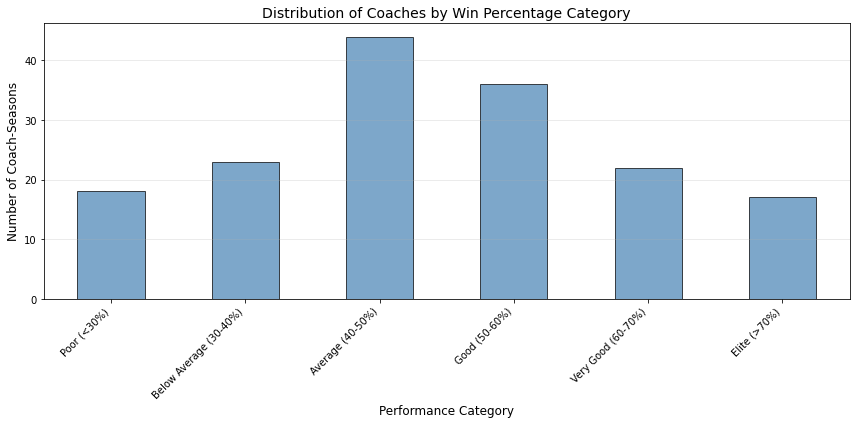


=== PLAYOFF PERFORMANCE ===

Coach-seasons with playoff appearances: 162
Percentage: 100.0%


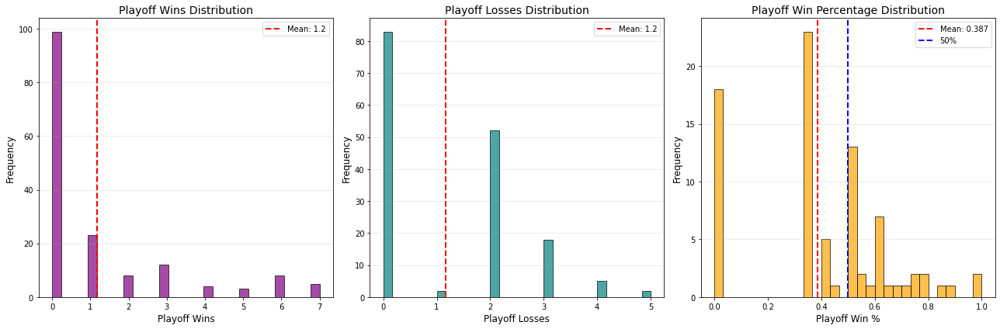


=== COACH LONGEVITY ANALYSIS ===

Total unique coaches: 57

Career statistics:
         seasons  career_span  total_wins  total_losses  career_win_pct  \
count  57.000000    57.000000   57.000000     57.000000       57.000000   
mean    2.842105     3.175439   41.701754     41.561404        0.453548   
std     2.289647     2.829202   43.162055     33.022188        0.138228   
min     1.000000     1.000000    1.000000      3.000000        0.090909   
25%     1.000000     1.000000   14.000000     18.000000        0.393939   
50%     2.000000     2.000000   26.000000     32.000000        0.464286   
75%     3.000000     3.000000   42.000000     55.000000        0.532110   
max     9.000000    10.000000  167.000000    155.000000        0.785714   

       num_teams  
count  57.000000  
mean    1.175439  
std     0.504367  
min     1.000000  
25%     1.000000  
50%     1.000000  
75%     1.000000  
max     4.000000  

Top 20 coaches by total wins:
       coachID  seasons  total_wins  total

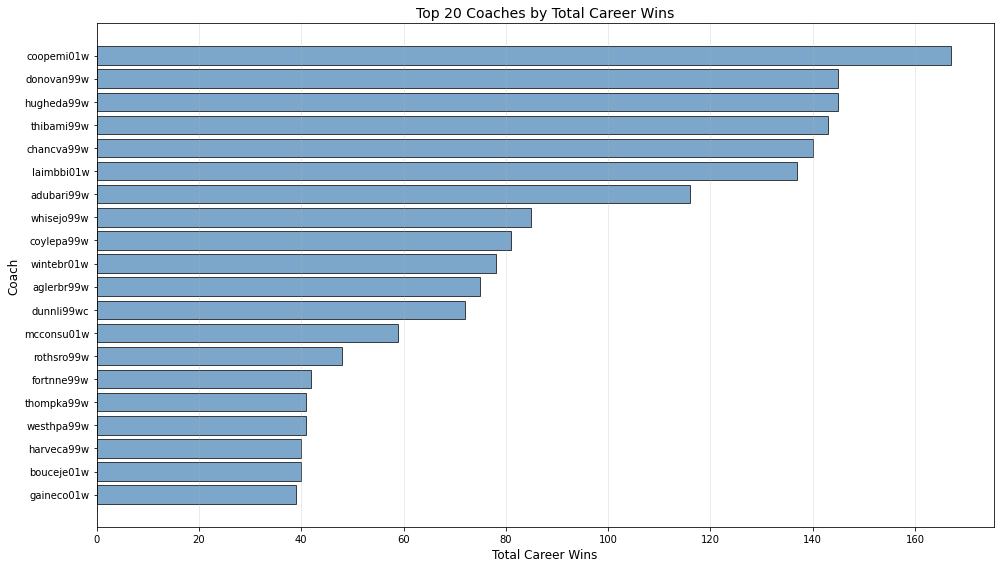

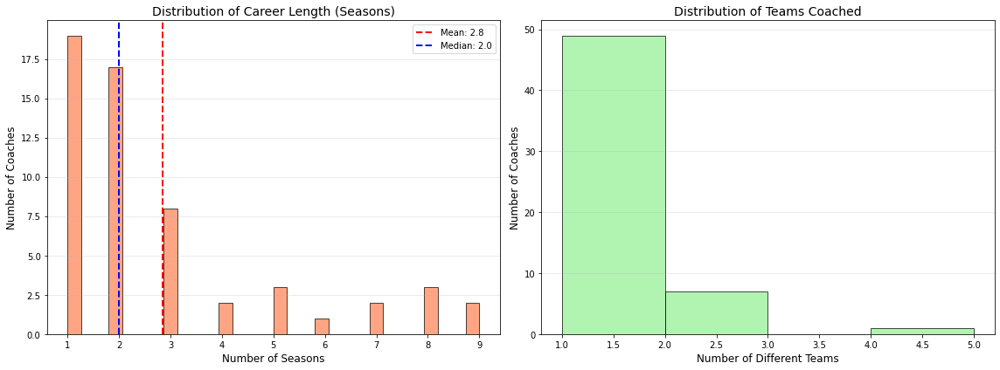

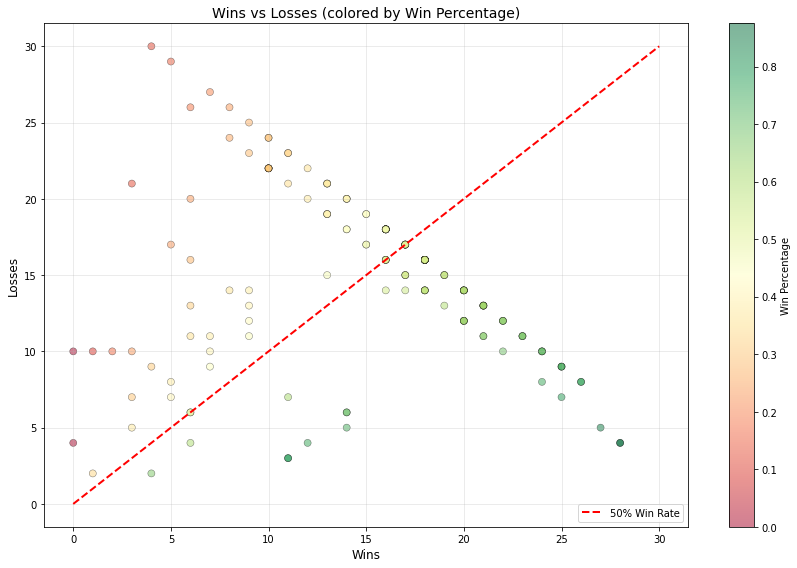

In [124]:
# Descriptive Analysis

print("\n=== DESCRIPTIVE STATISTICS ===")
print("\nRegular season statistics:")
print(coaches[['won', 'lost', 'total_games', 'win_pct']].describe())

print("\nPlayoff statistics:")
print(coaches[['post_wins', 'post_losses', 'playoff_win_pct']].describe())

print("\n=== WIN-LOSS ANALYSIS ===")

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Wins distribution
axes[0, 0].hist(coaches['won'].dropna(), bins=50, 
                edgecolor='black', color='steelblue', alpha=0.7)
axes[0, 0].axvline(coaches['won'].mean(), color='red', 
                   linestyle='--', linewidth=2, label=f'Mean: {coaches["won"].mean():.1f}')
axes[0, 0].axvline(coaches['won'].median(), color='blue', 
                   linestyle='--', linewidth=2, label=f'Median: {coaches["won"].median():.1f}')
axes[0, 0].set_title('Regular Season Wins Distribution', fontsize=14)
axes[0, 0].set_xlabel('Wins', fontsize=12)
axes[0, 0].set_ylabel('Frequency', fontsize=12)
axes[0, 0].legend()
axes[0, 0].grid(axis='y', alpha=0.3)

# Losses distribution
axes[0, 1].hist(coaches['lost'].dropna(), bins=50, 
                edgecolor='black', color='coral', alpha=0.7)
axes[0, 1].axvline(coaches['lost'].mean(), color='red', 
                   linestyle='--', linewidth=2, label=f'Mean: {coaches["lost"].mean():.1f}')
axes[0, 1].axvline(coaches['lost'].median(), color='blue', 
                   linestyle='--', linewidth=2, label=f'Median: {coaches["lost"].median():.1f}')
axes[0, 1].set_title('Regular Season Losses Distribution', fontsize=14)
axes[0, 1].set_xlabel('Losses', fontsize=12)
axes[0, 1].set_ylabel('Frequency', fontsize=12)
axes[0, 1].legend()
axes[0, 1].grid(axis='y', alpha=0.3)

# Win percentage distribution
axes[1, 0].hist(coaches['win_pct'].dropna(), bins=50, 
                edgecolor='black', color='lightgreen', alpha=0.7)
axes[1, 0].axvline(coaches['win_pct'].mean(), color='red', 
                   linestyle='--', linewidth=2, label=f'Mean: {coaches["win_pct"].mean():.3f}')
axes[1, 0].axvline(0.5, color='orange', 
                   linestyle='--', linewidth=2, label='50% (Break-even)')
axes[1, 0].set_title('Win Percentage Distribution', fontsize=14)
axes[1, 0].set_xlabel('Win Percentage', fontsize=12)
axes[1, 0].set_ylabel('Frequency', fontsize=12)
axes[1, 0].legend()
axes[1, 0].grid(axis='y', alpha=0.3)

# Total games distribution
axes[1, 1].hist(coaches['total_games'].dropna(), bins=50, 
                edgecolor='black', color='gold', alpha=0.7)
axes[1, 1].axvline(coaches['total_games'].mean(), color='red', 
                   linestyle='--', linewidth=2, label=f'Mean: {coaches["total_games"].mean():.1f}')
axes[1, 1].set_title('Total Games Coached Distribution', fontsize=14)
axes[1, 1].set_xlabel('Total Games', fontsize=12)
axes[1, 1].set_ylabel('Frequency', fontsize=12)
axes[1, 1].legend()
axes[1, 1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print("\n=== WIN PERCENTAGE CATEGORIES ===")

# Categorize coaches by win percentage
coaches['performance_category'] = pd.cut(
    coaches['win_pct'],
    bins=[0, 0.3, 0.4, 0.5, 0.6, 0.7, 1.0],
    labels=['Poor (<30%)', 'Below Average (30-40%)', 'Average (40-50%)', 
            'Good (50-60%)', 'Very Good (60-70%)', 'Elite (>70%)']
)

category_counts = coaches['performance_category'].value_counts().sort_index()
print("\nCoaches by performance category:")
print(category_counts)

plt.figure(figsize=(12, 6))
category_counts.plot(kind='bar', color='steelblue', edgecolor='black', alpha=0.7)
plt.title('Distribution of Coaches by Win Percentage Category', fontsize=14)
plt.xlabel('Performance Category', fontsize=12)
plt.ylabel('Number of Coach-Seasons', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print("\n=== PLAYOFF PERFORMANCE ===")

playoff_coaches = coaches[coaches['post_wins'].notna()].copy()
print(f"\nCoach-seasons with playoff appearances: {len(playoff_coaches)}")
print(f"Percentage: {len(playoff_coaches)/len(coaches)*100:.1f}%")

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Playoff wins
axes[0].hist(playoff_coaches['post_wins'].dropna(), bins=30, 
             edgecolor='black', color='purple', alpha=0.7)
axes[0].axvline(playoff_coaches['post_wins'].mean(), color='red', 
                linestyle='--', linewidth=2, label=f'Mean: {playoff_coaches["post_wins"].mean():.1f}')
axes[0].set_title('Playoff Wins Distribution', fontsize=14)
axes[0].set_xlabel('Playoff Wins', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)
axes[0].legend()
axes[0].grid(axis='y', alpha=0.3)

# Playoff losses
axes[1].hist(playoff_coaches['post_losses'].dropna(), bins=30, 
             edgecolor='black', color='teal', alpha=0.7)
axes[1].axvline(playoff_coaches['post_losses'].mean(), color='red', 
                linestyle='--', linewidth=2, label=f'Mean: {playoff_coaches["post_losses"].mean():.1f}')
axes[1].set_title('Playoff Losses Distribution', fontsize=14)
axes[1].set_xlabel('Playoff Losses', fontsize=12)
axes[1].set_ylabel('Frequency', fontsize=12)
axes[1].legend()
axes[1].grid(axis='y', alpha=0.3)

# Playoff win percentage
axes[2].hist(playoff_coaches['playoff_win_pct'].dropna(), bins=30, 
             edgecolor='black', color='orange', alpha=0.7)
axes[2].axvline(playoff_coaches['playoff_win_pct'].mean(), color='red', 
                linestyle='--', linewidth=2, label=f'Mean: {playoff_coaches["playoff_win_pct"].mean():.3f}')
axes[2].axvline(0.5, color='blue', 
                linestyle='--', linewidth=2, label='50%')
axes[2].set_title('Playoff Win Percentage Distribution', fontsize=14)
axes[2].set_xlabel('Playoff Win %', fontsize=12)
axes[2].set_ylabel('Frequency', fontsize=12)
axes[2].legend()
axes[2].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print("\n=== COACH LONGEVITY ANALYSIS ===")

# Calculate career statistics for each coach
coach_careers = coaches.groupby('coachID').agg({
    'year': ['count', 'min', 'max'],
    'won': 'sum',
    'lost': 'sum',
    'post_wins': 'sum',
    'post_losses': 'sum',
    'tmID': 'nunique'
}).reset_index()

coach_careers.columns = ['coachID', 'seasons', 'first_year', 'last_year', 
                         'total_wins', 'total_losses', 'total_playoff_wins', 
                         'total_playoff_losses', 'num_teams']

coach_careers['career_span'] = coach_careers['last_year'] - coach_careers['first_year'] + 1
coach_careers['total_games'] = coach_careers['total_wins'] + coach_careers['total_losses']
coach_careers['career_win_pct'] = coach_careers['total_wins'] / coach_careers['total_games']

print(f"\nTotal unique coaches: {len(coach_careers)}")
print(f"\nCareer statistics:")
print(coach_careers[['seasons', 'career_span', 'total_wins', 'total_losses', 
                     'career_win_pct', 'num_teams']].describe())

# Top coaches by total wins
print(f"\nTop 20 coaches by total wins:")
top_coaches = coach_careers.nlargest(20, 'total_wins')
print(top_coaches[['coachID', 'seasons', 'total_wins', 'total_losses', 'career_win_pct']])

plt.figure(figsize=(14, 8))
top_coaches_sorted = top_coaches.sort_values('total_wins', ascending=True)
plt.barh(range(len(top_coaches_sorted)), top_coaches_sorted['total_wins'], 
         color='steelblue', edgecolor='black', alpha=0.7)
plt.yticks(range(len(top_coaches_sorted)), top_coaches_sorted['coachID'])
plt.xlabel('Total Career Wins', fontsize=12)
plt.ylabel('Coach', fontsize=12)
plt.title('Top 20 Coaches by Total Career Wins', fontsize=14)
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# Career length distribution
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

axes[0].hist(coach_careers['seasons'], bins=30, 
             edgecolor='black', color='coral', alpha=0.7)
axes[0].axvline(coach_careers['seasons'].mean(), color='red', 
                linestyle='--', linewidth=2, label=f'Mean: {coach_careers["seasons"].mean():.1f}')
axes[0].axvline(coach_careers['seasons'].median(), color='blue', 
                linestyle='--', linewidth=2, label=f'Median: {coach_careers["seasons"].median():.1f}')
axes[0].set_title('Distribution of Career Length (Seasons)', fontsize=14)
axes[0].set_xlabel('Number of Seasons', fontsize=12)
axes[0].set_ylabel('Number of Coaches', fontsize=12)
axes[0].legend()
axes[0].grid(axis='y', alpha=0.3)

axes[1].hist(coach_careers['num_teams'], bins=range(1, coach_careers['num_teams'].max()+2), 
             edgecolor='black', color='lightgreen', alpha=0.7)
axes[1].set_title('Distribution of Teams Coached', fontsize=14)
axes[1].set_xlabel('Number of Different Teams', fontsize=12)
axes[1].set_ylabel('Number of Coaches', fontsize=12)
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
plt.scatter(coaches['won'], coaches['lost'], alpha=0.5, 
            c=coaches['win_pct'], cmap='RdYlGn', 
            edgecolors='black', s=50, linewidths=0.5)

# Add diagonal line (equal wins and losses)
max_val = max(coaches['won'].max(), coaches['lost'].max())
plt.plot([0, max_val], [0, max_val], 'r--', linewidth=2, label='50% Win Rate')

plt.xlabel('Wins', fontsize=12)
plt.ylabel('Losses', fontsize=12)
plt.title('Wins vs Losses (colored by Win Percentage)', fontsize=14)
plt.colorbar(label='Win Percentage')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()



=== TEMPORAL ANALYSIS ===


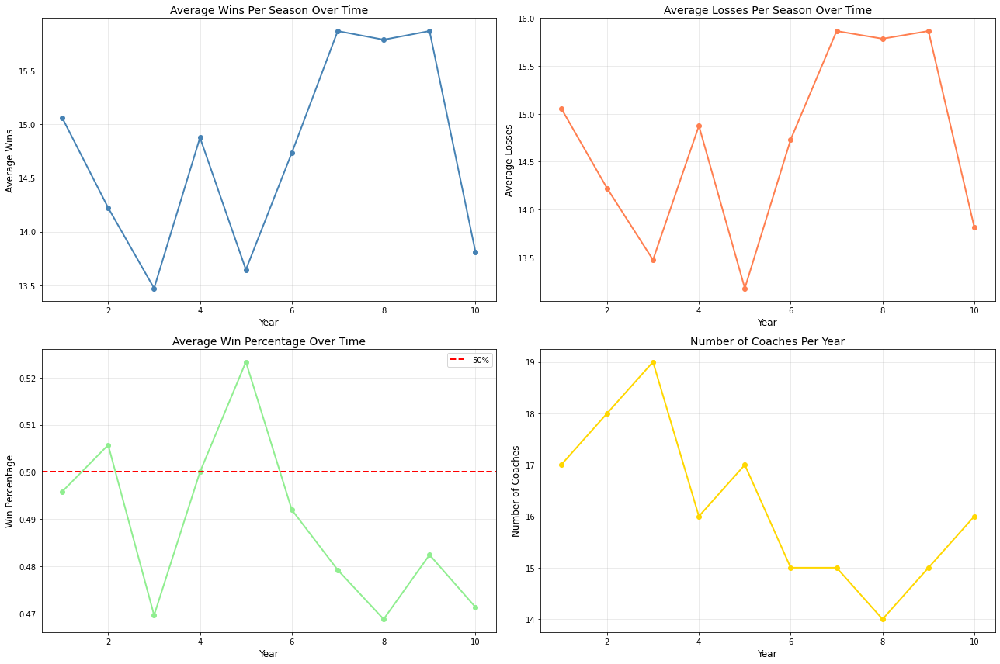

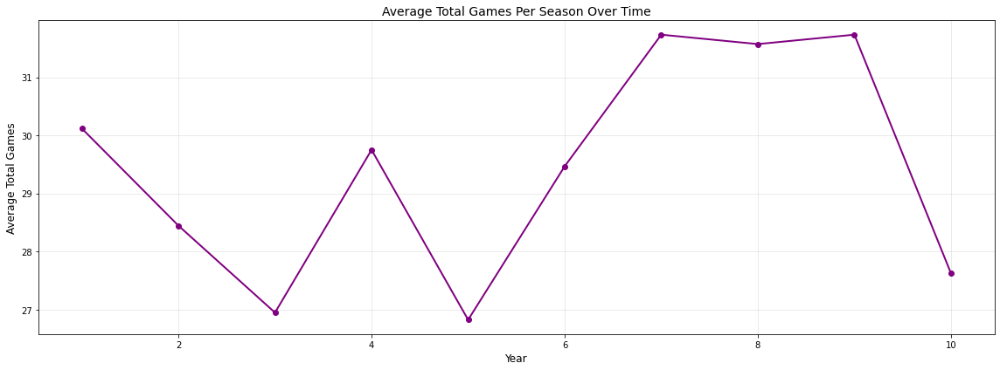

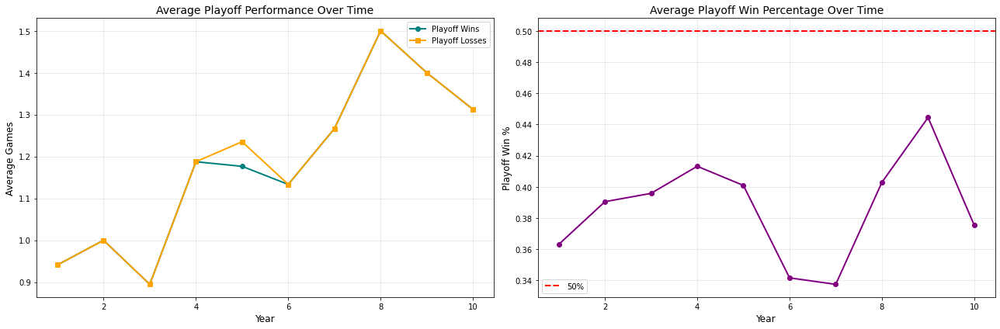

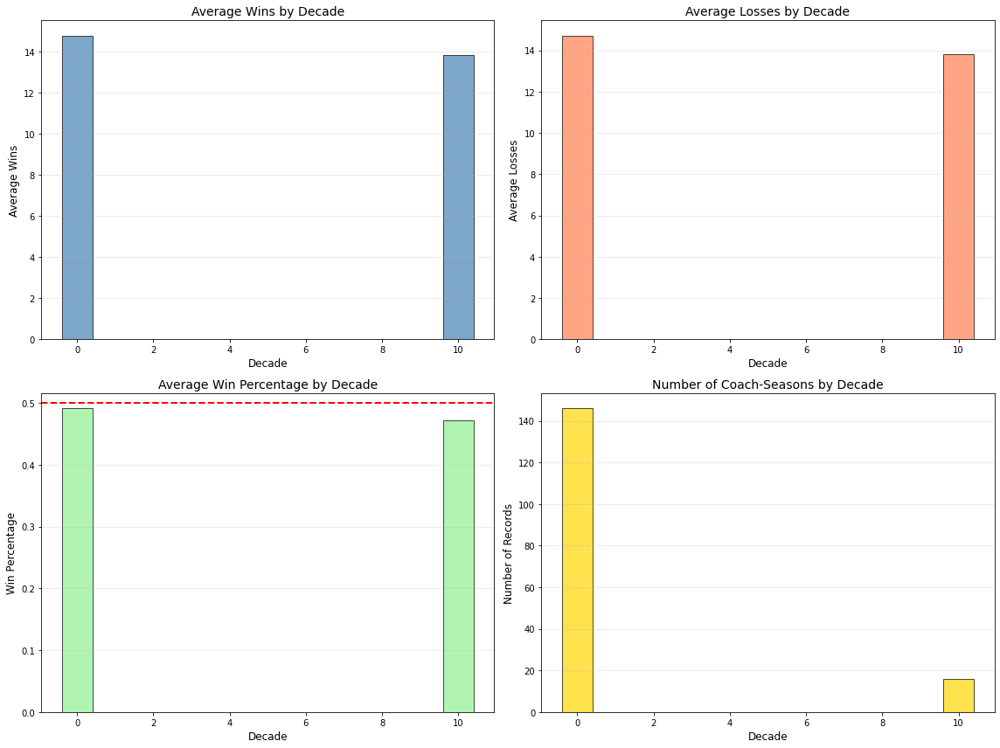

In [125]:
# Temporal Analysis

print("\n=== TEMPORAL ANALYSIS ===")

# Average statistics by year
yearly_stats = coaches.groupby('year').agg({
    'won': 'mean',
    'lost': 'mean',
    'win_pct': 'mean',
    'total_games': 'mean',
    'post_wins': 'mean',
    'post_losses': 'mean',
    'coachID': 'count'
}).rename(columns={'coachID': 'num_coaches'}).reset_index()

# Plot evolution
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# Average wins over time
axes[0, 0].plot(yearly_stats['year'], yearly_stats['won'], 
                marker='o', color='steelblue', linewidth=2)
axes[0, 0].set_title('Average Wins Per Season Over Time', fontsize=14)
axes[0, 0].set_xlabel('Year', fontsize=12)
axes[0, 0].set_ylabel('Average Wins', fontsize=12)
axes[0, 0].grid(True, alpha=0.3)

# Average losses over time
axes[0, 1].plot(yearly_stats['year'], yearly_stats['lost'], 
                marker='o', color='coral', linewidth=2)
axes[0, 1].set_title('Average Losses Per Season Over Time', fontsize=14)
axes[0, 1].set_xlabel('Year', fontsize=12)
axes[0, 1].set_ylabel('Average Losses', fontsize=12)
axes[0, 1].grid(True, alpha=0.3)

# Win percentage over time
axes[1, 0].plot(yearly_stats['year'], yearly_stats['win_pct'], 
                marker='o', color='lightgreen', linewidth=2)
axes[1, 0].axhline(0.5, color='red', linestyle='--', linewidth=2, label='50%')
axes[1, 0].set_title('Average Win Percentage Over Time', fontsize=14)
axes[1, 0].set_xlabel('Year', fontsize=12)
axes[1, 0].set_ylabel('Win Percentage', fontsize=12)
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# Number of coaches over time
axes[1, 1].plot(yearly_stats['year'], yearly_stats['num_coaches'], 
                marker='o', color='gold', linewidth=2)
axes[1, 1].set_title('Number of Coaches Per Year', fontsize=14)
axes[1, 1].set_xlabel('Year', fontsize=12)
axes[1, 1].set_ylabel('Number of Coaches', fontsize=12)
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Total games per season over time
plt.figure(figsize=(16, 6))
plt.plot(yearly_stats['year'], yearly_stats['total_games'], 
         marker='o', color='purple', linewidth=2)
plt.title('Average Total Games Per Season Over Time', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Average Total Games', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Playoff performance over time
playoff_yearly = coaches[coaches['post_wins'].notna()].groupby('year').agg({
    'post_wins': 'mean',
    'post_losses': 'mean',
    'playoff_win_pct': 'mean',
    'coachID': 'count'
}).rename(columns={'coachID': 'num_playoff_coaches'}).reset_index()

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

axes[0].plot(playoff_yearly['year'], playoff_yearly['post_wins'], 
             marker='o', color='teal', linewidth=2, label='Playoff Wins')
axes[0].plot(playoff_yearly['year'], playoff_yearly['post_losses'], 
             marker='s', color='orange', linewidth=2, label='Playoff Losses')
axes[0].set_title('Average Playoff Performance Over Time', fontsize=14)
axes[0].set_xlabel('Year', fontsize=12)
axes[0].set_ylabel('Average Games', fontsize=12)
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(playoff_yearly['year'], playoff_yearly['playoff_win_pct'], 
             marker='o', color='purple', linewidth=2)
axes[1].axhline(0.5, color='red', linestyle='--', linewidth=2, label='50%')
axes[1].set_title('Average Playoff Win Percentage Over Time', fontsize=14)
axes[1].set_xlabel('Year', fontsize=12)
axes[1].set_ylabel('Playoff Win %', fontsize=12)
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Decade analysis
coaches['decade'] = (coaches['year'] // 10) * 10

decade_stats = coaches.groupby('decade').agg({
    'won': 'mean',
    'lost': 'mean',
    'win_pct': 'mean',
    'post_wins': 'mean',
    'post_losses': 'mean',
    'playoff_win_pct': 'mean',
    'coachID': 'count'
}).rename(columns={'coachID': 'num_records'}).reset_index()

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

axes[0, 0].bar(decade_stats['decade'], decade_stats['won'], 
               color='steelblue', edgecolor='black', alpha=0.7)
axes[0, 0].set_title('Average Wins by Decade', fontsize=14)
axes[0, 0].set_xlabel('Decade', fontsize=12)
axes[0, 0].set_ylabel('Average Wins', fontsize=12)
axes[0, 0].grid(axis='y', alpha=0.3)

axes[0, 1].bar(decade_stats['decade'], decade_stats['lost'], 
               color='coral', edgecolor='black', alpha=0.7)
axes[0, 1].set_title('Average Losses by Decade', fontsize=14)
axes[0, 1].set_xlabel('Decade', fontsize=12)
axes[0, 1].set_ylabel('Average Losses', fontsize=12)
axes[0, 1].grid(axis='y', alpha=0.3)

axes[1, 0].bar(decade_stats['decade'], decade_stats['win_pct'], 
               color='lightgreen', edgecolor='black', alpha=0.7)
axes[1, 0].axhline(0.5, color='red', linestyle='--', linewidth=2)
axes[1, 0].set_title('Average Win Percentage by Decade', fontsize=14)
axes[1, 0].set_xlabel('Decade', fontsize=12)
axes[1, 0].set_ylabel('Win Percentage', fontsize=12)
axes[1, 0].grid(axis='y', alpha=0.3)

axes[1, 1].bar(decade_stats['decade'], decade_stats['num_records'], 
               color='gold', edgecolor='black', alpha=0.7)
axes[1, 1].set_title('Number of Coach-Seasons by Decade', fontsize=14)
axes[1, 1].set_xlabel('Decade', fontsize=12)
axes[1, 1].set_ylabel('Number of Records', fontsize=12)
axes[1, 1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()



=== REGULAR SEASON VS PLAYOFFS COMPARISON ===

Regular Season vs Playoffs comparison:
            Regular Season  Playoffs
Avg Wins         14.672840  1.166667
Avg Losses       14.623457  1.172840
Win %             0.489247  0.386719


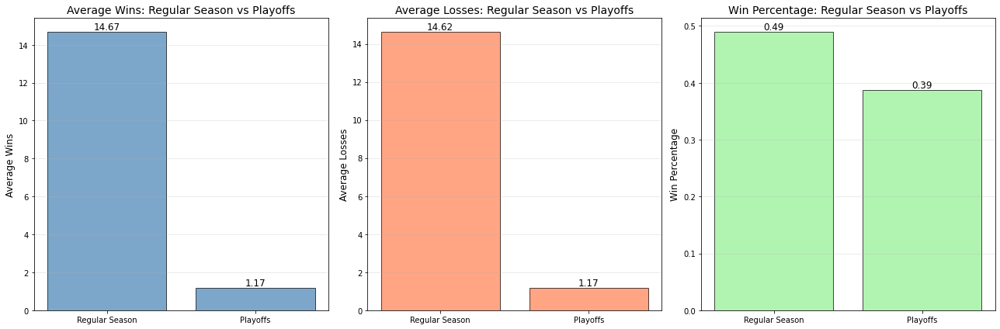

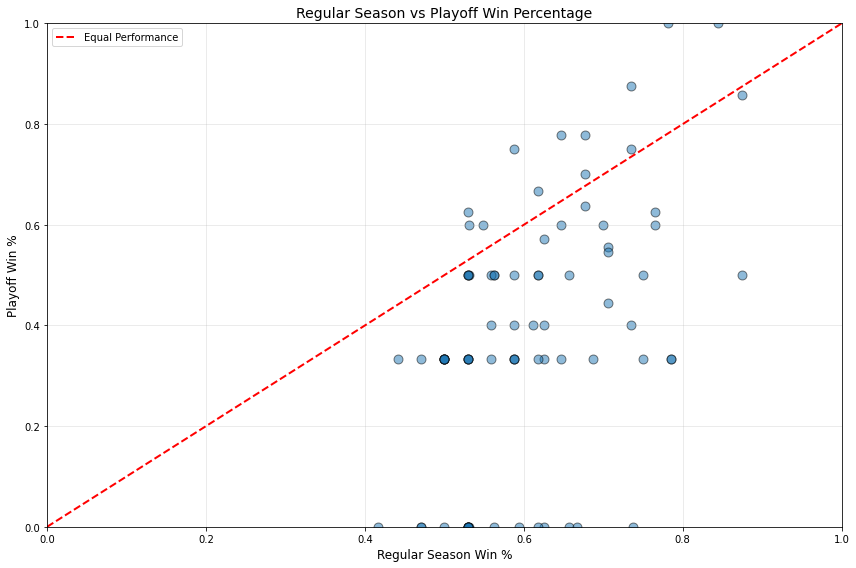


=== TEAM ANALYSIS ===


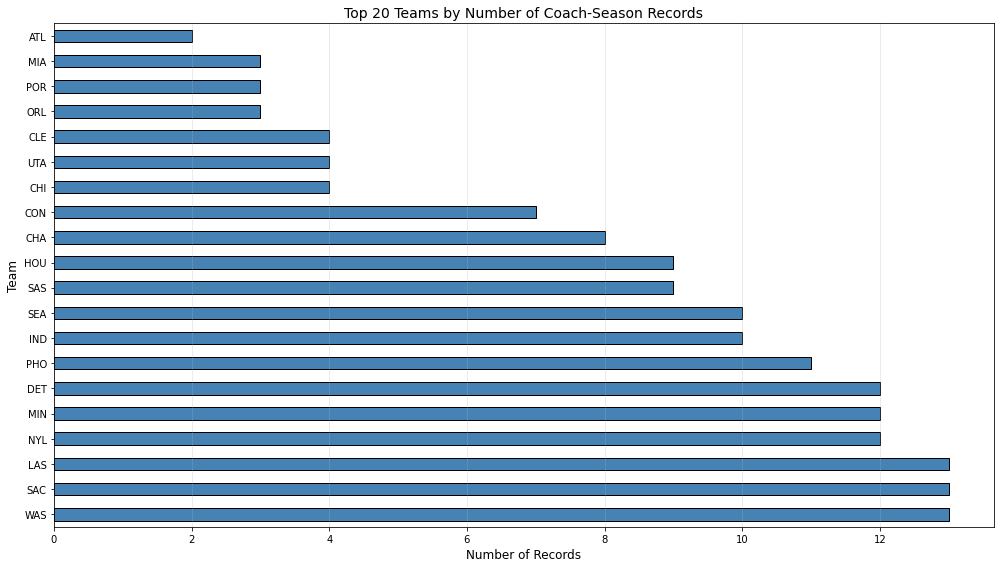


Top 10 teams by average win % (min 20 records):
Empty DataFrame
Columns: [tmID, avg_wins, avg_losses, avg_win_pct, num_records, num_coaches]
Index: []

=== LEAGUE ANALYSIS ===

League statistics:
           won       lost   win_pct  post_wins  post_losses  playoff_win_pct  \
lgID                                                                           
WNBA  14.67284  14.623457  0.489247   1.166667      1.17284         0.386719   

      num_records  
lgID               
WNBA          162  


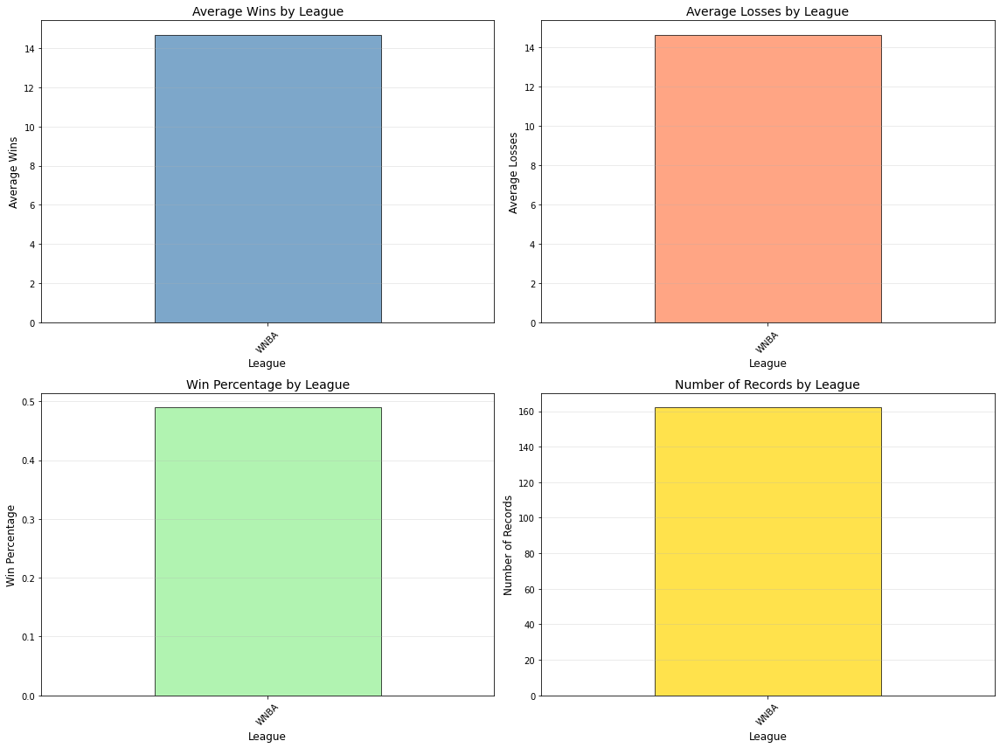


=== STINT ANALYSIS ===

Performance by stint:
             won       lost   win_pct  total_games  num_records
stint                                                          
0      17.056911  16.260163  0.511911    33.317073          123
1       5.894737  10.000000  0.351884    15.894737           19
2       8.350000   8.950000  0.480359    17.300000           20


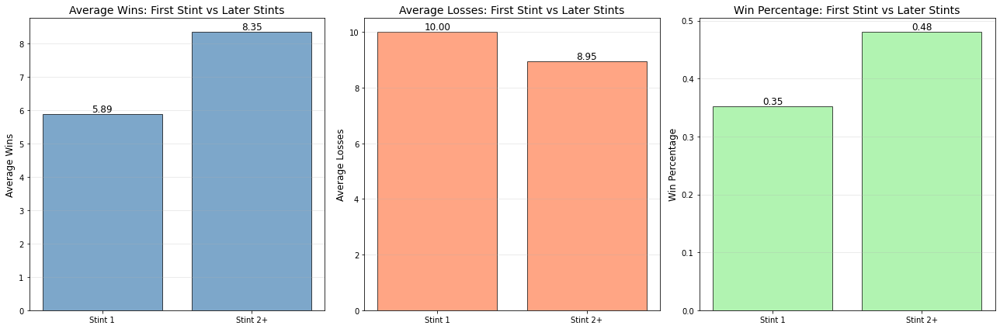


=== EXPERIENCE ANALYSIS ===


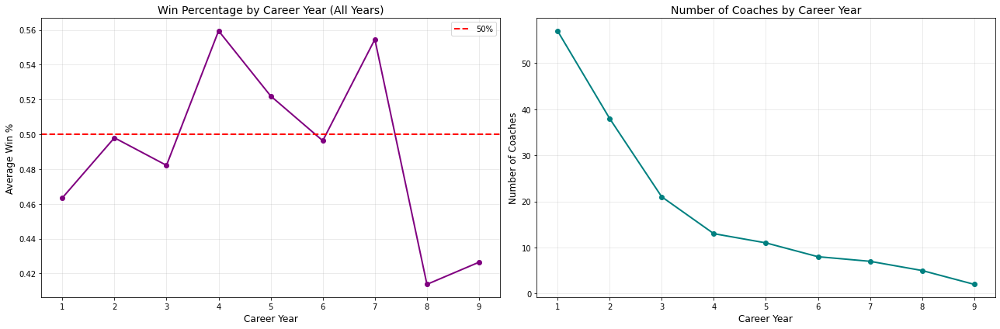

In [128]:
# Comparative Analysis

print("\n=== REGULAR SEASON VS PLAYOFFS COMPARISON ===")

playoff_comparison = playoff_coaches.copy()

comparison_stats = pd.DataFrame({
    'Regular Season': [
        playoff_comparison['won'].mean(),
        playoff_comparison['lost'].mean(),
        playoff_comparison['win_pct'].mean()
    ],
    'Playoffs': [
        playoff_comparison['post_wins'].mean(),
        playoff_comparison['post_losses'].mean(),
        playoff_comparison['playoff_win_pct'].mean()
    ]
}, index=['Avg Wins', 'Avg Losses', 'Win %'])

print("\nRegular Season vs Playoffs comparison:")
print(comparison_stats)

# Visualize comparison
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

metrics = [('won', 'post_wins', 'Average Wins'), 
           ('lost', 'post_losses', 'Average Losses'),
           ('win_pct', 'playoff_win_pct', 'Win Percentage')]
colors = ['steelblue', 'coral', 'lightgreen']

for idx, ((reg_col, post_col, title), color) in enumerate(zip(metrics, colors)):
    x = np.arange(2)
    values = [playoff_comparison[reg_col].mean(), playoff_comparison[post_col].mean()]
    
    bars = axes[idx].bar(x, values, color=color, edgecolor='black', alpha=0.7)
    axes[idx].set_xticks(x)
    axes[idx].set_xticklabels(['Regular Season', 'Playoffs'])
    axes[idx].set_title(f'{title}: Regular Season vs Playoffs', fontsize=14)
    axes[idx].set_ylabel(title, fontsize=12)
    axes[idx].grid(axis='y', alpha=0.3)
    
    for bar in bars:
        height = bar.get_height()
        axes[idx].text(bar.get_x() + bar.get_width()/2., height,
                      f'{height:.2f}', ha='center', va='bottom', fontsize=12)

plt.tight_layout()
plt.show()

# Scatter: Regular season vs playoff win percentage
plt.figure(figsize=(12, 8))
valid_data = playoff_comparison[['win_pct', 'playoff_win_pct']].dropna()

plt.scatter(valid_data['win_pct'], valid_data['playoff_win_pct'], 
            alpha=0.5, edgecolors='black', s=80)

# Add diagonal line (y=x)
plt.plot([0, 1], [0, 1], 'r--', linewidth=2, label='Equal Performance')

plt.xlabel('Regular Season Win %', fontsize=12)
plt.ylabel('Playoff Win %', fontsize=12)
plt.title('Regular Season vs Playoff Win Percentage', fontsize=14)
plt.legend()
plt.grid(True, alpha=0.3)
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

print("\n=== TEAM ANALYSIS ===")

# Top teams by number of coach-seasons
top_teams = coaches['tmID'].value_counts().head(20)

plt.figure(figsize=(14, 8))
top_teams.plot(kind='barh', color='steelblue', edgecolor='black')
plt.title('Top 20 Teams by Number of Coach-Season Records', fontsize=14)
plt.xlabel('Number of Records', fontsize=12)
plt.ylabel('Team', fontsize=12)
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# Average team performance
team_stats = coaches.groupby('tmID').agg({
    'won': 'mean',
    'lost': 'mean',
    'win_pct': 'mean',
    'coachID': ['count', 'nunique']
}).reset_index()

team_stats.columns = ['tmID', 'avg_wins', 'avg_losses', 'avg_win_pct', 
                      'num_records', 'num_coaches']

# Filter teams with at least 20 records
team_stats_filtered = team_stats[team_stats['num_records'] >= 20].sort_values(
    'avg_win_pct', ascending=False
)

print(f"\nTop 10 teams by average win % (min 20 records):")
print(team_stats_filtered.head(10))

print("\n=== LEAGUE ANALYSIS ===")

league_stats = coaches.groupby('lgID').agg({
    'won': 'mean',
    'lost': 'mean',
    'win_pct': 'mean',
    'post_wins': 'mean',
    'post_losses': 'mean',
    'playoff_win_pct': 'mean',
    'coachID': 'count'
}).rename(columns={'coachID': 'num_records'})

print("\nLeague statistics:")
print(league_stats)

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

metrics = ['won', 'lost', 'win_pct', 'num_records']
titles = ['Average Wins', 'Average Losses', 'Win Percentage', 'Number of Records']
colors = ['steelblue', 'coral', 'lightgreen', 'gold']

for idx, (metric, title, color) in enumerate(zip(metrics, titles, colors)):
    ax = axes[idx // 2, idx % 2]
    
    league_stats[metric].plot(kind='bar', ax=ax, color=color, 
                              edgecolor='black', alpha=0.7)
    ax.set_title(f'{title} by League', fontsize=14)
    ax.set_xlabel('League', fontsize=12)
    ax.set_ylabel(title, fontsize=12)
    ax.grid(axis='y', alpha=0.3)
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

print("\n=== STINT ANALYSIS ===")

stint_stats = coaches.groupby('stint').agg({
    'won': 'mean',
    'lost': 'mean',
    'win_pct': 'mean',
    'total_games': 'mean',
    'coachID': 'count'
}).rename(columns={'coachID': 'num_records'})

print("\nPerformance by stint:")
print(stint_stats.head(10))

# Compare first stint vs later stints
stint_1 = coaches[coaches['stint'] == 1]
stint_2plus = coaches[coaches['stint'] > 1]

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

metrics = ['won', 'lost', 'win_pct']
titles = ['Average Wins', 'Average Losses', 'Win Percentage']
colors = ['steelblue', 'coral', 'lightgreen']

for idx, (metric, title, color) in enumerate(zip(metrics, titles, colors)):
    x = np.arange(2)
    values = [stint_1[metric].mean(), stint_2plus[metric].mean()]
    
    bars = axes[idx].bar(x, values, color=color, edgecolor='black', alpha=0.7)
    axes[idx].set_xticks(x)
    axes[idx].set_xticklabels(['Stint 1', 'Stint 2+'])
    axes[idx].set_title(f'{title}: First Stint vs Later Stints', fontsize=14)
    axes[idx].set_ylabel(title, fontsize=12)
    axes[idx].grid(axis='y', alpha=0.3)
    
    for bar in bars:
        height = bar.get_height()
        axes[idx].text(bar.get_x() + bar.get_width()/2., height,
                      f'{height:.2f}', ha='center', va='bottom', fontsize=12)

plt.tight_layout()
plt.show()

print("\n=== EXPERIENCE ANALYSIS ===")

# Add career year (1st year, 2nd year, etc)
coaches_sorted = coaches.sort_values(['coachID', 'year'])
coaches_sorted['career_year'] = coaches_sorted.groupby('coachID').cumcount() + 1

# Performance by career year
career_year_stats = coaches_sorted.groupby('career_year').agg({
    'won': 'mean',
    'lost': 'mean',
    'win_pct': 'mean',
    'coachID': 'count'
}).rename(columns={'coachID': 'num_coaches'}).reset_index()

# Plot all career years
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

axes[0].plot(career_year_stats['career_year'], career_year_stats['win_pct'], 
             marker='o', color='purple', linewidth=2)
axes[0].axhline(0.5, color='red', linestyle='--', linewidth=2, label='50%')
axes[0].set_title('Win Percentage by Career Year (All Years)', fontsize=14)
axes[0].set_xlabel('Career Year', fontsize=12)
axes[0].set_ylabel('Average Win %', fontsize=12)
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(career_year_stats['career_year'], career_year_stats['num_coaches'], 
             marker='o', color='teal', linewidth=2)
axes[1].set_title('Number of Coaches by Career Year', fontsize=14)
axes[1].set_xlabel('Career Year', fontsize=12)
axes[1].set_ylabel('Number of Coaches', fontsize=12)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()



=== CORRELATION ANALYSIS ===


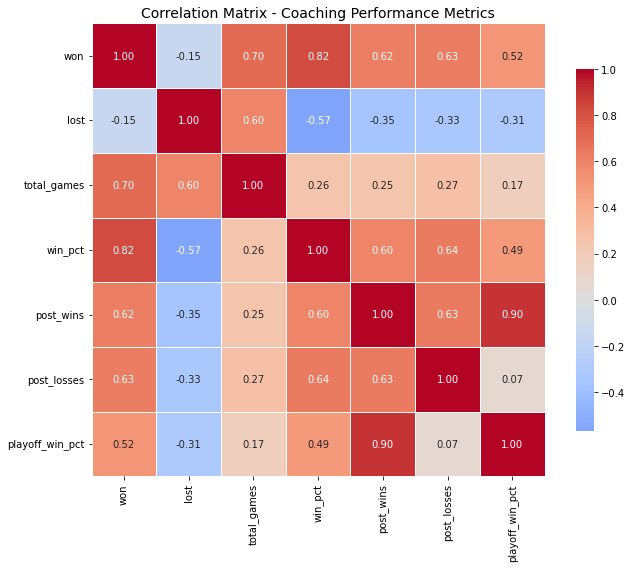


Key correlations with p-values:
won vs total_games: r=0.704, p=0.0000 ***
lost vs total_games: r=0.600, p=0.0000 ***
win_pct vs playoff_win_pct: r=0.492, p=0.0000 ***
won vs post_wins: r=0.620, p=0.0000 ***
lost vs post_losses: r=-0.328, p=0.0000 ***

=== REGRESSION ANALYSIS ===

1. Linear Regression: Wins = f(Total Games)
Equation: Wins = 0.570 * Total_Games + -2.022
R-squared: 0.4962
P-value: 0.0000


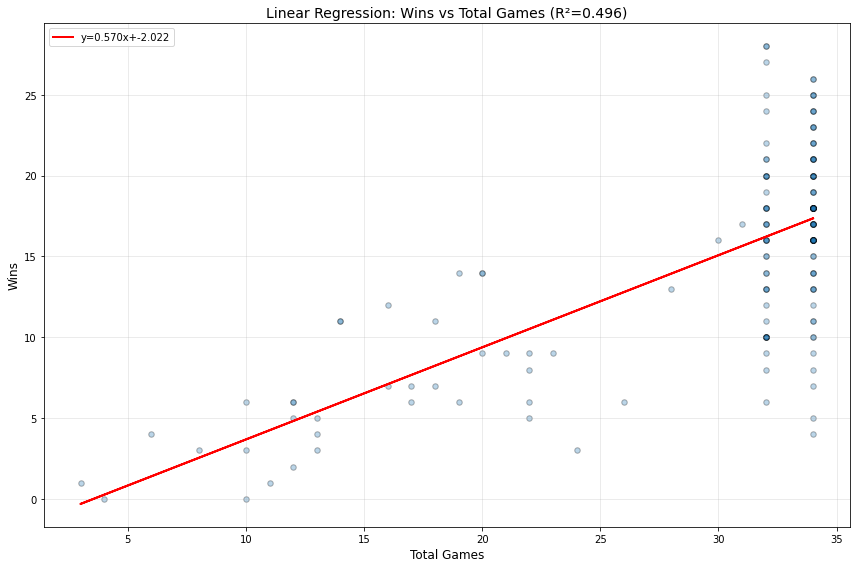


2. Linear Regression: Playoff Wins = f(Regular Season Wins)
Equation: Playoff_Wins = 0.189 * Wins + -1.607
R-squared: 0.3838
P-value: 0.0000


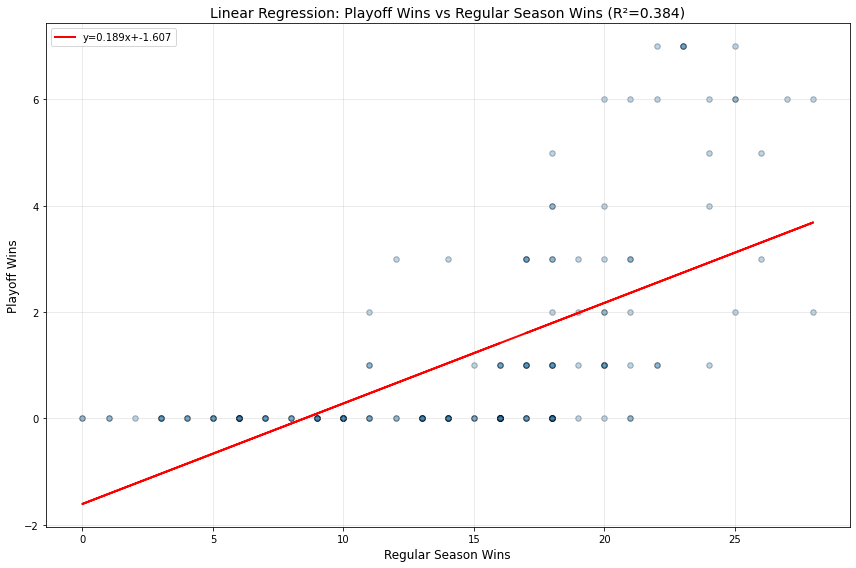


=== T-TESTS ===

1. Paired T-test: Regular Season Win% vs Playoff Win%
T-statistic: 8.8377
P-value: 0.0000
Significant difference: Yes
Regular season mean: 0.610
Playoff mean: 0.387

2. T-test: First Stint vs Later Stints (Win %)
T-statistic: -2.0266
P-value: 0.0500
Significant difference: Yes
First stint mean: 0.352
Later stints mean: 0.480

3. T-test: Winning vs Losing Coaches (Total Games)
T-statistic: 2.9995
P-value: 0.0032
Significant difference: Yes
Winning coaches avg games: 31.1
Losing coaches avg games: 27.3

=== ANOVA ===

1. ANOVA: Win % across decades
F-statistic: 0.2019
P-value: 0.6538
Significant difference: No

2. ANOVA: Wins across performance categories
F-statistic: 59.0296
P-value: 0.0000
Significant difference: Yes

=== CHI-SQUARE TESTS ===
Not enough data to perform the test.

2. Chi-square: Playoff appearance vs Performance category
Chi-square statistic: 0.0000
P-value: 1.0000
Degrees of freedom: 0
Significant association: No

=== NORMALITY TESTS (Shapiro-Wilk) ==

In [131]:
# Statistical Analysis

from scipy import stats
from scipy.stats import chi2_contingency

print("\n=== CORRELATION ANALYSIS ===")

corr_vars = ['won', 'lost', 'total_games', 'win_pct', 
             'post_wins', 'post_losses', 'playoff_win_pct']
available_corr_vars = [var for var in corr_vars if var in coaches.columns]

correlation_matrix = coaches[available_corr_vars].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm',
            center=0, square=True, linewidths=1, cbar_kws={"shrink": 0.8})
plt.title('Correlation Matrix - Coaching Performance Metrics', fontsize=14)
plt.tight_layout()
plt.show()

# Correlations with p-values
print("\nKey correlations with p-values:")
corr_pairs = [
    ('won', 'total_games'), ('lost', 'total_games'), 
    ('win_pct', 'playoff_win_pct'), ('won', 'post_wins'),
    ('lost', 'post_losses')
]

for var1, var2 in corr_pairs:
    if var1 in coaches.columns and var2 in coaches.columns:
        valid_data = coaches[[var1, var2]].dropna()
        if len(valid_data) > 2:
            corr, pval = stats.pearsonr(valid_data[var1], valid_data[var2])
            sig = '***' if pval < 0.001 else '**' if pval < 0.01 else '*' if pval < 0.05 else 'ns'
            print(f"{var1} vs {var2}: r={corr:.3f}, p={pval:.4f} {sig}")

print("\n=== REGRESSION ANALYSIS ===")

# Wins vs Total Games
valid_data = coaches[['total_games', 'won']].dropna()
slope, intercept, r_value, p_value, std_err = stats.linregress(
    valid_data['total_games'], valid_data['won']
)

print("\n1. Linear Regression: Wins = f(Total Games)")
print(f"Equation: Wins = {slope:.3f} * Total_Games + {intercept:.3f}")
print(f"R-squared: {r_value**2:.4f}")
print(f"P-value: {p_value:.4f}")

plt.figure(figsize=(12, 8))
plt.scatter(valid_data['total_games'], valid_data['won'], alpha=0.3, 
            edgecolors='black', s=30)
plt.plot(valid_data['total_games'], slope * valid_data['total_games'] + intercept,
         'r-', linewidth=2, label=f'y={slope:.3f}x+{intercept:.3f}')
plt.title(f'Linear Regression: Wins vs Total Games (R²={r_value**2:.3f})', fontsize=14)
plt.xlabel('Total Games', fontsize=12)
plt.ylabel('Wins', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Regular season wins vs Playoff wins
valid_data2 = playoff_coaches[['won', 'post_wins']].dropna()
if len(valid_data2) > 2:
    slope2, intercept2, r2, p2, std_err2 = stats.linregress(
        valid_data2['won'], valid_data2['post_wins']
    )
    
    print("\n2. Linear Regression: Playoff Wins = f(Regular Season Wins)")
    print(f"Equation: Playoff_Wins = {slope2:.3f} * Wins + {intercept2:.3f}")
    print(f"R-squared: {r2**2:.4f}")
    print(f"P-value: {p2:.4f}")
    
    plt.figure(figsize=(12, 8))
    plt.scatter(valid_data2['won'], valid_data2['post_wins'], alpha=0.3, 
                edgecolors='black', s=30)
    plt.plot(valid_data2['won'], slope2 * valid_data2['won'] + intercept2,
             'r-', linewidth=2, label=f'y={slope2:.3f}x+{intercept2:.3f}')
    plt.title(f'Linear Regression: Playoff Wins vs Regular Season Wins (R²={r2**2:.3f})', 
              fontsize=14)
    plt.xlabel('Regular Season Wins', fontsize=12)
    plt.ylabel('Playoff Wins', fontsize=12)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

print("\n=== T-TESTS ===")

# Regular season vs Playoffs win percentage
valid_playoff = playoff_coaches[['win_pct', 'playoff_win_pct']].dropna()
if len(valid_playoff) > 0:
    t_stat, p_val = stats.ttest_rel(
        valid_playoff['win_pct'],
        valid_playoff['playoff_win_pct']
    )
    print("\n1. Paired T-test: Regular Season Win% vs Playoff Win%")
    print(f"T-statistic: {t_stat:.4f}")
    print(f"P-value: {p_val:.4f}")
    print(f"Significant difference: {'Yes' if p_val < 0.05 else 'No'}")
    print(f"Regular season mean: {valid_playoff['win_pct'].mean():.3f}")
    print(f"Playoff mean: {valid_playoff['playoff_win_pct'].mean():.3f}")

# First stint vs Later stints
if len(stint_1) > 0 and len(stint_2plus) > 0:
    t_stat2, p_val2 = stats.ttest_ind(
        stint_1['win_pct'].dropna(),
        stint_2plus['win_pct'].dropna()
    )
    print("\n2. T-test: First Stint vs Later Stints (Win %)")
    print(f"T-statistic: {t_stat2:.4f}")
    print(f"P-value: {p_val2:.4f}")
    print(f"Significant difference: {'Yes' if p_val2 < 0.05 else 'No'}")
    print(f"First stint mean: {stint_1['win_pct'].mean():.3f}")
    print(f"Later stints mean: {stint_2plus['win_pct'].mean():.3f}")

# Winning vs Losing coaches
winning_coaches = coaches[coaches['win_pct'] > 0.5]
losing_coaches = coaches[coaches['win_pct'] < 0.5]

if len(winning_coaches) > 0 and len(losing_coaches) > 0:
    t_stat3, p_val3 = stats.ttest_ind(
        winning_coaches['total_games'].dropna(),
        losing_coaches['total_games'].dropna()
    )
    print("\n3. T-test: Winning vs Losing Coaches (Total Games)")
    print(f"T-statistic: {t_stat3:.4f}")
    print(f"P-value: {p_val3:.4f}")
    print(f"Significant difference: {'Yes' if p_val3 < 0.05 else 'No'}")
    print(f"Winning coaches avg games: {winning_coaches['total_games'].mean():.1f}")
    print(f"Losing coaches avg games: {losing_coaches['total_games'].mean():.1f}")

print("\n=== ANOVA ===")

# Compare win percentage across decades
decades = coaches['decade'].unique()
decade_groups = [coaches[coaches['decade'] == d]['win_pct'].dropna().values 
                 for d in sorted(decades)]
decade_groups = [g for g in decade_groups if len(g) > 0]

if len(decade_groups) > 1:
    f_stat, p_anova = stats.f_oneway(*decade_groups)
    print("\n1. ANOVA: Win % across decades")
    print(f"F-statistic: {f_stat:.4f}")
    print(f"P-value: {p_anova:.4f}")
    print(f"Significant difference: {'Yes' if p_anova < 0.05 else 'No'}")

# Compare wins across performance categories
perf_categories = coaches['performance_category'].dropna().unique()
perf_groups = [coaches[coaches['performance_category'] == cat]['won'].dropna().values 
               for cat in perf_categories]
perf_groups = [g for g in perf_groups if len(g) > 0]

if len(perf_groups) > 1:
    f_stat2, p_anova2 = stats.f_oneway(*perf_groups)
    print("\n2. ANOVA: Wins across performance categories")
    print(f"F-statistic: {f_stat2:.4f}")
    print(f"P-value: {p_anova2:.4f}")
    print(f"Significant difference: {'Yes' if p_anova2 < 0.05 else 'No'}")

print("\n=== CHI-SQUARE TESTS ===")

# Performance category vs Decade
coaches['decade_category'] = pd.cut(coaches['decade'],
                                     bins=[1940, 1970, 1990, 2010, 2030],
                                     labels=['1950-1970', '1970-1990', 
                                            '1990-2010', '2010+'])

contingency_perf_decade = pd.crosstab(
    coaches['performance_category'].dropna(),
    coaches['decade_category'].dropna()
)

if contingency_perf_decade.size > 0:
    chi2, p_value, dof, expected = chi2_contingency(contingency_perf_decade)
    
    print("\n1. Chi-square: Performance categories across decades")
    print(f"Chi-square statistic: {chi2:.4f}")
    print(f"P-value: {p_value:.4f}")
    print(f"Degrees of freedom: {dof}")
    print(f"Significant association: {'Yes' if p_value < 0.05 else 'No'}")
else:
    print("Not enough data to perform the test.")

# Playoff appearance vs Performance category
coaches['made_playoffs'] = coaches['post_wins'].notna()

contingency_playoff_perf = pd.crosstab(
    coaches['made_playoffs'],
    coaches['performance_category'].dropna()
)

if contingency_playoff_perf.size > 0:
    chi2_2, p_value_2, dof_2, expected_2 = chi2_contingency(contingency_playoff_perf)
    
    print("\n2. Chi-square: Playoff appearance vs Performance category")
    print(f"Chi-square statistic: {chi2_2:.4f}")
    print(f"P-value: {p_value_2:.4f}")
    print(f"Degrees of freedom: {dof_2}")
    print(f"Significant association: {'Yes' if p_value_2 < 0.05 else 'No'}")
else:
    print("Not enough data to perform the test.")

print("\n=== NORMALITY TESTS (Shapiro-Wilk) ===")

sample_size = min(5000, len(coaches))
sample_data = coaches.sample(sample_size)

for col in ['won', 'lost', 'win_pct', 'total_games']:
    if col in sample_data.columns:
        data = sample_data[col].dropna()
        if len(data) > 3:
            stat, p_value = stats.shapiro(data)
            print(f"{col}: W={stat:.4f}, p={p_value:.4f} {'(Normal)' if p_value > 0.05 else '(Not Normal)'}")


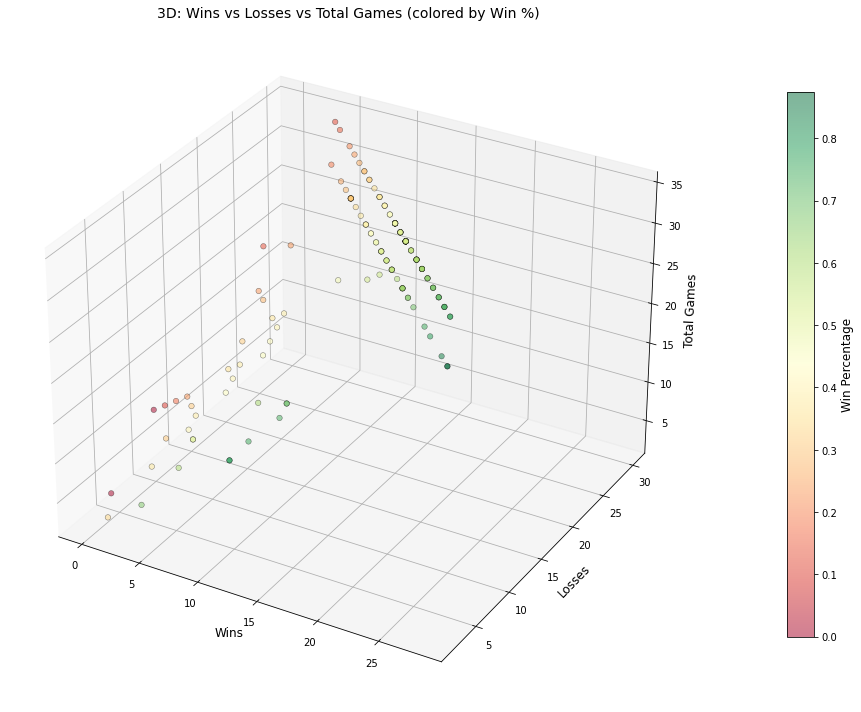

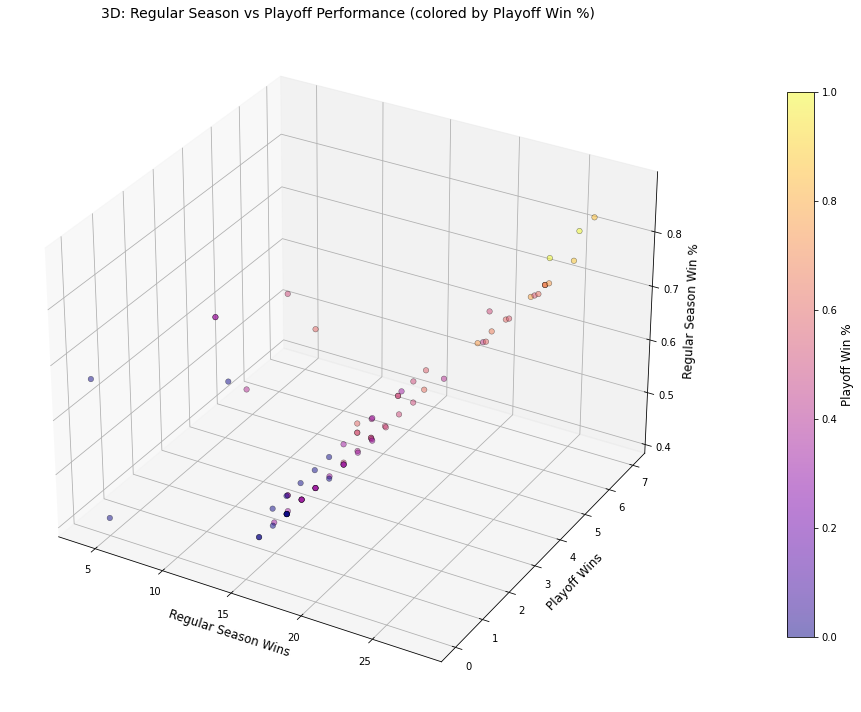

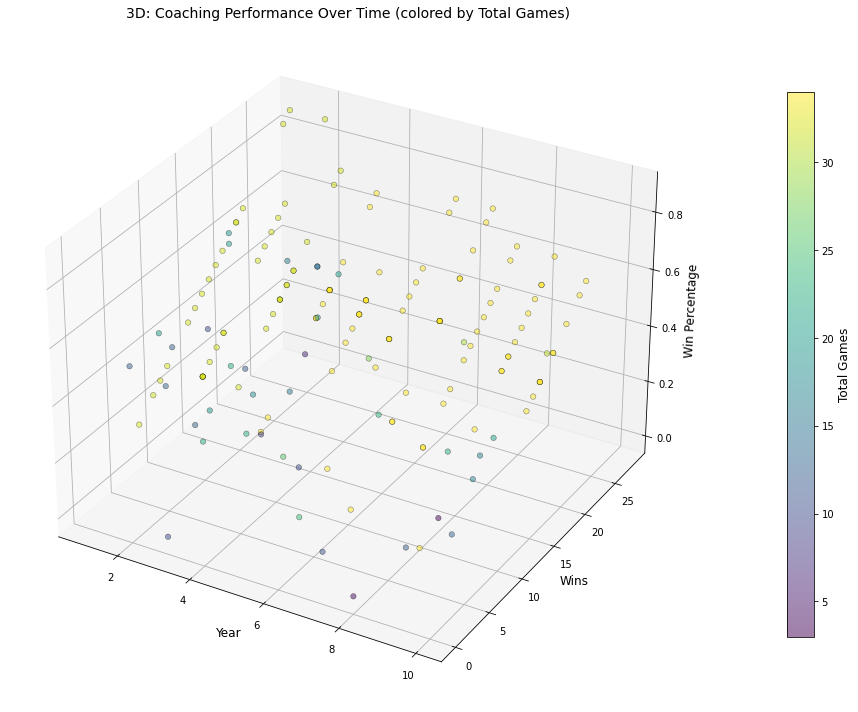

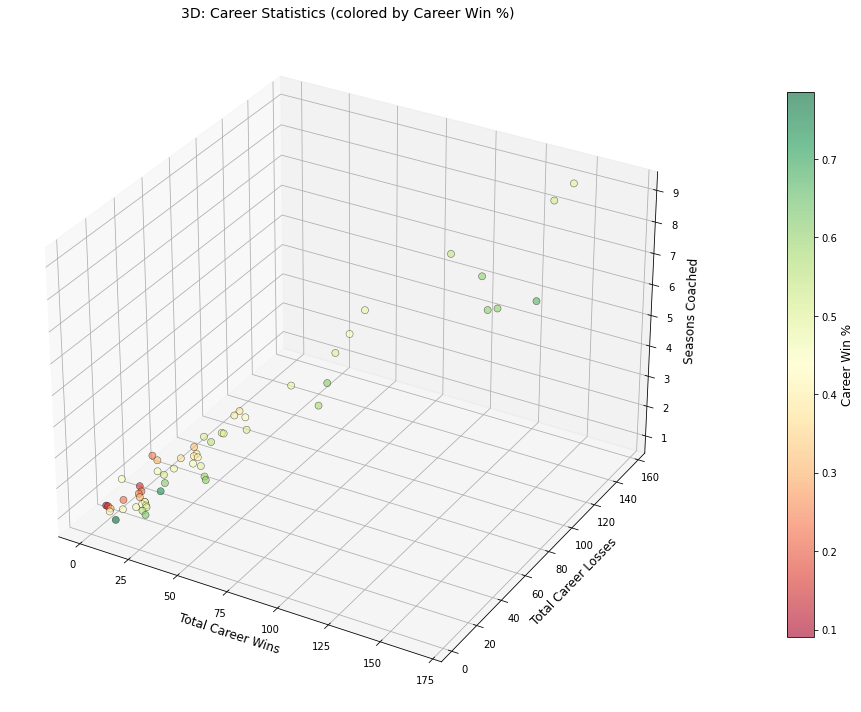

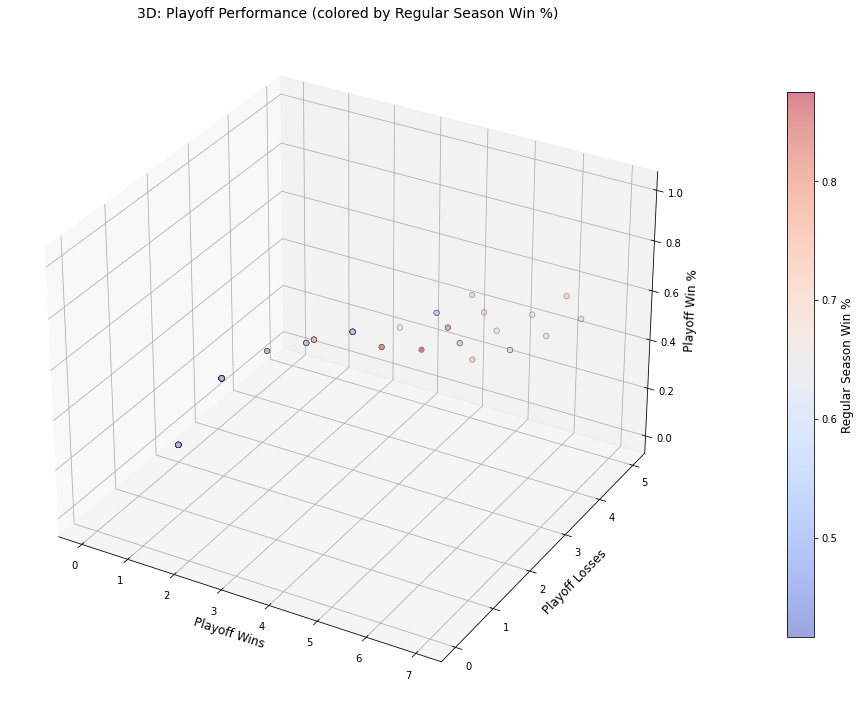

/tmp/ipykernel_6979/3348678898.py:125: UserWarning: Z contains NaN values. This may result in rendering artifacts.
  surf = ax.plot_surface(wins_grid, games_grid, win_pct_grid,


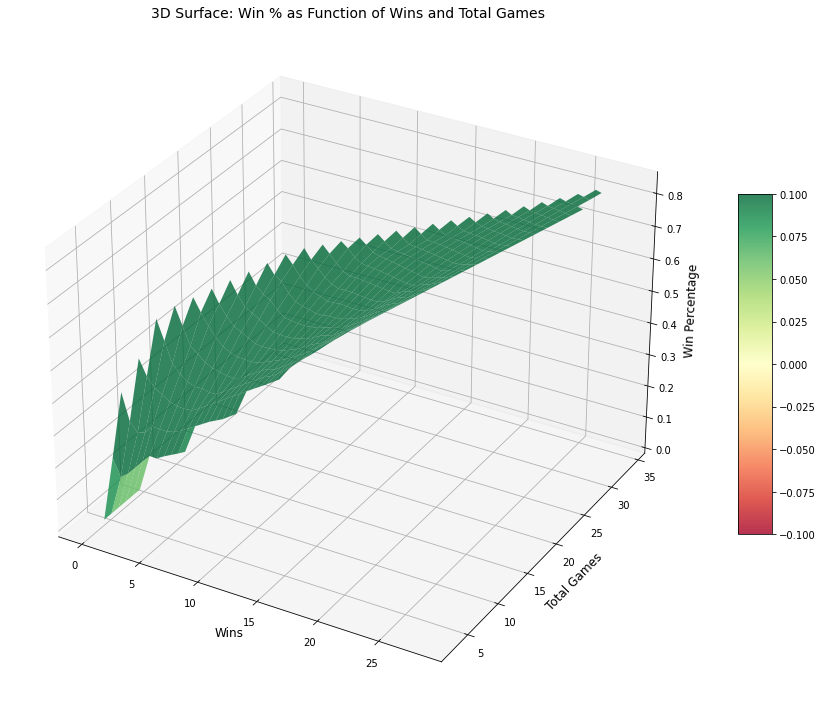

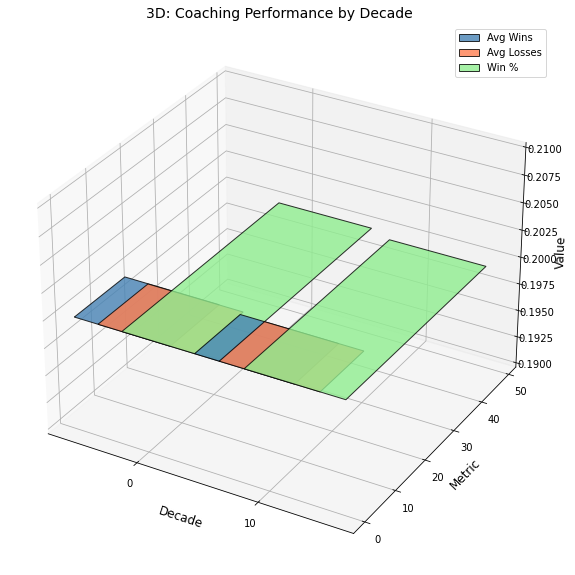

In [135]:
# 3D Visualizations

from mpl_toolkits.mplot3d import Axes3D

# Wins vs Losses vs Total Games
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(coaches['won'], coaches['lost'], coaches['total_games'],
                     c=coaches['win_pct'], cmap='RdYlGn',
                     s=30, alpha=0.5, edgecolors='black', linewidths=0.5)

ax.set_xlabel('Wins', fontsize=12)
ax.set_ylabel('Losses', fontsize=12)
ax.set_zlabel('Total Games', fontsize=12)
ax.set_title('3D: Wins vs Losses vs Total Games (colored by Win %)', fontsize=14)

cbar = plt.colorbar(scatter, ax=ax, pad=0.1, shrink=0.8)
cbar.set_label('Win Percentage', fontsize=12)

plt.tight_layout()
plt.show()

# Regular season vs Playoff performance
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(playoff_coaches['won'], playoff_coaches['post_wins'], 
                     playoff_coaches['win_pct'],
                     c=playoff_coaches['playoff_win_pct'], cmap='plasma',
                     s=30, alpha=0.5, edgecolors='black', linewidths=0.5)

ax.set_xlabel('Regular Season Wins', fontsize=12)
ax.set_ylabel('Playoff Wins', fontsize=12)
ax.set_zlabel('Regular Season Win %', fontsize=12)
ax.set_title('3D: Regular Season vs Playoff Performance (colored by Playoff Win %)', 
             fontsize=14)

cbar = plt.colorbar(scatter, ax=ax, pad=0.1, shrink=0.8)
cbar.set_label('Playoff Win %', fontsize=12)

plt.tight_layout()
plt.show()

# Performance over time
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(coaches['year'], coaches['won'], coaches['win_pct'],
                     c=coaches['total_games'], cmap='viridis',
                     s=30, alpha=0.5, edgecolors='black', linewidths=0.5)

ax.set_xlabel('Year', fontsize=12)
ax.set_ylabel('Wins', fontsize=12)
ax.set_zlabel('Win Percentage', fontsize=12)
ax.set_title('3D: Coaching Performance Over Time (colored by Total Games)', fontsize=14)

cbar = plt.colorbar(scatter, ax=ax, pad=0.1, shrink=0.8)
cbar.set_label('Total Games', fontsize=12)

plt.tight_layout()
plt.show()

# Career statistics
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(coach_careers['total_wins'], coach_careers['total_losses'], 
                     coach_careers['seasons'],
                     c=coach_careers['career_win_pct'], cmap='RdYlGn',
                     s=50, alpha=0.6, edgecolors='black', linewidths=0.5)

ax.set_xlabel('Total Career Wins', fontsize=12)
ax.set_ylabel('Total Career Losses', fontsize=12)
ax.set_zlabel('Seasons Coached', fontsize=12)
ax.set_title('3D: Career Statistics (colored by Career Win %)', fontsize=14)

cbar = plt.colorbar(scatter, ax=ax, pad=0.1, shrink=0.8)
cbar.set_label('Career Win %', fontsize=12)

plt.tight_layout()
plt.show()

# Playoff performance in 3D
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(playoff_coaches['post_wins'], playoff_coaches['post_losses'], 
                     playoff_coaches['playoff_win_pct'],
                     c=playoff_coaches['win_pct'], cmap='coolwarm',
                     s=30, alpha=0.5, edgecolors='black', linewidths=0.5)

ax.set_xlabel('Playoff Wins', fontsize=12)
ax.set_ylabel('Playoff Losses', fontsize=12)
ax.set_zlabel('Playoff Win %', fontsize=12)
ax.set_title('3D: Playoff Performance (colored by Regular Season Win %)', fontsize=14)

cbar = plt.colorbar(scatter, ax=ax, pad=0.1, shrink=0.8)
cbar.set_label('Regular Season Win %', fontsize=12)

plt.tight_layout()
plt.show()

from scipy.interpolate import griddata

# Win percentage as function of wins and total games
sample_data = coaches[['won', 'total_games', 'win_pct']].dropna().sample(
    min(3000, len(coaches))
)

wins_range = np.linspace(sample_data['won'].min(), sample_data['won'].max(), 30)
games_range = np.linspace(sample_data['total_games'].min(), 
                          sample_data['total_games'].max(), 30)
wins_grid, games_grid = np.meshgrid(wins_range, games_range)

win_pct_grid = griddata(
    (sample_data['won'], sample_data['total_games']),
    sample_data['win_pct'],
    (wins_grid, games_grid),
    method='linear'
)

fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(wins_grid, games_grid, win_pct_grid,
                       cmap='RdYlGn', alpha=0.8, edgecolor='none')

ax.set_xlabel('Wins', fontsize=12)
ax.set_ylabel('Total Games', fontsize=12)
ax.set_zlabel('Win Percentage', fontsize=12)
ax.set_title('3D Surface: Win % as Function of Wins and Total Games', fontsize=14)

plt.colorbar(surf, ax=ax, shrink=0.5, aspect=10)
plt.tight_layout()
plt.show()

fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

decades = decade_stats['decade'].values
x_pos = np.arange(len(decades))
width = 0.2

colors = ['steelblue', 'coral', 'lightgreen']
labels = ['Avg Wins', 'Avg Losses', 'Win %']

for i, (col, color, label) in enumerate(zip(['won', 'lost', 'win_pct'], colors, labels)):
    values = decade_stats[col].values
    if col == 'win_pct':
        values = values * 100
    ax.bar(x_pos + i*width, values, width, 
           label=label, color=color, alpha=0.8, edgecolor='black')

ax.set_xlabel('Decade', fontsize=12)
ax.set_ylabel('Metric', fontsize=12)
ax.set_zlabel('Value', fontsize=12)
ax.set_title('3D: Coaching Performance by Decade', fontsize=14)
ax.set_xticks(x_pos + width)
ax.set_xticklabels(decades.astype(int))
ax.legend()

plt.show()
